<a href="https://colab.research.google.com/github/nina-mizrahi/ML-and-Neural-Networks/blob/main/TIMBRE_on_BCI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Run CSP to see the mu alpha oscillation

#TIMBRE on BCI data

In this notebook we import the data and run a linear classifier and TIMBRE on.

To do next semester: optimize CSP. try running participant specific optimization for all algorithms; also change linear classifier to per trial structure (apply the addition/multiplication

In [ ]:
!pip install pip==24.0
!pip --version

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 8.1 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
pip 24.0 from /usr/local/lib/python3.10/dist-packages/pip (python 3.10)


In [ ]:
!git clone https://github.com/beatLaboratory/TIMBRE.git
!pip install -r TIMBRE/requirements.txt
!pip install mne

Cloning into 'TIMBRE'...
remote: Enumerating objects: 325, done.
remote: Counting objects: 100% (152/152), done.
remote: Compressing objects: 100% (126/126), done.
remote: Total 325 (delta 88), reused 53 (delta 26), pack-reused 173 (from 1)
Receiving objects: 100% (325/325), 5.49 MiB | 18.01 MiB/s, done.
Resolving deltas: 100% (190/190), done.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 3.2 MB/s eta 0:00:00
DEPRECATION: keras-complex 0.2.3 has a non-standard dependency specifier tensorflow>="2.0.0". pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of keras-complex or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 15.4 MB/s eta 0:00:00
DEPRECATION: keras-complex 0.2.3 has a non-standard dependency specifier tensorflow>="2.0.0". pip 24.1 will enforce t

In [ ]:
!pip uninstall numpy -y
!pip install numpy==1.23.5

Found existing installation: numpy 1.26.4
Uninstalling numpy-1.26.4:
  Successfully uninstalled numpy-1.26.4
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 24.6 MB/s eta 0:00:00
DEPRECATION: keras-complex 0.2.3 has a non-standard dependency specifier tensorflow>="2.0.0". pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of keras-complex or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albucore 0.0.16 requires numpy>=1.24, but you have numpy 1.23.5 which is incompatible.
albumentations 1.4.15 requires numpy>=1.24.4, but you have numpy 1.23.5 which is incompatible.
bigframes 1.22.0 requires numpy>=1.24.0, but you have numpy 1.23.5 which 

#Download data

Download data through drive.mount, you will be required to provide access to your Google account

In [ ]:
import requests
import os
from scipy import io
import scipy.io
import numpy as np
import TIMBRE.helpers as helpers
from google.colab import drive
import matplotlib.pyplot as plt

drive.mount('/content/drive')

Mounted at /content/drive


# Subject data

# aa

In [ ]:
import scipy.io
import numpy as np

def load_subject_data_with_prompt():
    subject_id = input("Enter the subject ID (e.g., 'al', 'aa', 'av', 'aw'): ").strip().lower()

    file_path = f'/content/drive/My Drive/data_set_IVa_{subject_id}.mat'

    try:
        subject_data = scipy.io.loadmat(file_path)
        cnt_data = subject_data['cnt']
        mrk_data = subject_data['mrk']

        lapID = np.zeros((cnt_data.shape[0], 3))

        for i in range(mrk_data[0][0][1][0].shape[0]):
            ind_start = mrk_data[0][0][0][0][i]  # Start index of each trial
            lapID[ind_start:ind_start + 350, 0] = i  # Trial number
            lapID[ind_start:ind_start + 350, 1] = mrk_data[0][0][1][0][i]  # Label (e.g., class/category)
            lapID[ind_start:ind_start + 350, 2] = 1 if mrk_data[0][0][1][0][i] in [1, 2] else 0  # Validity of trial

        print(f"Data successfully loaded for subject: {subject_id}")
        print(f"cnt_data shape: {cnt_data.shape}")
        print(f"mrk_data shape: {mrk_data.shape}")
        print(f"lapID shape: {lapID.shape}")

        return cnt_data, mrk_data, lapID

    except FileNotFoundError:
        print(f"Error: The file for subject '{subject_id}' was not found. Please check the subject ID and try again.")
        return None, None, None

cnt_data, mrk_data, lapID = load_subject_data_with_prompt()

if cnt_data is not None:
    print("Data locked and loaded.")
else:
    print("Data loading failed. Try a different subject ID.")


Enter the subject ID (e.g., 'al', 'aa', 'av', 'aw'): aa
Data successfully loaded for subject: aa
cnt_data shape: (298458, 118)
mrk_data shape: (1, 1)
lapID shape: (298458, 3)
Data locked and loaded.


In [ ]:
def test_train(lapID, which_phase, n_folds=5, which_fold=0):
    """
    Returns test and train samples

    Parameters:
    - lapID: contains info about trial number and maze arm of each sample
    - which_phase: which phase of the session to use (see get_data\get_behav for info)
    - n_folds: how many folds to assign
    - which_fold: which fold to return values for

    Returns:
    - train_inds: which samples to use for training model
    - test_inds: which samples to use for testing model
    """
    ctr = np.zeros(3)
    use_sample = lapID[:, 2] == which_phase
    if which_phase == 2:
        use_sample = use_sample & (lapID[:, 2])  # only use correct trials
    fold_assign = -np.ones(np.size(use_sample))
    for i in range(int(np.max(lapID[:, 0]))):
        inds = (lapID[:, 0] == i) & use_sample
        if np.sum(inds):
            which_arm = int(lapID[inds, 1][0])
            fold_assign[inds] = ctr[which_arm] % n_folds
            ctr[which_arm] += 1
    test_inds = fold_assign == which_fold
    train_inds = np.isin(fold_assign, np.arange(n_folds)) & ~test_inds
    train_inds = helpers.balanced_indices(lapID[:, 1], train_inds)
    return test_inds, train_inds


## 0Hz Filter


In [ ]:
#oHz filter
hp_data=cnt_data-np.mean(cnt_data,axis=1)[:,None]
np.shape(hp_data)

(283574, 118)

## Linear model

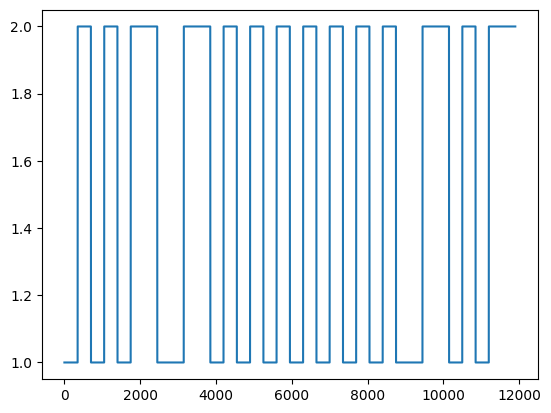

In [ ]:
test_inds, train_inds = test_train(lapID[:,],1,5,0) #last three arguments obtained form code below
#wLFPs, _, _ = helpers.whiten(hp_data, train_inds)

plt.plot(lapID[test_inds,1])

In [ ]:
# lapID array: 4 columns: 1- trial # (0-n); 2- which category(0, 1); 3- correct trial? (Na = incorrect; 1 for correct, 0 for na); 4- phase (1 for the position that have valid trials)
print(lapID[:,1])

[0. 0. 0. ... 0. 0. 0.]


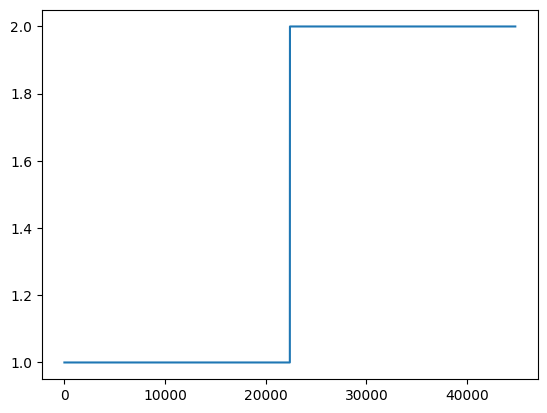

In [ ]:
plt.plot(lapID[train_inds, 1])

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.exceptions import NotFittedError
from sklearn.preprocessing import LabelEncoder


fs = 100
segment_length = int(3.5*fs)
X_train = hp_data[train_inds]
y_train = lapID[train_inds, 1].astype(int)
X_test = hp_data[test_inds]
y_test = lapID[test_inds, 1].astype(int)

# Encode the class labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)
# Ensure labels are encoded as integers if needed
y_train_encoded = y_train.astype(int)
y_test_encoded = y_test.astype(int)


### Optimizing hyperparameters

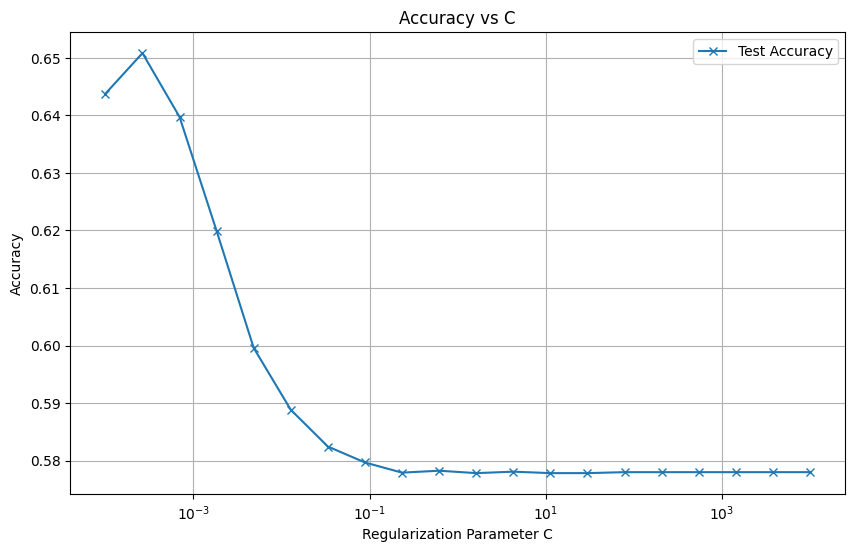

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler

# Normalize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define a range of C values (inverse of regularization strength)
C_values = np.logspace(-4, 4, 20)

# Lists to store accuracy values
train_accuracies = []
test_accuracies = []

# Train and evaluate the model for each C value
for C in C_values:
    model = LogisticRegression(C=C, penalty='l2', solver='liblinear', max_iter=1000)
    model.fit(X_train_scaled, y_train)

    train_accuracy = accuracy_score(y_train, model.predict(X_train_scaled))
    test_accuracy = accuracy_score(y_test, model.predict(X_test_scaled))

    train_accuracies.append(train_accuracy)
    test_accuracies.append(test_accuracy)

# Plot the accuracy as a function of C
plt.figure(figsize=(10, 6))
#plt.plot(C_values, train_accuracies, label='Train Accuracy', marker='o')
plt.plot(C_values, test_accuracies, label='Test Accuracy', marker='x')
plt.xscale('log')
plt.xlabel('Regularization Parameter C')
plt.ylabel('Accuracy')
plt.title('Accuracy vs C')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
best_c_index = np.argmax(test_accuracies)
best_c = C_values[best_c_index]
print(f"Best C value: {best_c}")


Best C value: 0.00026366508987303583


### Accuracy

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder


logistic_model = LogisticRegression(penalty='l2',max_iter=1000, C=0.00026366508987303583, solver='liblinear')
logistic_model.fit(X_train, y_train)

predictions_prob = logistic_model.predict_proba(X_test)
predicted_labels = logistic_model.predict(X_test)

accuracy = accuracy_score(y_test, predicted_labels)
print(f'Accuracy: {accuracy:.4f}')

num_segments = len(predictions_prob) // segment_length
predictions_reshaped = predictions_prob[:num_segments * segment_length].reshape((num_segments, segment_length, -1))
predictions_avg = predictions_reshaped.mean(axis=0)


Accuracy: 0.5756


In [ ]:
segment_length = 350

num_trials = len(predictions_prob) // segment_length
predictions_reshaped = predictions_prob[:num_trials * segment_length].reshape((num_trials, segment_length, -1))

trial_probabilities_multiply = np.prod(predictions_reshaped, axis=1)
trial_predictions_multiply = np.argmax(trial_probabilities_multiply, axis=1)

trial_probabilities_sum = np.sum(predictions_reshaped, axis=1)
trial_predictions_sum = np.argmax(trial_probabilities_sum, axis=1)

true_trial_labels = y_test[::segment_length] -1

trial_accuracy_multiply = accuracy_score(true_trial_labels, trial_predictions_multiply)
trial_accuracy_sum = accuracy_score(true_trial_labels, trial_predictions_sum)

print(f'Trial Accuracy (multiply): {trial_accuracy_multiply:.4f}')
print(f'Trial Accuracy (sum): {trial_accuracy_sum:.4f}')

Trial Accuracy (multiply): 0.5588
Trial Accuracy (sum): 0.5588


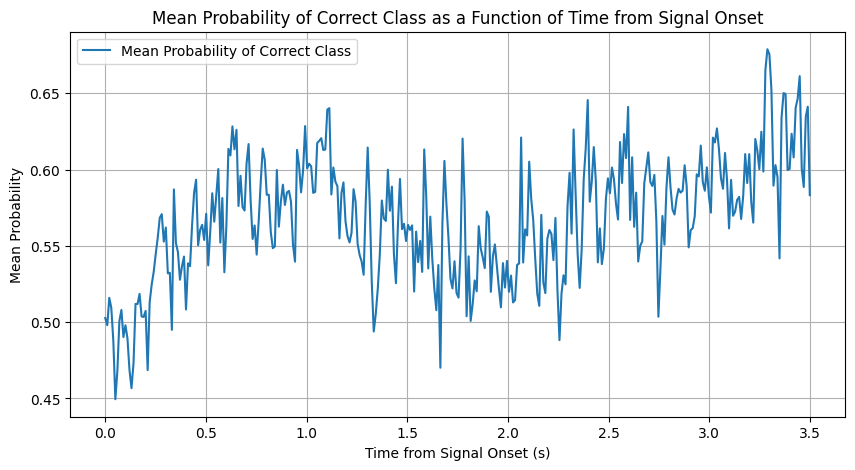

In [ ]:
time = np.linspace(0, segment_length / fs, segment_length)

# Get the number of unique classes
num_classes = predictions_prob.shape[1]

# Ensure y_test is properly encoded to start from 0
label_encoder = LabelEncoder()
y_test_encoded = label_encoder.fit_transform(y_test)

# Reshape and average probabilities for correct class over segments
correct_class_probabilities = []
for i in range(len(y_test_encoded)):
    correct_label = y_test_encoded[i]
    correct_class_probabilities.append(predictions_prob[i][correct_label])

correct_class_probabilities = np.array(correct_class_probabilities)
num_segments = len(correct_class_probabilities) // segment_length
probabilities_reshaped = correct_class_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))
logisticprobabilities_avg = probabilities_reshaped.mean(axis=0)

# Plot mean probabilities as a function of time
plt.figure(figsize=(10, 5))
plt.plot(time, logisticprobabilities_avg, label='Mean Probability of Correct Class')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Mean Probability')
plt.title('Mean Probability of Correct Class as a Function of Time from Signal Onset')
plt.legend()
plt.grid(True)
plt.show()

### Confidence plots


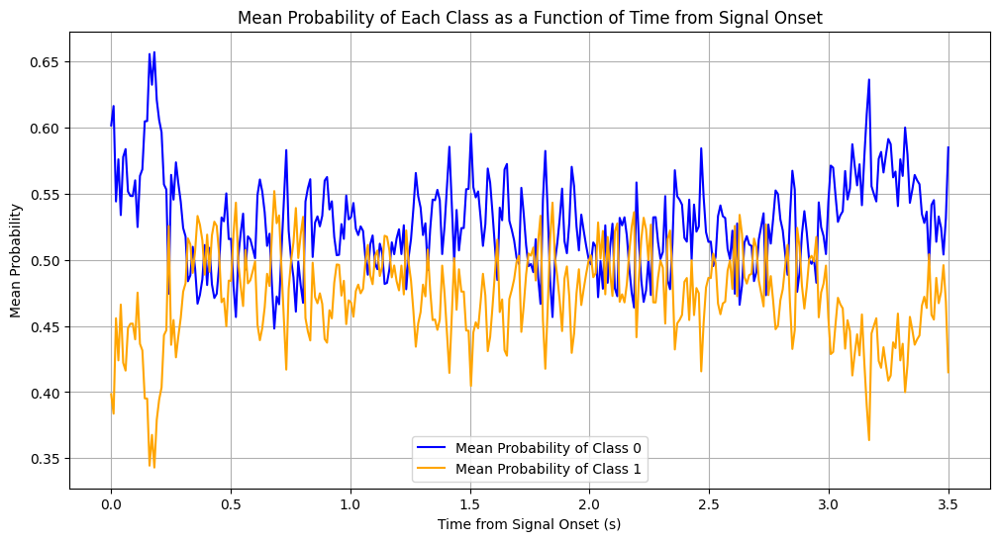

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define segment length based on the sampling frequency (fs)
segment_length = 350

# Extract probabilities for each class
class_0_probabilities = predictions_prob[:, 0]
class_1_probabilities = predictions_prob[:, 1]

# Compute mean probabilities over each segment
num_segments = len(class_0_probabilities) // segment_length
class_0_probabilities_reshaped = class_0_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))
class_1_probabilities_reshaped = class_1_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))

class_0_probabilities_avg = class_0_probabilities_reshaped.mean(axis=0)
class_1_probabilities_avg = class_1_probabilities_reshaped.mean(axis=0)

# Time array for plotting
time = np.linspace(0, segment_length / fs, segment_length)

# Plotting the mean probabilities for each class
plt.figure(figsize=(12, 6))
plt.plot(time, class_0_probabilities_avg, label='Mean Probability of Class 0', color='blue')
plt.plot(time, class_1_probabilities_avg, label='Mean Probability of Class 1', color='orange')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Mean Probability')
plt.title('Mean Probability of Each Class as a Function of Time from Signal Onset')
plt.legend()
plt.grid(True)
plt.show()


## 2Hz HP Filter


In [ ]:
#Hp 2Hz
hp_data = helpers.filter_data(cnt_data, 2, 100, filt_type='high', use_hilbert=True)
np.shape(hp_data)

(298458, 118)

## CSP

In [ ]:
from mne.decoding import CSP
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import scipy.io

# Select relevant data and labels
lapTrue = lapID[lapID[:, 2].astype(bool), :]
test_inds, train_inds = test_train(lapTrue, 1, n_folds=5, which_fold=0)
valid_hp_data = hp_data[lapID[:, 2].astype(bool)]

n_channels = valid_hp_data.shape[1]
n_times = 350
n_trials = valid_hp_data.shape[0] // n_times
fs=100

print(f"Calculated number of trials: {n_trials}")

# Reshape the data to (n_trials, n_channels, n_times)
eeg_data = valid_hp_data.reshape((n_trials, n_times, n_channels)).transpose(0, 2, 1)
eeg_data = np.abs(eeg_data)

print(f"Shape of eeg_data after reshaping: {eeg_data.shape}")

# Create labels
labels = lapTrue[:, 1][::n_times] - 1  # Adjust labels to be 0 and 1

# Filter train_inds and test_inds to be within n_trials
train_inds = np.where(train_inds[:: n_times])[0]
test_inds = np.where(test_inds[:: n_times])[0]

# Create train and test sets using the indices from test_train function
X_train = eeg_data[train_inds]
X_test = eeg_data[test_inds]
y_train = labels[train_inds]
y_test = labels[test_inds]

# Create a CSP object
csp = CSP(n_components=4, reg='ledoit_wolf', log=True, norm_trace=False)

# Create a pipeline with CSP and SVM
clf = make_pipeline(csp, SVC())

# Fit the model
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')


Calculated number of trials: 168
Shape of eeg_data after reshaping: (168, 118, 350)
Computing rank from data with rank=None
    Using tolerance 1.1e+04 (2.2e-16 eps * 118 dim * 4.1e+17  max singular value)
    Estimated rank (data): 118
    data: rank 118 computed from 118 data channels with 0 projectors
Reducing data rank from 118 -> 118
Estimating class=0.0 covariance using LEDOIT_WOLF
Done.
Estimating class=1.0 covariance using LEDOIT_WOLF
Done.
Accuracy: 0.79


Calculated number of trials: 168
Shape of eeg_data after reshaping: (168, 118, 350)
Computing rank from data with rank=None
    Using tolerance 3.4e+03 (2.2e-16 eps * 118 dim * 1.3e+17  max singular value)
    Estimated rank (data): 118
    data: rank 118 computed from 118 data channels with 0 projectors
Reducing data rank from 118 -> 118
Estimating class=0.0 covariance using LEDOIT_WOLF
Done.
Estimating class=1.0 covariance using LEDOIT_WOLF
Done.
Computing rank from data with rank=None
    Using tolerance 3.4e+03 (2.2e-16 eps * 118 dim * 1.3e+17  max singular value)
    Estimated rank (data): 118
    data: rank 118 computed from 118 data channels with 0 projectors
Reducing data rank from 118 -> 118
Estimating class=0.0 covariance using LEDOIT_WOLF
Done.
Estimating class=1.0 covariance using LEDOIT_WOLF
Done.
Computing rank from data with rank=None
    Using tolerance 3.4e+03 (2.2e-16 eps * 118 dim * 1.3e+17  max singular value)
    Estimated rank (data): 118
    data: rank 118 comput

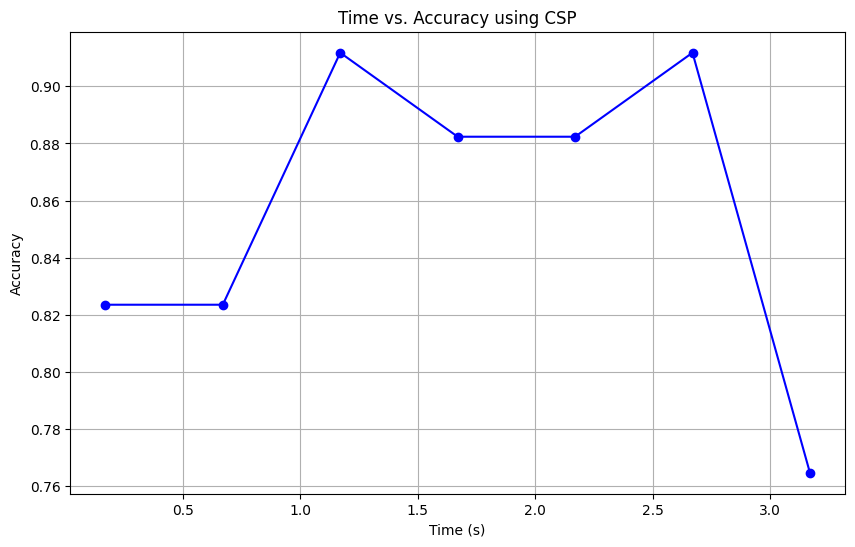

In [ ]:
from mne.decoding import CSP
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np

# Parameters
window_size = len(test_inds)  # Size of the time window in samples
step_size = 50     # Step size for the sliding window in samples
n_components = 4   # Number of CSP components
fs = 100           # Sampling frequency

# Function to compute accuracy over time
def compute_accuracy_over_time(eeg_data, labels, train_inds, test_inds, window_size, step_size, n_components, fs):
    accuracies = []
    times = []

    for start in range(0, eeg_data.shape[2] - window_size + 1, step_size):
        end = start + window_size
        X_window = eeg_data[:, :, start:end]

        # Create a CSP object
        csp = CSP(n_components=n_components, reg='ledoit_wolf', log=True, norm_trace=False)

        # Create a pipeline with CSP and SVM
        clf = make_pipeline(csp, SVC())

        # Split data into train and test sets
        X_train = X_window[train_inds]
        X_test = X_window[test_inds]
        y_train = labels[train_inds]
        y_test = labels[test_inds]

        # Fit the model
        clf.fit(X_train, y_train)

        # Predict on the test set
        y_pred = clf.predict(X_test)

        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred)
        accuracies.append(accuracy)

        # Time corresponding to the middle of the window
        times.append((start + end) / 2 / fs)

    return times, accuracies

# Select relevant data and labels
lapTrue = lapID[lapID[:, 2].astype(bool), :]
test_inds, train_inds = test_train(lapTrue, 1, n_folds=5, which_fold=0)
valid_hp_data = hp_data[lapID[:, 2].astype(bool)]

n_channels = valid_hp_data.shape[1]
n_times = 350
n_trials = valid_hp_data.shape[0] // n_times

print(f"Calculated number of trials: {n_trials}")

# Reshape the data to (n_trials, n_channels, n_times)
eeg_data = valid_hp_data.reshape((n_trials, n_times, n_channels)).transpose(0, 2, 1)
eeg_data = np.abs(eeg_data)

print(f"Shape of eeg_data after reshaping: {eeg_data.shape}")

# Create labels
labels = lapTrue[:, 1][::n_times] - 1  # Adjust labels to be 0 and 1

# Filter train_inds and test_inds to be within n_trials
train_inds = np.where(train_inds[::n_times])[0]
test_inds = np.where(test_inds[::n_times])[0]

# Compute accuracy over time
times, CSPaccuracies = compute_accuracy_over_time(eeg_data, labels, train_inds, test_inds, window_size, step_size, n_components, fs)

# Plot time vs. accuracy
plt.figure(figsize=(10, 6))
plt.plot(times, CSPaccuracies, 'bo-')
plt.xlabel('Time (s)')
plt.ylabel('Accuracy')
plt.title('Time vs. Accuracy using CSP')
plt.grid(True)
plt.show()


###Power spectra

In [ ]:
# Transform the data using the trained CSP
transformed_X_train = csp.transform(X_train)
transformed_X_test = csp.transform(X_test)

# Separate the transformed data by category
cat_0_train = transformed_X_train[y_train == 0]
cat_1_train = transformed_X_train[y_train == 1]
cat_0_test = transformed_X_test[y_test == 0]
cat_1_test = transformed_X_test[y_test == 1]

/usr/local/lib/python3.10/dist-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 100 is greater than input length  = 4, using nperseg = 4
  warnings.warn('nperseg = {0:d} is greater than input length '


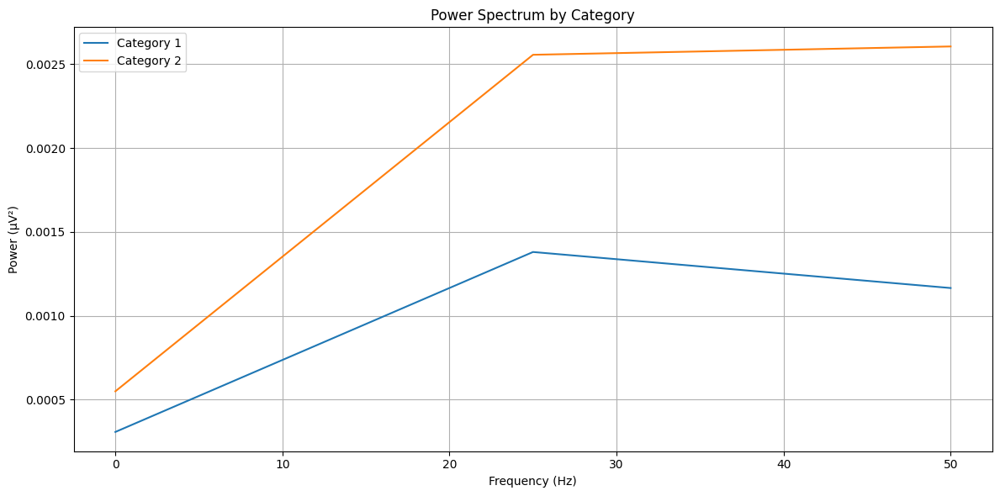

In [ ]:
from scipy.signal import welch
# Function to compute power spectrum
def compute_power_spectrum(data, fs):
    power_spectra = []
    for trial in data:
        f, Pxx = welch(trial, fs, nperseg=fs)
        power_spectra.append(Pxx)
    mean_power_spectrum = np.mean(power_spectra, axis=0)
    return f, mean_power_spectrum
f_cat_0, power_spectrum_cat_0 = compute_power_spectrum(transformed_X_train[y_train == 0], fs)
f_cat_1, power_spectrum_cat_1 = compute_power_spectrum(transformed_X_train[y_train == 1], fs)

# Plot the power spectrum for each category
plt.figure(figsize=(12, 6))

plt.plot(f_cat_0, power_spectrum_cat_0, label='Category 1')
plt.plot(f_cat_1, power_spectrum_cat_1, label='Category 2')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (µV²)')
plt.title('Power Spectrum by Category')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

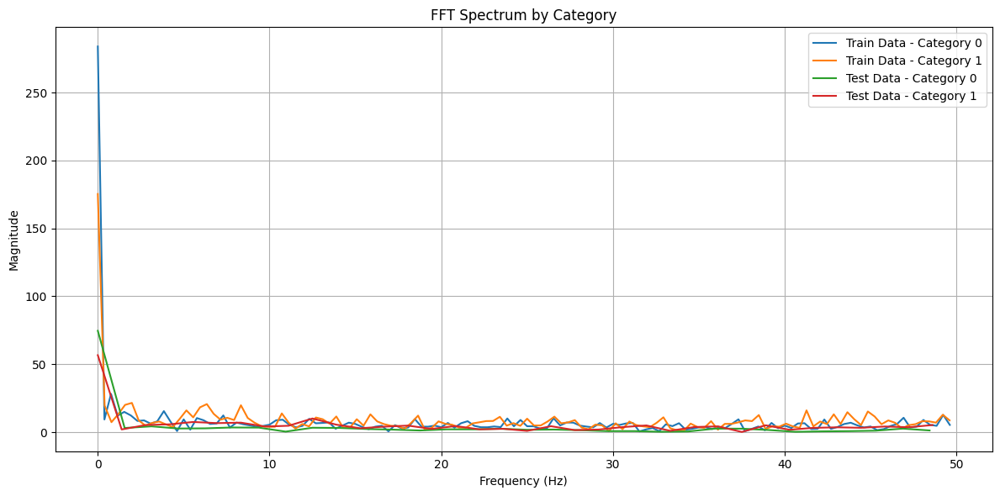

In [ ]:
def compute_fft(eeg_data, fs):
    fft_data = np.fft.fft(eeg_data)
    frequencies = np.fft.fftfreq(len(eeg_data), d=1/fs)
    positive_freq_mask = frequencies >= 0
    frequencies = frequencies[positive_freq_mask]
    fft_data = fft_data[positive_freq_mask]

    fft_magnitude = np.abs(fft_data)
    return frequencies, fft_magnitude

# compute fft for each category
freq_cat0_train, fft_mag_cat0_train = compute_fft(cat_0_train.flatten(), fs)
freq_cat1_train, fft_mag_cat1_train = compute_fft(cat_1_train.flatten(), fs)
freq_cat0_test, fft_mag_cat0_test = compute_fft(cat_0_test.flatten(), fs)
freq_cat1_test, fft_mag_cat1_test = compute_fft(cat_1_test.flatten(), fs)

# plotting FFT
plt.figure(figsize=(12, 6))

plt.plot(freq_cat0_train, fft_mag_cat0_train, label='Train Data - Category 0')
plt.plot(freq_cat1_train, fft_mag_cat1_train, label='Train Data - Category 1')
plt.plot(freq_cat0_test, fft_mag_cat0_test, label='Test Data - Category 0')
plt.plot(freq_cat1_test, fft_mag_cat1_test, label='Test Data - Category 1')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.title('FFT Spectrum by Category')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


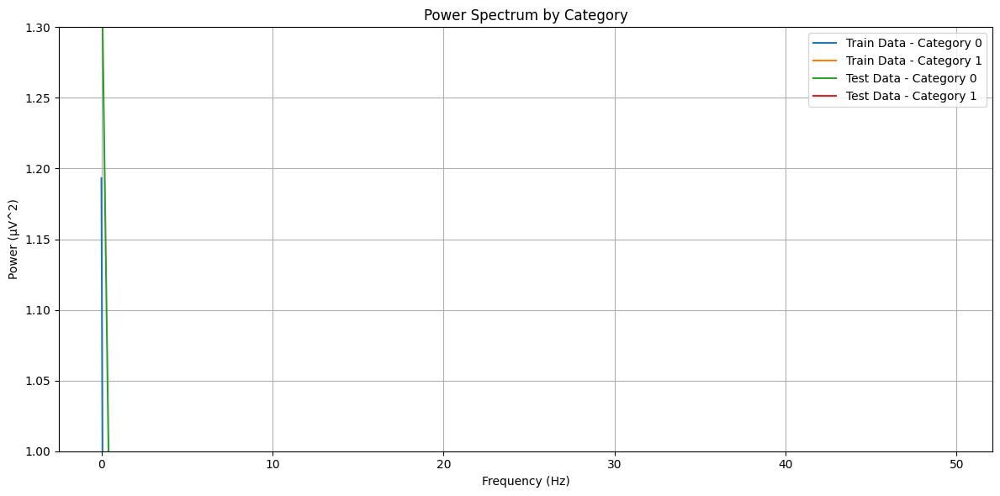

In [ ]:
def compute_power_spectrum(eeg_data, fs):
    N = len(eeg_data)
    xk = (1/N**2) * np.abs(np.fft.fft(eeg_data))**2  # Two-sided power spectrum
    xk = xk[:N//2+1]  # One-sided power spectrum
    xk[1:-1] = 2 * xk[1:-1]  # Double values except for DC and Nyquist

    freq = np.fft.fftfreq(N, d=1/fs)[:N//2+1]  # Frequency axis

    return freq, xk

# Compute power spectrum for each category
freq_cat0_train, power_spectrum_cat0_train = compute_power_spectrum(cat_0_train.flatten(), fs)
freq_cat1_train, power_spectrum_cat1_train = compute_power_spectrum(cat_1_train.flatten(), fs)
freq_cat0_test, power_spectrum_cat0_test = compute_power_spectrum(cat_0_test.flatten(), fs)
freq_cat1_test, power_spectrum_cat1_test = compute_power_spectrum(cat_1_test.flatten(), fs)

# Plot the power spectrum for each category
plt.figure(figsize=(12, 6))

plt.plot(freq_cat0_train[freq_cat0_train >= 0], power_spectrum_cat0_train[freq_cat0_train >= 0], label='Train Data - Category 0')
plt.plot(freq_cat1_train[freq_cat1_train >= 0], power_spectrum_cat1_train[freq_cat1_train >= 0], label='Train Data - Category 1')
plt.plot(freq_cat0_test[freq_cat0_test >= 0], power_spectrum_cat0_test[freq_cat0_test >= 0], label='Test Data - Category 0')
plt.plot(freq_cat1_test[freq_cat1_test >= 0], power_spectrum_cat1_test[freq_cat1_test >= 0], label='Test Data - Category 1')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (µV^2)')
plt.title('Power Spectrum by Category')
plt.legend()
plt.grid(True)
plt.ylim(1, 1.3)
plt.tight_layout()
plt.show()


Plotting CSP Component 1


<ipython-input-28-20291d91f283>:4: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=128).
  plt.specgram(data[i, :], Fs=fs, NFFT=256, noverlap=128, cmap='jet')


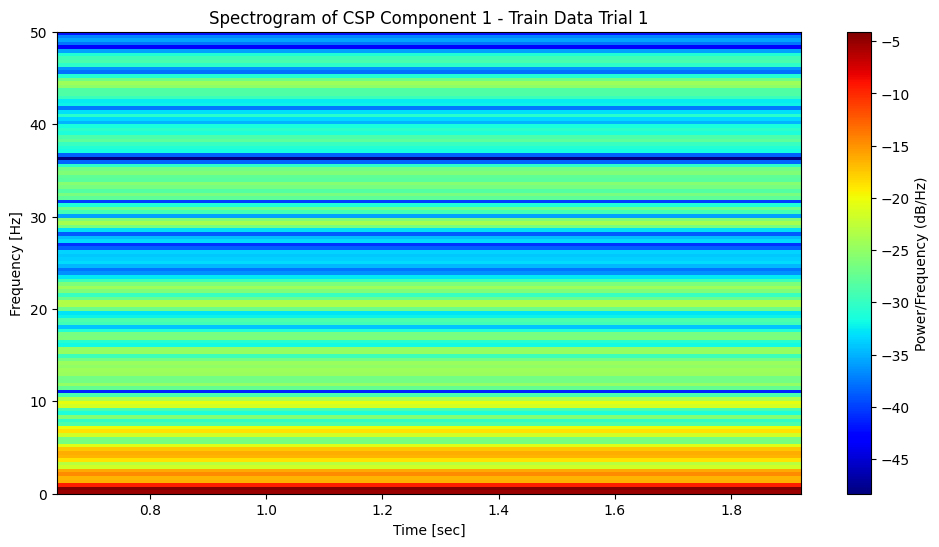

<ipython-input-28-20291d91f283>:4: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=34).
  plt.specgram(data[i, :], Fs=fs, NFFT=256, noverlap=128, cmap='jet')


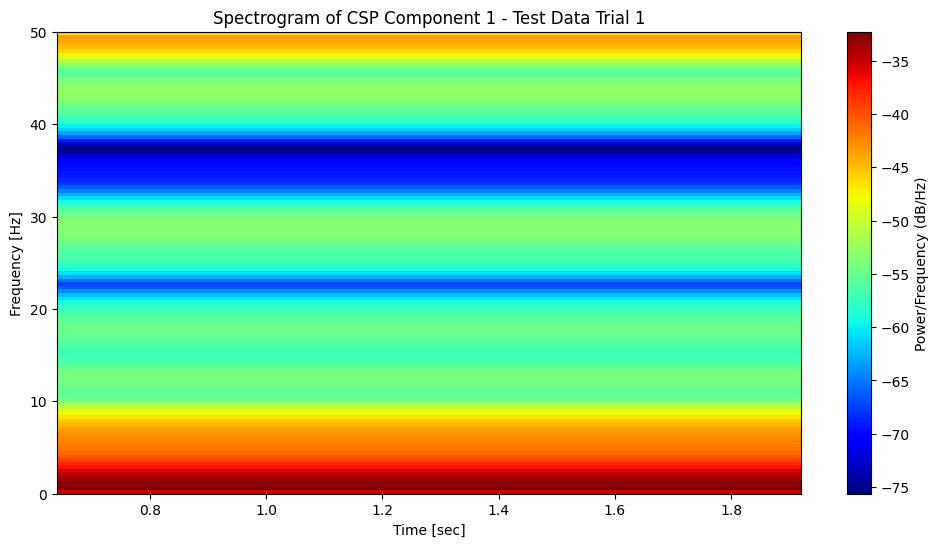

Plotting CSP Component 2


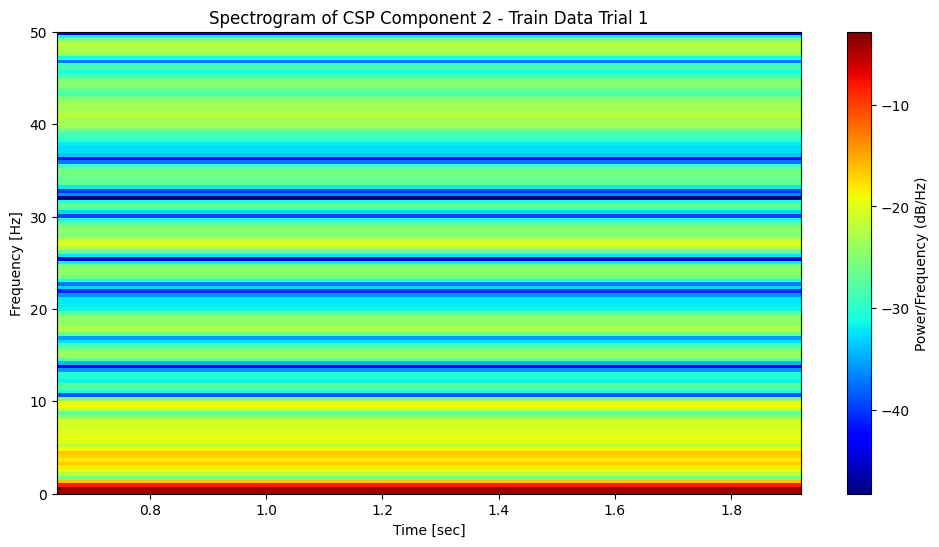

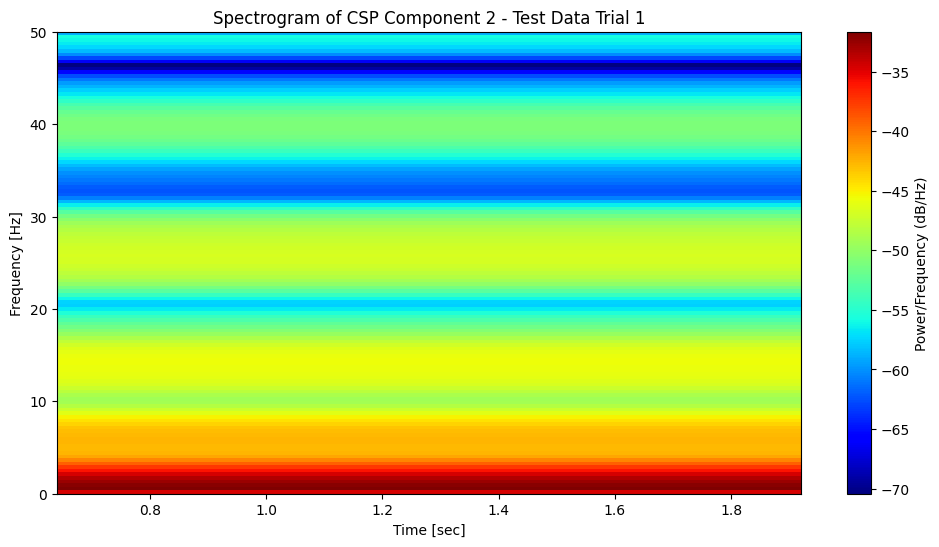

Plotting CSP Component 3


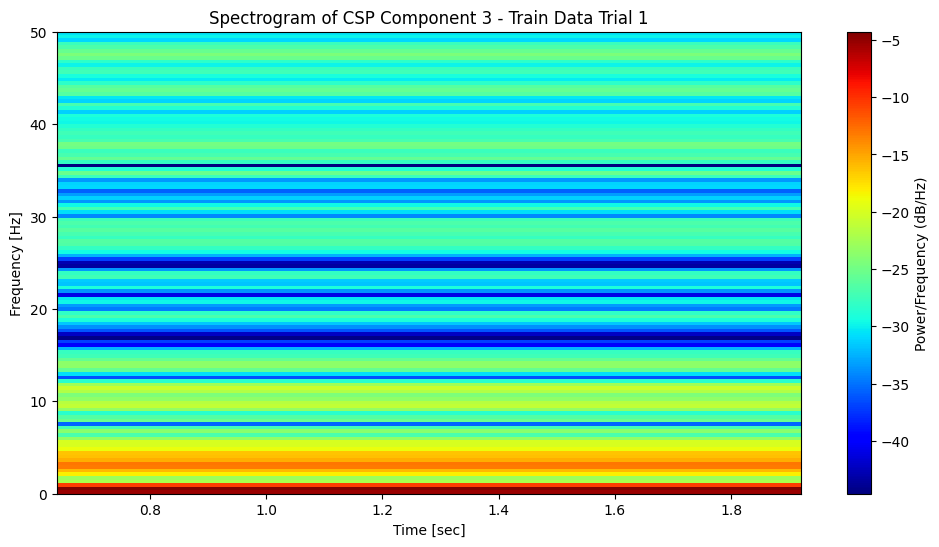

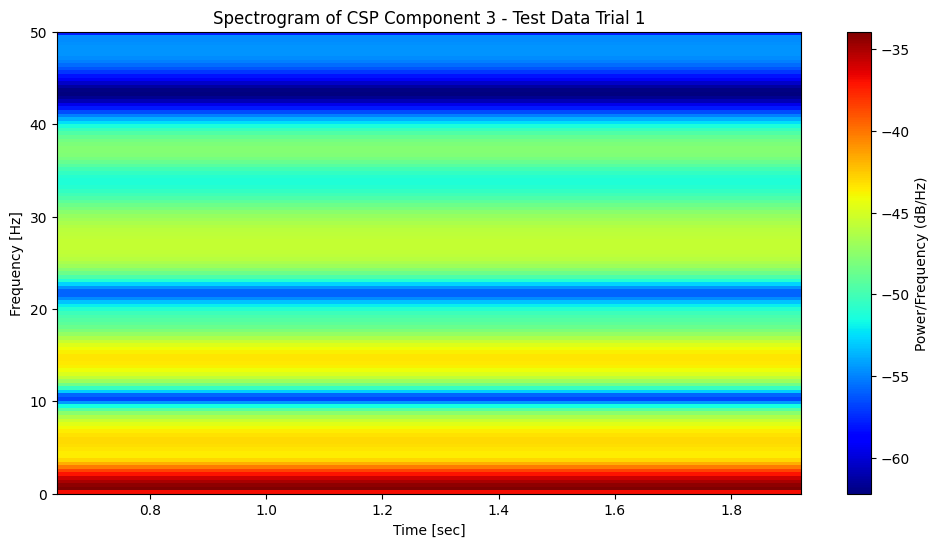

Plotting CSP Component 4


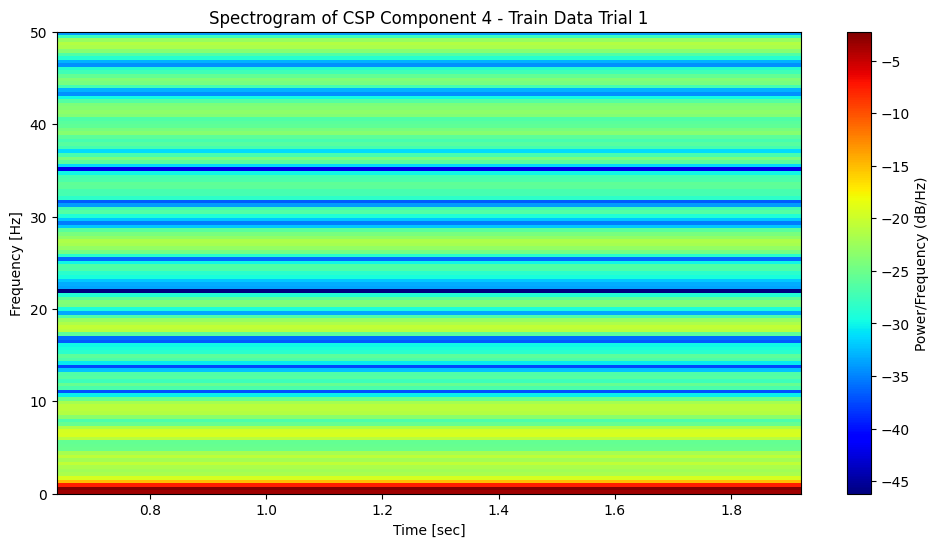

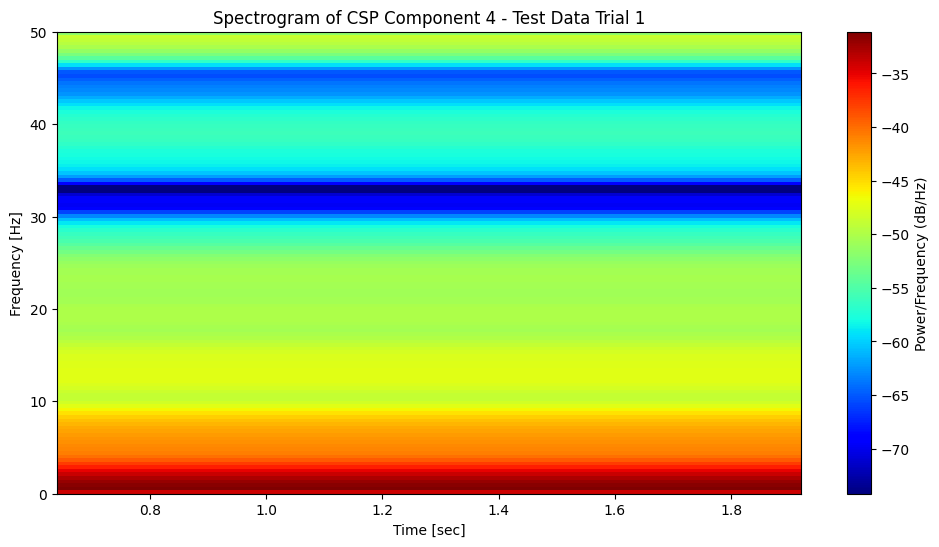

In [ ]:
def plot_spectrogram(data, fs, title):
    plt.figure(figsize=(12, 6))
    for i in range(data.shape[0]):
        plt.specgram(data[i, :], Fs=fs, NFFT=256, noverlap=128, cmap='jet')
        plt.ylabel('Frequency [Hz]')
        plt.xlabel('Time [sec]')
        plt.title(f'{title} Trial {i+1}')
        plt.colorbar(label='Power/Frequency (dB/Hz)')
        plt.show()

# Plotting the spectrogram for each CSP component
for i in range(4):
    print(f'Plotting CSP Component {i+1}')
    plot_spectrogram(transformed_X_train[:, i, np.newaxis].T, fs, f'Spectrogram of CSP Component {i+1} - Train Data')
    plot_spectrogram(transformed_X_test[:, i, np.newaxis].T, fs, f'Spectrogram of CSP Component {i+1} - Test Data')


In [ ]:
# Predictions on a per-sample basis
valid_samples = hp_data[lapID[:, 2].astype(bool)]
sample_labels = lapTrue[:, 1] - 1  # Adjust labels to be 0 and 1

# Calculate the correct number of samples
num_samples = valid_samples.shape[0] // n_times

# Reshape the data to (num_samples, n_channels, n_times)
eeg_samples = valid_samples.reshape((num_samples, n_times, n_channels)).transpose(0, 2, 1)

# Transform the data using the trained CSP
transformed_samples = np.array([csp.transform(epoch[np.newaxis, :, :])[0] for epoch in eeg_samples])

# Ensure the data is real
transformed_samples = np.abs(transformed_samples)

# Predict on the transformed samples
sample_predictions = clf.steps[-1][1].predict(transformed_samples)

# Calculate accuracy for per-sample predictions
sample_accuracy = accuracy_score(sample_labels[:num_samples], sample_predictions)
print(f'Per-sample accuracy: {sample_accuracy:.2f}')

Per-sample accuracy: 0.00



## Training and running TIMBRE

In [ ]:
from TIMBRE.TIMBRE import TIMBRE
np.shape(lapID[:,0])

(298458,)

In [ ]:
# from TIMBRE.TIMBRE import TIMBRE

# fig, axs = plt.subplots(4, 4, figsize=(20, 5))

# trial_phase = 1
# n_folds = 5
# which_fold = 0

# # lapID array: 4 columns: 1- trial # (0-n); 2- which category(0, 1); 3- correct trial? (Na = incorrect; 1 for correct, 0 for na); 4- phase (1 for the position that have valid trials)
# # 350 sample a block,
# # n by 4

# lapTrue = lapID[lapID[:,1].astype(bool),:]
# test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# wLFPs, _, _ = helpers.whiten(hp_data[lapID[:,2].astype(bool)], train_inds)

# #n_bins = 20
# #pos_binned = helpers.group_by_pos(lapID[:,1], n_bins, train_inds)
# #arm_and_pos_binned = lapID[:, 2] * n_bins + pos_binned
# accuracy=np.zeros(axs.shape[0])


# titles = ['Projection (real part)', 'Amplitude', 'Softmax 1', 'Softmax 2 (Output)']
# for i in range(axs.shape[0]):
#     print(f"Training network {i + 1} of {axs.shape[0]} (hidden layer size { 4* 2 ** i})")  # try 4 different hidden layer sizes
#     m, _, accuracy[i] = TIMBRE(wLFPs, lapTrue[:,1], test_inds, train_inds, hidden_nodes = 0)  # train network

#     # Print the shapes of each layer
#     print(f"Input layer shape: {m.input_shape}")
#     for layer in m.layers:
#         print(f"Layer {layer.name} shape: {layer.output_shape}")

#     # for j in range(axs.shape[1]):  # Loop through each layer
#     #     p = helpers.layer_output(wLFPs[test_inds], m, j)  # Calculate layer's response to input, using only test data
#     #     if j == 0:
#     #         p = p[:, :p.shape[1] // 2]  # just get real component for complex-valued output
#     #         axs[i, 0].set_ylabel(str(3 * 2 ** i) + ' features')
#     #     if i == 0:
#     #         axs[0, j].set_title((titles[j]))
#     #     axs[i, j].plot(helpers.accumarray(arm_and_pos_binned[test_inds], p))  # plot mean response of layer to test data as a function of position
#     #     axs[i, j].autoscale(enable=True, axis='both', tight=True)
#     #     if i < axs.shape[0] - 1:
#     #         axs[i, j].set_xticks([])
#     #     else:
#     #         axs[i, j].set_xlabel('Position')
# print(accuracy)

In [ ]:
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
wLFPs, u, Xv = helpers.whiten(hp_data[lapID[:,2].astype(bool)], train_inds)

# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Train the network
model, _, accuracy = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes= 0)
# Use the predict method on the returned model
predictions = model.predict(wLFPs_processed)

print(f"Input layer shape: {model.input_shape}")

for layer in model.layers:
    print(f"Layer {layer.name} shape: {layer.output_shape}")
print(accuracy)

Shape of wLFPs after processing: (58800, 236)
1838/1838 [==============================] - 3s 1ms/step
Input layer shape: (None, 236)
Layer complex_dense shape: (None, 4)
Layer lambda shape: (None, 2)
Layer activation shape: (None, 2)
Layer dense shape: (None, 2)
0.551764726638794


In [ ]:
pred_mean=np.mean(predictions,axis=0)
predictions_bin=predictions-pred_mean
predictions_bin=np.argmax(predictions_bin,axis=1)

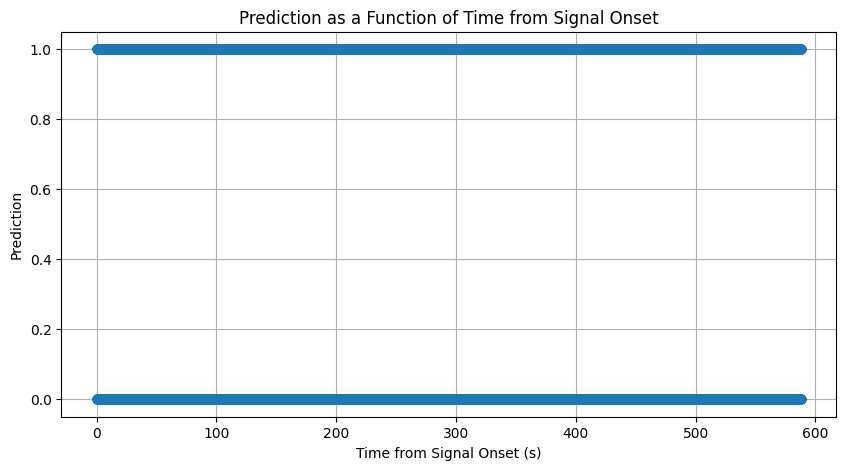

In [ ]:
fs = 100
pred_mean = np.mean(predictions, axis=0)
predictions_bin = predictions - pred_mean

# Find the class with the highest probability
predictions_bin = np.argmax(predictions_bin, axis=1)

# Create a time array matching the length of predictions_bin
time = np.linspace(0, len(predictions_bin) / fs, len(predictions_bin))
time= time.reshape(-2)


plt.figure(figsize=(10, 5))
plt.plot(time, predictions_bin, 'o')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Prediction')
plt.title('Prediction as a Function of Time from Signal Onset')
plt.grid(True)
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score
from keras.models import Model

n_times = 350
n_trials = len(predictions) // n_times

# second_last_layer_output = model.layers[-2].output
# second_last_layer_model = Model(inputs=model.input, outputs=second_last_layer_output)
# second_last_layer_predictions = second_last_layer_model.predict(wLFPs_processed)

weights, biases = model.layers[-1].get_weights()
pre_softmax_predictions = np.dot(predictions, weights) + biases

# Reshape into trials
predictions_reshaped = predictions.reshape((n_trials, n_times, 2))
pre_softmax_predictions_reshaped = pre_softmax_predictions.reshape((n_trials, n_times, 2)) # Ajust to the number of hidden node

def calculate_trial_predictions(predictions_reshaped, pre_softmax_predictions_reshaped, operation):
    if operation == "multiply_before_softmax":
        trial_probabilities = np.prod(pre_softmax_predictions_reshaped, axis=1)
    elif operation == "multiply_after_softmax":
        trial_probabilities = np.prod(predictions_reshaped, axis=1)
    elif operation == "add_before_softmax":
        trial_probabilities = np.sum(pre_softmax_predictions_reshaped, axis=1)
    elif operation == "add_after_softmax":
        trial_probabilities = np.sum(np.log10(predictions_reshaped), axis=1)

    trial_predictions = np.argmax(trial_probabilities, axis=1)
    return trial_predictions

true_trial_labels = lapTrue[:, 1][::n_times] - 1  # Adjust labels to be 0 and 1

operations = ["multiply_before_softmax", "multiply_after_softmax", "add_before_softmax", "add_after_softmax"]
accuracies = {}

for operation in operations:
    trial_predictions = calculate_trial_predictions(predictions_reshaped, pre_softmax_predictions_reshaped, operation)
    trial_accuracy = accuracy_score(true_trial_labels, trial_predictions)
    accuracies[operation] = trial_accuracy
    print(f'Trial Accuracy ({operation}): {trial_accuracy}')

1838/1838 [==============================] - 3s 1ms/step
Trial Accuracy (multiply_before_softmax): 0.47619047619047616
Trial Accuracy (multiply_after_softmax): 0.47619047619047616
Trial Accuracy (add_before_softmax): 0.8690476190476191
Trial Accuracy (add_after_softmax): 0.8690476190476191


###Optimizing learning rate

In [ ]:
pip install keras-tuner

In [ ]:
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
trial_phase = 1
n_folds = 5
which_fold = 0


lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")


def build_model(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds,  train_inds, hidden_nodes=8)

    learn_rate = hp.Choice('learning_rate', values=[1e-5, 1e-4, 1e-3, 1e-2, 1e-1])
    optimizer = Adam(learning_rate=learn_rate)

    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Define the tuner
tuner = kt.Hyperband(
    build_model,
    objective='val_accuracy',
    max_epochs=100,
    factor=3,
    directory='my_dir',
    project_name='intro_to_kt'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)

X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the search
tuner.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best hyperparameters
best_hp = tuner.get_best_hyperparameters()[0]
best_lr = best_hp.get('learning_rate')

print(f'Best learning rate: {best_lr}')

# Build the model with the best hyperparameters and train it
best_model = build_model(best_hp)
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


In [ ]:
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt

# Assumed variables and data
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Define model building function for initial search
values = np.random.shuffle([1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])

def build_model_initial(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values)
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Initial hyperparameter search
tuner_initial = kt.Hyperband(
    build_model_initial,
    objective='val_accuracy',
    max_epochs=50,  # Use a smaller number of epochs for initial search
    factor=3,
    directory='my_dir',
    project_name='initial_lr_search'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)
X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the initial search
tuner_initial.search(X_train, y_train, epochs=50, validation_data=(X_val, y_val))

# Get the best learning rate from the initial search
best_hp_initial = tuner_initial.get_best_hyperparameters()[0]
best_lr_initial = best_hp_initial.get('learning_rate')
print(f'Best learning rate from initial search: {best_lr_initial}')

# Define model building function for refined search
values = np.random.shuffle([best_lr_initial/5, best_lr_initial/10, best_lr_initial/2, best_lr_initial, best_lr_initial*10, best_lr_initial*2, best_lr_initial*5])

def build_model_refined(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values)
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Refined hyperparameter search
tuner_refined = kt.Hyperband(
    build_model_refined,
    objective='val_accuracy',
    max_epochs=100,  # Increase the number of epochs for refined search
    factor=3,
    directory='my_dir',
    project_name='refined_lr_search'
)

# Perform the refined search
tuner_refined.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best learning rate from the refined search
best_hp_refined = tuner_refined.get_best_hyperparameters()[0]
best_lr_refined = best_hp_refined.get('learning_rate')
print(f'Best learning rate from refined search: {best_lr_refined}')

# Visualize the learning rate vs. performance
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
plt.show()

# Build and train the final model with the best learning rate
def build_model_final():
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    optimizer = Adam(learning_rate=best_lr_refined)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

best_model = build_model_final()
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


In [ ]:
# Extract trials and their hyperparameters and metrics
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))

# Print learning rates and validation accuracies in the order they were evaluated
print("Learning Rate | Validation Accuracy")
print("-----------------------------------")
for trial in trials:
    lr = trial.hyperparameters.get('learning_rate')
    val_acc = trial.metrics.get_best_value('val_accuracy')
    print(f"{lr:.5e} | {val_acc:.5f}")

# Plot learning rate vs. validation accuracy with markers indicating the order
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-', label='Validation Accuracy')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
for i, txt in enumerate(range(len(lrs))):
    plt.annotate(txt, (lrs[i], val_accuracies[i]), textcoords="offset points", xytext=(0,10), ha='center')
plt.legend()
plt.show()


In [ ]:
import random
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt

# Assumed variables and data
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Define model building function for initial search
def build_model_initial(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values=[1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Initial hyperparameter search
tuner_initial = kt.Hyperband(
    build_model_initial,
    objective='val_accuracy',
    max_epochs=50,  # Use a smaller number of epochs for initial search
    factor=3,
    directory='my_dir',
    project_name='initial_lr_search'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)
X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the initial search
tuner_initial.search(X_train, y_train, epochs=50, validation_data=(X_val, y_val))

# Get the best learning rate from the initial search
best_hp_initial = tuner_initial.get_best_hyperparameters()[0]
best_lr_initial = best_hp_initial.get('learning_rate')
print(f'Best learning rate from initial search: {best_lr_initial}')

# Define a list of learning rates for the refined search and shuffle it
learning_rates = [best_lr_initial/5, best_lr_initial/10, best_lr_initial/2, best_lr_initial, best_lr_initial*10, best_lr_initial*2, best_lr_initial*5]
random.shuffle(learning_rates)

# Define model building function for refined search with shuffled learning rates
def build_model_refined(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values=learning_rates)
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Custom search function to shuffle the trials
class ShuffledHyperband(kt.Hyperband):
    def run_trial(self, trial, *args, **kwargs):
        random.shuffle(trial.hyperparameters.space['learning_rate'].values)
        super(ShuffledHyperband, self).run_trial(trial, *args, **kwargs)

# Refined hyperparameter search with shuffled trials
tuner_refined = ShuffledHyperband(
    build_model_refined,
    objective='val_accuracy',
    max_epochs=100,  # Increase the number of epochs for refined search
    factor=3,
    directory='my_dir',
    project_name='refined_lr_search'
)

# Perform the refined search
tuner_refined.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best learning rate from the refined search
best_hp_refined = tuner_refined.get_best_hyperparameters()[0]
best_lr_refined = best_hp_refined.get('learning_rate')
print(f'Best learning rate from refined search: {best_lr_refined}')

# Visualize the learning rate vs. performance
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
plt.show()

# Build and train the final model with the best learning rate
def build_model_final():
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    optimizer = Adam(learning_rate=best_lr_refined)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

best_model = build_model_final()
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


In [ ]:
import random
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt

# Assumed variables and data
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Define model building function for initial search
def build_model_initial(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values=[1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Initial hyperparameter search
tuner_initial = kt.Hyperband(
    build_model_initial,
    objective='val_accuracy',
    max_epochs=50,  # Use a smaller number of epochs for initial search
    factor=3,
    directory='my_dir',
    project_name='initial_lr_search'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)
X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the initial search
tuner_initial.search(X_train, y_train, epochs=50, validation_data=(X_val, y_val))

# Get the best learning rate from the initial search
best_hp_initial = tuner_initial.get_best_hyperparameters()[0]
best_lr_initial = best_hp_initial.get('learning_rate')
print(f'Best learning rate from initial search: {best_lr_initial}')

# Define a list of learning rates for the refined search and shuffle it
learning_rates = [best_lr_initial/5, best_lr_initial/10, best_lr_initial/2, best_lr_initial, best_lr_initial*10, best_lr_initial*2, best_lr_initial*5]
random.shuffle(learning_rates)

# Define model building function for refined search
class RefinedHyperModel(kt.HyperModel):
    def __init__(self, learning_rates):
        self.learning_rates = learning_rates
        random.shuffle(self.learning_rates)

    def build(self, hp):
        model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
        learning_rate = hp.Choice('learning_rate', values=self.learning_rates)
        optimizer = Adam(learning_rate=learning_rate)
        model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
        return model

# Refined hyperparameter search
tuner_refined = kt.Hyperband(
    RefinedHyperModel(learning_rates),
    objective='val_accuracy',
    max_epochs=100,  # Increase the number of epochs for refined search
    factor=3,
    directory='my_dir',
    project_name='refined_lr_search'
)

# Perform the refined search
tuner_refined.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best learning rate from the refined search
best_hp_refined = tuner_refined.get_best_hyperparameters()[0]
best_lr_refined = best_hp_refined.get('learning_rate')
print(f'Best learning rate from refined search: {best_lr_refined}')

# Visualize the learning rate vs. performance
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
plt.show()

# Build and train the final model with the best learning rate
def build_model_final():
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    optimizer = Adam(learning_rate=best_lr_refined)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

best_model = build_model_final()
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


### Power Spectrum

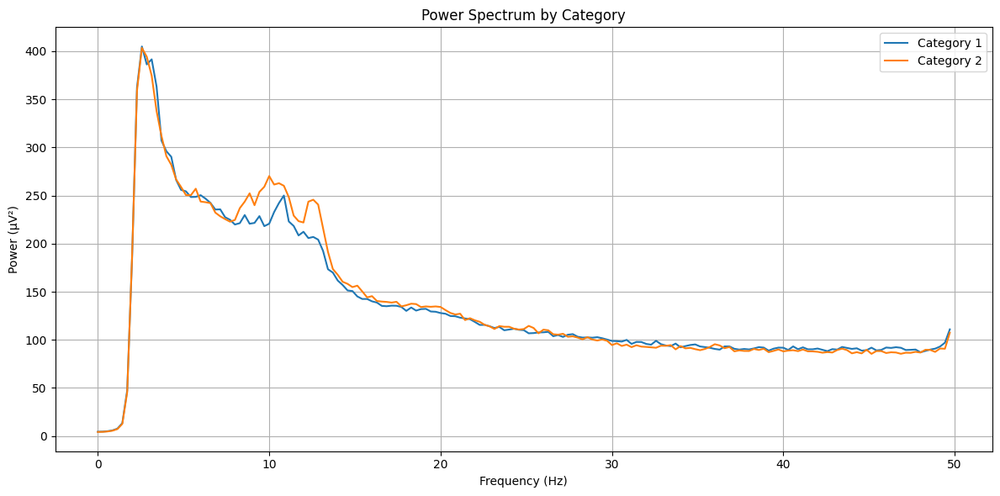

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

fs = 100
segment_length = 350

# Get EEG data for each category
category_1_indices = lapTrue[:, 1] == 1
category_2_indices = lapTrue[:, 1] == 2

eeg_data_cat1 = wLFPs_processed[category_1_indices]
eeg_data_cat2 = wLFPs_processed[category_2_indices]

# Function to compute power spectrum for segments
def compute_power_spectrum(eeg_data, fs, segment_length):
    num_segments = eeg_data.shape[0] // segment_length
    power_spectra = []

    for i in range(num_segments):
        segment = eeg_data[i*segment_length:(i+1)*segment_length, :]
        fft_data = np.fft.fft(segment, axis=0)
        frequencies = np.fft.fftfreq(segment_length, d=1/fs)

        # Take only the first half frequencies
        half_frequencies = frequencies[:len(frequencies)//2]
        fft_data = fft_data[:len(frequencies)//2, :]

        # Compute the power spectrum
        power_spectrum = np.abs(fft_data)**2
        power_spectra.append(np.mean(power_spectrum, axis=1))

    # Average the power spectra across segments
    mean_power_spectrum = np.mean(power_spectra, axis=0)

    return half_frequencies, mean_power_spectrum

# Compute power spectrum for each category
freq_cat1, power_spectrum_cat1 = compute_power_spectrum(eeg_data_cat1, fs, segment_length)
freq_cat2, power_spectrum_cat2 = compute_power_spectrum(eeg_data_cat2, fs, segment_length)

# Plot the power spectrum for each category
plt.figure(figsize=(12, 6))

plt.plot(freq_cat1, power_spectrum_cat1, label='Category 1')
plt.plot(freq_cat2, power_spectrum_cat2, label='Category 2')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (µV²)')
plt.title('Power Spectrum by Category')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


### Accuracy v. time plot


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model

# Define parameters for data processing and model
trial_phase = 1
n_folds = 5
which_fold = 0
fs = 100  # Example sampling frequency in Hz

# Filter out rows where lapID[:, 2] is 0 (invalid samples)
lapTrue = lapID[lapID[:, 2].astype(bool), :]

# Get test and train indices
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)

# Process wLFPs to match expected input shape (concatenate real and imaginary parts)
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Print the shape of the processed data
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Function to calculate average accuracy over time for given hidden nodes
def train_nn(hidden_nodes):
    # Train the network using the TIMBRE function
    model, _, train_accuracy = TIMBRE(wLFPs, lapTrue[:, 1] - 1, test_inds, train_inds, hidden_nodes=hidden_nodes, learn_rate=0.0001)

    # Predict on the test set
    predictions = np.argmax(model.predict(wLFPs_processed[test_inds]), axis=1)  # Predictions for the test set

    # Extract true labels for the test set
    true_labels = lapTrue[test_inds, 1] - 1  # Adjusting labels to match zero-based indexing if necessary

    # Compute accuracy per time point
    accuracy_per_time_point = predictions == true_labels  # Boolean array of True/False

    running_sum = np.zeros(350)
    max_trial_index = int(np.max(lapTrue[:, 0]))
    lapTrue_test = lapTrue[test_inds]

    for i in range(max_trial_index):
        inds = (lapTrue_test[:, 0] == i) & (lapTrue_test[:, 2] == 1)

        if np.sum(inds) > 0:
            trial_data = accuracy_per_time_point[inds]

        running_sum += trial_data

    average_accuracy_by_time = running_sum / max_trial_index

    return average_accuracy_by_time

Shape of wLFPs after processing: (58800, 236)


In [ ]:
# Train TIMBRE on different hidden nodes
hidden_node_sizes = [8]
average_accuracies = {}

for hn in hidden_node_sizes:
    print(f"Training TIMBRE for hidden_nodes={hn}")
    average_accuracies[hn] = train_nn(hn)

Training TIMBRE for hidden_nodes=8
372/372 [==============================] - 1s 1ms/step


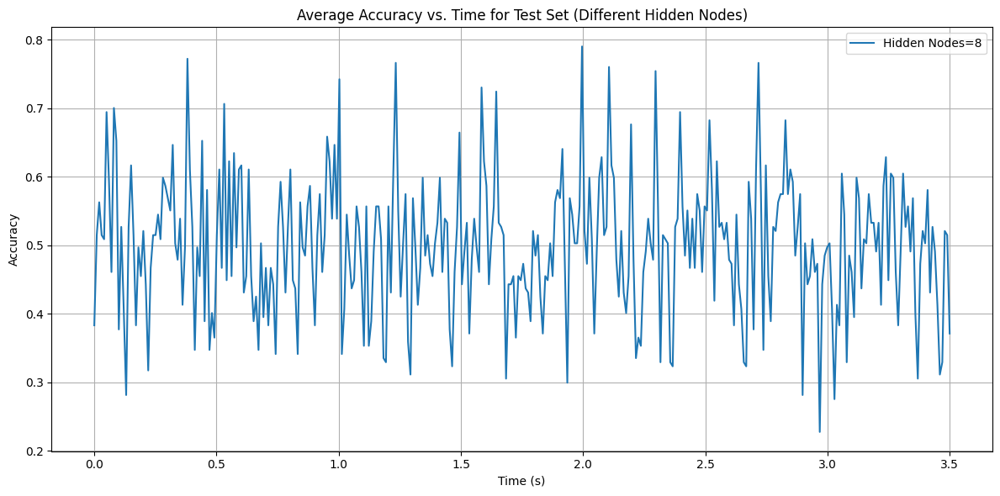

Overall accuracy for hidden nodes=8: 0.50


In [ ]:
# Create a time array for plotting
time_points = np.linspace(0, 350 / fs, 350)

# Plot the averaged accuracy over time for different hidden node sizes
plt.figure(figsize=(12, 6))
# plt.plot(time, logistic_probs, label='Logistic Model', linewidth=2, linestyle='--')

for hn in hidden_node_sizes:
  plt.plot(time_points, average_accuracies[hn], label=f'Hidden Nodes={hn}')

plt.xlabel('Time (s)')
plt.ylabel('Accuracy')
plt.title('Average Accuracy vs. Time for Test Set (Different Hidden Nodes)')
plt.grid(True)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

# Calculate and print the overall accuracy for the test set (example for one hidden node size)
#overall_accuracy_2 = np.mean(average_accuracies[2])
#overall_accuracy_4 = np.mean(average_accuracies[4])
overall_accuracy_8 = np.mean(average_accuracies[8])
#print(f"Overall accuracy for hidden nodes=2: {overall_accuracy_2:.2f}")
#print(f"Overall accuracy for hidden nodes=4: {overall_accuracy_4:.2f}")
print(f"Overall accuracy for hidden nodes=8: {overall_accuracy_8:.2f}")
#print(f"Logistic model: {np.mean(logistic_probs):.4f}")



### Confidence plots

372/372 [==============================] - 1s 1ms/step


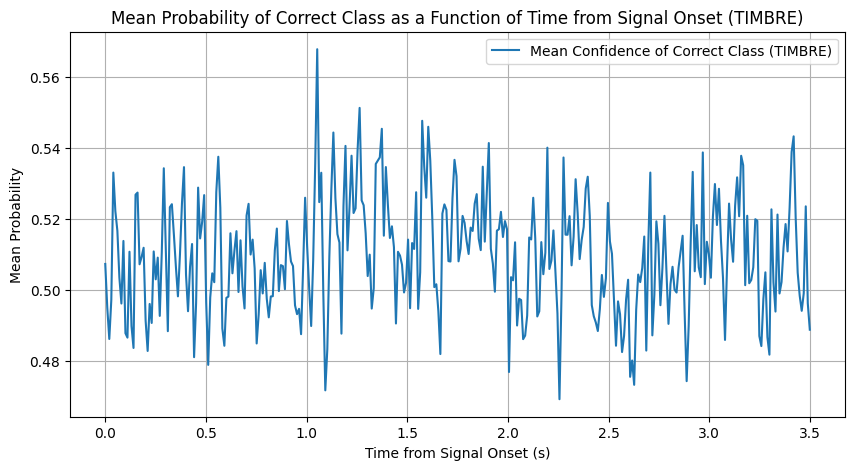

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Train the TIMBRE model

model, _, train_accuracy = TIMBRE(wLFPs, lapTrue[:, 1] - 1, test_inds, train_inds, hidden_nodes=2, learn_rate=1e-4)

correct_label = (lapTrue[test_inds, 1] - 1).astype(int)

# Predict probabilities for the test set
predictions_prob = model.predict(wLFPs_processed[test_inds])

# Extract the confidence levels for the correct class
correct_class_probabilities = []
for i in range(len(wLFPs_processed[test_inds])):
    correct_class_probabilities.append(predictions_prob[i][correct_label[i]])

correct_class_probabilities = np.array(correct_class_probabilities)

# Compute mean probabilities over each segment
segment_length = int(350)
num_segments = len(correct_class_probabilities) // segment_length
probabilities_reshaped = correct_class_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))
TIMBREprobabilities_avg = probabilities_reshaped.mean(axis=0)

# Time array for plotting
time = np.linspace(0, segment_length / fs, segment_length)
time = time.reshape(-1)

# Plotting the mean probabilities of the correct class for the TIMBRE model
plt.figure(figsize=(10, 5))
plt.plot(time, TIMBREprobabilities_avg, label='Mean Confidence of Correct Class (TIMBRE)')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Mean Probability')
plt.title('Mean Probability of Correct Class as a Function of Time from Signal Onset (TIMBRE)')
plt.legend()
plt.grid(True)
plt.show()


### Power plot for hidden node


In [ ]:
#run confidence plots first!
hidden_layer_model = Model(inputs=model.input, outputs=model.layers[0].output)
hidden_layer_activations = hidden_layer_model.predict(wLFPs_processed[test_inds])
correct_label = (lapTrue[test_inds, 1] - 1).astype(int)

372/372 [==============================] - 1s 1ms/step


In [ ]:
hidden_activations_cat1 = [hidden_layer_activations[correct_label == 0, i] for i in range(2)]
hidden_activations_cat2 = [hidden_layer_activations[correct_label == 1, i] for i in range(2)]

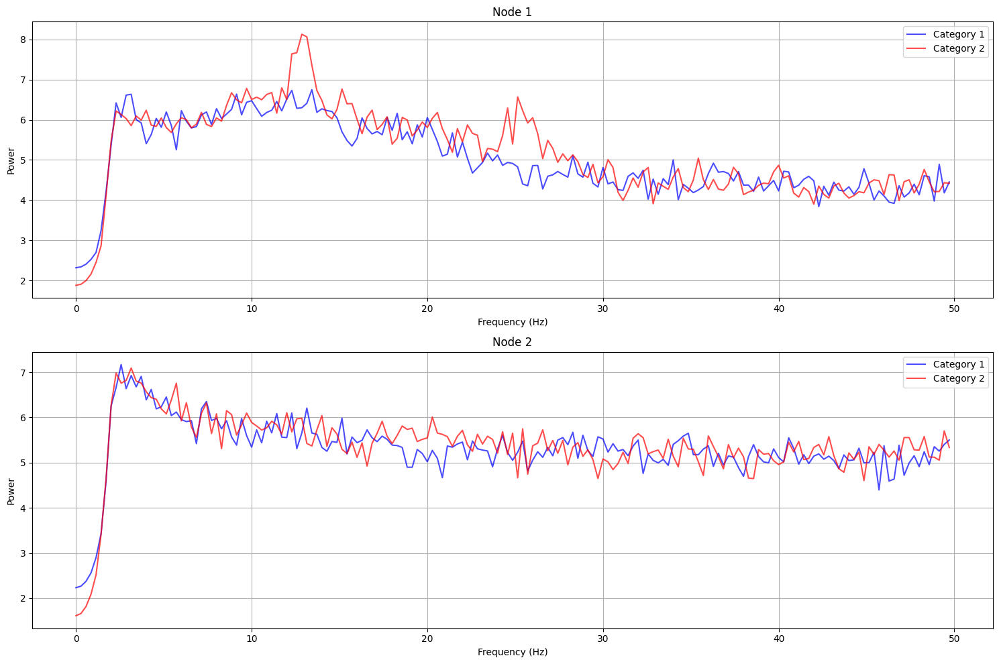

In [ ]:
def compute_power_spectrum(activations, fs, segment_length):
    num_segments = len(activations) // segment_length
    power_spectra = []

    for i in range(num_segments):
        segment = activations[i * segment_length:(i + 1) * segment_length]
        fft_data = np.fft.fft(segment)
        frequencies = np.fft.fftfreq(segment_length, d=1 / fs)

        # Take only the first half frequencies
        half_frequencies = frequencies[:len(frequencies) // 2]
        fft_data = fft_data[:len(frequencies) // 2]

        # Compute the power spectrum
        power_spectrum = np.abs(fft_data) ** 2
        power_spectra.append(power_spectrum)

    # Average the power spectra across segments
    mean_power_spectrum = np.mean(power_spectra, axis=0)

    return half_frequencies, mean_power_spectrum

fs = 100
segment_length = 350

# Compute power spectrum for each hidden node
freq_hidden_nodes_cat1 = []
power_spectrum_hidden_nodes_cat1 = []
freq_hidden_nodes_cat2 = []
power_spectrum_hidden_nodes_cat2 = []


# Function to plot power spectrum for all hidden nodes
def plot_all_power_spectra(frequencies_list_cat1, power_spectrum_list_cat1, frequencies_list_cat2, power_spectrum_list_cat2, num_nodes):
    fig, axes = plt.subplots(num_nodes // 1, 1, figsize=(15, 10))  # Adjust grid size to fit all nodes
    axes = axes.flatten()

    for i in range(num_nodes):
        power_spectrum_cat1 = np.log(power_spectrum_list_cat1[i])
        power_spectrum_cat2 = np.log(power_spectrum_list_cat2[i])

        axes[i].plot(frequencies_list_cat1[i], power_spectrum_cat1, label='Category 1', color='b', alpha=0.7)
        axes[i].plot(frequencies_list_cat2[i], power_spectrum_cat2, label='Category 2', color='r', alpha=0.7)
        axes[i].set_xlabel('Frequency (Hz)')
        axes[i].set_ylabel('Power')
        axes[i].set_title(f'Node {i + 1}')
        axes[i].legend()
        axes[i].grid(True)

    plt.tight_layout()
    plt.show()

# Compute power spectrum for each hidden node
fs = 100
segment_length = 350
hidden_nodes = 2

freq_hidden_nodes_cat1 = []
power_spectrum_hidden_nodes_cat1 = []
freq_hidden_nodes_cat2 = []
power_spectrum_hidden_nodes_cat2 = []

for i in range(hidden_nodes):
    freq_cat1, power_spectrum_cat1 = compute_power_spectrum(hidden_activations_cat1[i], fs, segment_length)
    freq_cat2, power_spectrum_cat2 = compute_power_spectrum(hidden_activations_cat2[i], fs, segment_length)

    freq_hidden_nodes_cat1.append(freq_cat1)
    power_spectrum_hidden_nodes_cat1.append(power_spectrum_cat1)
    freq_hidden_nodes_cat2.append(freq_cat2)
    power_spectrum_hidden_nodes_cat2.append(power_spectrum_cat2)

# Plot all power spectra
plot_all_power_spectra(freq_hidden_nodes_cat1, power_spectrum_hidden_nodes_cat1, freq_hidden_nodes_cat2, power_spectrum_hidden_nodes_cat2, hidden_nodes)


## Anatomical maps

In [ ]:
#positions
info = al['nfo']
x_positions = info['xpos']
x_positions=np.array(x_positions)
X_POS=x_positions.reshape(-3)

y_positions= info['ypos']
y_positions=np.array(y_positions)
Y_POS=y_positions.reshape(-3)

[90 22 74 52 45 23 56 50 44 43]


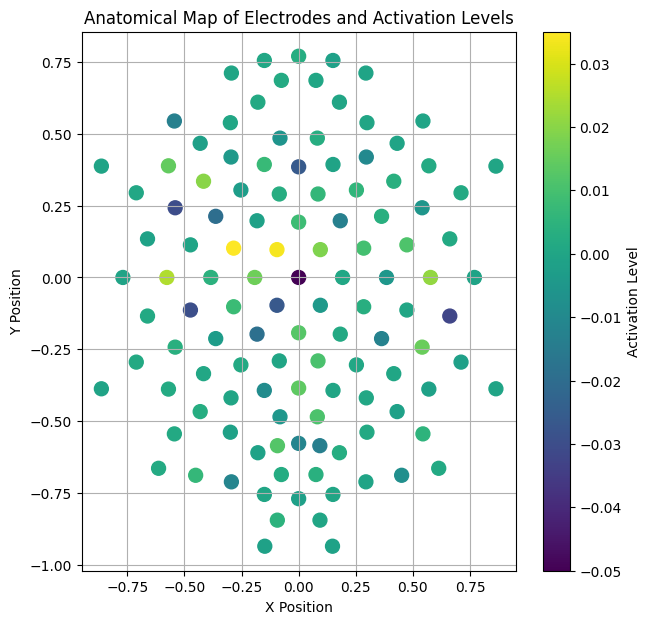

In [ ]:
#Linear model Activation map
activation_levels = logistic_model.coef_[0]
activation_levels = np.array(activation_levels)
top_10_channels = np.argsort(activation_levels)[-10:]
print(top_10_channels)

# Create a scatter plot of the electrode positions
plt.figure(figsize=(7, 7))
plt.scatter(X_POS[0], Y_POS[0], c=activation_levels, cmap='rwb', s=100)
plt.colorbar(label='Activation Level')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.title('Anatomical Map of Electrodes and Activation Levels')
plt.grid(True)
plt.show()


In [ ]:
def unwhiten(X_whitened, u, Xv):
   X_unscaled = X_whitened * Xv
   X_unwhitened = X_unscaled @ u.T
   return X_unwhitened

In [ ]:
LFPs=unwhiten(wLFPs, u, Xv)
LFPs_processed = np.concatenate((np.real(LFPs), np.imag(LFPs)), axis=1)
model.predict(LFPs_processed)

2450/2450 [==============================] - 12s 5ms/step


array([[0.00120289, 0.9987972 ],
       [0.93028146, 0.06971864],
       [0.93030494, 0.06969503],
       ...,
       [0.00120288, 0.9987972 ],
       [0.9783159 , 0.02168406],
       [0.97830963, 0.02169033]], dtype=float32)

[66 63  2  8  1 15 24  7  3  0]


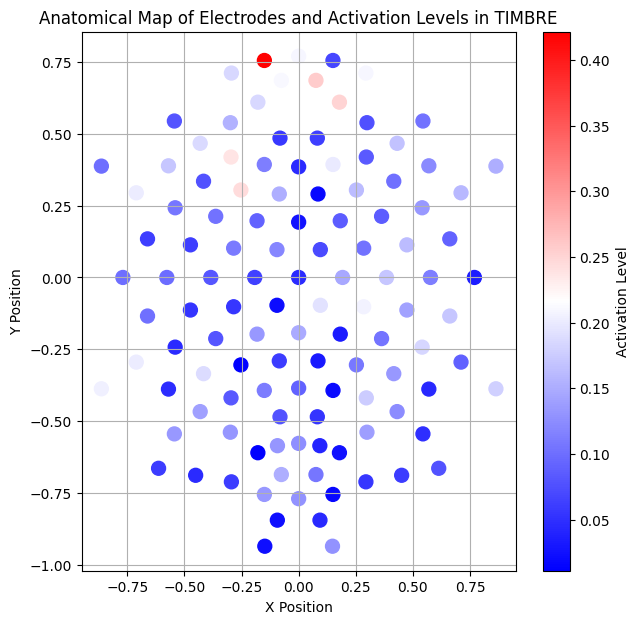

In [ ]:
#TIMBRE activation map
complex_weights = model.layers[0].get_weights()[0]
activation_levels = np.abs(complex_weights[:, 0] + 1j * complex_weights[:, 1])

activation_levels = np.array(activation_levels)

top_10_channels = np.argsort(activation_levels)[-10:]
print(top_10_channels)

plt.figure(figsize=(7, 7))
plt.scatter(X_POS[0], Y_POS[0], c=activation_levels, cmap='bwr', s=100)
plt.colorbar(label='Activation Level')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.title('Anatomical Map of Electrodes and Activation Levels in TIMBRE')
plt.grid(True)
plt.show()


### Complexlm

In [ ]:
real_part = model.layers[0].get_weights()[0]
imag_part = model.layers[0].get_weights()[1]

complex_weights = real_part + 1j * imag_part


if not np.iscomplexobj(complex_weights):
    raise TypeError("The weights are not complex numbers")

real_part = np.real(complex_weights)
imag_part = np.imag(complex_weights)

std_real = np.std(real_part)
print(f'Standard deviation of real part: {std_real}')
std_imag = np.std(imag_part)
print(f'Standard deviation of imaginary part: {std_imag}')


Standard deviation of real part: 0.09195125848054886
Standard deviation of imaginary part: 0.09203896671533585


In [ ]:
# with open('complexIm.m', 'r') as file:
#     content = file.read()
# print(content)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb

def complexIm(in_array, sub=0, pow_val=1, scale=1, setMax=None, h=None):
    # Squeeze the input array to remove singleton dimensions
    in_array = np.squeeze(in_array)

    if sub:
        s = in_array.shape
        in_array_flat = in_array.flatten()
        in_array_flat -= np.mean(in_array_flat)
        in_array_real_imag = np.vstack((in_array_flat.real, in_array_flat.imag)).T
        cov_matrix = np.cov(in_array_real_imag, rowvar=False)
        in_array_flat = in_array_real_imag @ np.linalg.inv(np.sqrt(cov_matrix))
        in_array = (in_array_flat[:, 0] + 1j * in_array_flat[:, 1]).reshape(s)

    if setMax is None:
        setMax = np.percentile(np.abs(in_array), 99.9)

    if h is None:
        hsv_image = np.zeros((*in_array.shape, 3))
        hsv_image[..., 0] = (np.angle(in_array) * scale) % (2 * np.pi) / (2 * np.pi)
        hsv_image[..., 1] = 1
        hsv_image[..., 2] = np.minimum(1, np.power(np.abs(in_array) / setMax, pow_val))
    else:
        hsv_image = np.zeros((*in_array.shape, 3))
        hsv_image[..., 0] = np.angle(h)
        hsv_image[..., 1] = np.minimum(1, np.abs(h) / setMax)
        hsv_image[..., 2] = np.minimum(1, np.power(np.abs(in_array) / setMax, pow_val))

    # Handle NaN values
    hsv_image[..., 0][np.isnan(in_array)] = 1
    hsv_image[..., 2][np.isnan(in_array)] = 1
    hsv_image[..., 1][np.isnan(in_array)] = 0

    # Convert HSV to RGB
    rgb_image = hsv_to_rgb(hsv_image)

    return rgb_image

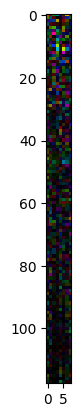

In [ ]:
img=complexIm(complex_weights)
plt.imshow(img)
plt.show()

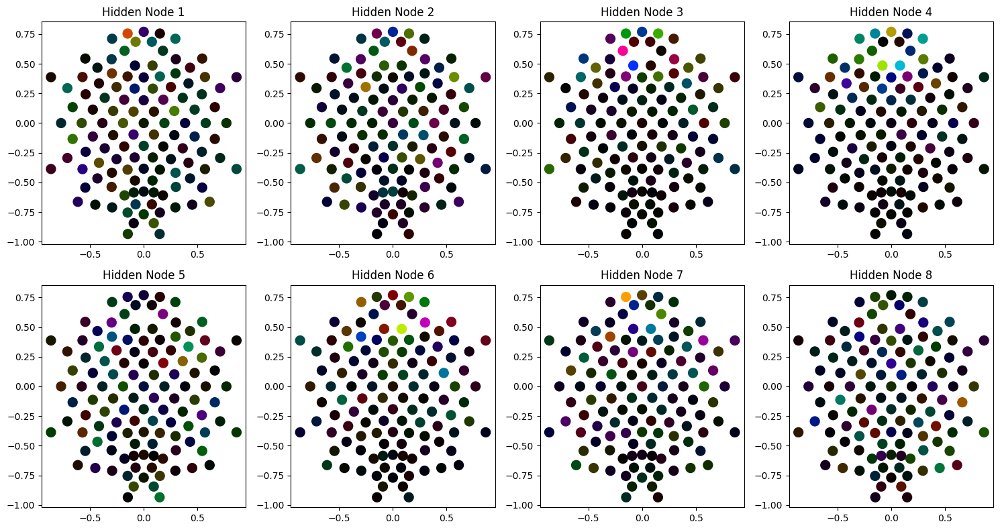

In [ ]:
num_hidden_nodes = img.shape[1]

# Create subplots
fig, axes = plt.subplots(2, 4, figsize=(15, 8))  # Adjust grid size according to number of hidden nodes
axes = axes.flatten()  # Flatten the array of axes for easy iteration

for i in range(num_hidden_nodes):
    # Extract RGB values for the current hidden node
    colors = img[:, i, :]
    scatter = axes[i].scatter(X_POS[0], Y_POS[0], c=colors, s=100)  # Use RGB colors for the scatter plot
    axes[i].set_title(f'Hidden Node {i+1}')

plt.tight_layout()
plt.show()

## Subject across models

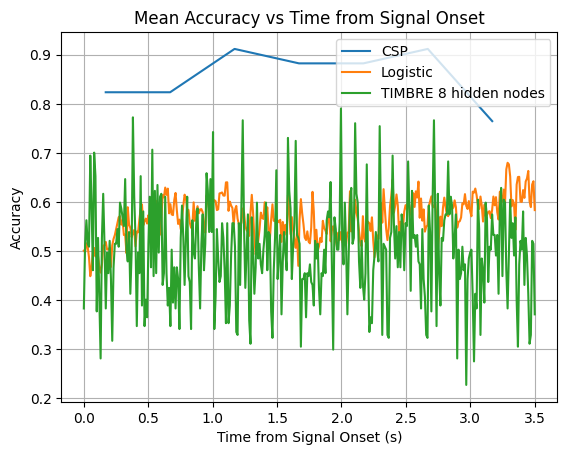

In [ ]:
aaCSP = CSPaccuracies
aaLogistic = logisticprobabilities_avg
aaTIMBRE = average_accuracies[hn]
plt.plot(times, CSPaccuracies, label='CSP')
plt.plot(time, logisticprobabilities_avg, label='Logistic')
plt.plot(time_points, average_accuracies[hn], label=f'TIMBRE {hn} hidden nodes')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Accuracy')
plt.title('Mean Accuracy vs Time from Signal Onset')
plt.legend()
plt.grid(True)
plt.show()

# al

nan
(280,)
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 ...
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]


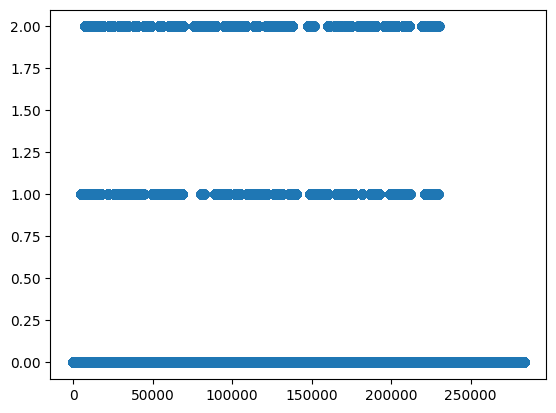

In [ ]:
al = scipy.io.loadmat('/content/drive/My Drive/data_set_IVa_al.mat')
cnt_data = al['cnt']

mrk_data = al['mrk']

print(mrk_data[0][0][1][0][279])
print(mrk_data[0][0][1][0].shape)

lapID = np.zeros((cnt_data.shape[0], 3))
for i in range(mrk_data[0][0][1][0].shape[0]):
    ind_start = mrk_data[0][0][0][0][i]
    lapID[ind_start : ind_start + 350, 0] = i
    lapID[ind_start : ind_start + 350, 1] = mrk_data[0][0][1][0][i]
    lapID[ind_start : ind_start + 350, 2] = 1 if mrk_data[0][0][1][0][i] in [1, 2] else 0
   # lapID[i, 3] = 1 if lapID[i, 2] == 1 else 0  # What does the phase here should be. HELP

print(lapID)


plt.plot(lapID[:,1], 'o')



In [ ]:
def test_train(lapID, which_phase, n_folds=5, which_fold=0):
    """
    Returns test and train samples

    Parameters:
    - lapID: contains info about trial number and maze arm of each sample
    - which_phase: which phase of the session to use (see get_data\get_behav for info)
    - n_folds: how many folds to assign
    - which_fold: which fold to return values for

    Returns:
    - train_inds: which samples to use for training model
    - test_inds: which samples to use for testing model
    """
    ctr = np.zeros(3)
    use_sample = lapID[:, 2] == which_phase
    if which_phase == 2:
        use_sample = use_sample & (lapID[:, 2])  # only use correct trials
    fold_assign = -np.ones(np.size(use_sample))
    for i in range(int(np.max(lapID[:, 0]))):
        inds = (lapID[:, 0] == i) & use_sample
        if np.sum(inds):
            which_arm = int(lapID[inds, 1][0])
            fold_assign[inds] = ctr[which_arm] % n_folds
            ctr[which_arm] += 1
    test_inds = fold_assign == which_fold
    train_inds = np.isin(fold_assign, np.arange(n_folds)) & ~test_inds
    train_inds = helpers.balanced_indices(lapID[:, 1], train_inds)
    return test_inds, train_inds


## 0Hz Filter


In [ ]:
#oHz filter
hp_data=cnt_data-np.mean(cnt_data,axis=1)[:,None]
np.shape(hp_data)

(283574, 118)

## Linear model

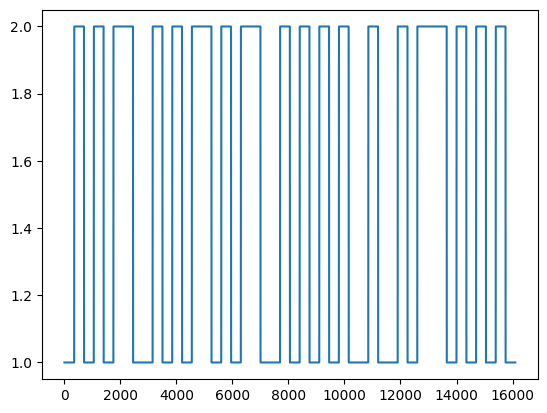

In [ ]:
test_inds, train_inds = test_train(lapID[:,],1,5,0) #last three arguments obtained form code below
#wLFPs, _, _ = helpers.whiten(hp_data, train_inds)

plt.plot(lapID[test_inds,1])

In [ ]:
# lapID array: 4 columns: 1- trial # (0-n); 2- which category(0, 1); 3- correct trial? (Na = incorrect; 1 for correct, 0 for na); 4- phase (1 for the position that have valid trials)
print(lapID[:,1])

[0. 0. 0. ... 0. 0. 0.]


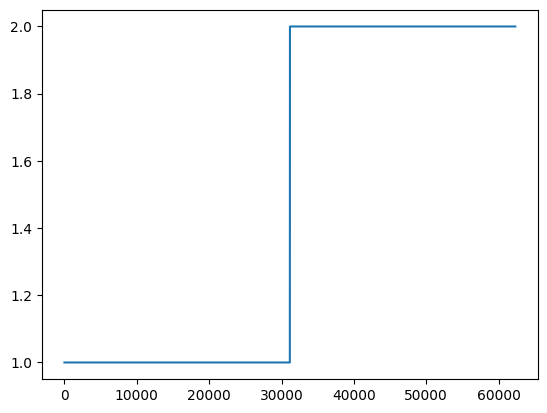

In [ ]:
plt.plot(lapID[train_inds, 1])

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.exceptions import NotFittedError
from sklearn.preprocessing import LabelEncoder


fs = 100
segment_length = int(3.5*fs)
X_train = hp_data[train_inds]
y_train = lapID[train_inds, 1].astype(int)
X_test = hp_data[test_inds]
y_test = lapID[test_inds, 1].astype(int)

# Encode the class labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)
# Ensure labels are encoded as integers if needed
y_train_encoded = y_train.astype(int)
y_test_encoded = y_test.astype(int)


In [ ]:
X_train.shape

(62300, 118)

In [ ]:
y_train.shape

(62300,)

In [ ]:
X_test.shape

(16100, 118)

In [ ]:
y_test.shape

(16100,)

### Optimizing hyperparameters

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(


Accuracy with no regularization: 0.6568
Accuracy with L1 regularization: 0.6581
Accuracy with L2 regularization: 0.6568
Accuracy with elasticnet regularization: 0.6581


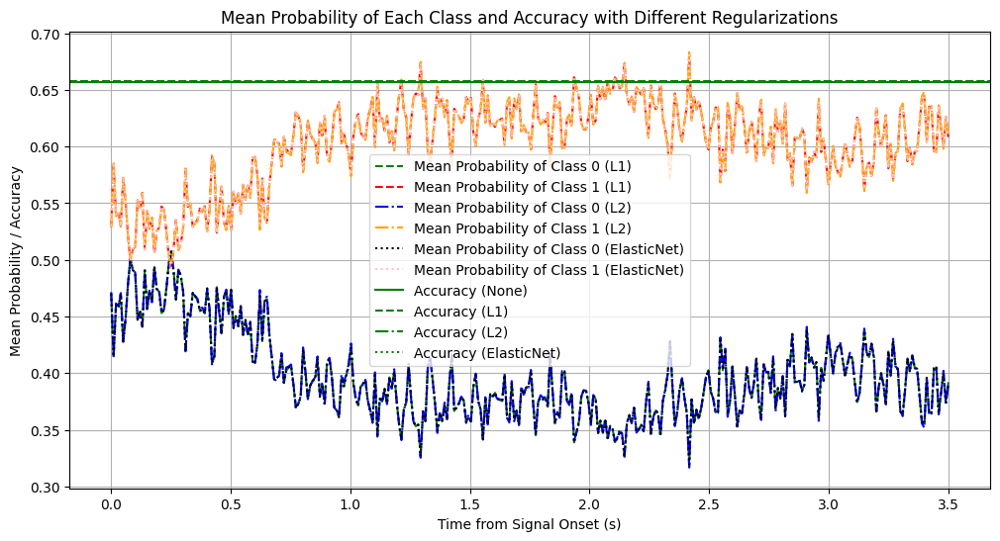

In [ ]:
# Train logistic regression models with different penalties
logistic_model_none = LogisticRegression(penalty='none', max_iter=10000)
logistic_model_l1 = LogisticRegression(penalty='l1', solver='saga', max_iter=10000)
logistic_model_l2 = LogisticRegression(penalty='l2', solver='lbfgs', max_iter=10000)
logistic_model_elasticnet = LogisticRegression(penalty='elasticnet', solver='saga', l1_ratio=0.5, max_iter=10000)

try:
    logistic_model_none.fit(X_train, y_train_encoded)
    logistic_model_l1.fit(X_train, y_train_encoded)
    logistic_model_l2.fit(X_train, y_train_encoded)
    logistic_model_elasticnet.fit(X_train, y_train_encoded)
except Exception as e:
    print(f"An error occurred during model fitting: {e}")

# Predict probabilities for the test set
try:
    predictions_prob_none = logistic_model_none.predict_proba(X_test)
    predictions_prob_l1 = logistic_model_l1.predict_proba(X_test)
    predictions_prob_l2 = logistic_model_l2.predict_proba(X_test)
    predictions_prob_elasticnet = logistic_model_elasticnet.predict_proba(X_test)
except NotFittedError as e:
    print(f"Model is not fitted: {e}")

# Extract probabilities for each class
class_0_probabilities_none = predictions_prob_none[:, 0]
class_1_probabilities_none = predictions_prob_none[:, 1]
class_0_probabilities_l1 = predictions_prob_l1[:, 0]
class_1_probabilities_l1 = predictions_prob_l1[:, 1]
class_0_probabilities_l2 = predictions_prob_l2[:, 0]
class_1_probabilities_l2 = predictions_prob_l2[:, 1]
class_0_probabilities_elasticnet = predictions_prob_elasticnet[:, 0]
class_1_probabilities_elasticnet = predictions_prob_elasticnet[:, 1]

# Compute mean probabilities over each segment
num_segments = len(class_0_probabilities_none) // segment_length
class_0_probabilities_none_reshaped = class_0_probabilities_none[:num_segments * segment_length].reshape((num_segments, segment_length))
class_1_probabilities_none_reshaped = class_1_probabilities_none[:num_segments * segment_length].reshape((num_segments, segment_length))
class_0_probabilities_l1_reshaped = class_0_probabilities_l1[:num_segments * segment_length].reshape((num_segments, segment_length))
class_1_probabilities_l1_reshaped = class_1_probabilities_l1[:num_segments * segment_length].reshape((num_segments, segment_length))
class_0_probabilities_l2_reshaped = class_0_probabilities_l2[:num_segments * segment_length].reshape((num_segments, segment_length))
class_1_probabilities_l2_reshaped = class_1_probabilities_l2[:num_segments * segment_length].reshape((num_segments, segment_length))
class_0_probabilities_elasticnet_reshaped = class_0_probabilities_elasticnet[:num_segments * segment_length].reshape((num_segments, segment_length))
class_1_probabilities_elasticnet_reshaped = class_1_probabilities_elasticnet[:num_segments * segment_length].reshape((num_segments, segment_length))

class_0_probabilities_none_avg = class_0_probabilities_none_reshaped.mean(axis=0)
class_1_probabilities_none_avg = class_1_probabilities_none_reshaped.mean(axis=0)
class_0_probabilities_l1_avg = class_0_probabilities_l1_reshaped.mean(axis=0)
class_1_probabilities_l1_avg = class_1_probabilities_l1_reshaped.mean(axis=0)
class_0_probabilities_l2_avg = class_0_probabilities_l2_reshaped.mean(axis=0)
class_1_probabilities_l2_avg = class_1_probabilities_l2_reshaped.mean(axis=0)
class_0_probabilities_elasticnet_avg = class_0_probabilities_elasticnet_reshaped.mean(axis=0)
class_1_probabilities_elasticnet_avg = class_1_probabilities_elasticnet_reshaped.mean(axis=0)

# Predict class labels
predicted_labels_none = logistic_model_none.predict(X_test)
predicted_labels_l1 = logistic_model_l1.predict(X_test)
predicted_labels_l2 = logistic_model_l2.predict(X_test)
predicted_labels_elasticnet = logistic_model_elasticnet.predict(X_test)

# Compute accuracy
accuracy_none = accuracy_score(y_test_encoded, predicted_labels_none)
accuracy_l1 = accuracy_score(y_test_encoded, predicted_labels_l1)
accuracy_l2 = accuracy_score(y_test_encoded, predicted_labels_l2)
accuracy_elasticnet = accuracy_score(y_test_encoded, predicted_labels_elasticnet)

print(f'Accuracy with no regularization: {accuracy_none:.4f}')
print(f'Accuracy with L1 regularization: {accuracy_l1:.4f}')
print(f'Accuracy with L2 regularization: {accuracy_l2:.4f}')
print(f'Accuracy with elasticnet regularization: {accuracy_elasticnet:.4f}')

# Time array for plotting
time = np.linspace(0, segment_length / fs, segment_length)

# Plotting the mean probabilities and accuracy for each class
plt.figure(figsize=(12, 6))

# Confidence levels for no regularization
# plt.plot(time, class_0_probabilities_none_avg, label='Mean Probability of Class 0 (None)', linestyle='-', color='blue')
# plt.plot(time, class_1_probabilities_none_avg, label='Mean Probability of Class 1 (None)', linestyle='-', color='orange')

# Confidence levels for L1 regularization
plt.plot(time, class_0_probabilities_l1_avg, label='Mean Probability of Class 0 (L1)', linestyle='--', color='green')
plt.plot(time, class_1_probabilities_l1_avg, label='Mean Probability of Class 1 (L1)', linestyle='--', color='red')

# Confidence levels for L2 regularization
plt.plot(time, class_0_probabilities_l2_avg, label='Mean Probability of Class 0 (L2)', linestyle='-.', color='blue')
plt.plot(time, class_1_probabilities_l2_avg, label='Mean Probability of Class 1 (L2)', linestyle='-.', color='orange')

# Confidence levels for elasticnet regularization
plt.plot(time, class_0_probabilities_elasticnet_avg, label='Mean Probability of Class 0 (ElasticNet)', linestyle=':', color='black')
plt.plot(time, class_1_probabilities_elasticnet_avg, label='Mean Probability of Class 1 (ElasticNet)', linestyle=':', color='pink')

# Add accuracy as horizontal lines
plt.axhline(y=accuracy_none, color='green', linestyle='-', label='Accuracy (None)')
plt.axhline(y=accuracy_l1, color='green', linestyle='--', label='Accuracy (L1)')
plt.axhline(y=accuracy_l2, color='green', linestyle='-.', label='Accuracy (L2)')
plt.axhline(y=accuracy_elasticnet, color='green', linestyle=':', label='Accuracy (ElasticNet)')

plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Mean Probability / Accuracy')
plt.title('Mean Probability of Each Class and Accuracy with Different Regularizations')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler

# Normalize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define a range of C values (inverse of regularization strength)
C_values = np.logspace(-4, 4, 20)

# Lists to store accuracy values
train_accuracies = []
test_accuracies = []

# Train and evaluate the model for each C value
for C in C_values:
    model = LogisticRegression(C=C, penalty='l2', solver='liblinear', max_iter=10000)
    model.fit(X_train_scaled, y_train)

    train_accuracy = accuracy_score(y_train, model.predict(X_train_scaled))
    test_accuracy = accuracy_score(y_test, model.predict(X_test_scaled))

    train_accuracies.append(train_accuracy)
    test_accuracies.append(test_accuracy)

# Plot the accuracy as a function of C
plt.figure(figsize=(10, 6))
#plt.plot(C_values, train_accuracies, label='Train Accuracy', marker='o')
plt.plot(C_values, test_accuracies, label='Test Accuracy', marker='x')
plt.xscale('log')
plt.xlabel('Regularization Parameter C')
plt.ylabel('Accuracy')
plt.title('Accuracy vs C')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
best_c_index = np.argmax(test_accuracies)
best_c = C_values[best_c_index]
print(f"Best C value: {best_c}")


### Accuracy

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder


logistic_model = LogisticRegression(penalty='l1',max_iter=1000, C=0.03359818286283781, solver='liblinear')
logistic_model.fit(X_train, y_train)

predictions_prob = logistic_model.predict_proba(X_test)
predicted_labels = logistic_model.predict(X_test)

accuracy = accuracy_score(y_test, predicted_labels)
print(f'Accuracy: {accuracy:.4f}')

num_segments = len(predictions_prob) // segment_length
predictions_reshaped = predictions_prob[:num_segments * segment_length].reshape((num_segments, segment_length, -1))
predictions_avg = predictions_reshaped.mean(axis=0)


Accuracy: 0.6573


In [ ]:
segment_length = 350

num_trials = len(predictions_prob) // segment_length
predictions_reshaped = predictions_prob[:num_trials * segment_length].reshape((num_trials, segment_length, -1))

trial_probabilities_multiply = np.prod(predictions_reshaped, axis=1)
trial_predictions_multiply = np.argmax(trial_probabilities_multiply, axis=1)

trial_probabilities_sum = np.sum(predictions_reshaped, axis=1)
trial_predictions_sum = np.argmax(trial_probabilities_sum, axis=1)

true_trial_labels = y_test[::segment_length] -1

trial_accuracy_multiply = accuracy_score(true_trial_labels, trial_predictions_multiply)
trial_accuracy_sum = accuracy_score(true_trial_labels, trial_predictions_sum)

print(f'Trial Accuracy (multiply): {trial_accuracy_multiply:.4f}')
print(f'Trial Accuracy (sum): {trial_accuracy_sum:.4f}')

Trial Accuracy (multiply): 0.6957
Trial Accuracy (sum): 0.6957


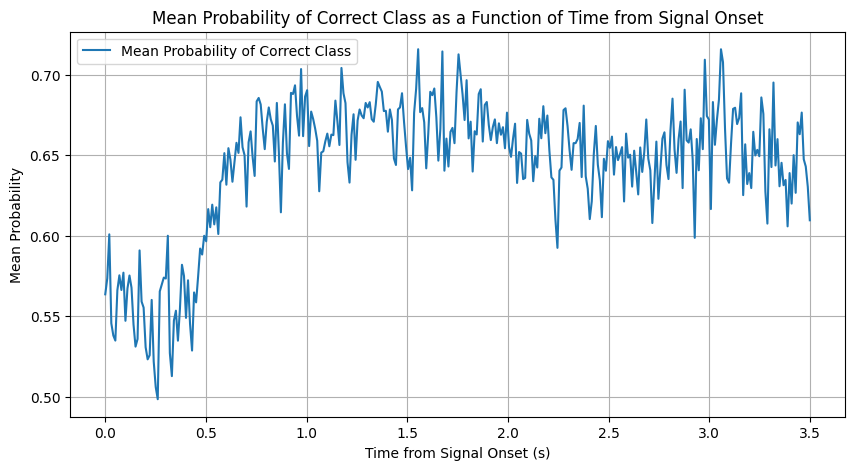

In [ ]:
time = np.linspace(0, segment_length / fs, segment_length)

# Get the number of unique classes
num_classes = predictions_prob.shape[1]

# Ensure y_test is properly encoded to start from 0
label_encoder = LabelEncoder()
y_test_encoded = label_encoder.fit_transform(y_test)

# Reshape and average probabilities for correct class over segments
correct_class_probabilities = []
for i in range(len(y_test_encoded)):
    correct_label = y_test_encoded[i]
    correct_class_probabilities.append(predictions_prob[i][correct_label])

correct_class_probabilities = np.array(correct_class_probabilities)
num_segments = len(correct_class_probabilities) // segment_length
probabilities_reshaped = correct_class_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))
logisticprobabilities_avg = probabilities_reshaped.mean(axis=0)

# Plot mean probabilities as a function of time
plt.figure(figsize=(10, 5))
plt.plot(time, logisticprobabilities_avg, label='Mean Probability of Correct Class')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Mean Probability')
plt.title('Mean Probability of Correct Class as a Function of Time from Signal Onset')
plt.legend()
plt.grid(True)
plt.show()

### Confidence plots


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define segment length based on the sampling frequency (fs)
segment_length = 350

# Extract probabilities for each class
class_0_probabilities = predictions_prob[:, 0]
class_1_probabilities = predictions_prob[:, 1]

# Compute mean probabilities over each segment
num_segments = len(class_0_probabilities) // segment_length
class_0_probabilities_reshaped = class_0_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))
class_1_probabilities_reshaped = class_1_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))

class_0_probabilities_avg = class_0_probabilities_reshaped.mean(axis=0)
class_1_probabilities_avg = class_1_probabilities_reshaped.mean(axis=0)

# Time array for plotting
time = np.linspace(0, segment_length / fs, segment_length)

# Plotting the mean probabilities for each class
plt.figure(figsize=(12, 6))
plt.plot(time, class_0_probabilities_avg, label='Mean Probability of Class 0', color='blue')
plt.plot(time, class_1_probabilities_avg, label='Mean Probability of Class 1', color='orange')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Mean Probability')
plt.title('Mean Probability of Each Class as a Function of Time from Signal Onset')
plt.legend()
plt.grid(True)
plt.show()


## 2Hz HP Filter


In [ ]:
#Hp 2Hz
hp_data = helpers.filter_data(cnt_data, 2, 100, filt_type='high', use_hilbert=True)
np.shape(hp_data)

(283574, 118)

## CSP

In [ ]:
from mne.decoding import CSP
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import scipy.io

# Select relevant data and labels
lapTrue = lapID[lapID[:, 2].astype(bool), :]
test_inds, train_inds = test_train(lapTrue, 1, n_folds=5, which_fold=0)
valid_hp_data = hp_data[lapID[:, 2].astype(bool)]

n_channels = valid_hp_data.shape[1]
n_times = 350
n_trials = valid_hp_data.shape[0] // n_times
fs=100

print(f"Calculated number of trials: {n_trials}")

# Reshape the data to (n_trials, n_channels, n_times)
eeg_data = valid_hp_data.reshape((n_trials, n_times, n_channels)).transpose(0, 2, 1)
eeg_data = np.abs(eeg_data)

print(f"Shape of eeg_data after reshaping: {eeg_data.shape}")

# Create labels
labels = lapTrue[:, 1][::n_times] - 1  # Adjust labels to be 0 and 1

# Filter train_inds and test_inds to be within n_trials
train_inds = np.where(train_inds[:: n_times])[0]
test_inds = np.where(test_inds[:: n_times])[0]

# Create train and test sets using the indices from test_train function
X_train = eeg_data[train_inds]
X_test = eeg_data[test_inds]
y_train = labels[train_inds]
y_test = labels[test_inds]

# Create a CSP object
csp = CSP(n_components=4, reg='ledoit_wolf', log=True, norm_trace=False)

# Create a pipeline with CSP and SVM
clf = make_pipeline(csp, SVC())

# Fit the model
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')


In [ ]:
from mne.decoding import CSP
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np

# Parameters
window_size = len(test_inds)  # Size of the time window in samples
step_size = 50     # Step size for the sliding window in samples
n_components = 4   # Number of CSP components
fs = 100           # Sampling frequency

# Function to compute accuracy over time
def compute_accuracy_over_time(eeg_data, labels, train_inds, test_inds, window_size, step_size, n_components, fs):
    accuracies = []
    times = []

    for start in range(0, eeg_data.shape[2] - window_size + 1, step_size):
        end = start + window_size
        X_window = eeg_data[:, :, start:end]

        # Create a CSP object
        csp = CSP(n_components=n_components, reg='ledoit_wolf', log=True, norm_trace=False)

        # Create a pipeline with CSP and SVM
        clf = make_pipeline(csp, SVC())

        # Split data into train and test sets
        X_train = X_window[train_inds]
        X_test = X_window[test_inds]
        y_train = labels[train_inds]
        y_test = labels[test_inds]

        # Fit the model
        clf.fit(X_train, y_train)

        # Predict on the test set
        y_pred = clf.predict(X_test)

        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred)
        accuracies.append(accuracy)

        # Time corresponding to the middle of the window
        times.append((start + end) / 2 / fs)

    return times, accuracies

# Select relevant data and labels
lapTrue = lapID[lapID[:, 2].astype(bool), :]
test_inds, train_inds = test_train(lapTrue, 1, n_folds=5, which_fold=0)
valid_hp_data = hp_data[lapID[:, 2].astype(bool)]

n_channels = valid_hp_data.shape[1]
n_times = 350
n_trials = valid_hp_data.shape[0] // n_times

print(f"Calculated number of trials: {n_trials}")

# Reshape the data to (n_trials, n_channels, n_times)
eeg_data = valid_hp_data.reshape((n_trials, n_times, n_channels)).transpose(0, 2, 1)
eeg_data = np.abs(eeg_data)

print(f"Shape of eeg_data after reshaping: {eeg_data.shape}")

# Create labels
labels = lapTrue[:, 1][::n_times] - 1  # Adjust labels to be 0 and 1

# Filter train_inds and test_inds to be within n_trials
train_inds = np.where(train_inds[::n_times])[0]
test_inds = np.where(test_inds[::n_times])[0]

# Compute accuracy over time
times, CSPaccuracies = compute_accuracy_over_time(eeg_data, labels, train_inds, test_inds, window_size, step_size, n_components, fs)

# Plot time vs. accuracy
plt.figure(figsize=(10, 6))
plt.plot(times, CSPaccuracies, 'bo-')
plt.xlabel('Time (s)')
plt.ylabel('Accuracy')
plt.title('Time vs. Accuracy using CSP')
plt.grid(True)
plt.show()


###Power spectra

In [ ]:
# Transform the data using the trained CSP
transformed_X_train = csp.transform(X_train)
transformed_X_test = csp.transform(X_test)

# Separate the transformed data by category
cat_0_train = transformed_X_train[y_train == 0]
cat_1_train = transformed_X_train[y_train == 1]
cat_0_test = transformed_X_test[y_test == 0]
cat_1_test = transformed_X_test[y_test == 1]

In [ ]:
from scipy.signal import welch
# Function to compute power spectrum
def compute_power_spectrum(data, fs):
    power_spectra = []
    for trial in data:
        f, Pxx = welch(trial, fs, nperseg=fs)
        power_spectra.append(Pxx)
    mean_power_spectrum = np.mean(power_spectra, axis=0)
    return f, mean_power_spectrum
f_cat_0, power_spectrum_cat_0 = compute_power_spectrum(transformed_X_train[y_train == 0], fs)
f_cat_1, power_spectrum_cat_1 = compute_power_spectrum(transformed_X_train[y_train == 1], fs)

# Plot the power spectrum for each category
plt.figure(figsize=(12, 6))

plt.plot(f_cat_0, power_spectrum_cat_0, label='Category 1')
plt.plot(f_cat_1, power_spectrum_cat_1, label='Category 2')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (µV²)')
plt.title('Power Spectrum by Category')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
def compute_fft(eeg_data, fs):
    fft_data = np.fft.fft(eeg_data)
    frequencies = np.fft.fftfreq(len(eeg_data), d=1/fs)
    positive_freq_mask = frequencies >= 0
    frequencies = frequencies[positive_freq_mask]
    fft_data = fft_data[positive_freq_mask]

    fft_magnitude = np.abs(fft_data)
    return frequencies, fft_magnitude

# compute fft for each category
freq_cat0_train, fft_mag_cat0_train = compute_fft(cat_0_train.flatten(), fs)
freq_cat1_train, fft_mag_cat1_train = compute_fft(cat_1_train.flatten(), fs)
freq_cat0_test, fft_mag_cat0_test = compute_fft(cat_0_test.flatten(), fs)
freq_cat1_test, fft_mag_cat1_test = compute_fft(cat_1_test.flatten(), fs)

# plotting FFT
plt.figure(figsize=(12, 6))

plt.plot(freq_cat0_train, fft_mag_cat0_train, label='Train Data - Category 0')
plt.plot(freq_cat1_train, fft_mag_cat1_train, label='Train Data - Category 1')
plt.plot(freq_cat0_test, fft_mag_cat0_test, label='Test Data - Category 0')
plt.plot(freq_cat1_test, fft_mag_cat1_test, label='Test Data - Category 1')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.title('FFT Spectrum by Category')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
def compute_power_spectrum(eeg_data, fs):
    N = len(eeg_data)
    xk = (1/N**2) * np.abs(np.fft.fft(eeg_data))**2  # Two-sided power spectrum
    xk = xk[:N//2+1]  # One-sided power spectrum
    xk[1:-1] = 2 * xk[1:-1]  # Double values except for DC and Nyquist

    freq = np.fft.fftfreq(N, d=1/fs)[:N//2+1]  # Frequency axis

    return freq, xk

# Compute power spectrum for each category
freq_cat0_train, power_spectrum_cat0_train = compute_power_spectrum(cat_0_train.flatten(), fs)
freq_cat1_train, power_spectrum_cat1_train = compute_power_spectrum(cat_1_train.flatten(), fs)
freq_cat0_test, power_spectrum_cat0_test = compute_power_spectrum(cat_0_test.flatten(), fs)
freq_cat1_test, power_spectrum_cat1_test = compute_power_spectrum(cat_1_test.flatten(), fs)

# Plot the power spectrum for each category
plt.figure(figsize=(12, 6))

plt.plot(freq_cat0_train[freq_cat0_train >= 0], power_spectrum_cat0_train[freq_cat0_train >= 0], label='Train Data - Category 0')
plt.plot(freq_cat1_train[freq_cat1_train >= 0], power_spectrum_cat1_train[freq_cat1_train >= 0], label='Train Data - Category 1')
plt.plot(freq_cat0_test[freq_cat0_test >= 0], power_spectrum_cat0_test[freq_cat0_test >= 0], label='Test Data - Category 0')
plt.plot(freq_cat1_test[freq_cat1_test >= 0], power_spectrum_cat1_test[freq_cat1_test >= 0], label='Test Data - Category 1')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (µV^2)')
plt.title('Power Spectrum by Category')
plt.legend()
plt.grid(True)
plt.ylim(1, 1.3)
plt.tight_layout()
plt.show()


In [ ]:
def plot_spectrogram(data, fs, title):
    plt.figure(figsize=(12, 6))
    for i in range(data.shape[0]):
        plt.specgram(data[i, :], Fs=fs, NFFT=256, noverlap=128, cmap='jet')
        plt.ylabel('Frequency [Hz]')
        plt.xlabel('Time [sec]')
        plt.title(f'{title} Trial {i+1}')
        plt.colorbar(label='Power/Frequency (dB/Hz)')
        plt.show()

# Plotting the spectrogram for each CSP component
for i in range(4):
    print(f'Plotting CSP Component {i+1}')
    plot_spectrogram(transformed_X_train[:, i, np.newaxis].T, fs, f'Spectrogram of CSP Component {i+1} - Train Data')
    plot_spectrogram(transformed_X_test[:, i, np.newaxis].T, fs, f'Spectrogram of CSP Component {i+1} - Test Data')


In [ ]:
# Predictions on a per-sample basis
valid_samples = hp_data[lapID[:, 2].astype(bool)]
sample_labels = lapTrue[:, 1] - 1  # Adjust labels to be 0 and 1

# Calculate the correct number of samples
num_samples = valid_samples.shape[0] // n_times

# Reshape the data to (num_samples, n_channels, n_times)
eeg_samples = valid_samples.reshape((num_samples, n_times, n_channels)).transpose(0, 2, 1)

# Transform the data using the trained CSP
transformed_samples = np.array([csp.transform(epoch[np.newaxis, :, :])[0] for epoch in eeg_samples])

# Ensure the data is real
transformed_samples = np.abs(transformed_samples)

# Predict on the transformed samples
sample_predictions = clf.steps[-1][1].predict(transformed_samples)

# Calculate accuracy for per-sample predictions
sample_accuracy = accuracy_score(sample_labels[:num_samples], sample_predictions)
print(f'Per-sample accuracy: {sample_accuracy:.2f}')


## Training and running TIMBRE

In [ ]:
from TIMBRE.TIMBRE import TIMBRE
np.shape(lapID[:,0])

(283574,)

In [ ]:
# from TIMBRE.TIMBRE import TIMBRE

# fig, axs = plt.subplots(4, 4, figsize=(20, 5))

# trial_phase = 1
# n_folds = 5
# which_fold = 0

# # lapID array: 4 columns: 1- trial # (0-n); 2- which category(0, 1); 3- correct trial? (Na = incorrect; 1 for correct, 0 for na); 4- phase (1 for the position that have valid trials)
# # 350 sample a block,
# # n by 4

# lapTrue = lapID[lapID[:,1].astype(bool),:]
# test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# wLFPs, _, _ = helpers.whiten(hp_data[lapID[:,2].astype(bool)], train_inds)

# #n_bins = 20
# #pos_binned = helpers.group_by_pos(lapID[:,1], n_bins, train_inds)
# #arm_and_pos_binned = lapID[:, 2] * n_bins + pos_binned
# accuracy=np.zeros(axs.shape[0])


# titles = ['Projection (real part)', 'Amplitude', 'Softmax 1', 'Softmax 2 (Output)']
# for i in range(axs.shape[0]):
#     print(f"Training network {i + 1} of {axs.shape[0]} (hidden layer size { 4* 2 ** i})")  # try 4 different hidden layer sizes
#     m, _, accuracy[i] = TIMBRE(wLFPs, lapTrue[:,1], test_inds, train_inds, hidden_nodes = 0)  # train network

#     # Print the shapes of each layer
#     print(f"Input layer shape: {m.input_shape}")
#     for layer in m.layers:
#         print(f"Layer {layer.name} shape: {layer.output_shape}")

#     # for j in range(axs.shape[1]):  # Loop through each layer
#     #     p = helpers.layer_output(wLFPs[test_inds], m, j)  # Calculate layer's response to input, using only test data
#     #     if j == 0:
#     #         p = p[:, :p.shape[1] // 2]  # just get real component for complex-valued output
#     #         axs[i, 0].set_ylabel(str(3 * 2 ** i) + ' features')
#     #     if i == 0:
#     #         axs[0, j].set_title((titles[j]))
#     #     axs[i, j].plot(helpers.accumarray(arm_and_pos_binned[test_inds], p))  # plot mean response of layer to test data as a function of position
#     #     axs[i, j].autoscale(enable=True, axis='both', tight=True)
#     #     if i < axs.shape[0] - 1:
#     #         axs[i, j].set_xticks([])
#     #     else:
#     #         axs[i, j].set_xlabel('Position')
# print(accuracy)

In [ ]:
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
wLFPs, u, Xv = helpers.whiten(hp_data[lapID[:,2].astype(bool)], train_inds)

# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Train the network
model, _, accuracy = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes= 2)
# Use the predict method on the returned model
predictions = model.predict(wLFPs_processed)

print(f"Input layer shape: {model.input_shape}")

# for layer in model.layers:
#    print(f"Layer {layer.name} shape: {layer.output_shape}")
print(accuracy)

Shape of wLFPs after processing: (78400, 236)
2450/2450 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step
Input layer shape: (None, 236)


AttributeError: 'ComplexDense' object has no attribute 'output_shape'

In [ ]:
pred_mean=np.mean(predictions,axis=0)
predictions_bin=predictions-pred_mean
predictions_bin=np.argmax(predictions_bin,axis=1)

In [ ]:
pred_mean

array([0.50619185, 0.49380824], dtype=float32)

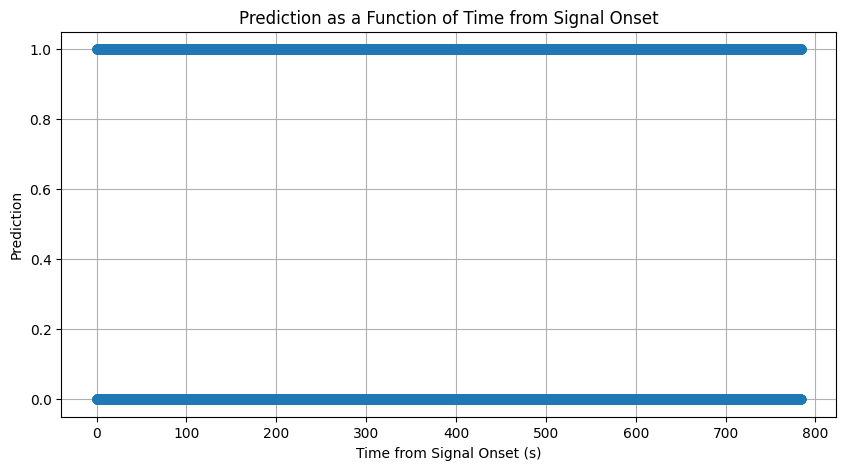

In [ ]:
fs = 100
pred_mean = np.mean(predictions, axis=0)
predictions_bin = predictions - pred_mean

# Find the class with the highest probability
predictions_bin = np.argmax(predictions_bin, axis=1)

# Create a time array matching the length of predictions_bin
time = np.linspace(0, len(predictions_bin) / fs, len(predictions_bin))
time= time.reshape(-2)


plt.figure(figsize=(10, 5))
plt.plot(time, predictions_bin, 'o')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Prediction')
plt.title('Prediction as a Function of Time from Signal Onset')
plt.grid(True)
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score
from keras.models import Model

n_times = 350
n_trials = len(predictions) // n_times

# second_last_layer_output = model.layers[-2].output
# second_last_layer_model = Model(inputs=model.input, outputs=second_last_layer_output)
# second_last_layer_predictions = second_last_layer_model.predict(wLFPs_processed)

weights, biases = model.layers[-1].get_weights()
pre_softmax_predictions = np.dot(predictions, weights) + biases

# Reshape into trials
predictions_reshaped = predictions.reshape((n_trials, n_times, 2))
pre_softmax_predictions_reshaped = pre_softmax_predictions.reshape((n_trials, n_times, 2)) # Ajust to the number of hidden node

def calculate_trial_predictions(predictions_reshaped, pre_softmax_predictions_reshaped, operation):
    if operation == "multiply_before_softmax":
        trial_probabilities = np.prod(pre_softmax_predictions_reshaped, axis=1)
    elif operation == "multiply_after_softmax":
        trial_probabilities = np.prod(predictions_reshaped, axis=1)
    elif operation == "add_before_softmax":
        trial_probabilities = np.sum(pre_softmax_predictions_reshaped, axis=1)
    elif operation == "add_after_softmax":
        trial_probabilities = np.sum(np.log10(predictions_reshaped), axis=1)

    trial_predictions = np.argmax(trial_probabilities, axis=1)
    return trial_predictions

true_trial_labels = lapTrue[:, 1][::n_times] - 1  # Adjust labels to be 0 and 1

operations = ["multiply_before_softmax", "multiply_after_softmax", "add_before_softmax", "add_after_softmax"]
accuracies = {}

for operation in operations:
    trial_predictions = calculate_trial_predictions(predictions_reshaped, pre_softmax_predictions_reshaped, operation)
    trial_accuracy = accuracy_score(true_trial_labels, trial_predictions)
    accuracies[operation] = trial_accuracy
    print(f'Trial Accuracy ({operation}): {trial_accuracy}')

ValueError: The layer sequential has never been called and thus has no defined input.

###Optimizing learning rate

In [ ]:
pip install keras-tuner

In [ ]:
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
trial_phase = 1
n_folds = 5
which_fold = 0


lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")


def build_model(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds,  train_inds, hidden_nodes=8)

    learn_rate = hp.Choice('learning_rate', values=[1e-5, 1e-4, 1e-3, 1e-2, 1e-1])
    optimizer = Adam(learning_rate=learn_rate)

    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Define the tuner
tuner = kt.Hyperband(
    build_model,
    objective='val_accuracy',
    max_epochs=100,
    factor=3,
    directory='my_dir',
    project_name='intro_to_kt'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)

X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the search
tuner.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best hyperparameters
best_hp = tuner.get_best_hyperparameters()[0]
best_lr = best_hp.get('learning_rate')

print(f'Best learning rate: {best_lr}')

# Build the model with the best hyperparameters and train it
best_model = build_model(best_hp)
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


In [ ]:
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt

# Assumed variables and data
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Define model building function for initial search
values = np.random.shuffle([1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])

def build_model_initial(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values)
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Initial hyperparameter search
tuner_initial = kt.Hyperband(
    build_model_initial,
    objective='val_accuracy',
    max_epochs=50,  # Use a smaller number of epochs for initial search
    factor=3,
    directory='my_dir',
    project_name='initial_lr_search'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)
X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the initial search
tuner_initial.search(X_train, y_train, epochs=50, validation_data=(X_val, y_val))

# Get the best learning rate from the initial search
best_hp_initial = tuner_initial.get_best_hyperparameters()[0]
best_lr_initial = best_hp_initial.get('learning_rate')
print(f'Best learning rate from initial search: {best_lr_initial}')

# Define model building function for refined search
values = np.random.shuffle([best_lr_initial/5, best_lr_initial/10, best_lr_initial/2, best_lr_initial, best_lr_initial*10, best_lr_initial*2, best_lr_initial*5])

def build_model_refined(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values)
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Refined hyperparameter search
tuner_refined = kt.Hyperband(
    build_model_refined,
    objective='val_accuracy',
    max_epochs=100,  # Increase the number of epochs for refined search
    factor=3,
    directory='my_dir',
    project_name='refined_lr_search'
)

# Perform the refined search
tuner_refined.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best learning rate from the refined search
best_hp_refined = tuner_refined.get_best_hyperparameters()[0]
best_lr_refined = best_hp_refined.get('learning_rate')
print(f'Best learning rate from refined search: {best_lr_refined}')

# Visualize the learning rate vs. performance
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
plt.show()

# Build and train the final model with the best learning rate
def build_model_final():
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    optimizer = Adam(learning_rate=best_lr_refined)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

best_model = build_model_final()
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


In [ ]:
# Extract trials and their hyperparameters and metrics
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))

# Print learning rates and validation accuracies in the order they were evaluated
print("Learning Rate | Validation Accuracy")
print("-----------------------------------")
for trial in trials:
    lr = trial.hyperparameters.get('learning_rate')
    val_acc = trial.metrics.get_best_value('val_accuracy')
    print(f"{lr:.5e} | {val_acc:.5f}")

# Plot learning rate vs. validation accuracy with markers indicating the order
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-', label='Validation Accuracy')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
for i, txt in enumerate(range(len(lrs))):
    plt.annotate(txt, (lrs[i], val_accuracies[i]), textcoords="offset points", xytext=(0,10), ha='center')
plt.legend()
plt.show()


In [ ]:
import random
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt

# Assumed variables and data
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Define model building function for initial search
def build_model_initial(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values=[1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Initial hyperparameter search
tuner_initial = kt.Hyperband(
    build_model_initial,
    objective='val_accuracy',
    max_epochs=50,  # Use a smaller number of epochs for initial search
    factor=3,
    directory='my_dir',
    project_name='initial_lr_search'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)
X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the initial search
tuner_initial.search(X_train, y_train, epochs=50, validation_data=(X_val, y_val))

# Get the best learning rate from the initial search
best_hp_initial = tuner_initial.get_best_hyperparameters()[0]
best_lr_initial = best_hp_initial.get('learning_rate')
print(f'Best learning rate from initial search: {best_lr_initial}')

# Define a list of learning rates for the refined search and shuffle it
learning_rates = [best_lr_initial/5, best_lr_initial/10, best_lr_initial/2, best_lr_initial, best_lr_initial*10, best_lr_initial*2, best_lr_initial*5]
random.shuffle(learning_rates)

# Define model building function for refined search with shuffled learning rates
def build_model_refined(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values=learning_rates)
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Custom search function to shuffle the trials
class ShuffledHyperband(kt.Hyperband):
    def run_trial(self, trial, *args, **kwargs):
        random.shuffle(trial.hyperparameters.space['learning_rate'].values)
        super(ShuffledHyperband, self).run_trial(trial, *args, **kwargs)

# Refined hyperparameter search with shuffled trials
tuner_refined = ShuffledHyperband(
    build_model_refined,
    objective='val_accuracy',
    max_epochs=100,  # Increase the number of epochs for refined search
    factor=3,
    directory='my_dir',
    project_name='refined_lr_search'
)

# Perform the refined search
tuner_refined.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best learning rate from the refined search
best_hp_refined = tuner_refined.get_best_hyperparameters()[0]
best_lr_refined = best_hp_refined.get('learning_rate')
print(f'Best learning rate from refined search: {best_lr_refined}')

# Visualize the learning rate vs. performance
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
plt.show()

# Build and train the final model with the best learning rate
def build_model_final():
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    optimizer = Adam(learning_rate=best_lr_refined)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

best_model = build_model_final()
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


In [ ]:
import random
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt

# Assumed variables and data
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Define model building function for initial search
def build_model_initial(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values=[1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Initial hyperparameter search
tuner_initial = kt.Hyperband(
    build_model_initial,
    objective='val_accuracy',
    max_epochs=50,  # Use a smaller number of epochs for initial search
    factor=3,
    directory='my_dir',
    project_name='initial_lr_search'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)
X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the initial search
tuner_initial.search(X_train, y_train, epochs=50, validation_data=(X_val, y_val))

# Get the best learning rate from the initial search
best_hp_initial = tuner_initial.get_best_hyperparameters()[0]
best_lr_initial = best_hp_initial.get('learning_rate')
print(f'Best learning rate from initial search: {best_lr_initial}')

# Define a list of learning rates for the refined search and shuffle it
learning_rates = [best_lr_initial/5, best_lr_initial/10, best_lr_initial/2, best_lr_initial, best_lr_initial*10, best_lr_initial*2, best_lr_initial*5]
random.shuffle(learning_rates)

# Define model building function for refined search
class RefinedHyperModel(kt.HyperModel):
    def __init__(self, learning_rates):
        self.learning_rates = learning_rates
        random.shuffle(self.learning_rates)

    def build(self, hp):
        model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
        learning_rate = hp.Choice('learning_rate', values=self.learning_rates)
        optimizer = Adam(learning_rate=learning_rate)
        model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
        return model

# Refined hyperparameter search
tuner_refined = kt.Hyperband(
    RefinedHyperModel(learning_rates),
    objective='val_accuracy',
    max_epochs=100,  # Increase the number of epochs for refined search
    factor=3,
    directory='my_dir',
    project_name='refined_lr_search'
)

# Perform the refined search
tuner_refined.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best learning rate from the refined search
best_hp_refined = tuner_refined.get_best_hyperparameters()[0]
best_lr_refined = best_hp_refined.get('learning_rate')
print(f'Best learning rate from refined search: {best_lr_refined}')

# Visualize the learning rate vs. performance
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
plt.show()

# Build and train the final model with the best learning rate
def build_model_final():
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    optimizer = Adam(learning_rate=best_lr_refined)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

best_model = build_model_final()
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


### Power Spectrum

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

fs = 100
segment_length = 350

# Get EEG data for each category
category_1_indices = lapTrue[:, 1] == 1
category_2_indices = lapTrue[:, 1] == 2

eeg_data_cat1 = wLFPs_processed[category_1_indices]
eeg_data_cat2 = wLFPs_processed[category_2_indices]

# Function to compute power spectrum for segments
def compute_power_spectrum(eeg_data, fs, segment_length):
    num_segments = eeg_data.shape[0] // segment_length
    power_spectra = []

    for i in range(num_segments):
        segment = eeg_data[i*segment_length:(i+1)*segment_length, :]
        fft_data = np.fft.fft(segment, axis=0)
        frequencies = np.fft.fftfreq(segment_length, d=1/fs)

        # Take only the first half frequencies
        half_frequencies = frequencies[:len(frequencies)//2]
        fft_data = fft_data[:len(frequencies)//2, :]

        # Compute the power spectrum
        power_spectrum = np.abs(fft_data)**2
        power_spectra.append(np.mean(power_spectrum, axis=1))

    # Average the power spectra across segments
    mean_power_spectrum = np.mean(power_spectra, axis=0)

    return half_frequencies, mean_power_spectrum

# Compute power spectrum for each category
freq_cat1, power_spectrum_cat1 = compute_power_spectrum(eeg_data_cat1, fs, segment_length)
freq_cat2, power_spectrum_cat2 = compute_power_spectrum(eeg_data_cat2, fs, segment_length)

# Plot the power spectrum for each category
plt.figure(figsize=(12, 6))

plt.plot(freq_cat1, power_spectrum_cat1, label='Category 1')
plt.plot(freq_cat2, power_spectrum_cat2, label='Category 2')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (µV²)')
plt.title('Power Spectrum by Category')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


### Accuracy v. time plot


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model

# Define parameters for data processing and model
trial_phase = 1
n_folds = 5
which_fold = 0
fs = 100  # Example sampling frequency in Hz

# Filter out rows where lapID[:, 2] is 0 (invalid samples)
lapTrue = lapID[lapID[:, 2].astype(bool), :]

# Get test and train indices
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)

# Process wLFPs to match expected input shape (concatenate real and imaginary parts)
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Print the shape of the processed data
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Function to calculate average accuracy over time for given hidden nodes
def train_nn(hidden_nodes):
    # Train the network using the TIMBRE function
    model, _, train_accuracy = TIMBRE(wLFPs, lapTrue[:, 1] - 1, test_inds, train_inds, hidden_nodes=hidden_nodes, learn_rate=0.0001)

    # Predict on the test set
    predictions = np.argmax(model.predict(wLFPs_processed[test_inds]), axis=1)  # Predictions for the test set

    # Extract true labels for the test set
    true_labels = lapTrue[test_inds, 1] - 1  # Adjusting labels to match zero-based indexing if necessary

    # Compute accuracy per time point
    accuracy_per_time_point = predictions == true_labels  # Boolean array of True/False

    running_sum = np.zeros(350)
    max_trial_index = int(np.max(lapTrue[:, 0]))
    lapTrue_test = lapTrue[test_inds]

    for i in range(max_trial_index):
        inds = (lapTrue_test[:, 0] == i) & (lapTrue_test[:, 2] == 1)

        if np.sum(inds) > 0:
            trial_data = accuracy_per_time_point[inds]

        running_sum += trial_data

    average_accuracy_by_time = running_sum / max_trial_index

    return average_accuracy_by_time

In [ ]:
# Train TIMBRE on different hidden nodes
hidden_node_sizes = [8]
average_accuracies = {}

for hn in hidden_node_sizes:
    print(f"Training TIMBRE for hidden_nodes={hn}")
    average_accuracies[hn] = train_nn(hn)

In [ ]:
# Create a time array for plotting
time_points = np.linspace(0, 350 / fs, 350)

# Plot the averaged accuracy over time for different hidden node sizes
plt.figure(figsize=(12, 6))
# plt.plot(time, logistic_probs, label='Logistic Model', linewidth=2, linestyle='--')

for hn in hidden_node_sizes:
  plt.plot(time_points, average_accuracies[hn], label=f'Hidden Nodes={hn}')

plt.xlabel('Time (s)')
plt.ylabel('Accuracy')
plt.title('Average Accuracy vs. Time for Test Set (Different Hidden Nodes)')
plt.grid(True)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

# Calculate and print the overall accuracy for the test set (example for one hidden node size)
#overall_accuracy_2 = np.mean(average_accuracies[2])
#overall_accuracy_4 = np.mean(average_accuracies[4])
overall_accuracy_8 = np.mean(average_accuracies[8])
#print(f"Overall accuracy for hidden nodes=2: {overall_accuracy_2:.2f}")
#print(f"Overall accuracy for hidden nodes=4: {overall_accuracy_4:.2f}")
print(f"Overall accuracy for hidden nodes=8: {overall_accuracy_8:.2f}")
#print(f"Logistic model: {np.mean(logistic_probs):.4f}")



### Confidence plots

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Train the TIMBRE model

model, _, train_accuracy = TIMBRE(wLFPs, lapTrue[:, 1] - 1, test_inds, train_inds, hidden_nodes=2, learn_rate=1e-4)

correct_label = (lapTrue[test_inds, 1] - 1).astype(int)

# Predict probabilities for the test set
predictions_prob = model.predict(wLFPs_processed[test_inds])

# Extract the confidence levels for the correct class
correct_class_probabilities = []
for i in range(len(wLFPs_processed[test_inds])):
    correct_class_probabilities.append(predictions_prob[i][correct_label[i]])

correct_class_probabilities = np.array(correct_class_probabilities)

# Compute mean probabilities over each segment
segment_length = int(350)
num_segments = len(correct_class_probabilities) // segment_length
probabilities_reshaped = correct_class_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))
TIMBREprobabilities_avg = probabilities_reshaped.mean(axis=0)

# Time array for plotting
time = np.linspace(0, segment_length / fs, segment_length)
time = time.reshape(-1)

# Plotting the mean probabilities of the correct class for the TIMBRE model
plt.figure(figsize=(10, 5))
plt.plot(time, TIMBREprobabilities_avg, label='Mean Confidence of Correct Class (TIMBRE)')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Mean Probability')
plt.title('Mean Probability of Correct Class as a Function of Time from Signal Onset (TIMBRE)')
plt.legend()
plt.grid(True)
plt.show()


### Power plot for hidden node


In [ ]:
#run confidence plots first!
hidden_layer_model = Model(inputs=model.input, outputs=model.layers[0].output)
hidden_layer_activations = hidden_layer_model.predict(wLFPs_processed[test_inds])
correct_label = (lapTrue[test_inds, 1] - 1).astype(int)

In [ ]:
hidden_activations_cat1 = [hidden_layer_activations[correct_label == 0, i] for i in range(2)]
hidden_activations_cat2 = [hidden_layer_activations[correct_label == 1, i] for i in range(2)]

In [ ]:
def compute_power_spectrum(activations, fs, segment_length):
    num_segments = len(activations) // segment_length
    power_spectra = []

    for i in range(num_segments):
        segment = activations[i * segment_length:(i + 1) * segment_length]
        fft_data = np.fft.fft(segment)
        frequencies = np.fft.fftfreq(segment_length, d=1 / fs)

        # Take only the first half frequencies
        half_frequencies = frequencies[:len(frequencies) // 2]
        fft_data = fft_data[:len(frequencies) // 2]

        # Compute the power spectrum
        power_spectrum = np.abs(fft_data) ** 2
        power_spectra.append(power_spectrum)

    # Average the power spectra across segments
    mean_power_spectrum = np.mean(power_spectra, axis=0)

    return half_frequencies, mean_power_spectrum

fs = 100
segment_length = 350

# Compute power spectrum for each hidden node
freq_hidden_nodes_cat1 = []
power_spectrum_hidden_nodes_cat1 = []
freq_hidden_nodes_cat2 = []
power_spectrum_hidden_nodes_cat2 = []


# Function to plot power spectrum for all hidden nodes
def plot_all_power_spectra(frequencies_list_cat1, power_spectrum_list_cat1, frequencies_list_cat2, power_spectrum_list_cat2, num_nodes):
    fig, axes = plt.subplots(num_nodes // 1, 1, figsize=(15, 10))  # Adjust grid size to fit all nodes
    axes = axes.flatten()

    for i in range(num_nodes):
        power_spectrum_cat1 = np.log(power_spectrum_list_cat1[i])
        power_spectrum_cat2 = np.log(power_spectrum_list_cat2[i])

        axes[i].plot(frequencies_list_cat1[i], power_spectrum_cat1, label='Category 1', color='b', alpha=0.7)
        axes[i].plot(frequencies_list_cat2[i], power_spectrum_cat2, label='Category 2', color='r', alpha=0.7)
        axes[i].set_xlabel('Frequency (Hz)')
        axes[i].set_ylabel('Power')
        axes[i].set_title(f'Node {i + 1}')
        axes[i].legend()
        axes[i].grid(True)

    plt.tight_layout()
    plt.show()

# Compute power spectrum for each hidden node
fs = 100
segment_length = 350
hidden_nodes = 2

freq_hidden_nodes_cat1 = []
power_spectrum_hidden_nodes_cat1 = []
freq_hidden_nodes_cat2 = []
power_spectrum_hidden_nodes_cat2 = []

for i in range(hidden_nodes):
    freq_cat1, power_spectrum_cat1 = compute_power_spectrum(hidden_activations_cat1[i], fs, segment_length)
    freq_cat2, power_spectrum_cat2 = compute_power_spectrum(hidden_activations_cat2[i], fs, segment_length)

    freq_hidden_nodes_cat1.append(freq_cat1)
    power_spectrum_hidden_nodes_cat1.append(power_spectrum_cat1)
    freq_hidden_nodes_cat2.append(freq_cat2)
    power_spectrum_hidden_nodes_cat2.append(power_spectrum_cat2)

# Plot all power spectra
plot_all_power_spectra(freq_hidden_nodes_cat1, power_spectrum_hidden_nodes_cat1, freq_hidden_nodes_cat2, power_spectrum_hidden_nodes_cat2, hidden_nodes)


## Anatomical maps

In [ ]:
#positions
info = al['nfo']
x_positions = info['xpos']
x_positions=np.array(x_positions)
X_POS=x_positions.reshape(-3)

y_positions= info['ypos']
y_positions=np.array(y_positions)
Y_POS=y_positions.reshape(-3)

In [ ]:
#Linear model Activation map
activation_levels = logistic_model.coef_[0]
activation_levels = np.array(activation_levels)
top_10_channels = np.argsort(activation_levels)[-10:]
print(top_10_channels)

# Create a scatter plot of the electrode positions
plt.figure(figsize=(7, 7))
plt.scatter(X_POS[0], Y_POS[0], c=activation_levels, cmap='rwb', s=100)
plt.colorbar(label='Activation Level')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.title('Anatomical Map of Electrodes and Activation Levels')
plt.grid(True)
plt.show()


In [ ]:
def unwhiten(X_whitened, u, Xv):
   X_unscaled = X_whitened * Xv
   X_unwhitened = X_unscaled @ u.T
   return X_unwhitened

In [ ]:
LFPs=unwhiten(wLFPs, u, Xv)
LFPs_processed = np.concatenate((np.real(LFPs), np.imag(LFPs)), axis=1)
model.predict(LFPs_processed)

In [ ]:
#TIMBRE activation map
complex_weights = model.layers[0].get_weights()[0]
activation_levels = np.abs(complex_weights[:, 0] + 1j * complex_weights[:, 1])

activation_levels = np.array(activation_levels)

top_10_channels = np.argsort(activation_levels)[-10:]
print(top_10_channels)

plt.figure(figsize=(7, 7))
plt.scatter(X_POS[0], Y_POS[0], c=activation_levels, cmap='bwr', s=100)
plt.colorbar(label='Activation Level')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.title('Anatomical Map of Electrodes and Activation Levels in TIMBRE')
plt.grid(True)
plt.show()


### Complexlm

In [ ]:
real_part = model.layers[0].get_weights()[0]
imag_part = model.layers[0].get_weights()[1]

complex_weights = real_part + 1j * imag_part


if not np.iscomplexobj(complex_weights):
    raise TypeError("The weights are not complex numbers")

real_part = np.real(complex_weights)
imag_part = np.imag(complex_weights)

std_real = np.std(real_part)
print(f'Standard deviation of real part: {std_real}')
std_imag = np.std(imag_part)
print(f'Standard deviation of imaginary part: {std_imag}')


In [ ]:
# with open('complexIm.m', 'r') as file:
#     content = file.read()
# print(content)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb

def complexIm(in_array, sub=0, pow_val=1, scale=1, setMax=None, h=None):
    # Squeeze the input array to remove singleton dimensions
    in_array = np.squeeze(in_array)

    if sub:
        s = in_array.shape
        in_array_flat = in_array.flatten()
        in_array_flat -= np.mean(in_array_flat)
        in_array_real_imag = np.vstack((in_array_flat.real, in_array_flat.imag)).T
        cov_matrix = np.cov(in_array_real_imag, rowvar=False)
        in_array_flat = in_array_real_imag @ np.linalg.inv(np.sqrt(cov_matrix))
        in_array = (in_array_flat[:, 0] + 1j * in_array_flat[:, 1]).reshape(s)

    if setMax is None:
        setMax = np.percentile(np.abs(in_array), 99.9)

    if h is None:
        hsv_image = np.zeros((*in_array.shape, 3))
        hsv_image[..., 0] = (np.angle(in_array) * scale) % (2 * np.pi) / (2 * np.pi)
        hsv_image[..., 1] = 1
        hsv_image[..., 2] = np.minimum(1, np.power(np.abs(in_array) / setMax, pow_val))
    else:
        hsv_image = np.zeros((*in_array.shape, 3))
        hsv_image[..., 0] = np.angle(h)
        hsv_image[..., 1] = np.minimum(1, np.abs(h) / setMax)
        hsv_image[..., 2] = np.minimum(1, np.power(np.abs(in_array) / setMax, pow_val))

    # Handle NaN values
    hsv_image[..., 0][np.isnan(in_array)] = 1
    hsv_image[..., 2][np.isnan(in_array)] = 1
    hsv_image[..., 1][np.isnan(in_array)] = 0

    # Convert HSV to RGB
    rgb_image = hsv_to_rgb(hsv_image)

    return rgb_image

In [ ]:
img=complexIm(complex_weights)
plt.imshow(img)
plt.show()

In [ ]:
num_hidden_nodes = img.shape[1]

# Create subplots
fig, axes = plt.subplots(2, 4, figsize=(15, 8))  # Adjust grid size according to number of hidden nodes
axes = axes.flatten()  # Flatten the array of axes for easy iteration

for i in range(num_hidden_nodes):
    # Extract RGB values for the current hidden node
    colors = img[:, i, :]
    scatter = axes[i].scatter(X_POS[0], Y_POS[0], c=colors, s=100)  # Use RGB colors for the scatter plot
    axes[i].set_title(f'Hidden Node {i+1}')

plt.tight_layout()
plt.show()

## Subject across models

In [ ]:
alCSP = CSPaccuracies
alLogistic = logisticprobabilities_avg
alTIMBRE = average_accuracies[hn]
plt.plot(times, CSPaccuracies, label='CSP')
plt.plot(time, logisticprobabilities_avg, label='Logistic')
plt.plot(time_points, average_accuracies[hn], label=f'TIMBRE {hn} hidden nodes')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Accuracy')
plt.title('Mean Accuracy vs Time from Signal Onset')
plt.legend()
plt.grid(True)
plt.show()

# av

nan
(280,)
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 ...
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]


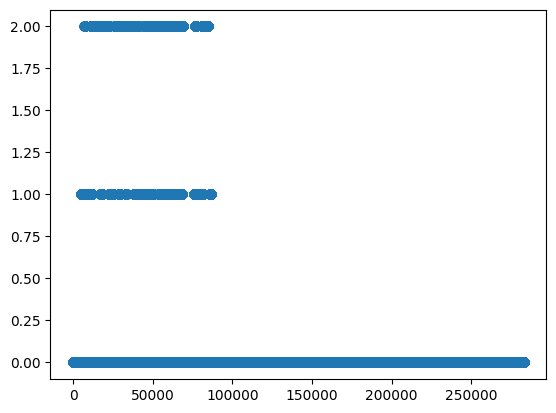

In [ ]:
av = scipy.io.loadmat('/content/drive/My Drive/data_set_IVa_av.mat')
cnt_data = av['cnt']

mrk_data = av['mrk']

print(mrk_data[0][0][1][0][279])
print(mrk_data[0][0][1][0].shape)

lapID = np.zeros((cnt_data.shape[0], 3))
for i in range(mrk_data[0][0][1][0].shape[0]):
    ind_start = mrk_data[0][0][0][0][i]
    lapID[ind_start : ind_start + 350, 0] = i
    lapID[ind_start : ind_start + 350, 1] = mrk_data[0][0][1][0][i]
    lapID[ind_start : ind_start + 350, 2] = 1 if mrk_data[0][0][1][0][i] in [1, 2] else 0
   # lapID[i, 3] = 1 if lapID[i, 2] == 1 else 0  # What does the phase here should be. HELP

print(lapID)


plt.plot(lapID[:,1], 'o')



In [ ]:
def test_train(lapID, which_phase, n_folds=5, which_fold=0):
    """
    Returns test and train samples

    Parameters:
    - lapID: contains info about trial number and maze arm of each sample
    - which_phase: which phase of the session to use (see get_data\get_behav for info)
    - n_folds: how many folds to assign
    - which_fold: which fold to return values for

    Returns:
    - train_inds: which samples to use for training model
    - test_inds: which samples to use for testing model
    """
    ctr = np.zeros(3)
    use_sample = lapID[:, 2] == which_phase
    if which_phase == 2:
        use_sample = use_sample & (lapID[:, 2])  # only use correct trials
    fold_assign = -np.ones(np.size(use_sample))
    for i in range(int(np.max(lapID[:, 0]))):
        inds = (lapID[:, 0] == i) & use_sample
        if np.sum(inds):
            which_arm = int(lapID[inds, 1][0])
            fold_assign[inds] = ctr[which_arm] % n_folds
            ctr[which_arm] += 1
    test_inds = fold_assign == which_fold
    train_inds = np.isin(fold_assign, np.arange(n_folds)) & ~test_inds
    train_inds = helpers.balanced_indices(lapID[:, 1], train_inds)
    return test_inds, train_inds


## 0Hz Filter


In [ ]:
#oHz filter
hp_data=cnt_data-np.mean(cnt_data,axis=1)[:,None]
np.shape(hp_data)

(283042, 118)

## Linear model

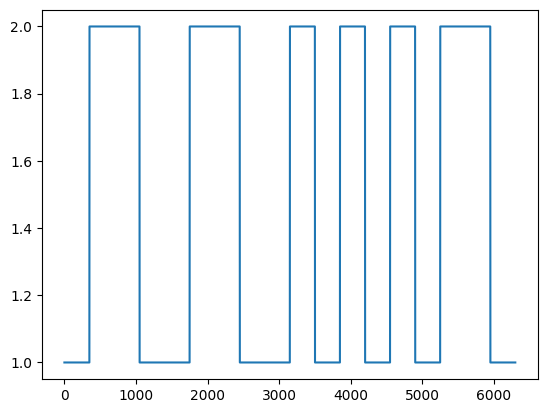

In [ ]:
test_inds, train_inds = test_train(lapID[:,],1,5,0) #last three arguments obtained form code below
#wLFPs, _, _ = helpers.whiten(hp_data, train_inds)

plt.plot(lapID[test_inds,1])

In [ ]:
# lapID array: 4 columns: 1- trial # (0-n); 2- which category(0, 1); 3- correct trial? (Na = incorrect; 1 for correct, 0 for na); 4- phase (1 for the position that have valid trials)
print(lapID[:,1])

[0. 0. 0. ... 0. 0. 0.]


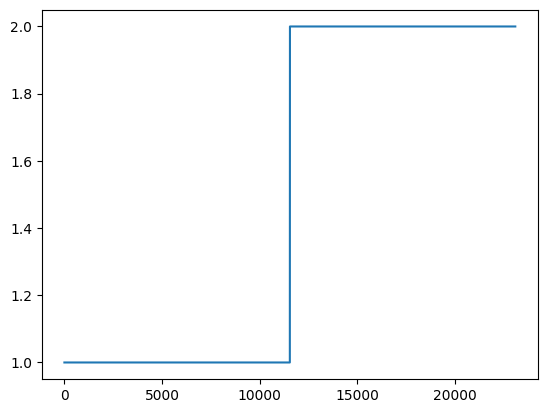

In [ ]:
plt.plot(lapID[train_inds, 1])

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.exceptions import NotFittedError
from sklearn.preprocessing import LabelEncoder


fs = 100
segment_length = int(3.5*fs)
X_train = hp_data[train_inds]
y_train = lapID[train_inds, 1].astype(int)
X_test = hp_data[test_inds]
y_test = lapID[test_inds, 1].astype(int)

# Encode the class labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)
# Ensure labels are encoded as integers if needed
y_train_encoded = y_train.astype(int)
y_test_encoded = y_test.astype(int)


### Optimizing hyperparameters

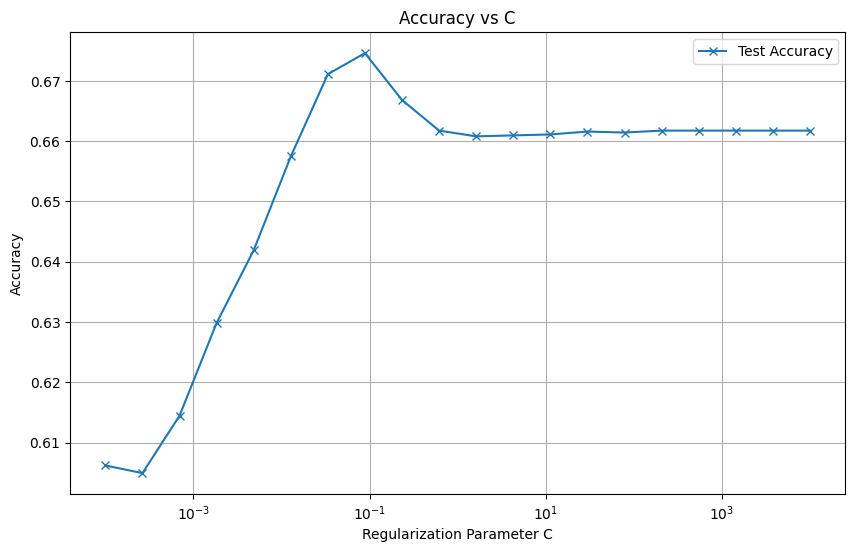

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler

# Normalize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define a range of C values (inverse of regularization strength)
C_values = np.logspace(-4, 4, 20)

# Lists to store accuracy values
train_accuracies = []
test_accuracies = []

# Train and evaluate the model for each C value
for C in C_values:
    model = LogisticRegression(C=C, penalty='l2', solver='liblinear', max_iter=10000)
    model.fit(X_train_scaled, y_train)

    train_accuracy = accuracy_score(y_train, model.predict(X_train_scaled))
    test_accuracy = accuracy_score(y_test, model.predict(X_test_scaled))

    train_accuracies.append(train_accuracy)
    test_accuracies.append(test_accuracy)

# Plot the accuracy as a function of C
plt.figure(figsize=(10, 6))
#plt.plot(C_values, train_accuracies, label='Train Accuracy', marker='o')
plt.plot(C_values, test_accuracies, label='Test Accuracy', marker='x')
plt.xscale('log')
plt.xlabel('Regularization Parameter C')
plt.ylabel('Accuracy')
plt.title('Accuracy vs C')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
best_c_index = np.argmax(test_accuracies)
best_c = C_values[best_c_index]
print(f"Best C value: {best_c}")


Best C value: 0.08858667904100823


### Accuracy

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder


logistic_model = LogisticRegression(penalty='l2',max_iter=1000, C=0.08858667904100823, solver='liblinear')
logistic_model.fit(X_train, y_train)

predictions_prob = logistic_model.predict_proba(X_test)
predicted_labels = logistic_model.predict(X_test)

accuracy = accuracy_score(y_test, predicted_labels)
print(f'Accuracy: {accuracy:.4f}')

num_segments = len(predictions_prob) // segment_length
predictions_reshaped = predictions_prob[:num_segments * segment_length].reshape((num_segments, segment_length, -1))
predictions_avg = predictions_reshaped.mean(axis=0)


Accuracy: 0.6622


In [ ]:
segment_length = 350

num_trials = len(predictions_prob) // segment_length
predictions_reshaped = predictions_prob[:num_trials * segment_length].reshape((num_trials, segment_length, -1))

trial_probabilities_multiply = np.prod(predictions_reshaped, axis=1)
trial_predictions_multiply = np.argmax(trial_probabilities_multiply, axis=1)

trial_probabilities_sum = np.sum(predictions_reshaped, axis=1)
trial_predictions_sum = np.argmax(trial_probabilities_sum, axis=1)

true_trial_labels = y_test[::segment_length] -1

trial_accuracy_multiply = accuracy_score(true_trial_labels, trial_predictions_multiply)
trial_accuracy_sum = accuracy_score(true_trial_labels, trial_predictions_sum)

print(f'Trial Accuracy (multiply): {trial_accuracy_multiply:.4f}')
print(f'Trial Accuracy (sum): {trial_accuracy_sum:.4f}')

Trial Accuracy (multiply): 0.7222
Trial Accuracy (sum): 0.6667


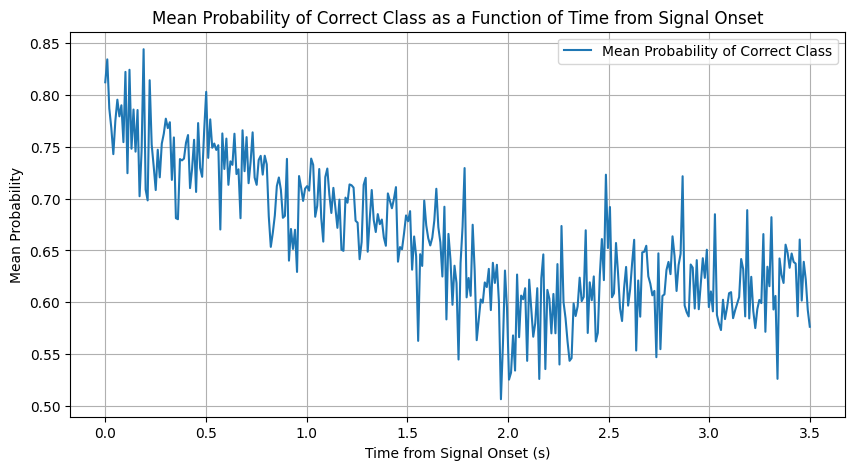

In [ ]:
time = np.linspace(0, segment_length / fs, segment_length)

# Get the number of unique classes
num_classes = predictions_prob.shape[1]

# Ensure y_test is properly encoded to start from 0
label_encoder = LabelEncoder()
y_test_encoded = label_encoder.fit_transform(y_test)

# Reshape and average probabilities for correct class over segments
correct_class_probabilities = []
for i in range(len(y_test_encoded)):
    correct_label = y_test_encoded[i]
    correct_class_probabilities.append(predictions_prob[i][correct_label])

correct_class_probabilities = np.array(correct_class_probabilities)
num_segments = len(correct_class_probabilities) // segment_length
probabilities_reshaped = correct_class_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))
logisticprobabilities_avg = probabilities_reshaped.mean(axis=0)

# Plot mean probabilities as a function of time
plt.figure(figsize=(10, 5))
plt.plot(time, logisticprobabilities_avg, label='Mean Probability of Correct Class')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Mean Probability')
plt.title('Mean Probability of Correct Class as a Function of Time from Signal Onset')
plt.legend()
plt.grid(True)
plt.show()

### Confidence plots


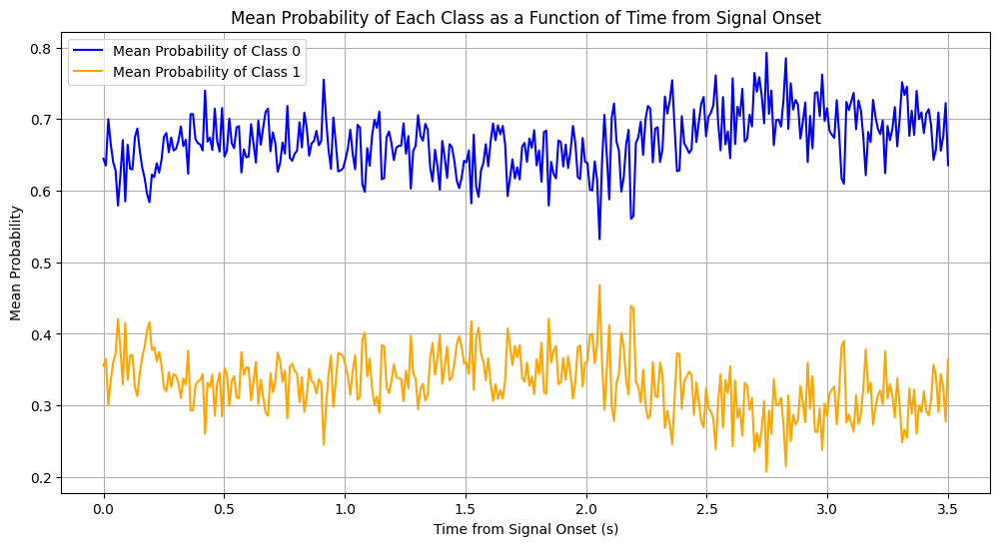

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define segment length based on the sampling frequency (fs)
segment_length = 350

# Extract probabilities for each class
class_0_probabilities = predictions_prob[:, 0]
class_1_probabilities = predictions_prob[:, 1]

# Compute mean probabilities over each segment
num_segments = len(class_0_probabilities) // segment_length
class_0_probabilities_reshaped = class_0_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))
class_1_probabilities_reshaped = class_1_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))

class_0_probabilities_avg = class_0_probabilities_reshaped.mean(axis=0)
class_1_probabilities_avg = class_1_probabilities_reshaped.mean(axis=0)

# Time array for plotting
time = np.linspace(0, segment_length / fs, segment_length)

# Plotting the mean probabilities for each class
plt.figure(figsize=(12, 6))
plt.plot(time, class_0_probabilities_avg, label='Mean Probability of Class 0', color='blue')
plt.plot(time, class_1_probabilities_avg, label='Mean Probability of Class 1', color='orange')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Mean Probability')
plt.title('Mean Probability of Each Class as a Function of Time from Signal Onset')
plt.legend()
plt.grid(True)
plt.show()


## 2Hz HP Filter


In [ ]:
#Hp 2Hz
hp_data = helpers.filter_data(cnt_data, 2, 100, filt_type='high', use_hilbert=True)
np.shape(hp_data)

(283042, 118)

## CSP

In [ ]:
from mne.decoding import CSP
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import scipy.io

# Select relevant data and labels
lapTrue = lapID[lapID[:, 2].astype(bool), :]
test_inds, train_inds = test_train(lapTrue, 1, n_folds=5, which_fold=0)
valid_hp_data = hp_data[lapID[:, 2].astype(bool)]

n_channels = valid_hp_data.shape[1]
n_times = 350
n_trials = valid_hp_data.shape[0] // n_times
fs=100

print(f"Calculated number of trials: {n_trials}")

# Reshape the data to (n_trials, n_channels, n_times)
eeg_data = valid_hp_data.reshape((n_trials, n_times, n_channels)).transpose(0, 2, 1)
eeg_data = np.abs(eeg_data)

print(f"Shape of eeg_data after reshaping: {eeg_data.shape}")

# Create labels
labels = lapTrue[:, 1][::n_times] - 1  # Adjust labels to be 0 and 1

# Filter train_inds and test_inds to be within n_trials
train_inds = np.where(train_inds[:: n_times])[0]
test_inds = np.where(test_inds[:: n_times])[0]

# Create train and test sets using the indices from test_train function
X_train = eeg_data[train_inds]
X_test = eeg_data[test_inds]
y_train = labels[train_inds]
y_test = labels[test_inds]

# Create a CSP object
csp = CSP(n_components=4, reg='ledoit_wolf', log=True, norm_trace=False)

# Create a pipeline with CSP and SVM
clf = make_pipeline(csp, SVC())

# Fit the model
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')


Calculated number of trials: 84
Shape of eeg_data after reshaping: (84, 118, 350)
Computing rank from data with rank=None
    Using tolerance 4.5e+03 (2.2e-16 eps * 118 dim * 1.7e+17  max singular value)
    Estimated rank (data): 118
    data: rank 118 computed from 118 data channels with 0 projectors
Reducing data rank from 118 -> 118
Estimating class=0.0 covariance using LEDOIT_WOLF
Done.
Estimating class=1.0 covariance using LEDOIT_WOLF
Done.
Accuracy: 0.67


Calculated number of trials: 84
Shape of eeg_data after reshaping: (84, 118, 350)
Computing rank from data with rank=None
    Using tolerance 1.1e+03 (2.2e-16 eps * 118 dim * 4.2e+16  max singular value)
    Estimated rank (data): 118
    data: rank 118 computed from 118 data channels with 0 projectors
Reducing data rank from 118 -> 118
Estimating class=0.0 covariance using LEDOIT_WOLF
Done.
Estimating class=1.0 covariance using LEDOIT_WOLF
Done.
Computing rank from data with rank=None
    Using tolerance 1e+03 (2.2e-16 eps * 118 dim * 3.9e+16  max singular value)
    Estimated rank (data): 118
    data: rank 118 computed from 118 data channels with 0 projectors
Reducing data rank from 118 -> 118
Estimating class=0.0 covariance using LEDOIT_WOLF
Done.
Estimating class=1.0 covariance using LEDOIT_WOLF
Done.
Computing rank from data with rank=None
    Using tolerance 1e+03 (2.2e-16 eps * 118 dim * 4e+16  max singular value)
    Estimated rank (data): 118
    data: rank 118 computed from 

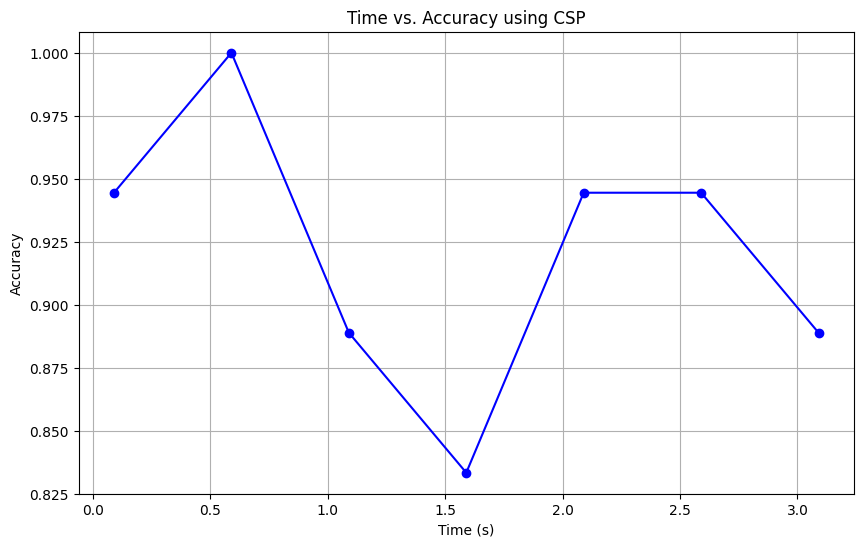

In [ ]:
from mne.decoding import CSP
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np

# Parameters
window_size = len(test_inds)  # Size of the time window in samples
step_size = 50     # Step size for the sliding window in samples
n_components = 4   # Number of CSP components
fs = 100           # Sampling frequency

# Function to compute accuracy over time
def compute_accuracy_over_time(eeg_data, labels, train_inds, test_inds, window_size, step_size, n_components, fs):
    accuracies = []
    times = []

    for start in range(0, eeg_data.shape[2] - window_size + 1, step_size):
        end = start + window_size
        X_window = eeg_data[:, :, start:end]

        # Create a CSP object
        csp = CSP(n_components=n_components, reg='ledoit_wolf', log=True, norm_trace=False)

        # Create a pipeline with CSP and SVM
        clf = make_pipeline(csp, SVC())

        # Split data into train and test sets
        X_train = X_window[train_inds]
        X_test = X_window[test_inds]
        y_train = labels[train_inds]
        y_test = labels[test_inds]

        # Fit the model
        clf.fit(X_train, y_train)

        # Predict on the test set
        y_pred = clf.predict(X_test)

        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred)
        accuracies.append(accuracy)

        # Time corresponding to the middle of the window
        times.append((start + end) / 2 / fs)

    return times, accuracies

# Select relevant data and labels
lapTrue = lapID[lapID[:, 2].astype(bool), :]
test_inds, train_inds = test_train(lapTrue, 1, n_folds=5, which_fold=0)
valid_hp_data = hp_data[lapID[:, 2].astype(bool)]

n_channels = valid_hp_data.shape[1]
n_times = 350
n_trials = valid_hp_data.shape[0] // n_times

print(f"Calculated number of trials: {n_trials}")

# Reshape the data to (n_trials, n_channels, n_times)
eeg_data = valid_hp_data.reshape((n_trials, n_times, n_channels)).transpose(0, 2, 1)
eeg_data = np.abs(eeg_data)

print(f"Shape of eeg_data after reshaping: {eeg_data.shape}")

# Create labels
labels = lapTrue[:, 1][::n_times] - 1  # Adjust labels to be 0 and 1

# Filter train_inds and test_inds to be within n_trials
train_inds = np.where(train_inds[::n_times])[0]
test_inds = np.where(test_inds[::n_times])[0]

# Compute accuracy over time
times, CSPaccuracies = compute_accuracy_over_time(eeg_data, labels, train_inds, test_inds, window_size, step_size, n_components, fs)

# Plot time vs. accuracy
plt.figure(figsize=(10, 6))
plt.plot(times, CSPaccuracies, 'bo-')
plt.xlabel('Time (s)')
plt.ylabel('Accuracy')
plt.title('Time vs. Accuracy using CSP')
plt.grid(True)
plt.show()


###Power spectra

In [ ]:
# Transform the data using the trained CSP
transformed_X_train = csp.transform(X_train)
transformed_X_test = csp.transform(X_test)

# Separate the transformed data by category
cat_0_train = transformed_X_train[y_train == 0]
cat_1_train = transformed_X_train[y_train == 1]
cat_0_test = transformed_X_test[y_test == 0]
cat_1_test = transformed_X_test[y_test == 1]

/usr/local/lib/python3.10/dist-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 100 is greater than input length  = 4, using nperseg = 4
  warnings.warn('nperseg = {0:d} is greater than input length '


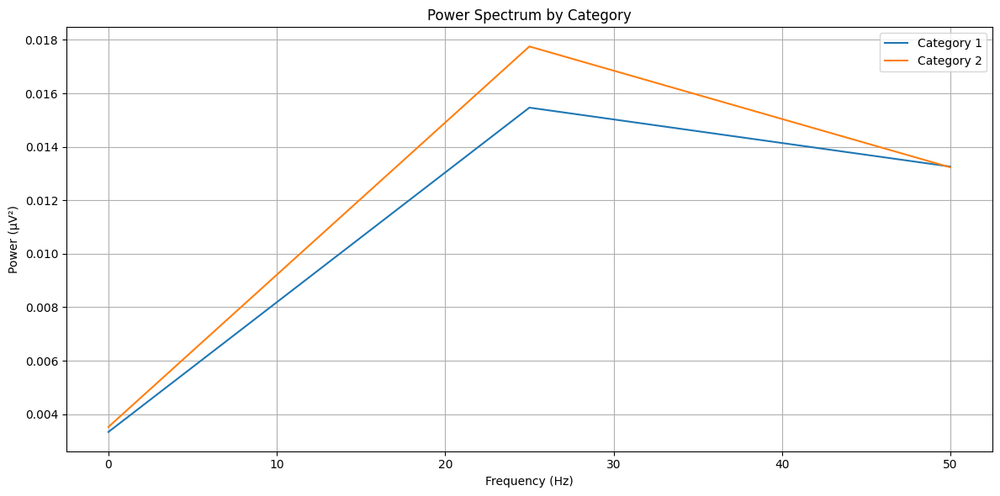

In [ ]:
from scipy.signal import welch
# Function to compute power spectrum
def compute_power_spectrum(data, fs):
    power_spectra = []
    for trial in data:
        f, Pxx = welch(trial, fs, nperseg=fs)
        power_spectra.append(Pxx)
    mean_power_spectrum = np.mean(power_spectra, axis=0)
    return f, mean_power_spectrum
f_cat_0, power_spectrum_cat_0 = compute_power_spectrum(transformed_X_train[y_train == 0], fs)
f_cat_1, power_spectrum_cat_1 = compute_power_spectrum(transformed_X_train[y_train == 1], fs)

# Plot the power spectrum for each category
plt.figure(figsize=(12, 6))

plt.plot(f_cat_0, power_spectrum_cat_0, label='Category 1')
plt.plot(f_cat_1, power_spectrum_cat_1, label='Category 2')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (µV²)')
plt.title('Power Spectrum by Category')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

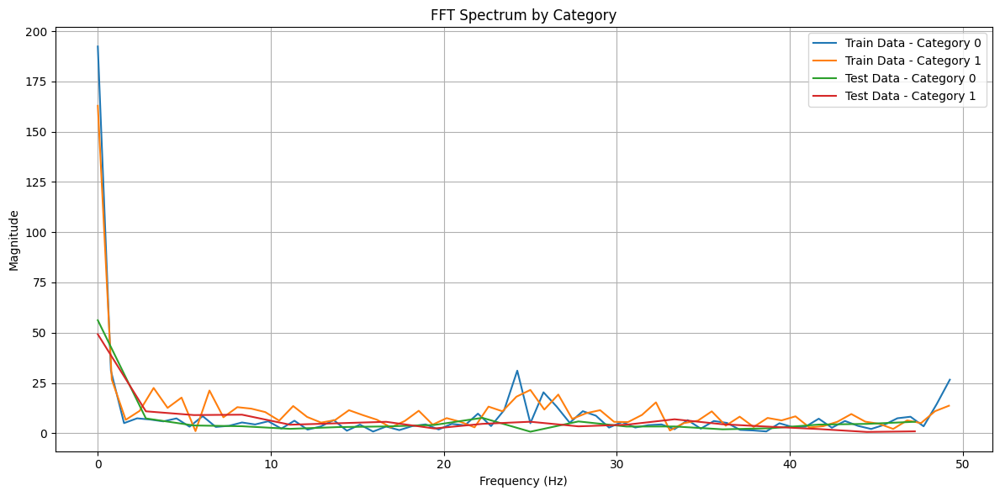

In [ ]:
def compute_fft(eeg_data, fs):
    fft_data = np.fft.fft(eeg_data)
    frequencies = np.fft.fftfreq(len(eeg_data), d=1/fs)
    positive_freq_mask = frequencies >= 0
    frequencies = frequencies[positive_freq_mask]
    fft_data = fft_data[positive_freq_mask]

    fft_magnitude = np.abs(fft_data)
    return frequencies, fft_magnitude

# compute fft for each category
freq_cat0_train, fft_mag_cat0_train = compute_fft(cat_0_train.flatten(), fs)
freq_cat1_train, fft_mag_cat1_train = compute_fft(cat_1_train.flatten(), fs)
freq_cat0_test, fft_mag_cat0_test = compute_fft(cat_0_test.flatten(), fs)
freq_cat1_test, fft_mag_cat1_test = compute_fft(cat_1_test.flatten(), fs)

# plotting FFT
plt.figure(figsize=(12, 6))

plt.plot(freq_cat0_train, fft_mag_cat0_train, label='Train Data - Category 0')
plt.plot(freq_cat1_train, fft_mag_cat1_train, label='Train Data - Category 1')
plt.plot(freq_cat0_test, fft_mag_cat0_test, label='Test Data - Category 0')
plt.plot(freq_cat1_test, fft_mag_cat1_test, label='Test Data - Category 1')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.title('FFT Spectrum by Category')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


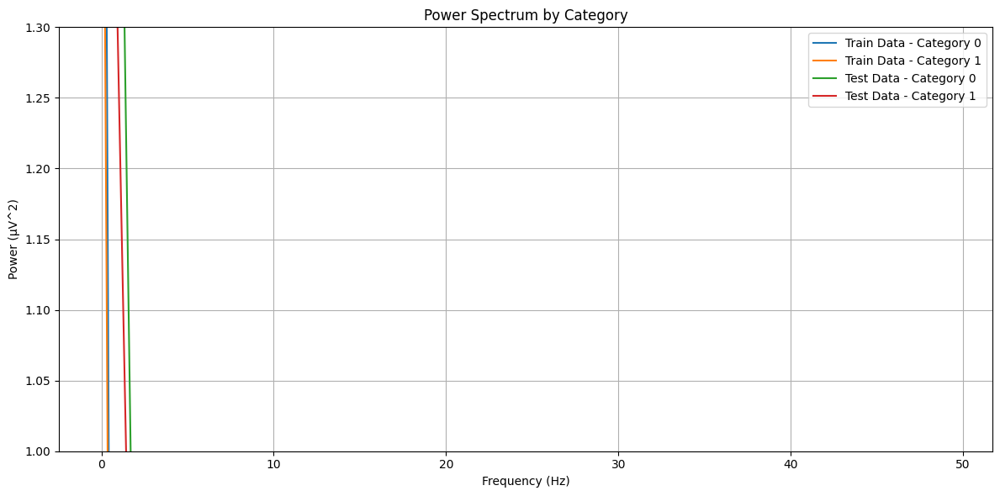

In [ ]:
def compute_power_spectrum(eeg_data, fs):
    N = len(eeg_data)
    xk = (1/N**2) * np.abs(np.fft.fft(eeg_data))**2  # Two-sided power spectrum
    xk = xk[:N//2+1]  # One-sided power spectrum
    xk[1:-1] = 2 * xk[1:-1]  # Double values except for DC and Nyquist

    freq = np.fft.fftfreq(N, d=1/fs)[:N//2+1]  # Frequency axis

    return freq, xk

# Compute power spectrum for each category
freq_cat0_train, power_spectrum_cat0_train = compute_power_spectrum(cat_0_train.flatten(), fs)
freq_cat1_train, power_spectrum_cat1_train = compute_power_spectrum(cat_1_train.flatten(), fs)
freq_cat0_test, power_spectrum_cat0_test = compute_power_spectrum(cat_0_test.flatten(), fs)
freq_cat1_test, power_spectrum_cat1_test = compute_power_spectrum(cat_1_test.flatten(), fs)

# Plot the power spectrum for each category
plt.figure(figsize=(12, 6))

plt.plot(freq_cat0_train[freq_cat0_train >= 0], power_spectrum_cat0_train[freq_cat0_train >= 0], label='Train Data - Category 0')
plt.plot(freq_cat1_train[freq_cat1_train >= 0], power_spectrum_cat1_train[freq_cat1_train >= 0], label='Train Data - Category 1')
plt.plot(freq_cat0_test[freq_cat0_test >= 0], power_spectrum_cat0_test[freq_cat0_test >= 0], label='Test Data - Category 0')
plt.plot(freq_cat1_test[freq_cat1_test >= 0], power_spectrum_cat1_test[freq_cat1_test >= 0], label='Test Data - Category 1')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (µV^2)')
plt.title('Power Spectrum by Category')
plt.legend()
plt.grid(True)
plt.ylim(1, 1.3)
plt.tight_layout()
plt.show()


Plotting CSP Component 1


<ipython-input-99-20291d91f283>:4: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=64).
  plt.specgram(data[i, :], Fs=fs, NFFT=256, noverlap=128, cmap='jet')


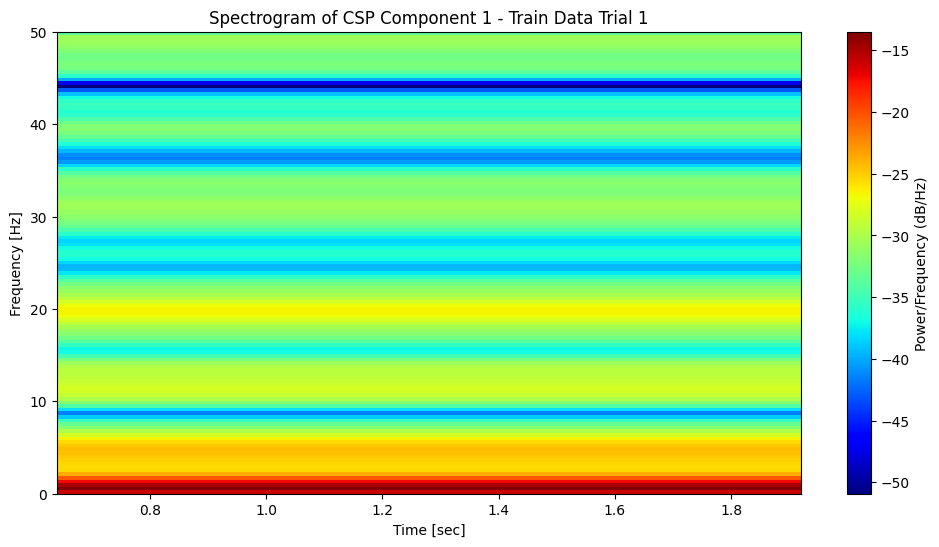

<ipython-input-99-20291d91f283>:4: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=18).
  plt.specgram(data[i, :], Fs=fs, NFFT=256, noverlap=128, cmap='jet')


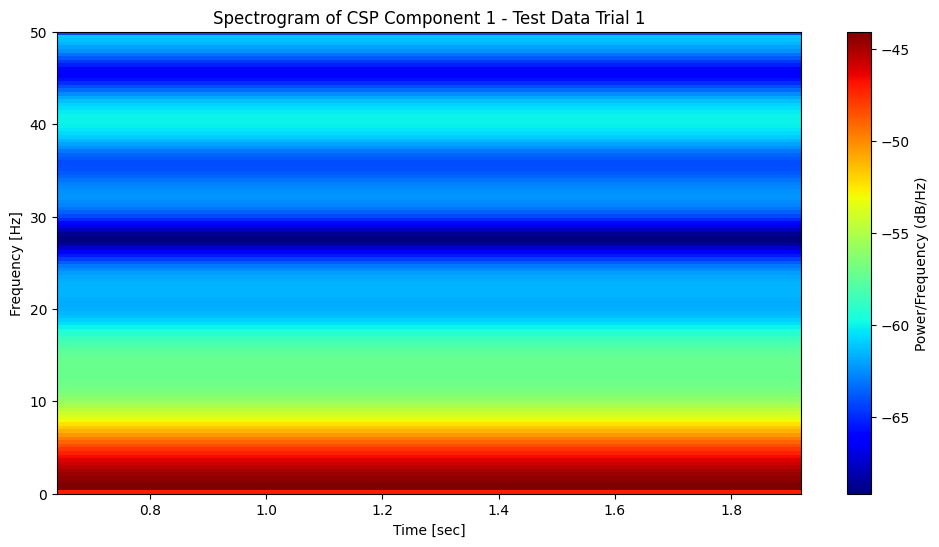

Plotting CSP Component 2


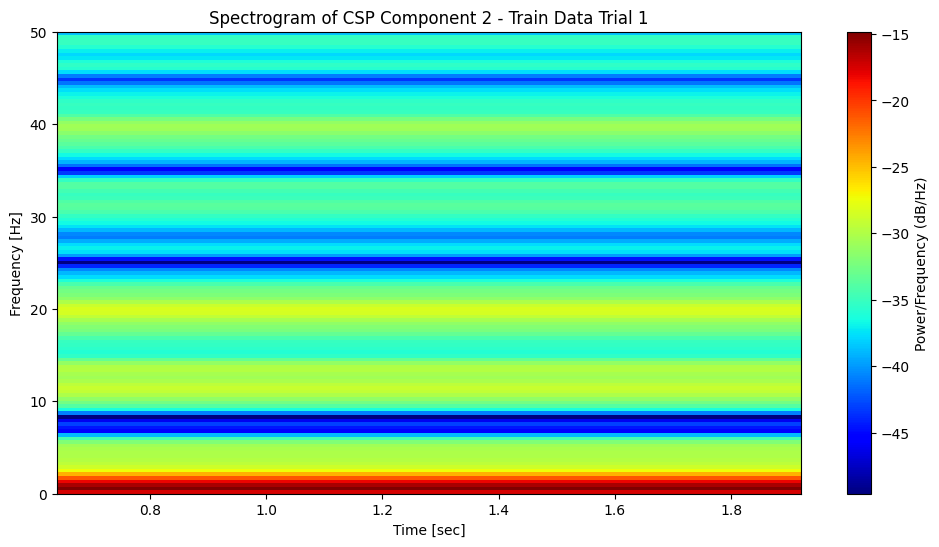

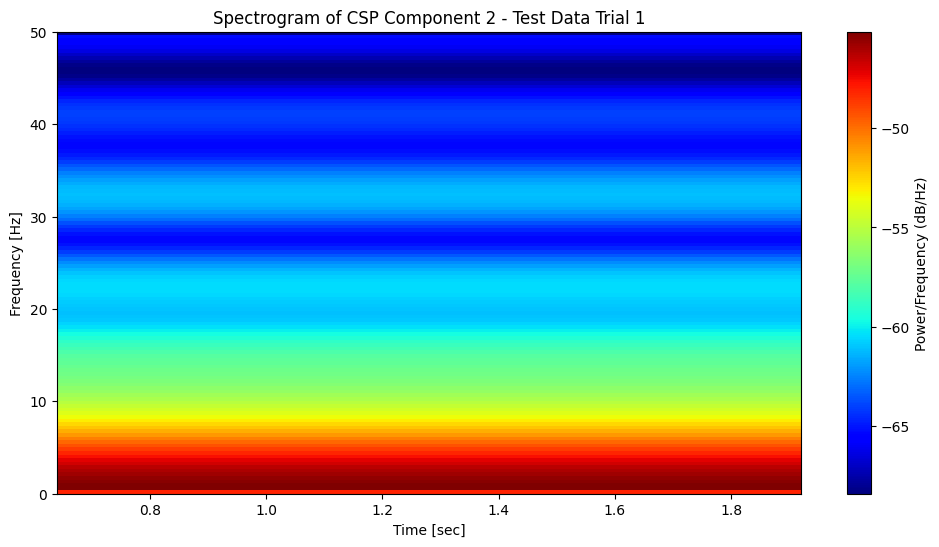

Plotting CSP Component 3


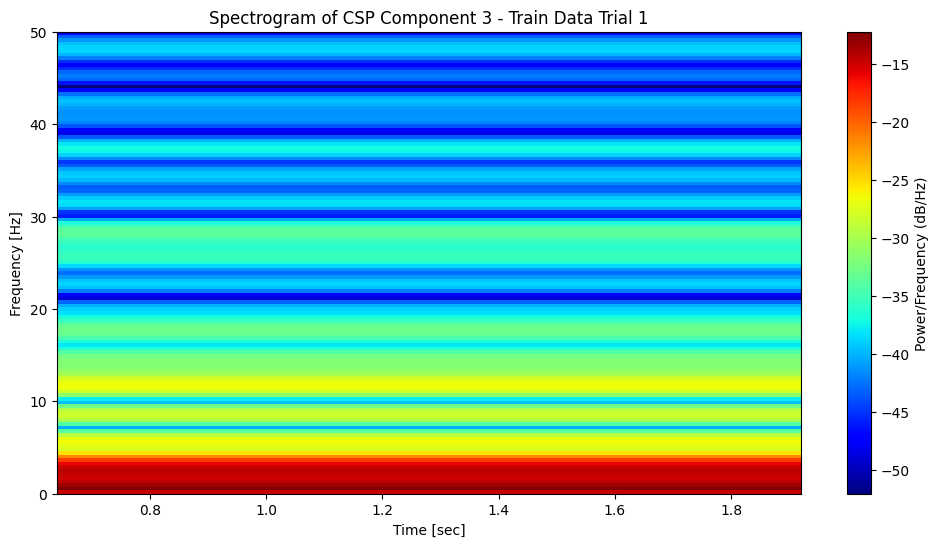

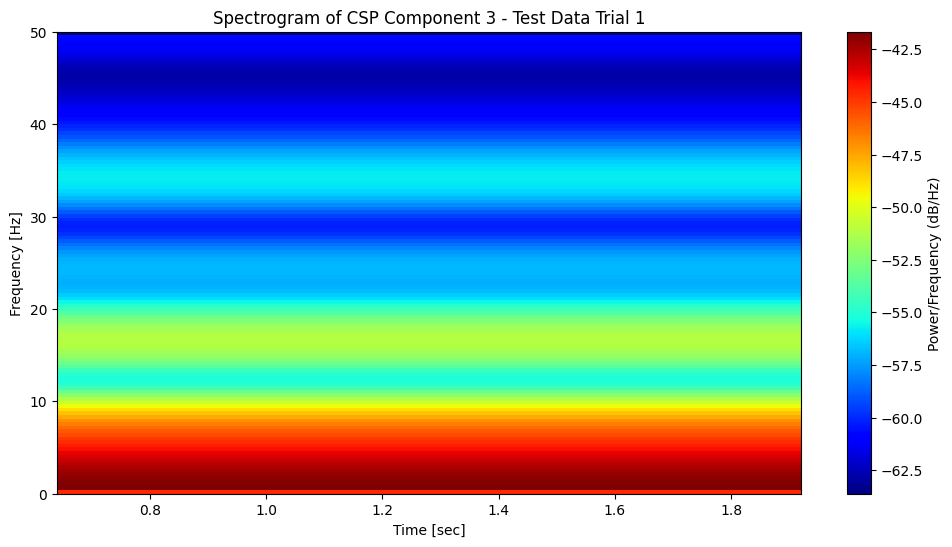

Plotting CSP Component 4


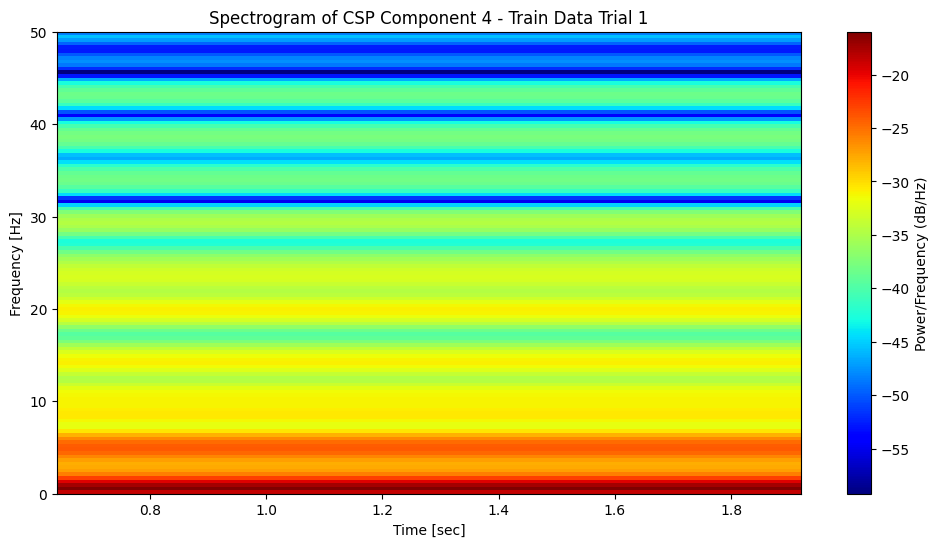

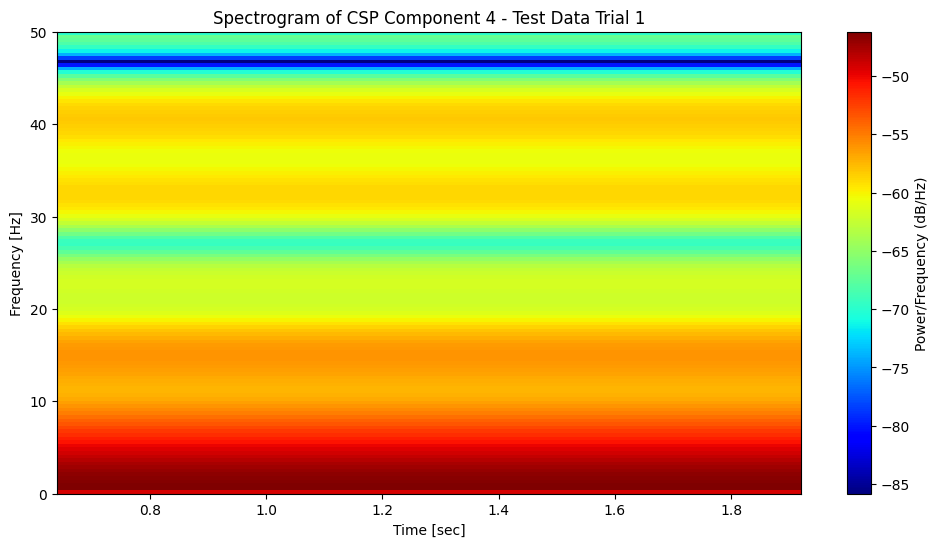

In [ ]:
def plot_spectrogram(data, fs, title):
    plt.figure(figsize=(12, 6))
    for i in range(data.shape[0]):
        plt.specgram(data[i, :], Fs=fs, NFFT=256, noverlap=128, cmap='jet')
        plt.ylabel('Frequency [Hz]')
        plt.xlabel('Time [sec]')
        plt.title(f'{title} Trial {i+1}')
        plt.colorbar(label='Power/Frequency (dB/Hz)')
        plt.show()

# Plotting the spectrogram for each CSP component
for i in range(4):
    print(f'Plotting CSP Component {i+1}')
    plot_spectrogram(transformed_X_train[:, i, np.newaxis].T, fs, f'Spectrogram of CSP Component {i+1} - Train Data')
    plot_spectrogram(transformed_X_test[:, i, np.newaxis].T, fs, f'Spectrogram of CSP Component {i+1} - Test Data')


In [ ]:
# Predictions on a per-sample basis
valid_samples = hp_data[lapID[:, 2].astype(bool)]
sample_labels = lapTrue[:, 1] - 1  # Adjust labels to be 0 and 1

# Calculate the correct number of samples
num_samples = valid_samples.shape[0] // n_times

# Reshape the data to (num_samples, n_channels, n_times)
eeg_samples = valid_samples.reshape((num_samples, n_times, n_channels)).transpose(0, 2, 1)

# Transform the data using the trained CSP
transformed_samples = np.array([csp.transform(epoch[np.newaxis, :, :])[0] for epoch in eeg_samples])

# Ensure the data is real
transformed_samples = np.abs(transformed_samples)

# Predict on the transformed samples
sample_predictions = clf.steps[-1][1].predict(transformed_samples)

# Calculate accuracy for per-sample predictions
sample_accuracy = accuracy_score(sample_labels[:num_samples], sample_predictions)
print(f'Per-sample accuracy: {sample_accuracy:.2f}')

Per-sample accuracy: 0.00



## Training and running TIMBRE

In [ ]:
from TIMBRE.TIMBRE import TIMBRE
np.shape(lapID[:,0])

(283042,)

In [ ]:
# from TIMBRE.TIMBRE import TIMBRE

# fig, axs = plt.subplots(4, 4, figsize=(20, 5))

# trial_phase = 1
# n_folds = 5
# which_fold = 0

# # lapID array: 4 columns: 1- trial # (0-n); 2- which category(0, 1); 3- correct trial? (Na = incorrect; 1 for correct, 0 for na); 4- phase (1 for the position that have valid trials)
# # 350 sample a block,
# # n by 4

# lapTrue = lapID[lapID[:,1].astype(bool),:]
# test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# wLFPs, _, _ = helpers.whiten(hp_data[lapID[:,2].astype(bool)], train_inds)

# #n_bins = 20
# #pos_binned = helpers.group_by_pos(lapID[:,1], n_bins, train_inds)
# #arm_and_pos_binned = lapID[:, 2] * n_bins + pos_binned
# accuracy=np.zeros(axs.shape[0])


# titles = ['Projection (real part)', 'Amplitude', 'Softmax 1', 'Softmax 2 (Output)']
# for i in range(axs.shape[0]):
#     print(f"Training network {i + 1} of {axs.shape[0]} (hidden layer size { 4* 2 ** i})")  # try 4 different hidden layer sizes
#     m, _, accuracy[i] = TIMBRE(wLFPs, lapTrue[:,1], test_inds, train_inds, hidden_nodes = 0)  # train network

#     # Print the shapes of each layer
#     print(f"Input layer shape: {m.input_shape}")
#     for layer in m.layers:
#         print(f"Layer {layer.name} shape: {layer.output_shape}")

#     # for j in range(axs.shape[1]):  # Loop through each layer
#     #     p = helpers.layer_output(wLFPs[test_inds], m, j)  # Calculate layer's response to input, using only test data
#     #     if j == 0:
#     #         p = p[:, :p.shape[1] // 2]  # just get real component for complex-valued output
#     #         axs[i, 0].set_ylabel(str(3 * 2 ** i) + ' features')
#     #     if i == 0:
#     #         axs[0, j].set_title((titles[j]))
#     #     axs[i, j].plot(helpers.accumarray(arm_and_pos_binned[test_inds], p))  # plot mean response of layer to test data as a function of position
#     #     axs[i, j].autoscale(enable=True, axis='both', tight=True)
#     #     if i < axs.shape[0] - 1:
#     #         axs[i, j].set_xticks([])
#     #     else:
#     #         axs[i, j].set_xlabel('Position')
# print(accuracy)

In [ ]:
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
wLFPs, u, Xv = helpers.whiten(hp_data[lapID[:,2].astype(bool)], train_inds)

# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Train the network
model, _, accuracy = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes= 2)
# Use the predict method on the returned model
predictions = model.predict(wLFPs_processed)

print(f"Input layer shape: {model.input_shape}")

for layer in model.layers:
    print(f"Layer {layer.name} shape: {layer.output_shape}")
print(accuracy)

Shape of wLFPs after processing: (29400, 236)
919/919 [==============================] - 3s 3ms/step
Input layer shape: (None, 236)
Layer complex_dense shape: (None, 4)
Layer lambda shape: (None, 2)
Layer activation shape: (None, 2)
Layer dense shape: (None, 2)
0.5338095426559448


In [ ]:
pred_mean=np.mean(predictions,axis=0)
predictions_bin=predictions-pred_mean
predictions_bin=np.argmax(predictions_bin,axis=1)

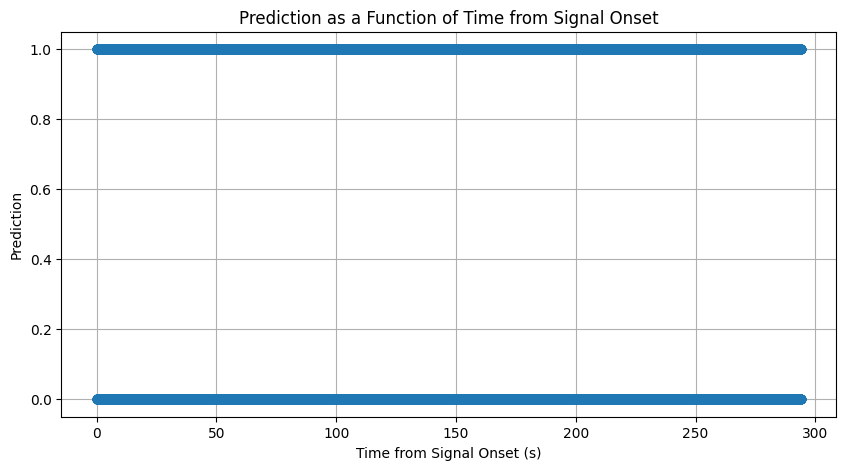

In [ ]:
fs = 100
pred_mean = np.mean(predictions, axis=0)
predictions_bin = predictions - pred_mean

# Find the class with the highest probability
predictions_bin = np.argmax(predictions_bin, axis=1)

# Create a time array matching the length of predictions_bin
time = np.linspace(0, len(predictions_bin) / fs, len(predictions_bin))
time= time.reshape(-2)


plt.figure(figsize=(10, 5))
plt.plot(time, predictions_bin, 'o')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Prediction')
plt.title('Prediction as a Function of Time from Signal Onset')
plt.grid(True)
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score
from keras.models import Model

n_times = 350
n_trials = len(predictions) // n_times

# second_last_layer_output = model.layers[-2].output
# second_last_layer_model = Model(inputs=model.input, outputs=second_last_layer_output)
# second_last_layer_predictions = second_last_layer_model.predict(wLFPs_processed)

weights, biases = model.layers[-1].get_weights()
pre_softmax_predictions = np.dot(predictions, weights) + biases

# Reshape into trials
predictions_reshaped = predictions.reshape((n_trials, n_times, 2))
pre_softmax_predictions_reshaped = pre_softmax_predictions.reshape((n_trials, n_times, 2)) # Ajust to the number of hidden node

def calculate_trial_predictions(predictions_reshaped, pre_softmax_predictions_reshaped, operation):
    if operation == "multiply_before_softmax":
        trial_probabilities = np.prod(pre_softmax_predictions_reshaped, axis=1)
    elif operation == "multiply_after_softmax":
        trial_probabilities = np.prod(predictions_reshaped, axis=1)
    elif operation == "add_before_softmax":
        trial_probabilities = np.sum(pre_softmax_predictions_reshaped, axis=1)
    elif operation == "add_after_softmax":
        trial_probabilities = np.sum(np.log10(predictions_reshaped), axis=1)

    trial_predictions = np.argmax(trial_probabilities, axis=1)
    return trial_predictions

true_trial_labels = lapTrue[:, 1][::n_times] - 1  # Adjust labels to be 0 and 1

operations = ["multiply_before_softmax", "multiply_after_softmax", "add_before_softmax", "add_after_softmax"]
accuracies = {}

for operation in operations:
    trial_predictions = calculate_trial_predictions(predictions_reshaped, pre_softmax_predictions_reshaped, operation)
    trial_accuracy = accuracy_score(true_trial_labels, trial_predictions)
    accuracies[operation] = trial_accuracy
    print(f'Trial Accuracy ({operation}): {trial_accuracy}')

919/919 [==============================] - 2s 2ms/step
Trial Accuracy (multiply_before_softmax): 0.5
Trial Accuracy (multiply_after_softmax): 0.5
Trial Accuracy (add_before_softmax): 0.7619047619047619
Trial Accuracy (add_after_softmax): 0.7619047619047619


###Optimizing learning rate

In [ ]:
pip install keras-tuner

In [ ]:
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
trial_phase = 1
n_folds = 5
which_fold = 0


lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")


def build_model(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds,  train_inds, hidden_nodes=8)

    learn_rate = hp.Choice('learning_rate', values=[1e-5, 1e-4, 1e-3, 1e-2, 1e-1])
    optimizer = Adam(learning_rate=learn_rate)

    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Define the tuner
tuner = kt.Hyperband(
    build_model,
    objective='val_accuracy',
    max_epochs=100,
    factor=3,
    directory='my_dir',
    project_name='intro_to_kt'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)

X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the search
tuner.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best hyperparameters
best_hp = tuner.get_best_hyperparameters()[0]
best_lr = best_hp.get('learning_rate')

print(f'Best learning rate: {best_lr}')

# Build the model with the best hyperparameters and train it
best_model = build_model(best_hp)
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


In [ ]:
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt

# Assumed variables and data
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Define model building function for initial search
values = np.random.shuffle([1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])

def build_model_initial(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values)
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Initial hyperparameter search
tuner_initial = kt.Hyperband(
    build_model_initial,
    objective='val_accuracy',
    max_epochs=50,  # Use a smaller number of epochs for initial search
    factor=3,
    directory='my_dir',
    project_name='initial_lr_search'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)
X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the initial search
tuner_initial.search(X_train, y_train, epochs=50, validation_data=(X_val, y_val))

# Get the best learning rate from the initial search
best_hp_initial = tuner_initial.get_best_hyperparameters()[0]
best_lr_initial = best_hp_initial.get('learning_rate')
print(f'Best learning rate from initial search: {best_lr_initial}')

# Define model building function for refined search
values = np.random.shuffle([best_lr_initial/5, best_lr_initial/10, best_lr_initial/2, best_lr_initial, best_lr_initial*10, best_lr_initial*2, best_lr_initial*5])

def build_model_refined(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values)
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Refined hyperparameter search
tuner_refined = kt.Hyperband(
    build_model_refined,
    objective='val_accuracy',
    max_epochs=100,  # Increase the number of epochs for refined search
    factor=3,
    directory='my_dir',
    project_name='refined_lr_search'
)

# Perform the refined search
tuner_refined.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best learning rate from the refined search
best_hp_refined = tuner_refined.get_best_hyperparameters()[0]
best_lr_refined = best_hp_refined.get('learning_rate')
print(f'Best learning rate from refined search: {best_lr_refined}')

# Visualize the learning rate vs. performance
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
plt.show()

# Build and train the final model with the best learning rate
def build_model_final():
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    optimizer = Adam(learning_rate=best_lr_refined)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

best_model = build_model_final()
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


In [ ]:
# Extract trials and their hyperparameters and metrics
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))

# Print learning rates and validation accuracies in the order they were evaluated
print("Learning Rate | Validation Accuracy")
print("-----------------------------------")
for trial in trials:
    lr = trial.hyperparameters.get('learning_rate')
    val_acc = trial.metrics.get_best_value('val_accuracy')
    print(f"{lr:.5e} | {val_acc:.5f}")

# Plot learning rate vs. validation accuracy with markers indicating the order
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-', label='Validation Accuracy')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
for i, txt in enumerate(range(len(lrs))):
    plt.annotate(txt, (lrs[i], val_accuracies[i]), textcoords="offset points", xytext=(0,10), ha='center')
plt.legend()
plt.show()


In [ ]:
import random
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt

# Assumed variables and data
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Define model building function for initial search
def build_model_initial(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values=[1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Initial hyperparameter search
tuner_initial = kt.Hyperband(
    build_model_initial,
    objective='val_accuracy',
    max_epochs=50,  # Use a smaller number of epochs for initial search
    factor=3,
    directory='my_dir',
    project_name='initial_lr_search'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)
X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the initial search
tuner_initial.search(X_train, y_train, epochs=50, validation_data=(X_val, y_val))

# Get the best learning rate from the initial search
best_hp_initial = tuner_initial.get_best_hyperparameters()[0]
best_lr_initial = best_hp_initial.get('learning_rate')
print(f'Best learning rate from initial search: {best_lr_initial}')

# Define a list of learning rates for the refined search and shuffle it
learning_rates = [best_lr_initial/5, best_lr_initial/10, best_lr_initial/2, best_lr_initial, best_lr_initial*10, best_lr_initial*2, best_lr_initial*5]
random.shuffle(learning_rates)

# Define model building function for refined search with shuffled learning rates
def build_model_refined(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values=learning_rates)
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Custom search function to shuffle the trials
class ShuffledHyperband(kt.Hyperband):
    def run_trial(self, trial, *args, **kwargs):
        random.shuffle(trial.hyperparameters.space['learning_rate'].values)
        super(ShuffledHyperband, self).run_trial(trial, *args, **kwargs)

# Refined hyperparameter search with shuffled trials
tuner_refined = ShuffledHyperband(
    build_model_refined,
    objective='val_accuracy',
    max_epochs=100,  # Increase the number of epochs for refined search
    factor=3,
    directory='my_dir',
    project_name='refined_lr_search'
)

# Perform the refined search
tuner_refined.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best learning rate from the refined search
best_hp_refined = tuner_refined.get_best_hyperparameters()[0]
best_lr_refined = best_hp_refined.get('learning_rate')
print(f'Best learning rate from refined search: {best_lr_refined}')

# Visualize the learning rate vs. performance
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
plt.show()

# Build and train the final model with the best learning rate
def build_model_final():
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    optimizer = Adam(learning_rate=best_lr_refined)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

best_model = build_model_final()
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


In [ ]:
import random
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt

# Assumed variables and data
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Define model building function for initial search
def build_model_initial(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values=[1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Initial hyperparameter search
tuner_initial = kt.Hyperband(
    build_model_initial,
    objective='val_accuracy',
    max_epochs=50,  # Use a smaller number of epochs for initial search
    factor=3,
    directory='my_dir',
    project_name='initial_lr_search'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)
X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the initial search
tuner_initial.search(X_train, y_train, epochs=50, validation_data=(X_val, y_val))

# Get the best learning rate from the initial search
best_hp_initial = tuner_initial.get_best_hyperparameters()[0]
best_lr_initial = best_hp_initial.get('learning_rate')
print(f'Best learning rate from initial search: {best_lr_initial}')

# Define a list of learning rates for the refined search and shuffle it
learning_rates = [best_lr_initial/5, best_lr_initial/10, best_lr_initial/2, best_lr_initial, best_lr_initial*10, best_lr_initial*2, best_lr_initial*5]
random.shuffle(learning_rates)

# Define model building function for refined search
class RefinedHyperModel(kt.HyperModel):
    def __init__(self, learning_rates):
        self.learning_rates = learning_rates
        random.shuffle(self.learning_rates)

    def build(self, hp):
        model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
        learning_rate = hp.Choice('learning_rate', values=self.learning_rates)
        optimizer = Adam(learning_rate=learning_rate)
        model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
        return model

# Refined hyperparameter search
tuner_refined = kt.Hyperband(
    RefinedHyperModel(learning_rates),
    objective='val_accuracy',
    max_epochs=100,  # Increase the number of epochs for refined search
    factor=3,
    directory='my_dir',
    project_name='refined_lr_search'
)

# Perform the refined search
tuner_refined.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best learning rate from the refined search
best_hp_refined = tuner_refined.get_best_hyperparameters()[0]
best_lr_refined = best_hp_refined.get('learning_rate')
print(f'Best learning rate from refined search: {best_lr_refined}')

# Visualize the learning rate vs. performance
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
plt.show()

# Build and train the final model with the best learning rate
def build_model_final():
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    optimizer = Adam(learning_rate=best_lr_refined)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

best_model = build_model_final()
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


### Power Spectrum

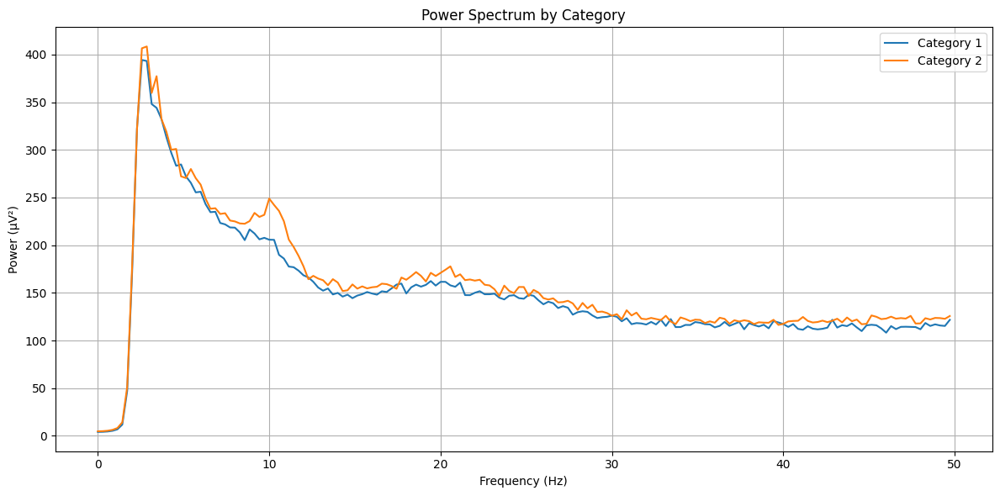

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

fs = 100
segment_length = 350

# Get EEG data for each category
category_1_indices = lapTrue[:, 1] == 1
category_2_indices = lapTrue[:, 1] == 2

eeg_data_cat1 = wLFPs_processed[category_1_indices]
eeg_data_cat2 = wLFPs_processed[category_2_indices]

# Function to compute power spectrum for segments
def compute_power_spectrum(eeg_data, fs, segment_length):
    num_segments = eeg_data.shape[0] // segment_length
    power_spectra = []

    for i in range(num_segments):
        segment = eeg_data[i*segment_length:(i+1)*segment_length, :]
        fft_data = np.fft.fft(segment, axis=0)
        frequencies = np.fft.fftfreq(segment_length, d=1/fs)

        # Take only the first half frequencies
        half_frequencies = frequencies[:len(frequencies)//2]
        fft_data = fft_data[:len(frequencies)//2, :]

        # Compute the power spectrum
        power_spectrum = np.abs(fft_data)**2
        power_spectra.append(np.mean(power_spectrum, axis=1))

    # Average the power spectra across segments
    mean_power_spectrum = np.mean(power_spectra, axis=0)

    return half_frequencies, mean_power_spectrum

# Compute power spectrum for each category
freq_cat1, power_spectrum_cat1 = compute_power_spectrum(eeg_data_cat1, fs, segment_length)
freq_cat2, power_spectrum_cat2 = compute_power_spectrum(eeg_data_cat2, fs, segment_length)

# Plot the power spectrum for each category
plt.figure(figsize=(12, 6))

plt.plot(freq_cat1, power_spectrum_cat1, label='Category 1')
plt.plot(freq_cat2, power_spectrum_cat2, label='Category 2')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (µV²)')
plt.title('Power Spectrum by Category')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


### Accuracy v. time plot


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model

# Define parameters for data processing and model
trial_phase = 1
n_folds = 5
which_fold = 0
fs = 100  # Example sampling frequency in Hz

# Filter out rows where lapID[:, 2] is 0 (invalid samples)
lapTrue = lapID[lapID[:, 2].astype(bool), :]

# Get test and train indices
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)

# Process wLFPs to match expected input shape (concatenate real and imaginary parts)
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Print the shape of the processed data
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Function to calculate average accuracy over time for given hidden nodes
def train_nn(hidden_nodes):
    # Train the network using the TIMBRE function
    model, _, train_accuracy = TIMBRE(wLFPs, lapTrue[:, 1] - 1, test_inds, train_inds, hidden_nodes=hidden_nodes, learn_rate=0.0001)

    # Predict on the test set
    predictions = np.argmax(model.predict(wLFPs_processed[test_inds]), axis=1)  # Predictions for the test set

    # Extract true labels for the test set
    true_labels = lapTrue[test_inds, 1] - 1  # Adjusting labels to match zero-based indexing if necessary

    # Compute accuracy per time point
    accuracy_per_time_point = predictions == true_labels  # Boolean array of True/False

    running_sum = np.zeros(350)
    max_trial_index = int(np.max(lapTrue[:, 0]))
    lapTrue_test = lapTrue[test_inds]

    for i in range(max_trial_index):
        inds = (lapTrue_test[:, 0] == i) & (lapTrue_test[:, 2] == 1)

        if np.sum(inds) > 0:
            trial_data = accuracy_per_time_point[inds]

        running_sum += trial_data

    average_accuracy_by_time = running_sum / max_trial_index

    return average_accuracy_by_time

Shape of wLFPs after processing: (29400, 236)


In [ ]:
# Train TIMBRE on different hidden nodes
hidden_node_sizes = [8]
average_accuracies = {}

for hn in hidden_node_sizes:
    print(f"Training TIMBRE for hidden_nodes={hn}")
    average_accuracies[hn] = train_nn(hn)

Training TIMBRE for hidden_nodes=8
197/197 [==============================] - 2s 5ms/step


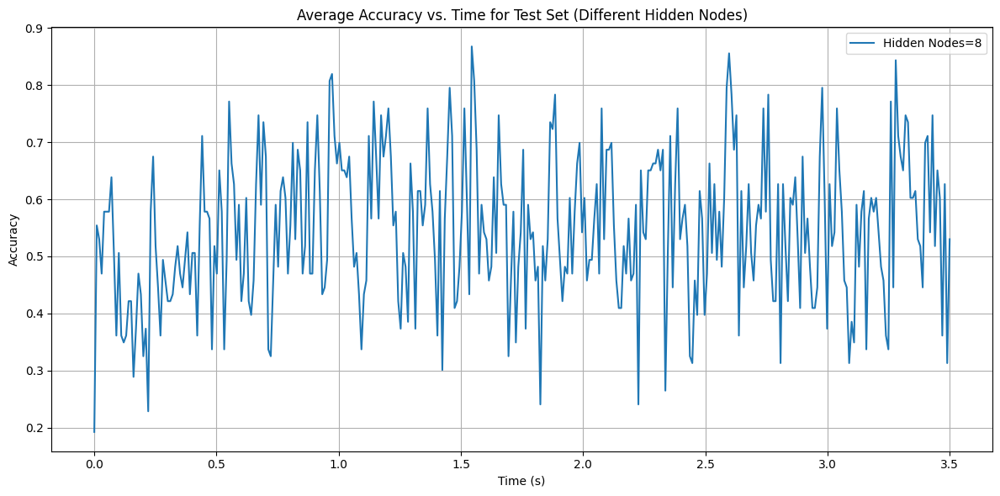

Overall accuracy for hidden nodes=8: 0.55


In [ ]:
# Create a time array for plotting
time_points = np.linspace(0, 350 / fs, 350)

# Plot the averaged accuracy over time for different hidden node sizes
plt.figure(figsize=(12, 6))
# plt.plot(time, logistic_probs, label='Logistic Model', linewidth=2, linestyle='--')

for hn in hidden_node_sizes:
  plt.plot(time_points, average_accuracies[hn], label=f'Hidden Nodes={hn}')

plt.xlabel('Time (s)')
plt.ylabel('Accuracy')
plt.title('Average Accuracy vs. Time for Test Set (Different Hidden Nodes)')
plt.grid(True)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

# Calculate and print the overall accuracy for the test set (example for one hidden node size)
#overall_accuracy_2 = np.mean(average_accuracies[2])
#overall_accuracy_4 = np.mean(average_accuracies[4])
overall_accuracy_8 = np.mean(average_accuracies[8])
#print(f"Overall accuracy for hidden nodes=2: {overall_accuracy_2:.2f}")
#print(f"Overall accuracy for hidden nodes=4: {overall_accuracy_4:.2f}")
print(f"Overall accuracy for hidden nodes=8: {overall_accuracy_8:.2f}")
#print(f"Logistic model: {np.mean(logistic_probs):.4f}")



### Confidence plots

197/197 [==============================] - 1s 2ms/step


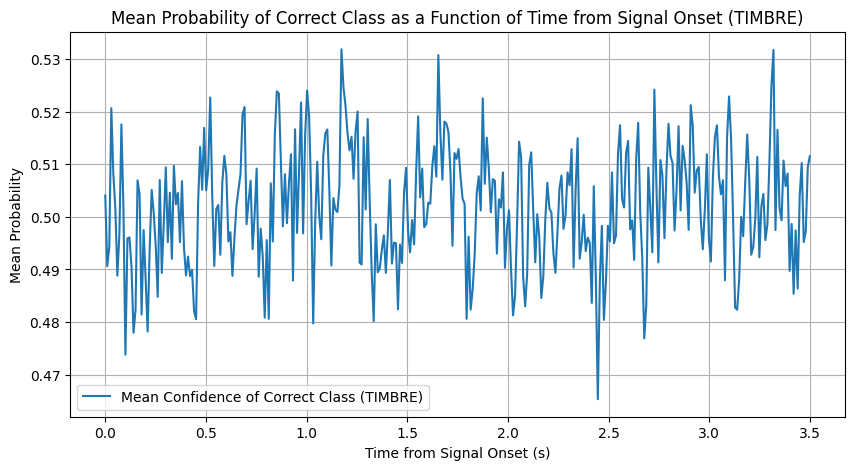

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Train the TIMBRE model

model, _, train_accuracy = TIMBRE(wLFPs, lapTrue[:, 1] - 1, test_inds, train_inds, hidden_nodes=2, learn_rate=1e-4)

correct_label = (lapTrue[test_inds, 1] - 1).astype(int)

# Predict probabilities for the test set
predictions_prob = model.predict(wLFPs_processed[test_inds])

# Extract the confidence levels for the correct class
correct_class_probabilities = []
for i in range(len(wLFPs_processed[test_inds])):
    correct_class_probabilities.append(predictions_prob[i][correct_label[i]])

correct_class_probabilities = np.array(correct_class_probabilities)

# Compute mean probabilities over each segment
segment_length = int(350)
num_segments = len(correct_class_probabilities) // segment_length
probabilities_reshaped = correct_class_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))
TIMBREprobabilities_avg = probabilities_reshaped.mean(axis=0)

# Time array for plotting
time = np.linspace(0, segment_length / fs, segment_length)
time = time.reshape(-1)

# Plotting the mean probabilities of the correct class for the TIMBRE model
plt.figure(figsize=(10, 5))
plt.plot(time, TIMBREprobabilities_avg, label='Mean Confidence of Correct Class (TIMBRE)')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Mean Probability')
plt.title('Mean Probability of Correct Class as a Function of Time from Signal Onset (TIMBRE)')
plt.legend()
plt.grid(True)
plt.show()


### Power plot for hidden node


In [ ]:
#run confidence plots first!
hidden_layer_model = Model(inputs=model.input, outputs=model.layers[0].output)
hidden_layer_activations = hidden_layer_model.predict(wLFPs_processed[test_inds])
correct_label = (lapTrue[test_inds, 1] - 1).astype(int)

197/197 [==============================] - 0s 2ms/step


In [ ]:
hidden_activations_cat1 = [hidden_layer_activations[correct_label == 0, i] for i in range(2)]
hidden_activations_cat2 = [hidden_layer_activations[correct_label == 1, i] for i in range(2)]

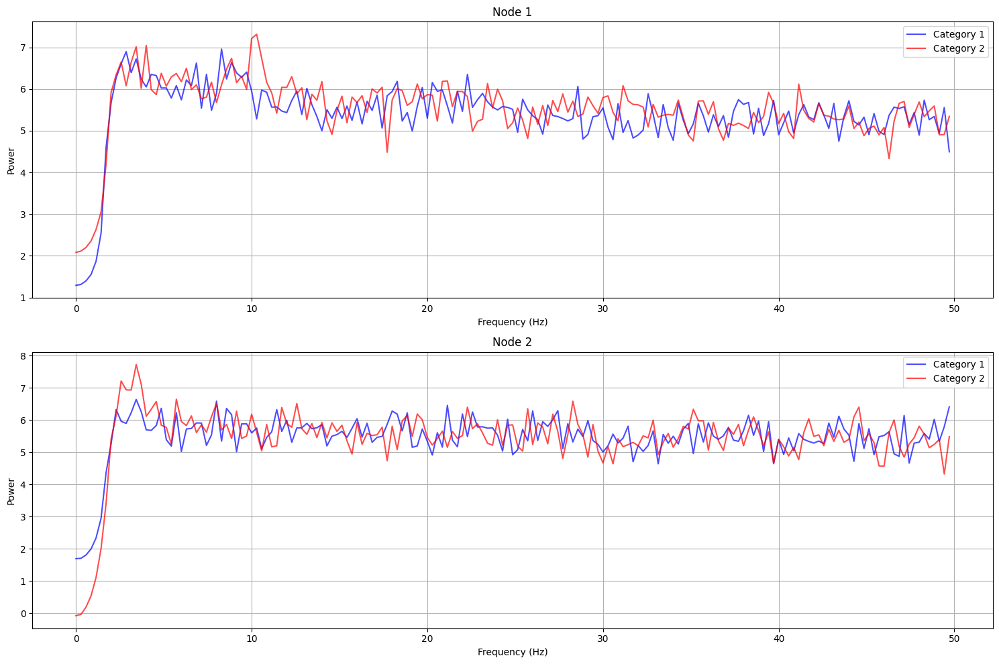

In [ ]:
def compute_power_spectrum(activations, fs, segment_length):
    num_segments = len(activations) // segment_length
    power_spectra = []

    for i in range(num_segments):
        segment = activations[i * segment_length:(i + 1) * segment_length]
        fft_data = np.fft.fft(segment)
        frequencies = np.fft.fftfreq(segment_length, d=1 / fs)

        # Take only the first half frequencies
        half_frequencies = frequencies[:len(frequencies) // 2]
        fft_data = fft_data[:len(frequencies) // 2]

        # Compute the power spectrum
        power_spectrum = np.abs(fft_data) ** 2
        power_spectra.append(power_spectrum)

    # Average the power spectra across segments
    mean_power_spectrum = np.mean(power_spectra, axis=0)

    return half_frequencies, mean_power_spectrum

fs = 100
segment_length = 350

# Compute power spectrum for each hidden node
freq_hidden_nodes_cat1 = []
power_spectrum_hidden_nodes_cat1 = []
freq_hidden_nodes_cat2 = []
power_spectrum_hidden_nodes_cat2 = []


# Function to plot power spectrum for all hidden nodes
def plot_all_power_spectra(frequencies_list_cat1, power_spectrum_list_cat1, frequencies_list_cat2, power_spectrum_list_cat2, num_nodes):
    fig, axes = plt.subplots(num_nodes // 1, 1, figsize=(15, 10))  # Adjust grid size to fit all nodes
    axes = axes.flatten()

    for i in range(num_nodes):
        power_spectrum_cat1 = np.log(power_spectrum_list_cat1[i])
        power_spectrum_cat2 = np.log(power_spectrum_list_cat2[i])

        axes[i].plot(frequencies_list_cat1[i], power_spectrum_cat1, label='Category 1', color='b', alpha=0.7)
        axes[i].plot(frequencies_list_cat2[i], power_spectrum_cat2, label='Category 2', color='r', alpha=0.7)
        axes[i].set_xlabel('Frequency (Hz)')
        axes[i].set_ylabel('Power')
        axes[i].set_title(f'Node {i + 1}')
        axes[i].legend()
        axes[i].grid(True)

    plt.tight_layout()
    plt.show()

# Compute power spectrum for each hidden node
fs = 100
segment_length = 350
hidden_nodes = 2

freq_hidden_nodes_cat1 = []
power_spectrum_hidden_nodes_cat1 = []
freq_hidden_nodes_cat2 = []
power_spectrum_hidden_nodes_cat2 = []

for i in range(hidden_nodes):
    freq_cat1, power_spectrum_cat1 = compute_power_spectrum(hidden_activations_cat1[i], fs, segment_length)
    freq_cat2, power_spectrum_cat2 = compute_power_spectrum(hidden_activations_cat2[i], fs, segment_length)

    freq_hidden_nodes_cat1.append(freq_cat1)
    power_spectrum_hidden_nodes_cat1.append(power_spectrum_cat1)
    freq_hidden_nodes_cat2.append(freq_cat2)
    power_spectrum_hidden_nodes_cat2.append(power_spectrum_cat2)

# Plot all power spectra
plot_all_power_spectra(freq_hidden_nodes_cat1, power_spectrum_hidden_nodes_cat1, freq_hidden_nodes_cat2, power_spectrum_hidden_nodes_cat2, hidden_nodes)


## Anatomical maps

In [ ]:
#positions
info = al['nfo']
x_positions = info['xpos']
x_positions=np.array(x_positions)
X_POS=x_positions.reshape(-3)

y_positions= info['ypos']
y_positions=np.array(y_positions)
Y_POS=y_positions.reshape(-3)

[90 22 74 52 45 23 56 50 44 43]


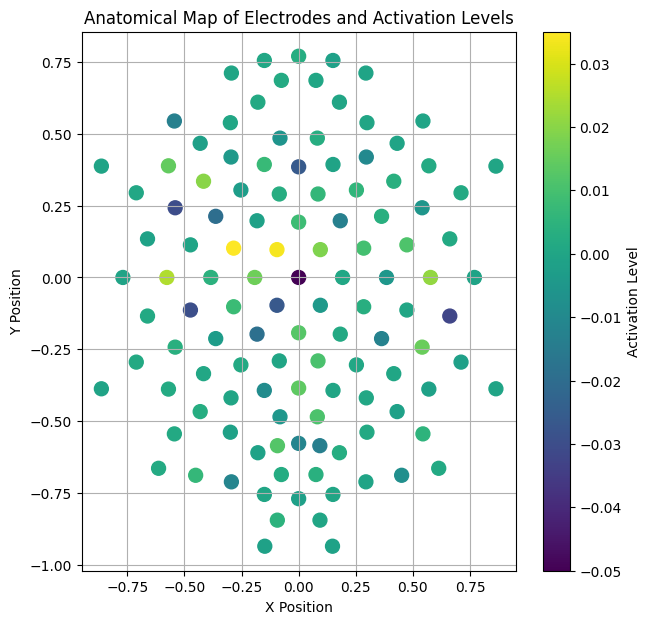

In [ ]:
#Linear model Activation map
activation_levels = logistic_model.coef_[0]
activation_levels = np.array(activation_levels)
top_10_channels = np.argsort(activation_levels)[-10:]
print(top_10_channels)

# Create a scatter plot of the electrode positions
plt.figure(figsize=(7, 7))
plt.scatter(X_POS[0], Y_POS[0], c=activation_levels, cmap='rwb', s=100)
plt.colorbar(label='Activation Level')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.title('Anatomical Map of Electrodes and Activation Levels')
plt.grid(True)
plt.show()


In [ ]:
def unwhiten(X_whitened, u, Xv):
   X_unscaled = X_whitened * Xv
   X_unwhitened = X_unscaled @ u.T
   return X_unwhitened

In [ ]:
LFPs=unwhiten(wLFPs, u, Xv)
LFPs_processed = np.concatenate((np.real(LFPs), np.imag(LFPs)), axis=1)
model.predict(LFPs_processed)

2450/2450 [==============================] - 12s 5ms/step


array([[0.00120289, 0.9987972 ],
       [0.93028146, 0.06971864],
       [0.93030494, 0.06969503],
       ...,
       [0.00120288, 0.9987972 ],
       [0.9783159 , 0.02168406],
       [0.97830963, 0.02169033]], dtype=float32)

[66 63  2  8  1 15 24  7  3  0]


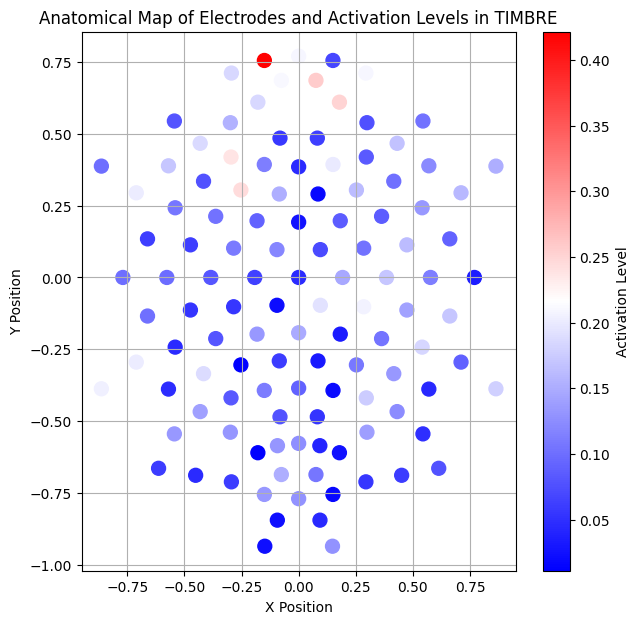

In [ ]:
#TIMBRE activation map
complex_weights = model.layers[0].get_weights()[0]
activation_levels = np.abs(complex_weights[:, 0] + 1j * complex_weights[:, 1])

activation_levels = np.array(activation_levels)

top_10_channels = np.argsort(activation_levels)[-10:]
print(top_10_channels)

plt.figure(figsize=(7, 7))
plt.scatter(X_POS[0], Y_POS[0], c=activation_levels, cmap='bwr', s=100)
plt.colorbar(label='Activation Level')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.title('Anatomical Map of Electrodes and Activation Levels in TIMBRE')
plt.grid(True)
plt.show()


### Complexlm

In [ ]:
real_part = model.layers[0].get_weights()[0]
imag_part = model.layers[0].get_weights()[1]

complex_weights = real_part + 1j * imag_part


if not np.iscomplexobj(complex_weights):
    raise TypeError("The weights are not complex numbers")

real_part = np.real(complex_weights)
imag_part = np.imag(complex_weights)

std_real = np.std(real_part)
print(f'Standard deviation of real part: {std_real}')
std_imag = np.std(imag_part)
print(f'Standard deviation of imaginary part: {std_imag}')


Standard deviation of real part: 0.09195125848054886
Standard deviation of imaginary part: 0.09203896671533585


In [ ]:
# with open('complexIm.m', 'r') as file:
#     content = file.read()
# print(content)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb

def complexIm(in_array, sub=0, pow_val=1, scale=1, setMax=None, h=None):
    # Squeeze the input array to remove singleton dimensions
    in_array = np.squeeze(in_array)

    if sub:
        s = in_array.shape
        in_array_flat = in_array.flatten()
        in_array_flat -= np.mean(in_array_flat)
        in_array_real_imag = np.vstack((in_array_flat.real, in_array_flat.imag)).T
        cov_matrix = np.cov(in_array_real_imag, rowvar=False)
        in_array_flat = in_array_real_imag @ np.linalg.inv(np.sqrt(cov_matrix))
        in_array = (in_array_flat[:, 0] + 1j * in_array_flat[:, 1]).reshape(s)

    if setMax is None:
        setMax = np.percentile(np.abs(in_array), 99.9)

    if h is None:
        hsv_image = np.zeros((*in_array.shape, 3))
        hsv_image[..., 0] = (np.angle(in_array) * scale) % (2 * np.pi) / (2 * np.pi)
        hsv_image[..., 1] = 1
        hsv_image[..., 2] = np.minimum(1, np.power(np.abs(in_array) / setMax, pow_val))
    else:
        hsv_image = np.zeros((*in_array.shape, 3))
        hsv_image[..., 0] = np.angle(h)
        hsv_image[..., 1] = np.minimum(1, np.abs(h) / setMax)
        hsv_image[..., 2] = np.minimum(1, np.power(np.abs(in_array) / setMax, pow_val))

    # Handle NaN values
    hsv_image[..., 0][np.isnan(in_array)] = 1
    hsv_image[..., 2][np.isnan(in_array)] = 1
    hsv_image[..., 1][np.isnan(in_array)] = 0

    # Convert HSV to RGB
    rgb_image = hsv_to_rgb(hsv_image)

    return rgb_image

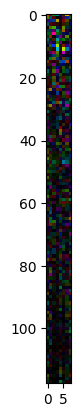

In [ ]:
img=complexIm(complex_weights)
plt.imshow(img)
plt.show()

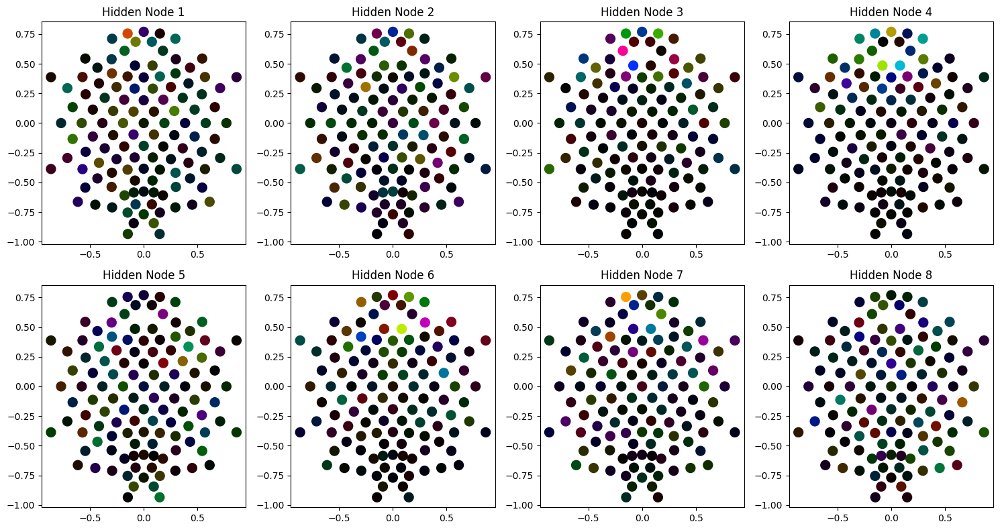

In [ ]:
num_hidden_nodes = img.shape[1]

# Create subplots
fig, axes = plt.subplots(2, 4, figsize=(15, 8))  # Adjust grid size according to number of hidden nodes
axes = axes.flatten()  # Flatten the array of axes for easy iteration

for i in range(num_hidden_nodes):
    # Extract RGB values for the current hidden node
    colors = img[:, i, :]
    scatter = axes[i].scatter(X_POS[0], Y_POS[0], c=colors, s=100)  # Use RGB colors for the scatter plot
    axes[i].set_title(f'Hidden Node {i+1}')

plt.tight_layout()
plt.show()

## Subject across models

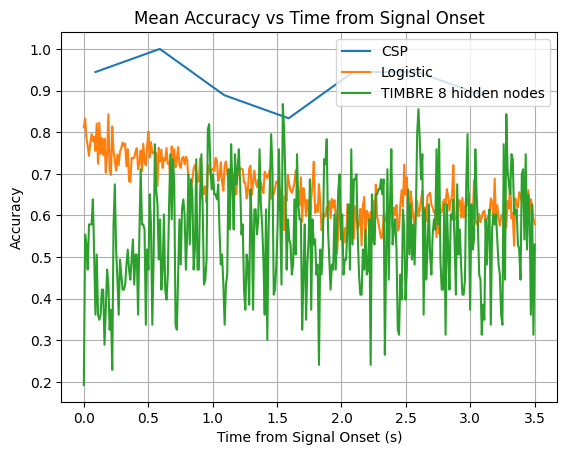

In [ ]:
avCSP = CSPaccuracies
avLogistic = logisticprobabilities_avg
avTIMBRE = average_accuracies[hn]
plt.plot(times, CSPaccuracies, label='CSP')
plt.plot(time, logisticprobabilities_avg, label='Logistic')
plt.plot(time_points, average_accuracies[hn], label=f'TIMBRE {hn} hidden nodes')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Accuracy')
plt.title('Mean Accuracy vs Time from Signal Onset')
plt.legend()
plt.grid(True)
plt.show()

# aw

nan
(280,)
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 ...
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]


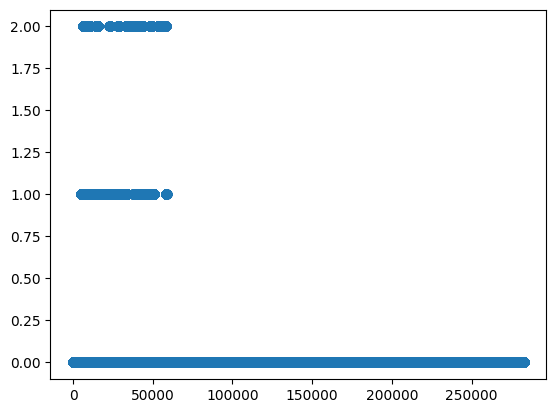

In [ ]:
aw = scipy.io.loadmat('/content/drive/My Drive/data_set_IVa_aw.mat')
cnt_data = aw['cnt']

mrk_data = aw['mrk']

print(mrk_data[0][0][1][0][279])
print(mrk_data[0][0][1][0].shape)

lapID = np.zeros((cnt_data.shape[0], 3))
for i in range(mrk_data[0][0][1][0].shape[0]):
    ind_start = mrk_data[0][0][0][0][i]
    lapID[ind_start : ind_start + 350, 0] = i
    lapID[ind_start : ind_start + 350, 1] = mrk_data[0][0][1][0][i]
    lapID[ind_start : ind_start + 350, 2] = 1 if mrk_data[0][0][1][0][i] in [1, 2] else 0
   # lapID[i, 3] = 1 if lapID[i, 2] == 1 else 0  # What does the phase here should be. HELP

print(lapID)


plt.plot(lapID[:,1], 'o')



In [ ]:
def test_train(lapID, which_phase, n_folds=5, which_fold=0):
    """
    Returns test and train samples

    Parameters:
    - lapID: contains info about trial number and maze arm of each sample
    - which_phase: which phase of the session to use (see get_data\get_behav for info)
    - n_folds: how many folds to assign
    - which_fold: which fold to return values for

    Returns:
    - train_inds: which samples to use for training model
    - test_inds: which samples to use for testing model
    """
    ctr = np.zeros(3)
    use_sample = lapID[:, 2] == which_phase
    if which_phase == 2:
        use_sample = use_sample & (lapID[:, 2])  # only use correct trials
    fold_assign = -np.ones(np.size(use_sample))
    for i in range(int(np.max(lapID[:, 0]))):
        inds = (lapID[:, 0] == i) & use_sample
        if np.sum(inds):
            which_arm = int(lapID[inds, 1][0])
            fold_assign[inds] = ctr[which_arm] % n_folds
            ctr[which_arm] += 1
    test_inds = fold_assign == which_fold
    train_inds = np.isin(fold_assign, np.arange(n_folds)) & ~test_inds
    train_inds = helpers.balanced_indices(lapID[:, 1], train_inds)
    return test_inds, train_inds


## 0Hz Filter


In [ ]:
#oHz filter
hp_data=cnt_data-np.mean(cnt_data,axis=1)[:,None]
np.shape(hp_data)

(282838, 118)

## Linear model

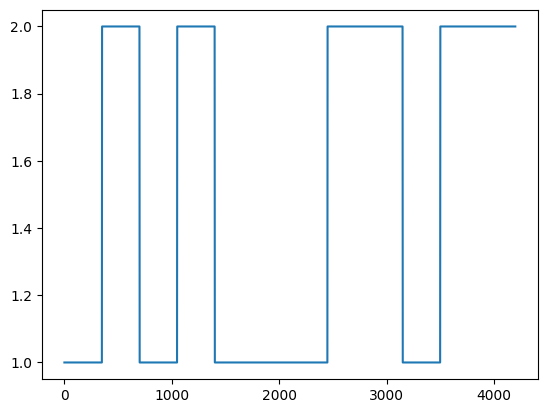

In [ ]:
test_inds, train_inds = test_train(lapID[:,],1,5,0) #last three arguments obtained form code below
#wLFPs, _, _ = helpers.whiten(hp_data, train_inds)

plt.plot(lapID[test_inds,1])

In [ ]:
# lapID array: 4 columns: 1- trial # (0-n); 2- which category(0, 1); 3- correct trial? (Na = incorrect; 1 for correct, 0 for na); 4- phase (1 for the position that have valid trials)
print(lapID[:,1])

[0. 0. 0. ... 0. 0. 0.]


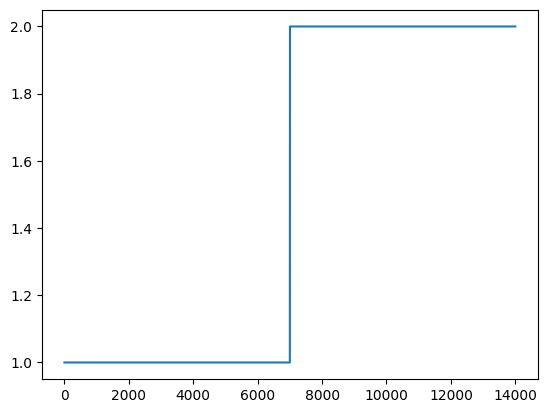

In [ ]:
plt.plot(lapID[train_inds, 1])

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.exceptions import NotFittedError
from sklearn.preprocessing import LabelEncoder


fs = 100
segment_length = int(3.5*fs)
X_train = hp_data[train_inds]
y_train = lapID[train_inds, 1].astype(int)
X_test = hp_data[test_inds]
y_test = lapID[test_inds, 1].astype(int)

# Encode the class labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)
# Ensure labels are encoded as integers if needed
y_train_encoded = y_train.astype(int)
y_test_encoded = y_test.astype(int)


### Optimizing hyperparameters

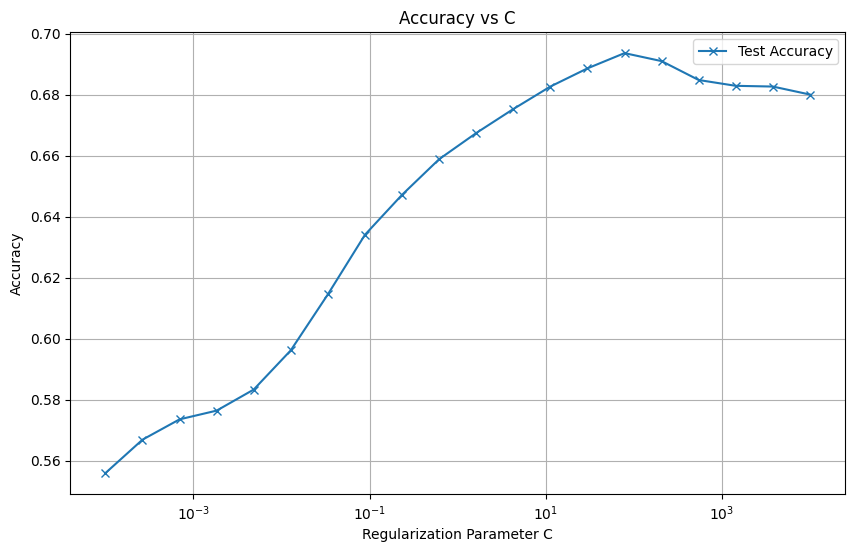

In [ ]:
# Normalize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define a range of C values (inverse of regularization strength)
C_values = np.logspace(-4, 4, 20)

# Lists to store accuracy values
train_accuracies = []
test_accuracies = []

# Train and evaluate the model for each C value
for C in C_values:
    model = LogisticRegression(C=C, penalty='l2', solver='liblinear', max_iter=1000)
    model.fit(X_train_scaled, y_train)

    train_accuracy = accuracy_score(y_train, model.predict(X_train_scaled))
    test_accuracy = accuracy_score(y_test, model.predict(X_test_scaled))

    train_accuracies.append(train_accuracy)
    test_accuracies.append(test_accuracy)

# Plot the accuracy as a function of C
plt.figure(figsize=(10, 6))
#plt.plot(C_values, train_accuracies, label='Train Accuracy', marker='o')
plt.plot(C_values, test_accuracies, label='Test Accuracy', marker='x')
plt.xscale('log')
plt.xlabel('Regularization Parameter C')
plt.ylabel('Accuracy')
plt.title('Accuracy vs C')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
best_c_index = np.argmax(test_accuracies)
best_c = C_values[best_c_index]
print(f"Best C value: {best_c}")


Best C value: 78.47599703514607


### Accuracy

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder


logistic_model = LogisticRegression(penalty='l2',max_iter=1000, C=78.47599703514607, solver='liblinear')
logistic_model.fit(X_train, y_train)

predictions_prob = logistic_model.predict_proba(X_test)
predicted_labels = logistic_model.predict(X_test)

accuracy = accuracy_score(y_test, predicted_labels)
print(f'Accuracy: {accuracy:.4f}')

num_segments = len(predictions_prob) // segment_length
predictions_reshaped = predictions_prob[:num_segments * segment_length].reshape((num_segments, segment_length, -1))
predictions_avg = predictions_reshaped.mean(axis=0)


Accuracy: 0.6698


In [ ]:
segment_length = 350

num_trials = len(predictions_prob) // segment_length
predictions_reshaped = predictions_prob[:num_trials * segment_length].reshape((num_trials, segment_length, -1))

trial_probabilities_multiply = np.prod(predictions_reshaped, axis=1)
trial_predictions_multiply = np.argmax(trial_probabilities_multiply, axis=1)

trial_probabilities_sum = np.sum(predictions_reshaped, axis=1)
trial_predictions_sum = np.argmax(trial_probabilities_sum, axis=1)

true_trial_labels = y_test[::segment_length] -1

trial_accuracy_multiply = accuracy_score(true_trial_labels, trial_predictions_multiply)
trial_accuracy_sum = accuracy_score(true_trial_labels, trial_predictions_sum)

print(f'Trial Accuracy (multiply): {trial_accuracy_multiply:.4f}')
print(f'Trial Accuracy (sum): {trial_accuracy_sum:.4f}')

Trial Accuracy (multiply): 0.6667
Trial Accuracy (sum): 0.6667


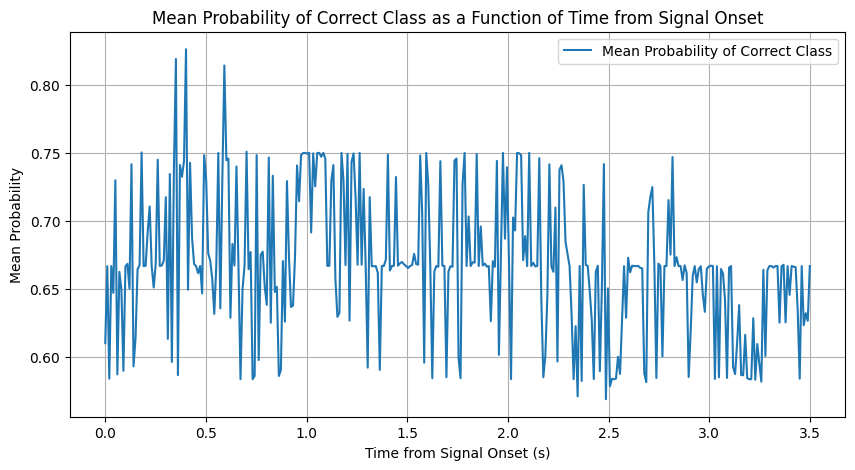

In [ ]:
time = np.linspace(0, segment_length / fs, segment_length)

# Get the number of unique classes
num_classes = predictions_prob.shape[1]

# Ensure y_test is properly encoded to start from 0
label_encoder = LabelEncoder()
y_test_encoded = label_encoder.fit_transform(y_test)

# Reshape and average probabilities for correct class over segments
correct_class_probabilities = []
for i in range(len(y_test_encoded)):
    correct_label = y_test_encoded[i]
    correct_class_probabilities.append(predictions_prob[i][correct_label])

correct_class_probabilities = np.array(correct_class_probabilities)
num_segments = len(correct_class_probabilities) // segment_length
probabilities_reshaped = correct_class_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))
logisticprobabilities_avg = probabilities_reshaped.mean(axis=0)

# Plot mean probabilities as a function of time
plt.figure(figsize=(10, 5))
plt.plot(time, logisticprobabilities_avg, label='Mean Probability of Correct Class')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Mean Probability')
plt.title('Mean Probability of Correct Class as a Function of Time from Signal Onset')
plt.legend()
plt.grid(True)
plt.show()

### Confidence plots


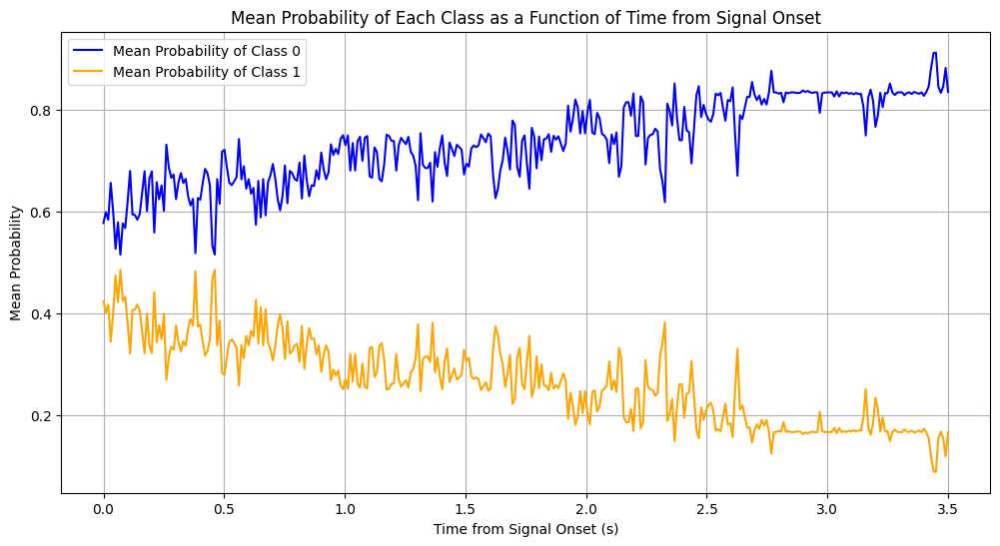

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define segment length based on the sampling frequency (fs)
segment_length = 350

# Extract probabilities for each class
class_0_probabilities = predictions_prob[:, 0]
class_1_probabilities = predictions_prob[:, 1]

# Compute mean probabilities over each segment
num_segments = len(class_0_probabilities) // segment_length
class_0_probabilities_reshaped = class_0_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))
class_1_probabilities_reshaped = class_1_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))

class_0_probabilities_avg = class_0_probabilities_reshaped.mean(axis=0)
class_1_probabilities_avg = class_1_probabilities_reshaped.mean(axis=0)

# Time array for plotting
time = np.linspace(0, segment_length / fs, segment_length)

# Plotting the mean probabilities for each class
plt.figure(figsize=(12, 6))
plt.plot(time, class_0_probabilities_avg, label='Mean Probability of Class 0', color='blue')
plt.plot(time, class_1_probabilities_avg, label='Mean Probability of Class 1', color='orange')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Mean Probability')
plt.title('Mean Probability of Each Class as a Function of Time from Signal Onset')
plt.legend()
plt.grid(True)
plt.show()


## 2Hz HP Filter


In [ ]:
#Hp 2Hz
hp_data = helpers.filter_data(cnt_data, 2, 100, filt_type='high', use_hilbert=True)
np.shape(hp_data)

(282838, 118)

## CSP

In [ ]:
from mne.decoding import CSP
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import scipy.io

# Select relevant data and labels
lapTrue = lapID[lapID[:, 2].astype(bool), :]
test_inds, train_inds = test_train(lapTrue, 1, n_folds=5, which_fold=0)
valid_hp_data = hp_data[lapID[:, 2].astype(bool)]

n_channels = valid_hp_data.shape[1]
n_times = 350
n_trials = valid_hp_data.shape[0] // n_times
fs=100

print(f"Calculated number of trials: {n_trials}")

# Reshape the data to (n_trials, n_channels, n_times)
eeg_data = valid_hp_data.reshape((n_trials, n_times, n_channels)).transpose(0, 2, 1)
eeg_data = np.abs(eeg_data)

print(f"Shape of eeg_data after reshaping: {eeg_data.shape}")

# Create labels
labels = lapTrue[:, 1][::n_times] - 1  # Adjust labels to be 0 and 1

# Filter train_inds and test_inds to be within n_trials
train_inds = np.where(train_inds[:: n_times])[0]
test_inds = np.where(test_inds[:: n_times])[0]

# Create train and test sets using the indices from test_train function
X_train = eeg_data[train_inds]
X_test = eeg_data[test_inds]
y_train = labels[train_inds]
y_test = labels[test_inds]

# Create a CSP object
csp = CSP(n_components=4, reg='ledoit_wolf', log=True, norm_trace=False)

# Create a pipeline with CSP and SVM
clf = make_pipeline(csp, SVC())

# Fit the model
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')


Calculated number of trials: 56
Shape of eeg_data after reshaping: (56, 118, 350)
Computing rank from data with rank=None
    Using tolerance 7e+03 (2.2e-16 eps * 118 dim * 2.7e+17  max singular value)
    Estimated rank (data): 118
    data: rank 118 computed from 118 data channels with 0 projectors
Reducing data rank from 118 -> 118
Estimating class=0.0 covariance using LEDOIT_WOLF
Done.
Estimating class=1.0 covariance using LEDOIT_WOLF
Done.
Accuracy: 0.83


Calculated number of trials: 56
Shape of eeg_data after reshaping: (56, 118, 350)
Computing rank from data with rank=None
    Using tolerance 1e+03 (2.2e-16 eps * 118 dim * 3.9e+16  max singular value)
    Estimated rank (data): 118
    data: rank 118 computed from 118 data channels with 0 projectors
Reducing data rank from 118 -> 118
Estimating class=0.0 covariance using LEDOIT_WOLF
Done.
Estimating class=1.0 covariance using LEDOIT_WOLF
Done.
Computing rank from data with rank=None
    Using tolerance 1.3e+03 (2.2e-16 eps * 118 dim * 5e+16  max singular value)
    Estimated rank (data): 118
    data: rank 118 computed from 118 data channels with 0 projectors
Reducing data rank from 118 -> 118
Estimating class=0.0 covariance using LEDOIT_WOLF
Done.
Estimating class=1.0 covariance using LEDOIT_WOLF
Done.
Computing rank from data with rank=None
    Using tolerance 1.3e+03 (2.2e-16 eps * 118 dim * 5e+16  max singular value)
    Estimated rank (data): 118
    data: rank 118 computed from 

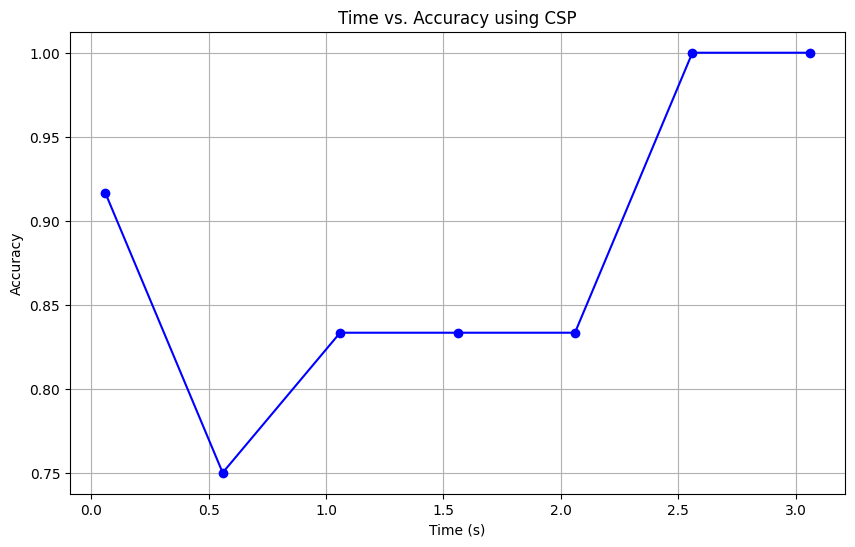

In [ ]:
from mne.decoding import CSP
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np

# Parameters
window_size = len(test_inds)  # Size of the time window in samples
step_size = 50     # Step size for the sliding window in samples
n_components = 4   # Number of CSP components
fs = 100           # Sampling frequency

# Function to compute accuracy over time
def compute_accuracy_over_time(eeg_data, labels, train_inds, test_inds, window_size, step_size, n_components, fs):
    accuracies = []
    times = []

    for start in range(0, eeg_data.shape[2] - window_size + 1, step_size):
        end = start + window_size
        X_window = eeg_data[:, :, start:end]

        # Create a CSP object
        csp = CSP(n_components=n_components, reg='ledoit_wolf', log=True, norm_trace=False)

        # Create a pipeline with CSP and SVM
        clf = make_pipeline(csp, SVC())

        # Split data into train and test sets
        X_train = X_window[train_inds]
        X_test = X_window[test_inds]
        y_train = labels[train_inds]
        y_test = labels[test_inds]

        # Fit the model
        clf.fit(X_train, y_train)

        # Predict on the test set
        y_pred = clf.predict(X_test)

        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred)
        accuracies.append(accuracy)

        # Time corresponding to the middle of the window
        times.append((start + end) / 2 / fs)

    return times, accuracies

# Select relevant data and labels
lapTrue = lapID[lapID[:, 2].astype(bool), :]
test_inds, train_inds = test_train(lapTrue, 1, n_folds=5, which_fold=0)
valid_hp_data = hp_data[lapID[:, 2].astype(bool)]

n_channels = valid_hp_data.shape[1]
n_times = 350
n_trials = valid_hp_data.shape[0] // n_times

print(f"Calculated number of trials: {n_trials}")

# Reshape the data to (n_trials, n_channels, n_times)
eeg_data = valid_hp_data.reshape((n_trials, n_times, n_channels)).transpose(0, 2, 1)
eeg_data = np.abs(eeg_data)

print(f"Shape of eeg_data after reshaping: {eeg_data.shape}")

# Create labels
labels = lapTrue[:, 1][::n_times] - 1  # Adjust labels to be 0 and 1

# Filter train_inds and test_inds to be within n_trials
train_inds = np.where(train_inds[::n_times])[0]
test_inds = np.where(test_inds[::n_times])[0]

# Compute accuracy over time
times, CSPaccuracies = compute_accuracy_over_time(eeg_data, labels, train_inds, test_inds, window_size, step_size, n_components, fs)

# Plot time vs. accuracy
plt.figure(figsize=(10, 6))
plt.plot(times, CSPaccuracies, 'bo-')
plt.xlabel('Time (s)')
plt.ylabel('Accuracy')
plt.title('Time vs. Accuracy using CSP')
plt.grid(True)
plt.show()


###Power spectra

In [ ]:
# Transform the data using the trained CSP
transformed_X_train = csp.transform(X_train)
transformed_X_test = csp.transform(X_test)

# Separate the transformed data by category
cat_0_train = transformed_X_train[y_train == 0]
cat_1_train = transformed_X_train[y_train == 1]
cat_0_test = transformed_X_test[y_test == 0]
cat_1_test = transformed_X_test[y_test == 1]

/usr/local/lib/python3.10/dist-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 100 is greater than input length  = 4, using nperseg = 4
  warnings.warn('nperseg = {0:d} is greater than input length '


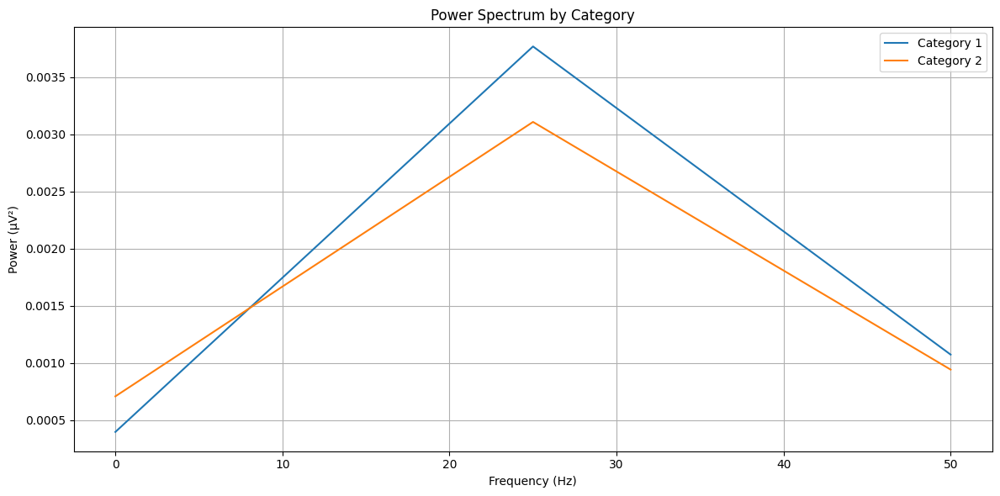

In [ ]:
from scipy.signal import welch
# Function to compute power spectrum
def compute_power_spectrum(data, fs):
    power_spectra = []
    for trial in data:
        f, Pxx = welch(trial, fs, nperseg=fs)
        power_spectra.append(Pxx)
    mean_power_spectrum = np.mean(power_spectra, axis=0)
    return f, mean_power_spectrum
f_cat_0, power_spectrum_cat_0 = compute_power_spectrum(transformed_X_train[y_train == 0], fs)
f_cat_1, power_spectrum_cat_1 = compute_power_spectrum(transformed_X_train[y_train == 1], fs)

# Plot the power spectrum for each category
plt.figure(figsize=(12, 6))

plt.plot(f_cat_0, power_spectrum_cat_0, label='Category 1')
plt.plot(f_cat_1, power_spectrum_cat_1, label='Category 2')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (µV²)')
plt.title('Power Spectrum by Category')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

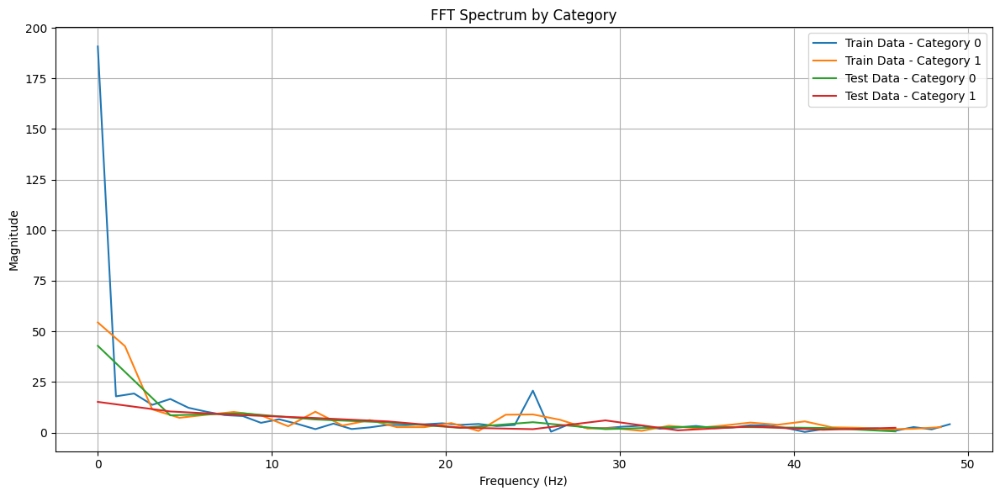

In [ ]:
def compute_fft(eeg_data, fs):
    fft_data = np.fft.fft(eeg_data)
    frequencies = np.fft.fftfreq(len(eeg_data), d=1/fs)
    positive_freq_mask = frequencies >= 0
    frequencies = frequencies[positive_freq_mask]
    fft_data = fft_data[positive_freq_mask]

    fft_magnitude = np.abs(fft_data)
    return frequencies, fft_magnitude

# compute fft for each category
freq_cat0_train, fft_mag_cat0_train = compute_fft(cat_0_train.flatten(), fs)
freq_cat1_train, fft_mag_cat1_train = compute_fft(cat_1_train.flatten(), fs)
freq_cat0_test, fft_mag_cat0_test = compute_fft(cat_0_test.flatten(), fs)
freq_cat1_test, fft_mag_cat1_test = compute_fft(cat_1_test.flatten(), fs)

# plotting FFT
plt.figure(figsize=(12, 6))

plt.plot(freq_cat0_train, fft_mag_cat0_train, label='Train Data - Category 0')
plt.plot(freq_cat1_train, fft_mag_cat1_train, label='Train Data - Category 1')
plt.plot(freq_cat0_test, fft_mag_cat0_test, label='Test Data - Category 0')
plt.plot(freq_cat1_test, fft_mag_cat1_test, label='Test Data - Category 1')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.title('FFT Spectrum by Category')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


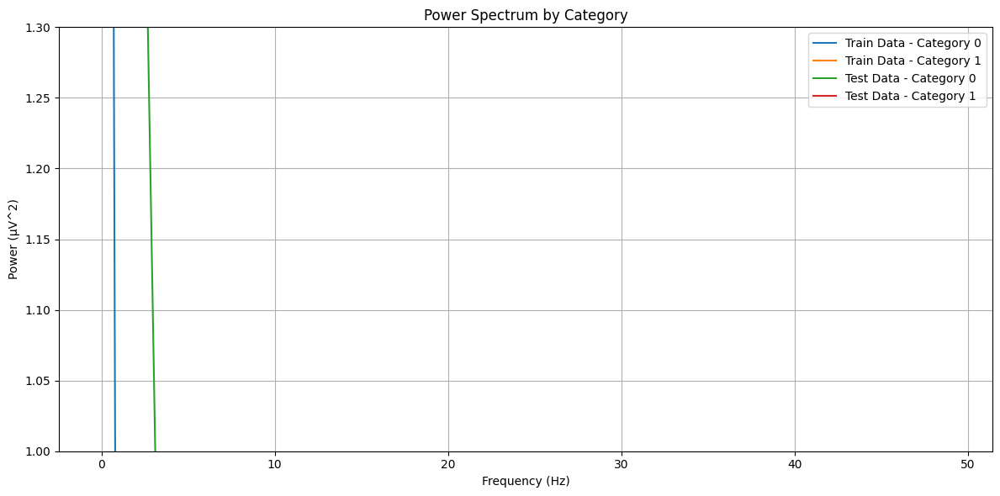

In [ ]:
def compute_power_spectrum(eeg_data, fs):
    N = len(eeg_data)
    xk = (1/N**2) * np.abs(np.fft.fft(eeg_data))**2  # Two-sided power spectrum
    xk = xk[:N//2+1]  # One-sided power spectrum
    xk[1:-1] = 2 * xk[1:-1]  # Double values except for DC and Nyquist

    freq = np.fft.fftfreq(N, d=1/fs)[:N//2+1]  # Frequency axis

    return freq, xk

# Compute power spectrum for each category
freq_cat0_train, power_spectrum_cat0_train = compute_power_spectrum(cat_0_train.flatten(), fs)
freq_cat1_train, power_spectrum_cat1_train = compute_power_spectrum(cat_1_train.flatten(), fs)
freq_cat0_test, power_spectrum_cat0_test = compute_power_spectrum(cat_0_test.flatten(), fs)
freq_cat1_test, power_spectrum_cat1_test = compute_power_spectrum(cat_1_test.flatten(), fs)

# Plot the power spectrum for each category
plt.figure(figsize=(12, 6))

plt.plot(freq_cat0_train[freq_cat0_train >= 0], power_spectrum_cat0_train[freq_cat0_train >= 0], label='Train Data - Category 0')
plt.plot(freq_cat1_train[freq_cat1_train >= 0], power_spectrum_cat1_train[freq_cat1_train >= 0], label='Train Data - Category 1')
plt.plot(freq_cat0_test[freq_cat0_test >= 0], power_spectrum_cat0_test[freq_cat0_test >= 0], label='Test Data - Category 0')
plt.plot(freq_cat1_test[freq_cat1_test >= 0], power_spectrum_cat1_test[freq_cat1_test >= 0], label='Test Data - Category 1')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (µV^2)')
plt.title('Power Spectrum by Category')
plt.legend()
plt.grid(True)
plt.ylim(1, 1.3)
plt.tight_layout()
plt.show()


Plotting CSP Component 1


<ipython-input-132-20291d91f283>:4: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=40).
  plt.specgram(data[i, :], Fs=fs, NFFT=256, noverlap=128, cmap='jet')


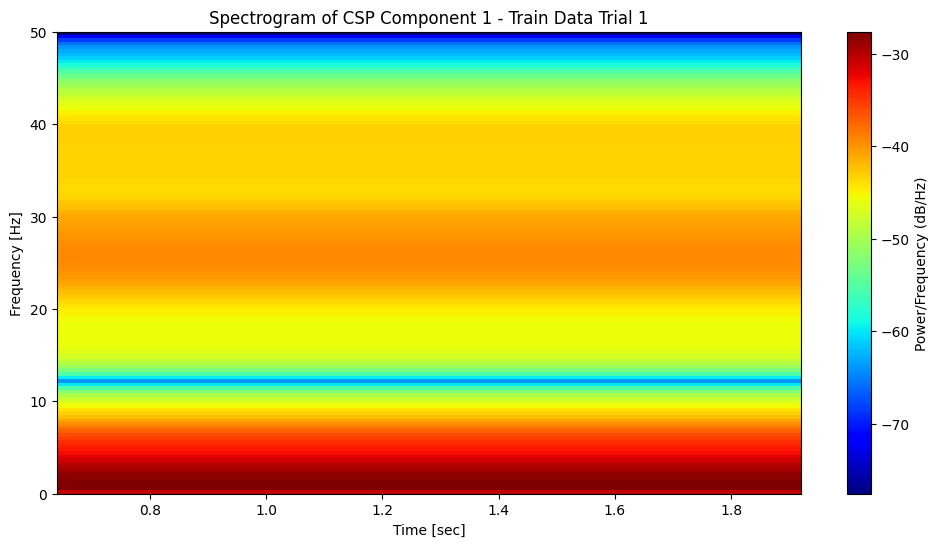

<ipython-input-132-20291d91f283>:4: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=12).
  plt.specgram(data[i, :], Fs=fs, NFFT=256, noverlap=128, cmap='jet')


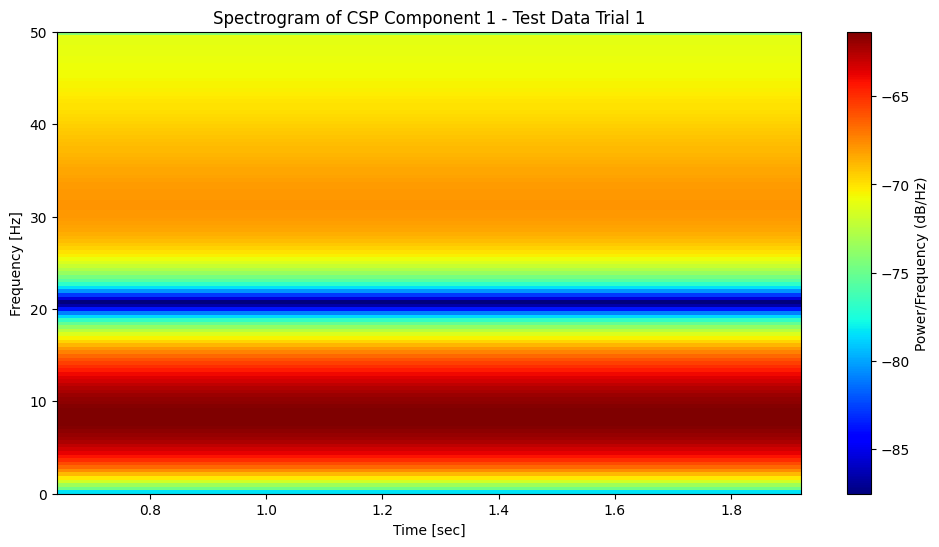

Plotting CSP Component 2


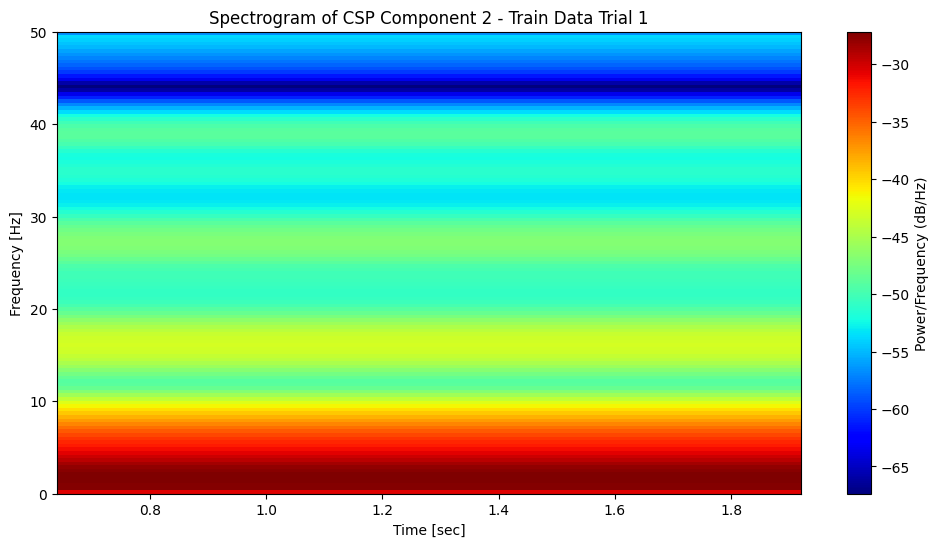

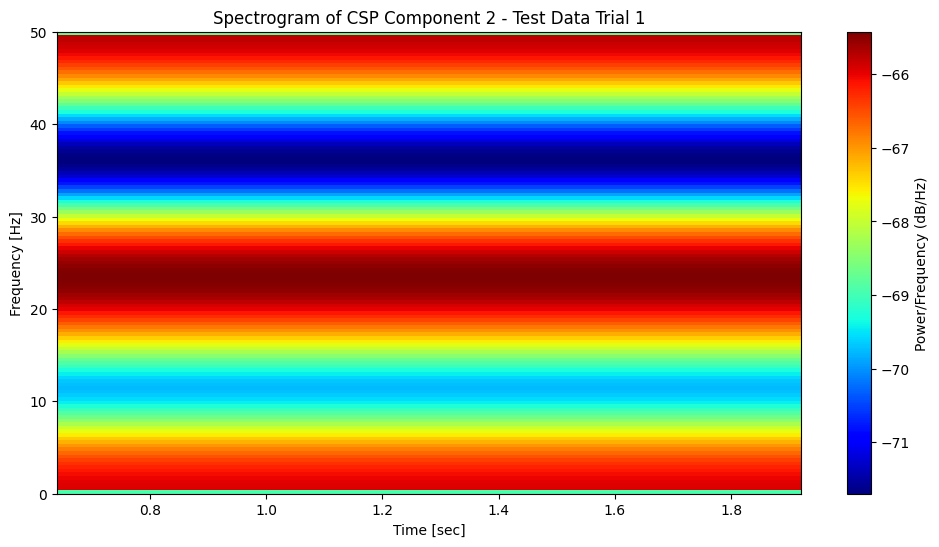

Plotting CSP Component 3


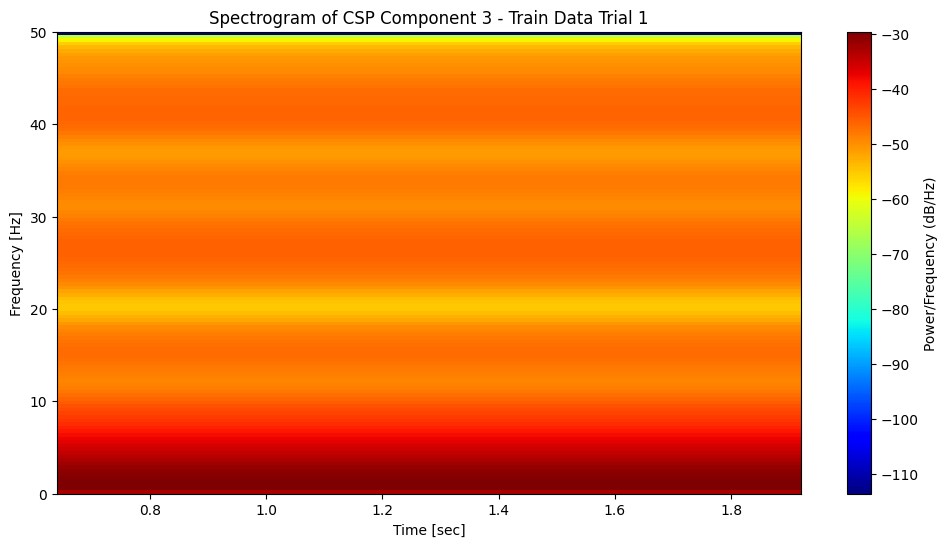

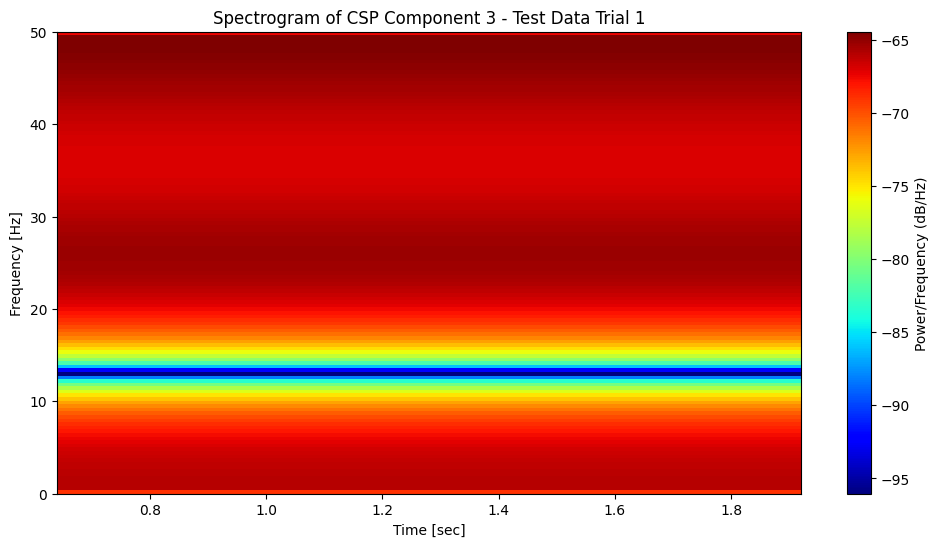

Plotting CSP Component 4


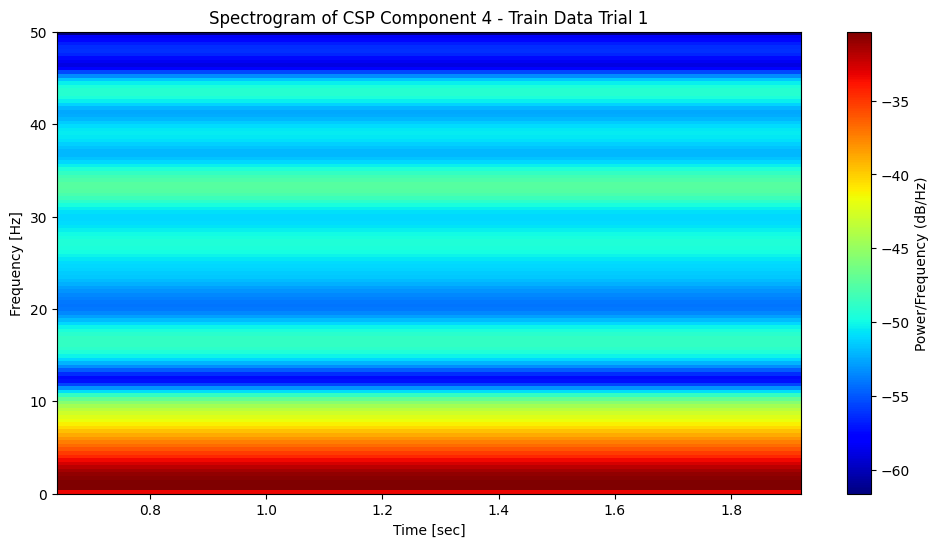

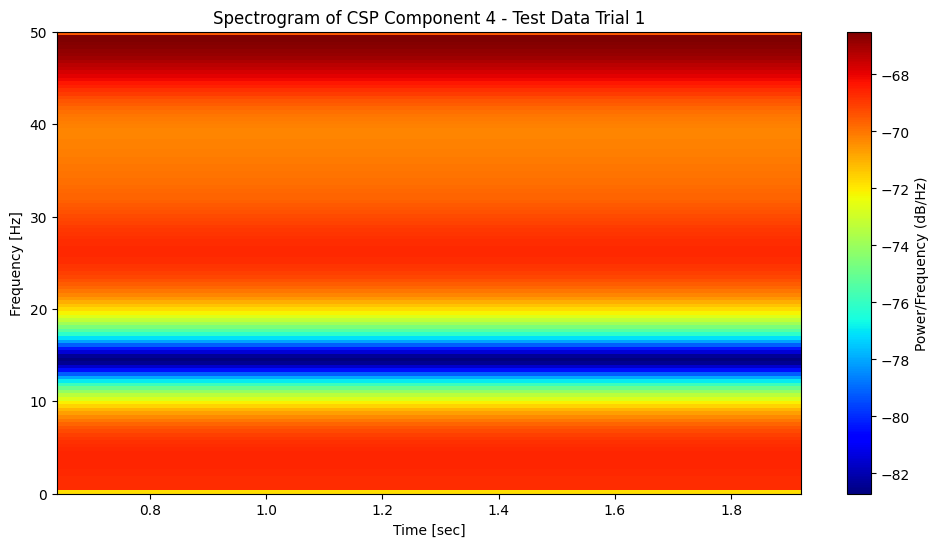

In [ ]:
def plot_spectrogram(data, fs, title):
    plt.figure(figsize=(12, 6))
    for i in range(data.shape[0]):
        plt.specgram(data[i, :], Fs=fs, NFFT=256, noverlap=128, cmap='jet')
        plt.ylabel('Frequency [Hz]')
        plt.xlabel('Time [sec]')
        plt.title(f'{title} Trial {i+1}')
        plt.colorbar(label='Power/Frequency (dB/Hz)')
        plt.show()

# Plotting the spectrogram for each CSP component
for i in range(4):
    print(f'Plotting CSP Component {i+1}')
    plot_spectrogram(transformed_X_train[:, i, np.newaxis].T, fs, f'Spectrogram of CSP Component {i+1} - Train Data')
    plot_spectrogram(transformed_X_test[:, i, np.newaxis].T, fs, f'Spectrogram of CSP Component {i+1} - Test Data')


In [ ]:
# Predictions on a per-sample basis
valid_samples = hp_data[lapID[:, 2].astype(bool)]
sample_labels = lapTrue[:, 1] - 1  # Adjust labels to be 0 and 1

# Calculate the correct number of samples
num_samples = valid_samples.shape[0] // n_times

# Reshape the data to (num_samples, n_channels, n_times)
eeg_samples = valid_samples.reshape((num_samples, n_times, n_channels)).transpose(0, 2, 1)

# Transform the data using the trained CSP
transformed_samples = np.array([csp.transform(epoch[np.newaxis, :, :])[0] for epoch in eeg_samples])

# Ensure the data is real
transformed_samples = np.abs(transformed_samples)

# Predict on the transformed samples
sample_predictions = clf.steps[-1][1].predict(transformed_samples)

# Calculate accuracy for per-sample predictions
sample_accuracy = accuracy_score(sample_labels[:num_samples], sample_predictions)
print(f'Per-sample accuracy: {sample_accuracy:.2f}')

Per-sample accuracy: 0.00



## Training and running TIMBRE

In [ ]:
from TIMBRE.TIMBRE import TIMBRE
np.shape(lapID[:,0])

(282838,)

In [ ]:
# from TIMBRE.TIMBRE import TIMBRE

# fig, axs = plt.subplots(4, 4, figsize=(20, 5))

# trial_phase = 1
# n_folds = 5
# which_fold = 0

# # lapID array: 4 columns: 1- trial # (0-n); 2- which category(0, 1); 3- correct trial? (Na = incorrect; 1 for correct, 0 for na); 4- phase (1 for the position that have valid trials)
# # 350 sample a block,
# # n by 4

# lapTrue = lapID[lapID[:,1].astype(bool),:]
# test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# wLFPs, _, _ = helpers.whiten(hp_data[lapID[:,2].astype(bool)], train_inds)

# #n_bins = 20
# #pos_binned = helpers.group_by_pos(lapID[:,1], n_bins, train_inds)
# #arm_and_pos_binned = lapID[:, 2] * n_bins + pos_binned
# accuracy=np.zeros(axs.shape[0])


# titles = ['Projection (real part)', 'Amplitude', 'Softmax 1', 'Softmax 2 (Output)']
# for i in range(axs.shape[0]):
#     print(f"Training network {i + 1} of {axs.shape[0]} (hidden layer size { 4* 2 ** i})")  # try 4 different hidden layer sizes
#     m, _, accuracy[i] = TIMBRE(wLFPs, lapTrue[:,1], test_inds, train_inds, hidden_nodes = 0)  # train network

#     # Print the shapes of each layer
#     print(f"Input layer shape: {m.input_shape}")
#     for layer in m.layers:
#         print(f"Layer {layer.name} shape: {layer.output_shape}")

#     # for j in range(axs.shape[1]):  # Loop through each layer
#     #     p = helpers.layer_output(wLFPs[test_inds], m, j)  # Calculate layer's response to input, using only test data
#     #     if j == 0:
#     #         p = p[:, :p.shape[1] // 2]  # just get real component for complex-valued output
#     #         axs[i, 0].set_ylabel(str(3 * 2 ** i) + ' features')
#     #     if i == 0:
#     #         axs[0, j].set_title((titles[j]))
#     #     axs[i, j].plot(helpers.accumarray(arm_and_pos_binned[test_inds], p))  # plot mean response of layer to test data as a function of position
#     #     axs[i, j].autoscale(enable=True, axis='both', tight=True)
#     #     if i < axs.shape[0] - 1:
#     #         axs[i, j].set_xticks([])
#     #     else:
#     #         axs[i, j].set_xlabel('Position')
# print(accuracy)

In [ ]:
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
wLFPs, u, Xv = helpers.whiten(hp_data[lapID[:,2].astype(bool)], train_inds)

# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Train the network
model, _, accuracy = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes= 2)
# Use the predict method on the returned model
predictions = model.predict(wLFPs_processed)

print(f"Input layer shape: {model.input_shape}")

for layer in model.layers:
    print(f"Layer {layer.name} shape: {layer.output_shape}")
print(accuracy)

Shape of wLFPs after processing: (19600, 236)
613/613 [==============================] - 2s 3ms/step
Input layer shape: (None, 236)
Layer complex_dense shape: (None, 4)
Layer lambda shape: (None, 2)
Layer activation shape: (None, 2)
Layer dense shape: (None, 2)
0.6288095116615295


In [ ]:
pred_mean=np.mean(predictions,axis=0)
predictions_bin=predictions-pred_mean
predictions_bin=np.argmax(predictions_bin,axis=1)

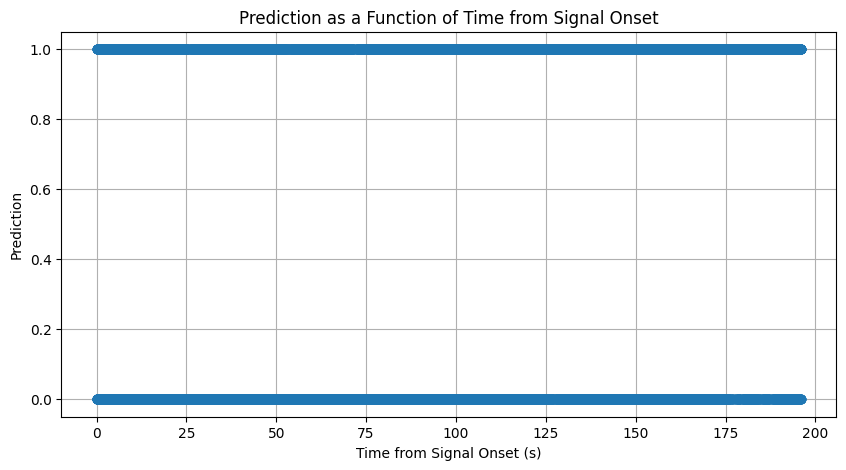

In [ ]:
fs = 100
pred_mean = np.mean(predictions, axis=0)
predictions_bin = predictions - pred_mean

# Find the class with the highest probability
predictions_bin = np.argmax(predictions_bin, axis=1)

# Create a time array matching the length of predictions_bin
time = np.linspace(0, len(predictions_bin) / fs, len(predictions_bin))
time= time.reshape(-2)


plt.figure(figsize=(10, 5))
plt.plot(time, predictions_bin, 'o')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Prediction')
plt.title('Prediction as a Function of Time from Signal Onset')
plt.grid(True)
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score
from keras.models import Model

n_times = 350
n_trials = len(predictions) // n_times

# second_last_layer_output = model.layers[-2].output
# second_last_layer_model = Model(inputs=model.input, outputs=second_last_layer_output)
# second_last_layer_predictions = second_last_layer_model.predict(wLFPs_processed)

weights, biases = model.layers[-1].get_weights()
pre_softmax_predictions = np.dot(predictions, weights) + biases

# Reshape into trials
predictions_reshaped = predictions.reshape((n_trials, n_times, 2))
pre_softmax_predictions_reshaped = pre_softmax_predictions.reshape((n_trials, n_times, 2)) # Ajust to the number of hidden node

def calculate_trial_predictions(predictions_reshaped, pre_softmax_predictions_reshaped, operation):
    if operation == "multiply_before_softmax":
        trial_probabilities = np.prod(pre_softmax_predictions_reshaped, axis=1)
    elif operation == "multiply_after_softmax":
        trial_probabilities = np.prod(predictions_reshaped, axis=1)
    elif operation == "add_before_softmax":
        trial_probabilities = np.sum(pre_softmax_predictions_reshaped, axis=1)
    elif operation == "add_after_softmax":
        trial_probabilities = np.sum(np.log10(predictions_reshaped), axis=1)

    trial_predictions = np.argmax(trial_probabilities, axis=1)
    return trial_predictions

true_trial_labels = lapTrue[:, 1][::n_times] - 1  # Adjust labels to be 0 and 1

operations = ["multiply_before_softmax", "multiply_after_softmax", "add_before_softmax", "add_after_softmax"]
accuracies = {}

for operation in operations:
    trial_predictions = calculate_trial_predictions(predictions_reshaped, pre_softmax_predictions_reshaped, operation)
    trial_accuracy = accuracy_score(true_trial_labels, trial_predictions)
    accuracies[operation] = trial_accuracy
    print(f'Trial Accuracy ({operation}): {trial_accuracy}')

613/613 [==============================] - 2s 2ms/step
Trial Accuracy (multiply_before_softmax): 0.5
Trial Accuracy (multiply_after_softmax): 0.5357142857142857
Trial Accuracy (add_before_softmax): 0.9285714285714286
Trial Accuracy (add_after_softmax): 0.9285714285714286


###Optimizing learning rate

In [ ]:
pip install keras-tuner

In [ ]:
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
trial_phase = 1
n_folds = 5
which_fold = 0


lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")


def build_model(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds,  train_inds, hidden_nodes=8)

    learn_rate = hp.Choice('learning_rate', values=[1e-5, 1e-4, 1e-3, 1e-2, 1e-1])
    optimizer = Adam(learning_rate=learn_rate)

    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Define the tuner
tuner = kt.Hyperband(
    build_model,
    objective='val_accuracy',
    max_epochs=100,
    factor=3,
    directory='my_dir',
    project_name='intro_to_kt'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)

X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the search
tuner.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best hyperparameters
best_hp = tuner.get_best_hyperparameters()[0]
best_lr = best_hp.get('learning_rate')

print(f'Best learning rate: {best_lr}')

# Build the model with the best hyperparameters and train it
best_model = build_model(best_hp)
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


In [ ]:
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt

# Assumed variables and data
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Define model building function for initial search
values = np.random.shuffle([1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])

def build_model_initial(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values)
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Initial hyperparameter search
tuner_initial = kt.Hyperband(
    build_model_initial,
    objective='val_accuracy',
    max_epochs=50,  # Use a smaller number of epochs for initial search
    factor=3,
    directory='my_dir',
    project_name='initial_lr_search'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)
X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the initial search
tuner_initial.search(X_train, y_train, epochs=50, validation_data=(X_val, y_val))

# Get the best learning rate from the initial search
best_hp_initial = tuner_initial.get_best_hyperparameters()[0]
best_lr_initial = best_hp_initial.get('learning_rate')
print(f'Best learning rate from initial search: {best_lr_initial}')

# Define model building function for refined search
values = np.random.shuffle([best_lr_initial/5, best_lr_initial/10, best_lr_initial/2, best_lr_initial, best_lr_initial*10, best_lr_initial*2, best_lr_initial*5])

def build_model_refined(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values)
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Refined hyperparameter search
tuner_refined = kt.Hyperband(
    build_model_refined,
    objective='val_accuracy',
    max_epochs=100,  # Increase the number of epochs for refined search
    factor=3,
    directory='my_dir',
    project_name='refined_lr_search'
)

# Perform the refined search
tuner_refined.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best learning rate from the refined search
best_hp_refined = tuner_refined.get_best_hyperparameters()[0]
best_lr_refined = best_hp_refined.get('learning_rate')
print(f'Best learning rate from refined search: {best_lr_refined}')

# Visualize the learning rate vs. performance
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
plt.show()

# Build and train the final model with the best learning rate
def build_model_final():
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    optimizer = Adam(learning_rate=best_lr_refined)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

best_model = build_model_final()
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


In [ ]:
# Extract trials and their hyperparameters and metrics
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))

# Print learning rates and validation accuracies in the order they were evaluated
print("Learning Rate | Validation Accuracy")
print("-----------------------------------")
for trial in trials:
    lr = trial.hyperparameters.get('learning_rate')
    val_acc = trial.metrics.get_best_value('val_accuracy')
    print(f"{lr:.5e} | {val_acc:.5f}")

# Plot learning rate vs. validation accuracy with markers indicating the order
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-', label='Validation Accuracy')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
for i, txt in enumerate(range(len(lrs))):
    plt.annotate(txt, (lrs[i], val_accuracies[i]), textcoords="offset points", xytext=(0,10), ha='center')
plt.legend()
plt.show()


In [ ]:
import random
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt

# Assumed variables and data
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Define model building function for initial search
def build_model_initial(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values=[1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Initial hyperparameter search
tuner_initial = kt.Hyperband(
    build_model_initial,
    objective='val_accuracy',
    max_epochs=50,  # Use a smaller number of epochs for initial search
    factor=3,
    directory='my_dir',
    project_name='initial_lr_search'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)
X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the initial search
tuner_initial.search(X_train, y_train, epochs=50, validation_data=(X_val, y_val))

# Get the best learning rate from the initial search
best_hp_initial = tuner_initial.get_best_hyperparameters()[0]
best_lr_initial = best_hp_initial.get('learning_rate')
print(f'Best learning rate from initial search: {best_lr_initial}')

# Define a list of learning rates for the refined search and shuffle it
learning_rates = [best_lr_initial/5, best_lr_initial/10, best_lr_initial/2, best_lr_initial, best_lr_initial*10, best_lr_initial*2, best_lr_initial*5]
random.shuffle(learning_rates)

# Define model building function for refined search with shuffled learning rates
def build_model_refined(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values=learning_rates)
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Custom search function to shuffle the trials
class ShuffledHyperband(kt.Hyperband):
    def run_trial(self, trial, *args, **kwargs):
        random.shuffle(trial.hyperparameters.space['learning_rate'].values)
        super(ShuffledHyperband, self).run_trial(trial, *args, **kwargs)

# Refined hyperparameter search with shuffled trials
tuner_refined = ShuffledHyperband(
    build_model_refined,
    objective='val_accuracy',
    max_epochs=100,  # Increase the number of epochs for refined search
    factor=3,
    directory='my_dir',
    project_name='refined_lr_search'
)

# Perform the refined search
tuner_refined.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best learning rate from the refined search
best_hp_refined = tuner_refined.get_best_hyperparameters()[0]
best_lr_refined = best_hp_refined.get('learning_rate')
print(f'Best learning rate from refined search: {best_lr_refined}')

# Visualize the learning rate vs. performance
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
plt.show()

# Build and train the final model with the best learning rate
def build_model_final():
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    optimizer = Adam(learning_rate=best_lr_refined)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

best_model = build_model_final()
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


In [ ]:
import random
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt

# Assumed variables and data
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Define model building function for initial search
def build_model_initial(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values=[1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Initial hyperparameter search
tuner_initial = kt.Hyperband(
    build_model_initial,
    objective='val_accuracy',
    max_epochs=50,  # Use a smaller number of epochs for initial search
    factor=3,
    directory='my_dir',
    project_name='initial_lr_search'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)
X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the initial search
tuner_initial.search(X_train, y_train, epochs=50, validation_data=(X_val, y_val))

# Get the best learning rate from the initial search
best_hp_initial = tuner_initial.get_best_hyperparameters()[0]
best_lr_initial = best_hp_initial.get('learning_rate')
print(f'Best learning rate from initial search: {best_lr_initial}')

# Define a list of learning rates for the refined search and shuffle it
learning_rates = [best_lr_initial/5, best_lr_initial/10, best_lr_initial/2, best_lr_initial, best_lr_initial*10, best_lr_initial*2, best_lr_initial*5]
random.shuffle(learning_rates)

# Define model building function for refined search
class RefinedHyperModel(kt.HyperModel):
    def __init__(self, learning_rates):
        self.learning_rates = learning_rates
        random.shuffle(self.learning_rates)

    def build(self, hp):
        model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
        learning_rate = hp.Choice('learning_rate', values=self.learning_rates)
        optimizer = Adam(learning_rate=learning_rate)
        model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
        return model

# Refined hyperparameter search
tuner_refined = kt.Hyperband(
    RefinedHyperModel(learning_rates),
    objective='val_accuracy',
    max_epochs=100,  # Increase the number of epochs for refined search
    factor=3,
    directory='my_dir',
    project_name='refined_lr_search'
)

# Perform the refined search
tuner_refined.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best learning rate from the refined search
best_hp_refined = tuner_refined.get_best_hyperparameters()[0]
best_lr_refined = best_hp_refined.get('learning_rate')
print(f'Best learning rate from refined search: {best_lr_refined}')

# Visualize the learning rate vs. performance
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
plt.show()

# Build and train the final model with the best learning rate
def build_model_final():
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    optimizer = Adam(learning_rate=best_lr_refined)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

best_model = build_model_final()
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


### Power Spectrum

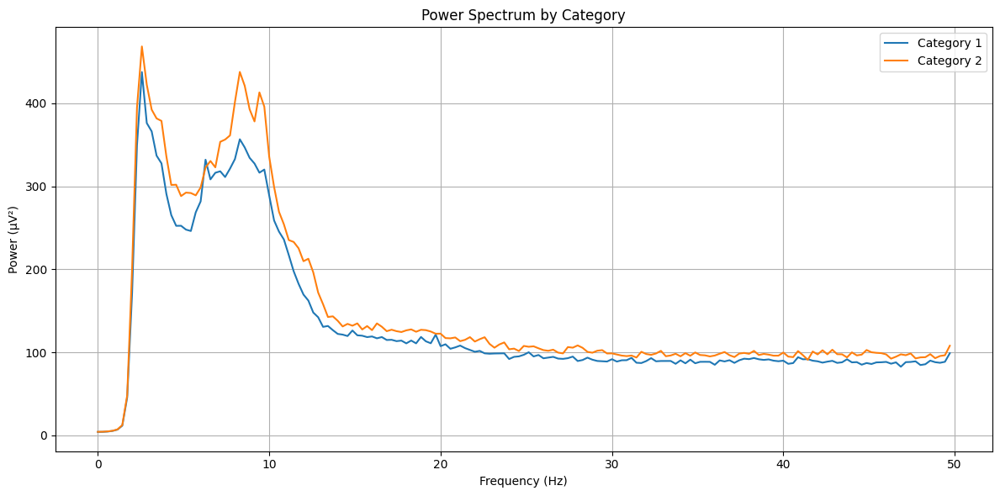

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

fs = 100
segment_length = 350

# Get EEG data for each category
category_1_indices = lapTrue[:, 1] == 1
category_2_indices = lapTrue[:, 1] == 2

eeg_data_cat1 = wLFPs_processed[category_1_indices]
eeg_data_cat2 = wLFPs_processed[category_2_indices]

# Function to compute power spectrum for segments
def compute_power_spectrum(eeg_data, fs, segment_length):
    num_segments = eeg_data.shape[0] // segment_length
    power_spectra = []

    for i in range(num_segments):
        segment = eeg_data[i*segment_length:(i+1)*segment_length, :]
        fft_data = np.fft.fft(segment, axis=0)
        frequencies = np.fft.fftfreq(segment_length, d=1/fs)

        # Take only the first half frequencies
        half_frequencies = frequencies[:len(frequencies)//2]
        fft_data = fft_data[:len(frequencies)//2, :]

        # Compute the power spectrum
        power_spectrum = np.abs(fft_data)**2
        power_spectra.append(np.mean(power_spectrum, axis=1))

    # Average the power spectra across segments
    mean_power_spectrum = np.mean(power_spectra, axis=0)

    return half_frequencies, mean_power_spectrum

# Compute power spectrum for each category
freq_cat1, power_spectrum_cat1 = compute_power_spectrum(eeg_data_cat1, fs, segment_length)
freq_cat2, power_spectrum_cat2 = compute_power_spectrum(eeg_data_cat2, fs, segment_length)

# Plot the power spectrum for each category
plt.figure(figsize=(12, 6))

plt.plot(freq_cat1, power_spectrum_cat1, label='Category 1')
plt.plot(freq_cat2, power_spectrum_cat2, label='Category 2')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (µV²)')
plt.title('Power Spectrum by Category')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


### Accuracy v. time plot


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model

# Define parameters for data processing and model
trial_phase = 1
n_folds = 5
which_fold = 0
fs = 100  # Example sampling frequency in Hz

# Filter out rows where lapID[:, 2] is 0 (invalid samples)
lapTrue = lapID[lapID[:, 2].astype(bool), :]

# Get test and train indices
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)

# Process wLFPs to match expected input shape (concatenate real and imaginary parts)
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Print the shape of the processed data
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Function to calculate average accuracy over time for given hidden nodes
def train_nn(hidden_nodes):
    # Train the network using the TIMBRE function
    model, _, train_accuracy = TIMBRE(wLFPs, lapTrue[:, 1] - 1, test_inds, train_inds, hidden_nodes=hidden_nodes, learn_rate=0.0001)

    # Predict on the test set
    predictions = np.argmax(model.predict(wLFPs_processed[test_inds]), axis=1)  # Predictions for the test set

    # Extract true labels for the test set
    true_labels = lapTrue[test_inds, 1] - 1  # Adjusting labels to match zero-based indexing if necessary

    # Compute accuracy per time point
    accuracy_per_time_point = predictions == true_labels  # Boolean array of True/False

    running_sum = np.zeros(350)
    max_trial_index = int(np.max(lapTrue[:, 0]))
    lapTrue_test = lapTrue[test_inds]

    for i in range(max_trial_index):
        inds = (lapTrue_test[:, 0] == i) & (lapTrue_test[:, 2] == 1)

        if np.sum(inds) > 0:
            trial_data = accuracy_per_time_point[inds]

        running_sum += trial_data

    average_accuracy_by_time = running_sum / max_trial_index

    return average_accuracy_by_time

Shape of wLFPs after processing: (19600, 236)


In [ ]:
# Train TIMBRE on different hidden nodes
hidden_node_sizes = [8]
average_accuracies = {}

for hn in hidden_node_sizes:
    print(f"Training TIMBRE for hidden_nodes={hn}")
    average_accuracies[hn] = train_nn(hn)

Training TIMBRE for hidden_nodes=8
132/132 [==============================] - 1s 4ms/step


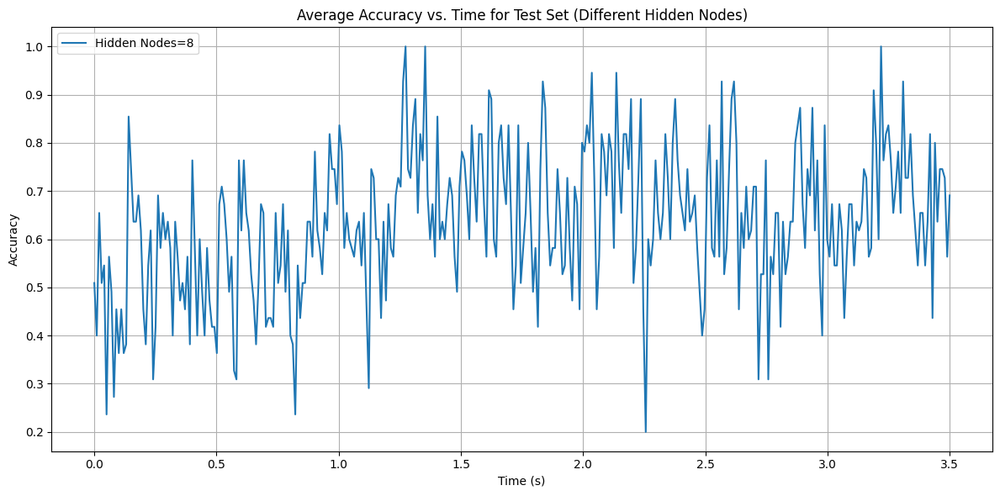

Overall accuracy for hidden nodes=8: 0.63


In [ ]:
# Create a time array for plotting
time_points = np.linspace(0, 350 / fs, 350)

# Plot the averaged accuracy over time for different hidden node sizes
plt.figure(figsize=(12, 6))
# plt.plot(time, logistic_probs, label='Logistic Model', linewidth=2, linestyle='--')

for hn in hidden_node_sizes:
  plt.plot(time_points, average_accuracies[hn], label=f'Hidden Nodes={hn}')

plt.xlabel('Time (s)')
plt.ylabel('Accuracy')
plt.title('Average Accuracy vs. Time for Test Set (Different Hidden Nodes)')
plt.grid(True)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

# Calculate and print the overall accuracy for the test set (example for one hidden node size)
#overall_accuracy_2 = np.mean(average_accuracies[2])
#overall_accuracy_4 = np.mean(average_accuracies[4])
overall_accuracy_8 = np.mean(average_accuracies[8])
#print(f"Overall accuracy for hidden nodes=2: {overall_accuracy_2:.2f}")
#print(f"Overall accuracy for hidden nodes=4: {overall_accuracy_4:.2f}")
print(f"Overall accuracy for hidden nodes=8: {overall_accuracy_8:.2f}")
#print(f"Logistic model: {np.mean(logistic_probs):.4f}")



### Confidence plots

132/132 [==============================] - 0s 2ms/step


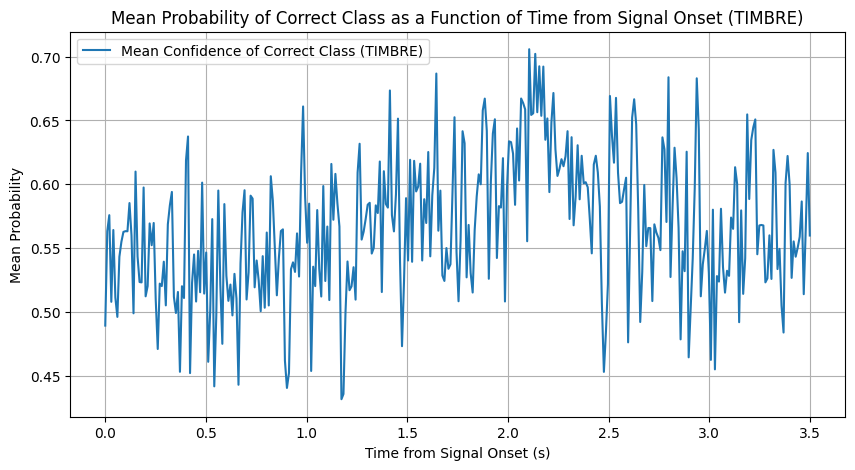

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Train the TIMBRE model

model, _, train_accuracy = TIMBRE(wLFPs, lapTrue[:, 1] - 1, test_inds, train_inds, hidden_nodes=2, learn_rate=1e-4)

correct_label = (lapTrue[test_inds, 1] - 1).astype(int)

# Predict probabilities for the test set
predictions_prob = model.predict(wLFPs_processed[test_inds])

# Extract the confidence levels for the correct class
correct_class_probabilities = []
for i in range(len(wLFPs_processed[test_inds])):
    correct_class_probabilities.append(predictions_prob[i][correct_label[i]])

correct_class_probabilities = np.array(correct_class_probabilities)

# Compute mean probabilities over each segment
segment_length = int(350)
num_segments = len(correct_class_probabilities) // segment_length
probabilities_reshaped = correct_class_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))
TIMBREprobabilities_avg = probabilities_reshaped.mean(axis=0)

# Time array for plotting
time = np.linspace(0, segment_length / fs, segment_length)
time = time.reshape(-1)

# Plotting the mean probabilities of the correct class for the TIMBRE model
plt.figure(figsize=(10, 5))
plt.plot(time, TIMBREprobabilities_avg, label='Mean Confidence of Correct Class (TIMBRE)')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Mean Probability')
plt.title('Mean Probability of Correct Class as a Function of Time from Signal Onset (TIMBRE)')
plt.legend()
plt.grid(True)
plt.show()


### Power plot for hidden node


In [ ]:
#run confidence plots first!
hidden_layer_model = Model(inputs=model.input, outputs=model.layers[0].output)
hidden_layer_activations = hidden_layer_model.predict(wLFPs_processed[test_inds])
correct_label = (lapTrue[test_inds, 1] - 1).astype(int)

132/132 [==============================] - 0s 2ms/step


In [ ]:
hidden_activations_cat1 = [hidden_layer_activations[correct_label == 0, i] for i in range(2)]
hidden_activations_cat2 = [hidden_layer_activations[correct_label == 1, i] for i in range(2)]

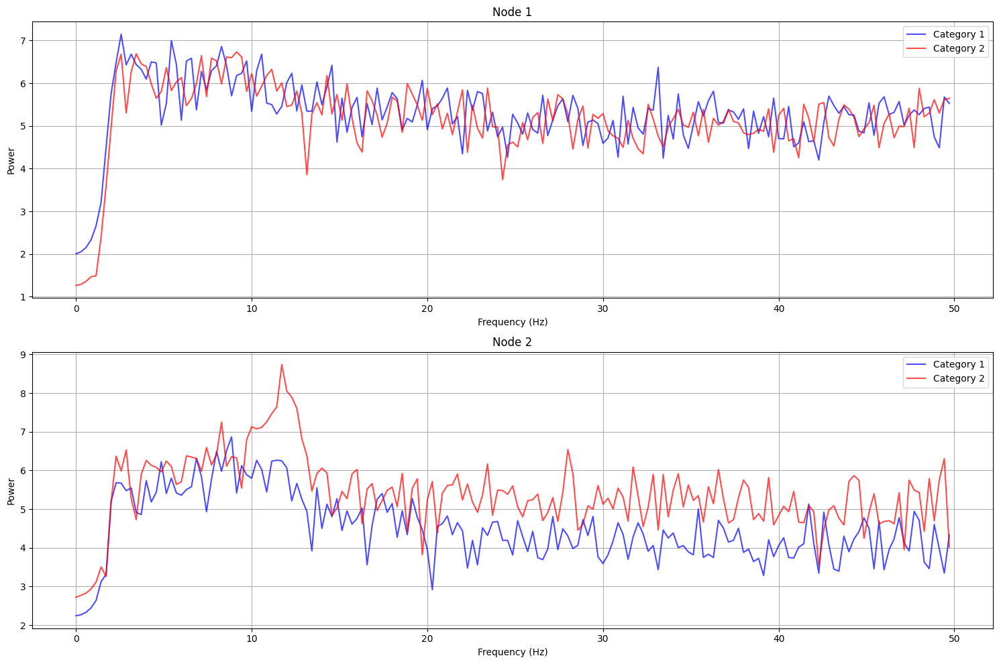

In [ ]:
def compute_power_spectrum(activations, fs, segment_length):
    num_segments = len(activations) // segment_length
    power_spectra = []

    for i in range(num_segments):
        segment = activations[i * segment_length:(i + 1) * segment_length]
        fft_data = np.fft.fft(segment)
        frequencies = np.fft.fftfreq(segment_length, d=1 / fs)

        # Take only the first half frequencies
        half_frequencies = frequencies[:len(frequencies) // 2]
        fft_data = fft_data[:len(frequencies) // 2]

        # Compute the power spectrum
        power_spectrum = np.abs(fft_data) ** 2
        power_spectra.append(power_spectrum)

    # Average the power spectra across segments
    mean_power_spectrum = np.mean(power_spectra, axis=0)

    return half_frequencies, mean_power_spectrum

fs = 100
segment_length = 350

# Compute power spectrum for each hidden node
freq_hidden_nodes_cat1 = []
power_spectrum_hidden_nodes_cat1 = []
freq_hidden_nodes_cat2 = []
power_spectrum_hidden_nodes_cat2 = []


# Function to plot power spectrum for all hidden nodes
def plot_all_power_spectra(frequencies_list_cat1, power_spectrum_list_cat1, frequencies_list_cat2, power_spectrum_list_cat2, num_nodes):
    fig, axes = plt.subplots(num_nodes // 1, 1, figsize=(15, 10))  # Adjust grid size to fit all nodes
    axes = axes.flatten()

    for i in range(num_nodes):
        power_spectrum_cat1 = np.log(power_spectrum_list_cat1[i])
        power_spectrum_cat2 = np.log(power_spectrum_list_cat2[i])

        axes[i].plot(frequencies_list_cat1[i], power_spectrum_cat1, label='Category 1', color='b', alpha=0.7)
        axes[i].plot(frequencies_list_cat2[i], power_spectrum_cat2, label='Category 2', color='r', alpha=0.7)
        axes[i].set_xlabel('Frequency (Hz)')
        axes[i].set_ylabel('Power')
        axes[i].set_title(f'Node {i + 1}')
        axes[i].legend()
        axes[i].grid(True)

    plt.tight_layout()
    plt.show()

# Compute power spectrum for each hidden node
fs = 100
segment_length = 350
hidden_nodes = 2

freq_hidden_nodes_cat1 = []
power_spectrum_hidden_nodes_cat1 = []
freq_hidden_nodes_cat2 = []
power_spectrum_hidden_nodes_cat2 = []

for i in range(hidden_nodes):
    freq_cat1, power_spectrum_cat1 = compute_power_spectrum(hidden_activations_cat1[i], fs, segment_length)
    freq_cat2, power_spectrum_cat2 = compute_power_spectrum(hidden_activations_cat2[i], fs, segment_length)

    freq_hidden_nodes_cat1.append(freq_cat1)
    power_spectrum_hidden_nodes_cat1.append(power_spectrum_cat1)
    freq_hidden_nodes_cat2.append(freq_cat2)
    power_spectrum_hidden_nodes_cat2.append(power_spectrum_cat2)

# Plot all power spectra
plot_all_power_spectra(freq_hidden_nodes_cat1, power_spectrum_hidden_nodes_cat1, freq_hidden_nodes_cat2, power_spectrum_hidden_nodes_cat2, hidden_nodes)


## Anatomical maps

In [ ]:
#positions
info = al['nfo']
x_positions = info['xpos']
x_positions=np.array(x_positions)
X_POS=x_positions.reshape(-3)

y_positions= info['ypos']
y_positions=np.array(y_positions)
Y_POS=y_positions.reshape(-3)

[17 52 81 72 42 48 60 89 26 32]


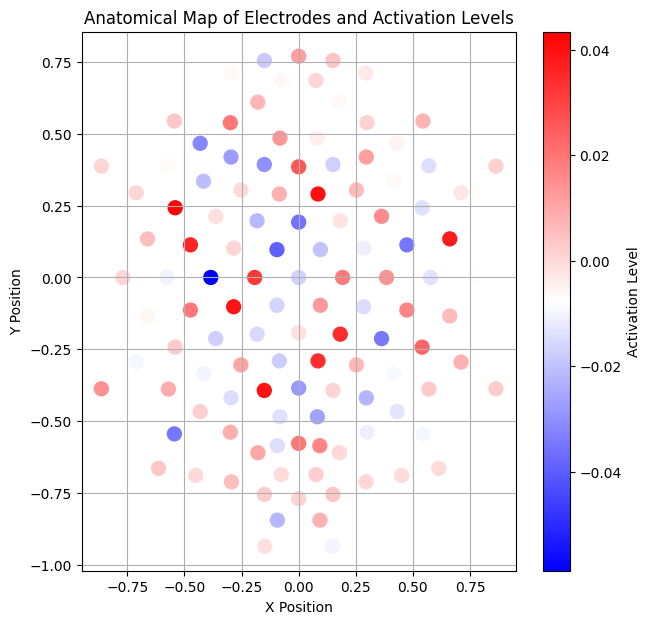

In [ ]:
#Linear model Activation map
activation_levels = logistic_model.coef_[0]
activation_levels = np.array(activation_levels)
top_10_channels = np.argsort(activation_levels)[-10:]
print(top_10_channels)

# Create a scatter plot of the electrode positions
plt.figure(figsize=(7, 7))
plt.scatter(X_POS[0], Y_POS[0], c=activation_levels, cmap='bwr', s=100)
plt.colorbar(label='Activation Level')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.title('Anatomical Map of Electrodes and Activation Levels')
plt.grid(True)
plt.show()


In [ ]:
def unwhiten(X_whitened, u, Xv):
   X_unscaled = X_whitened * Xv
   X_unwhitened = X_unscaled @ u.T
   return X_unwhitened

In [ ]:
LFPs=unwhiten(wLFPs, u, Xv)
LFPs_processed = np.concatenate((np.real(LFPs), np.imag(LFPs)), axis=1)
model.predict(LFPs_processed)

In [ ]:
#TIMBRE activation map
complex_weights = model.layers[0].get_weights()[0]
activation_levels = np.abs(complex_weights[:, 0] + 1j * complex_weights[:, 1])

activation_levels = np.array(activation_levels)

top_10_channels = np.argsort(activation_levels)[-10:]
print(top_10_channels)

plt.figure(figsize=(7, 7))
plt.scatter(X_POS[0], Y_POS[0], c=activation_levels, cmap='bwr', s=100)
plt.colorbar(label='Activation Level')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.title('Anatomical Map of Electrodes and Activation Levels in TIMBRE')
plt.grid(True)
plt.show()


### Complexlm

In [ ]:
real_part = model.layers[0].get_weights()[0]
imag_part = model.layers[0].get_weights()[1]

complex_weights = real_part + 1j * imag_part


if not np.iscomplexobj(complex_weights):
    raise TypeError("The weights are not complex numbers")

real_part = np.real(complex_weights)
imag_part = np.imag(complex_weights)

std_real = np.std(real_part)
print(f'Standard deviation of real part: {std_real}')
std_imag = np.std(imag_part)
print(f'Standard deviation of imaginary part: {std_imag}')


In [ ]:
# with open('complexIm.m', 'r') as file:
#     content = file.read()
# print(content)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb

def complexIm(in_array, sub=0, pow_val=1, scale=1, setMax=None, h=None):
    # Squeeze the input array to remove singleton dimensions
    in_array = np.squeeze(in_array)

    if sub:
        s = in_array.shape
        in_array_flat = in_array.flatten()
        in_array_flat -= np.mean(in_array_flat)
        in_array_real_imag = np.vstack((in_array_flat.real, in_array_flat.imag)).T
        cov_matrix = np.cov(in_array_real_imag, rowvar=False)
        in_array_flat = in_array_real_imag @ np.linalg.inv(np.sqrt(cov_matrix))
        in_array = (in_array_flat[:, 0] + 1j * in_array_flat[:, 1]).reshape(s)

    if setMax is None:
        setMax = np.percentile(np.abs(in_array), 99.9)

    if h is None:
        hsv_image = np.zeros((*in_array.shape, 3))
        hsv_image[..., 0] = (np.angle(in_array) * scale) % (2 * np.pi) / (2 * np.pi)
        hsv_image[..., 1] = 1
        hsv_image[..., 2] = np.minimum(1, np.power(np.abs(in_array) / setMax, pow_val))
    else:
        hsv_image = np.zeros((*in_array.shape, 3))
        hsv_image[..., 0] = np.angle(h)
        hsv_image[..., 1] = np.minimum(1, np.abs(h) / setMax)
        hsv_image[..., 2] = np.minimum(1, np.power(np.abs(in_array) / setMax, pow_val))

    # Handle NaN values
    hsv_image[..., 0][np.isnan(in_array)] = 1
    hsv_image[..., 2][np.isnan(in_array)] = 1
    hsv_image[..., 1][np.isnan(in_array)] = 0

    # Convert HSV to RGB
    rgb_image = hsv_to_rgb(hsv_image)

    return rgb_image

In [ ]:
img=complexIm(complex_weights)
plt.imshow(img)
plt.show()

In [ ]:
num_hidden_nodes = img.shape[1]

# Create subplots
fig, axes = plt.subplots(2, 4, figsize=(15, 8))  # Adjust grid size according to number of hidden nodes
axes = axes.flatten()  # Flatten the array of axes for easy iteration

for i in range(num_hidden_nodes):
    # Extract RGB values for the current hidden node
    colors = img[:, i, :]
    scatter = axes[i].scatter(X_POS[0], Y_POS[0], c=colors, s=100)  # Use RGB colors for the scatter plot
    axes[i].set_title(f'Hidden Node {i+1}')

plt.tight_layout()
plt.show()

## Subject across models

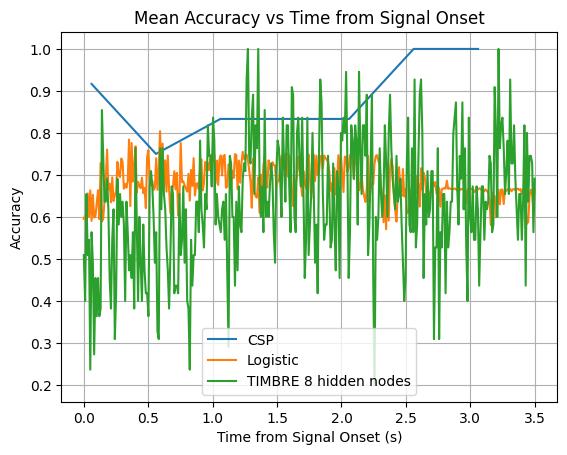

In [ ]:
awCSP = CSPaccuracies
awLogistic = logisticprobabilities_avg
awTIMBRE = average_accuracies[hn]
plt.plot(times, CSPaccuracies, label='CSP')
plt.plot(time, logisticprobabilities_avg, label='Logistic')
plt.plot(time_points, average_accuracies[hn], label=f'TIMBRE {hn} hidden nodes')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Accuracy')
plt.title('Mean Accuracy vs Time from Signal Onset')
plt.legend()
plt.grid(True)
plt.show()

# ay

nan
(280,)
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 ...
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]


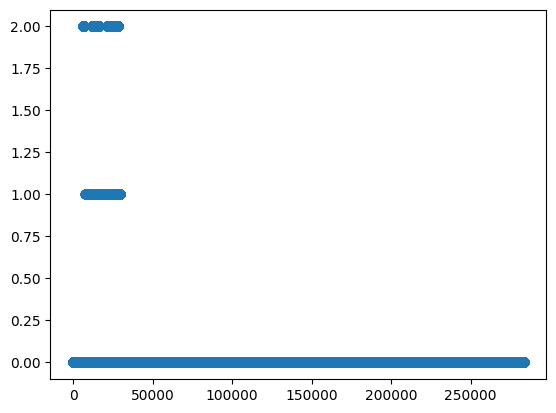

In [ ]:
ay = scipy.io.loadmat('/content/drive/My Drive/data_set_IVa_ay.mat')
cnt_data = ay['cnt']

mrk_data = ay['mrk']

print(mrk_data[0][0][1][0][279])
print(mrk_data[0][0][1][0].shape)

lapID = np.zeros((cnt_data.shape[0], 3))
for i in range(mrk_data[0][0][1][0].shape[0]):
    ind_start = mrk_data[0][0][0][0][i]
    lapID[ind_start : ind_start + 350, 0] = i
    lapID[ind_start : ind_start + 350, 1] = mrk_data[0][0][1][0][i]
    lapID[ind_start : ind_start + 350, 2] = 1 if mrk_data[0][0][1][0][i] in [1, 2] else 0
   # lapID[i, 3] = 1 if lapID[i, 2] == 1 else 0  # What does the phase here should be. HELP

print(lapID)


plt.plot(lapID[:,1], 'o')



In [ ]:
def test_train(lapID, which_phase, n_folds=5, which_fold=0):
    """
    Returns test and train samples

    Parameters:
    - lapID: contains info about trial number and maze arm of each sample
    - which_phase: which phase of the session to use (see get_data\get_behav for info)
    - n_folds: how many folds to assign
    - which_fold: which fold to return values for

    Returns:
    - train_inds: which samples to use for training model
    - test_inds: which samples to use for testing model
    """
    ctr = np.zeros(3)
    use_sample = lapID[:, 2] == which_phase
    if which_phase == 2:
        use_sample = use_sample & (lapID[:, 2])  # only use correct trials
    fold_assign = -np.ones(np.size(use_sample))
    for i in range(int(np.max(lapID[:, 0]))):
        inds = (lapID[:, 0] == i) & use_sample
        if np.sum(inds):
            which_arm = int(lapID[inds, 1][0])
            fold_assign[inds] = ctr[which_arm] % n_folds
            ctr[which_arm] += 1
    test_inds = fold_assign == which_fold
    train_inds = np.isin(fold_assign, np.arange(n_folds)) & ~test_inds
    train_inds = helpers.balanced_indices(lapID[:, 1], train_inds)
    return test_inds, train_inds


## 0Hz Filter


In [ ]:
#oHz filter
hp_data=cnt_data-np.mean(cnt_data,axis=1)[:,None]
np.shape(hp_data)

(283562, 118)

## Linear model

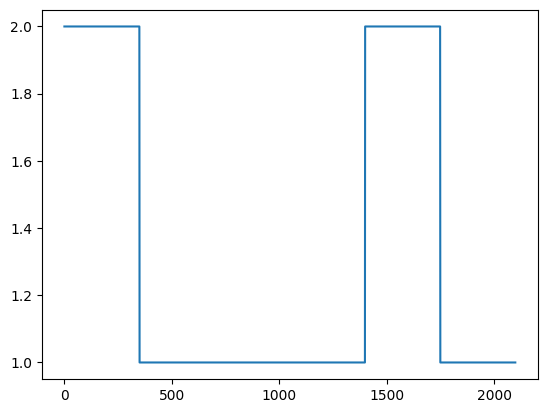

In [ ]:
test_inds, train_inds = test_train(lapID[:,],1,5,0) #last three arguments obtained form code below
#wLFPs, _, _ = helpers.whiten(hp_data, train_inds)

plt.plot(lapID[test_inds,1])

In [ ]:
# lapID array: 4 columns: 1- trial # (0-n); 2- which category(0, 1); 3- correct trial? (Na = incorrect; 1 for correct, 0 for na); 4- phase (1 for the position that have valid trials)
print(lapID[:,1])

[0. 0. 0. ... 0. 0. 0.]


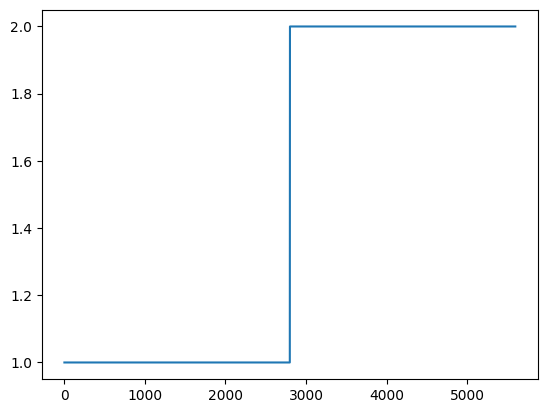

In [ ]:
plt.plot(lapID[train_inds, 1])

In [ ]:
fs = 100
segment_length = int(3.5*fs)
X_train = hp_data[train_inds]
y_train = lapID[train_inds, 1].astype(int)
X_test = hp_data[test_inds]
y_test = lapID[test_inds, 1].astype(int)

# Encode the class labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)
# Ensure labels are encoded as integers if needed
y_train_encoded = y_train.astype(int)
y_test_encoded = y_test.astype(int)


In [ ]:
np.intersect1d(train_inds,test_inds)

array([], dtype=int64)

### Optimizing hyperparameters

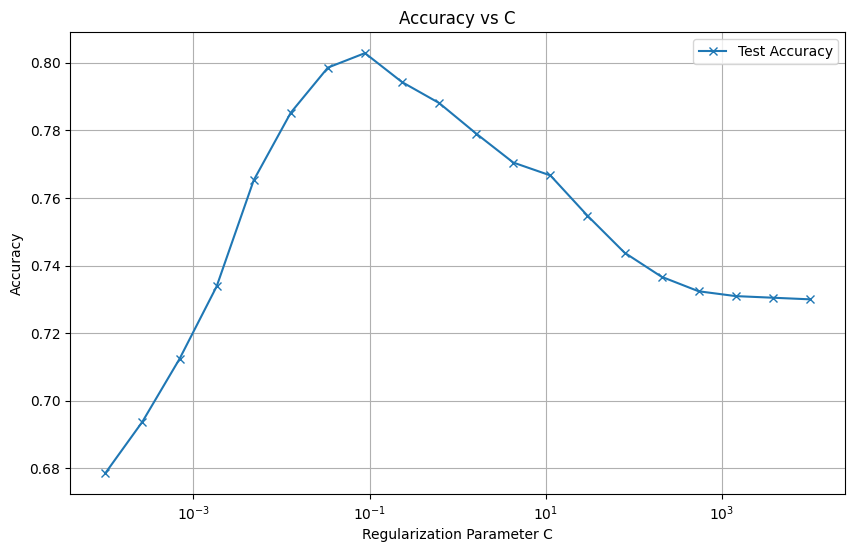

In [ ]:
# Normalize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define a range of C values (inverse of regularization strength)
C_values = np.logspace(-4, 4, 20)

# Lists to store accuracy values
train_accuracies = []
test_accuracies = []

# Train and evaluate the model for each C value
for C in C_values:
    model = LogisticRegression(C=C, penalty='l2', solver='liblinear', max_iter=1000)
    model.fit(X_train_scaled, y_train)

    train_accuracy = accuracy_score(y_train, model.predict(X_train_scaled))
    test_accuracy = accuracy_score(y_test, model.predict(X_test_scaled))

    train_accuracies.append(train_accuracy)
    test_accuracies.append(test_accuracy)

# Plot the accuracy as a function of C
plt.figure(figsize=(10, 6))
#plt.plot(C_values, train_accuracies, label='Train Accuracy', marker='o')
plt.plot(C_values, test_accuracies, label='Test Accuracy', marker='x')
plt.xscale('log')
plt.xlabel('Regularization Parameter C')
plt.ylabel('Accuracy')
plt.title('Accuracy vs C')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
best_c_index = np.argmax(test_accuracies)
best_c = C_values[best_c_index]
print(f"Best C value: {best_c}")


Best C value: 0.08858667904100823


### Accuracy

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder


logistic_model = LogisticRegression(penalty='l2',max_iter=1000, C=0.08858667904100823, solver='liblinear')
logistic_model.fit(X_train, y_train)

predictions_prob = logistic_model.predict_proba(X_test)
predicted_labels = logistic_model.predict(X_test)

accuracy = accuracy_score(y_test, predicted_labels)
print(f'Accuracy: {accuracy:.4f}')

num_segments = len(predictions_prob) // segment_length
predictions_reshaped = predictions_prob[:num_segments * segment_length].reshape((num_segments, segment_length, -1))
predictions_avg = predictions_reshaped.mean(axis=0)


Accuracy: 0.8081


In [ ]:
segment_length = 350

num_trials = len(predictions_prob) // segment_length
predictions_reshaped = predictions_prob[:num_trials * segment_length].reshape((num_trials, segment_length, -1))

trial_probabilities_multiply = np.prod(predictions_reshaped, axis=1)
trial_predictions_multiply = np.argmax(trial_probabilities_multiply, axis=1)

trial_probabilities_sum = np.sum(predictions_reshaped, axis=1)
trial_predictions_sum = np.argmax(trial_probabilities_sum, axis=1)

true_trial_labels = y_test[::segment_length] -1

trial_accuracy_multiply = accuracy_score(true_trial_labels, trial_predictions_multiply)
trial_accuracy_sum = accuracy_score(true_trial_labels, trial_predictions_sum)

print(f'Trial Accuracy (multiply): {trial_accuracy_multiply:.4f}')
print(f'Trial Accuracy (sum): {trial_accuracy_sum:.4f}')

Trial Accuracy (multiply): 1.0000
Trial Accuracy (sum): 0.8333


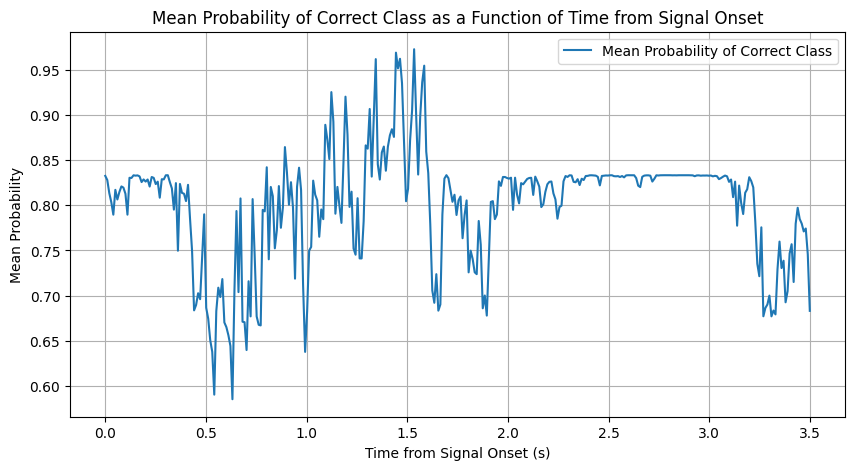

In [ ]:
time = np.linspace(0, segment_length / fs, segment_length)

# Get the number of unique classes
num_classes = predictions_prob.shape[1]

# Ensure y_test is properly encoded to start from 0
label_encoder = LabelEncoder()
y_test_encoded = label_encoder.fit_transform(y_test)

# Reshape and average probabilities for correct class over segments
correct_class_probabilities = []
for i in range(len(y_test_encoded)):
    correct_label = y_test_encoded[i]
    correct_class_probabilities.append(predictions_prob[i][correct_label])

correct_class_probabilities = np.array(correct_class_probabilities)
num_segments = len(correct_class_probabilities) // segment_length
probabilities_reshaped = correct_class_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))
logisticprobabilities_avg = probabilities_reshaped.mean(axis=0)

# Plot mean probabilities as a function of time
plt.figure(figsize=(10, 5))
plt.plot(time, logisticprobabilities_avg, label='Mean Probability of Correct Class')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Mean Probability')
plt.title('Mean Probability of Correct Class as a Function of Time from Signal Onset')
plt.legend()
plt.grid(True)
plt.show()

### Confidence plots


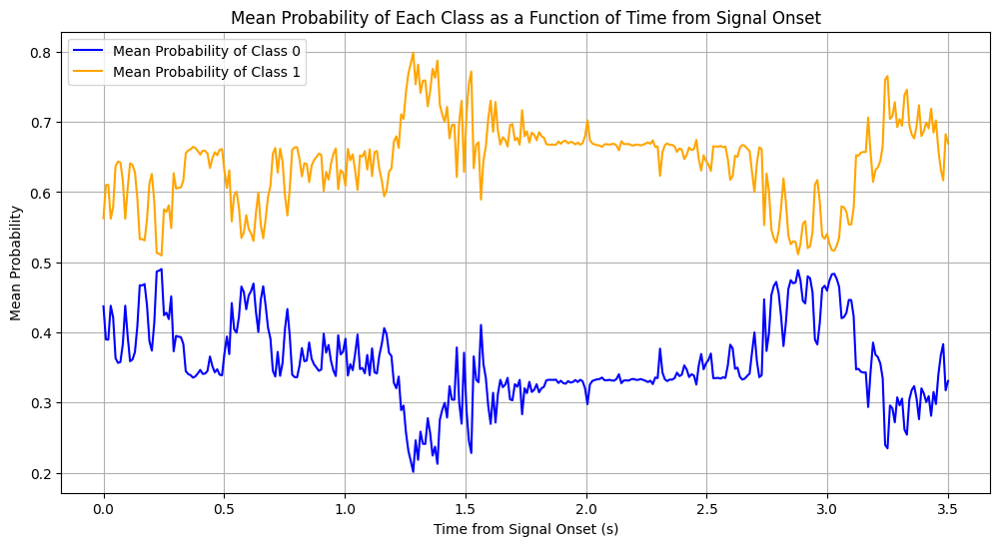

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define segment length based on the sampling frequency (fs)
segment_length = 350

# Extract probabilities for each class
class_0_probabilities = predictions_prob[:, 0]
class_1_probabilities = predictions_prob[:, 1]

# Compute mean probabilities over each segment
num_segments = len(class_0_probabilities) // segment_length
class_0_probabilities_reshaped = class_0_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))
class_1_probabilities_reshaped = class_1_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))

class_0_probabilities_avg = class_0_probabilities_reshaped.mean(axis=0)
class_1_probabilities_avg = class_1_probabilities_reshaped.mean(axis=0)

# Time array for plotting
time = np.linspace(0, segment_length / fs, segment_length)

# Plotting the mean probabilities for each class
plt.figure(figsize=(12, 6))
plt.plot(time, class_0_probabilities_avg, label='Mean Probability of Class 0', color='blue')
plt.plot(time, class_1_probabilities_avg, label='Mean Probability of Class 1', color='orange')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Mean Probability')
plt.title('Mean Probability of Each Class as a Function of Time from Signal Onset')
plt.legend()
plt.grid(True)
plt.show()


## 2Hz HP Filter


In [ ]:
#Hp 2Hz
hp_data = helpers.filter_data(cnt_data, 2, 100, filt_type='high', use_hilbert=True)
np.shape(hp_data)

(283562, 118)

## CSP

In [ ]:
from mne.decoding import CSP
from sklearn.pipeline import make_pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import accuracy_score
import scipy.io

# Select relevant data and labels
lapTrue = lapID[lapID[:, 2].astype(bool), :]
test_inds, train_inds = test_train(lapTrue, 1, n_folds=5, which_fold=0)
valid_hp_data = hp_data[lapID[:, 2].astype(bool)]

n_channels = valid_hp_data.shape[1]
n_times = 350
n_trials = valid_hp_data.shape[0] // n_times
fs=100

print(f"Calculated number of trials: {n_trials}")

# Reshape the data to (n_trials, n_channels, n_times)
eeg_data = valid_hp_data.reshape((n_trials, n_times, n_channels)).transpose(0, 2, 1)
eeg_data = np.abs(eeg_data)

print(f"Shape of eeg_data after reshaping: {eeg_data.shape}")

# Create labels
labels = lapTrue[:, 1][::n_times] - 1  # Adjust labels to be 0 and 1

# Filter train_inds and test_inds to be within n_trials
train_inds = np.where(train_inds[:: n_times])[0]
test_inds = np.where(test_inds[:: n_times])[0]

# Create train and test sets using the indices from test_train function
X_train = eeg_data[train_inds]
X_test = eeg_data[test_inds]
y_train = labels[train_inds]
y_test = labels[test_inds]

# Create a CSP object
csp = CSP(n_components=4, reg='ledoit_wolf', log=True, norm_trace=False)

# Create a pipeline with CSP and LDA
clf = make_pipeline(csp, LinearDiscriminantAnalysis())

# Fit the model
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')


Calculated number of trials: 28
Shape of eeg_data after reshaping: (28, 118, 350)
Computing rank from data with rank=None
    Using tolerance 1.4e+04 (2.2e-16 eps * 118 dim * 5.3e+17  max singular value)
    Estimated rank (data): 118
    data: rank 118 computed from 118 data channels with 0 projectors
Reducing data rank from 118 -> 118
Estimating class=0.0 covariance using LEDOIT_WOLF
Done.
Estimating class=1.0 covariance using LEDOIT_WOLF
Done.
Accuracy: 1.0


In [ ]:
y_pred

array([1., 0., 0., 0., 1., 0.])

In [ ]:
y_test

array([1., 0., 0., 0., 1., 0.])

Calculated number of trials: 28
Shape of eeg_data after reshaping: (28, 118, 350)
Computing rank from data with rank=None
    Using tolerance 1.5e+03 (2.2e-16 eps * 96 dim * 7.2e+16  max singular value)
    Estimated rank (data): 96
    data: rank 96 computed from 118 data channels with 0 projectors
    Setting small data eigenvalues to zero (without PCA)
Reducing data rank from 118 -> 96
Estimating class=0.0 covariance using LEDOIT_WOLF
Done.
Estimating class=1.0 covariance using LEDOIT_WOLF
Done.
Computing rank from data with rank=None
    Using tolerance 1.5e+03 (2.2e-16 eps * 96 dim * 7.1e+16  max singular value)
    Estimated rank (data): 96
    data: rank 96 computed from 118 data channels with 0 projectors
    Setting small data eigenvalues to zero (without PCA)
Reducing data rank from 118 -> 96
Estimating class=0.0 covariance using LEDOIT_WOLF
Done.
Estimating class=1.0 covariance using LEDOIT_WOLF
Done.
Computing rank from data with rank=None
    Using tolerance 1.5e+03 (2.2e-

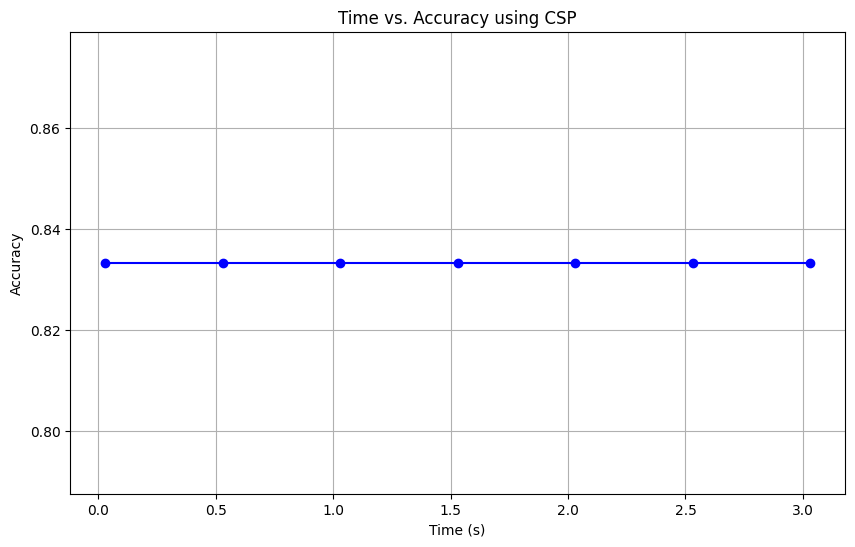

In [ ]:
from mne.decoding import CSP
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np

# Parameters
window_size = len(test_inds)  # Size of the time window in samples
step_size = 50     # Step size for the sliding window in samples
n_components = 4   # Number of CSP components
fs = 100           # Sampling frequency

# Function to compute accuracy over time
def compute_accuracy_over_time(eeg_data, labels, train_inds, test_inds, window_size, step_size, n_components, fs):
    accuracies = []
    times = []

    for start in range(0, eeg_data.shape[2] - window_size + 1, step_size):
        end = start + window_size
        X_window = eeg_data[:, :, start:end]

        # Create a CSP object
        csp = CSP(n_components=n_components, reg='ledoit_wolf', log=True, norm_trace=False)

        # Create a pipeline with CSP and SVM
        clf = make_pipeline(csp, SVC())

        # Split data into train and test sets
        X_train = X_window[train_inds]
        X_test = X_window[test_inds]
        y_train = labels[train_inds]
        y_test = labels[test_inds]

        # Fit the model
        clf.fit(X_train, y_train)

        # Predict on the test set
        y_pred = clf.predict(X_test)

        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred)
        accuracies.append(accuracy)

        # Time corresponding to the middle of the window
        times.append((start + end) / 2 / fs)

    return times, accuracies

# Select relevant data and labels
lapTrue = lapID[lapID[:, 2].astype(bool), :]
test_inds, train_inds = test_train(lapTrue, 1, n_folds=5, which_fold=0)
valid_hp_data = hp_data[lapID[:, 2].astype(bool)]

n_channels = valid_hp_data.shape[1]
n_times = 350
n_trials = valid_hp_data.shape[0] // n_times

print(f"Calculated number of trials: {n_trials}")

# Reshape the data to (n_trials, n_channels, n_times)
eeg_data = valid_hp_data.reshape((n_trials, n_times, n_channels)).transpose(0, 2, 1)
eeg_data = np.abs(eeg_data)

print(f"Shape of eeg_data after reshaping: {eeg_data.shape}")

# Create labels
labels = lapTrue[:, 1][::n_times] - 1  # Adjust labels to be 0 and 1

# Filter train_inds and test_inds to be within n_trials
train_inds = np.where(train_inds[::n_times])[0]
test_inds = np.where(test_inds[::n_times])[0]

# Compute accuracy over time
times, CSPaccuracies = compute_accuracy_over_time(eeg_data, labels, train_inds, test_inds, window_size, step_size, n_components, fs)

# Plot time vs. accuracy
plt.figure(figsize=(10, 6))
plt.plot(times, CSPaccuracies, 'bo-')
plt.xlabel('Time (s)')
plt.ylabel('Accuracy')
plt.title('Time vs. Accuracy using CSP')
plt.grid(True)
plt.show()


In [ ]:
CSPaccuracies

[0.8333333333333334,
 0.8333333333333334,
 0.8333333333333334,
 0.8333333333333334,
 0.8333333333333334,
 0.8333333333333334,
 0.8333333333333334]

###Power spectra

In [ ]:
# Transform the data using the trained CSP
transformed_X_train = csp.transform(X_train)
transformed_X_test = csp.transform(X_test)

# Separate the transformed data by category
cat_0_train = transformed_X_train[y_train == 0]
cat_1_train = transformed_X_train[y_train == 1]
cat_0_test = transformed_X_test[y_test == 0]
cat_1_test = transformed_X_test[y_test == 1]

/usr/local/lib/python3.10/dist-packages/scipy/signal/_spectral_py.py:600: UserWarning: nperseg = 100 is greater than input length  = 4, using nperseg = 4
  freqs, _, Pxy = _spectral_helper(x, y, fs, window, nperseg, noverlap,


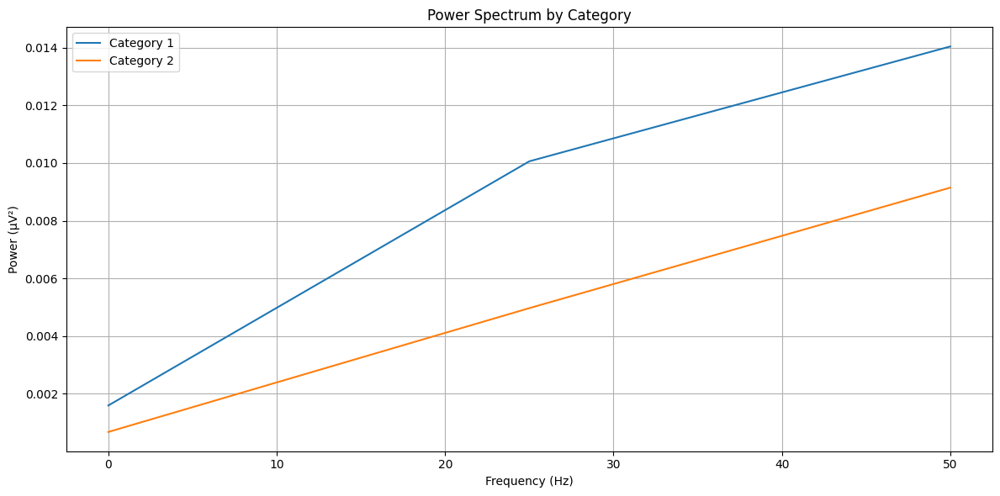

In [ ]:
from scipy.signal import welch
# Function to compute power spectrum
def compute_power_spectrum(data, fs):
    power_spectra = []
    for trial in data:
        f, Pxx = welch(trial, fs, nperseg=fs)
        power_spectra.append(Pxx)
    mean_power_spectrum = np.mean(power_spectra, axis=0)
    return f, mean_power_spectrum
f_cat_0, power_spectrum_cat_0 = compute_power_spectrum(transformed_X_train[y_train == 0], fs)
f_cat_1, power_spectrum_cat_1 = compute_power_spectrum(transformed_X_train[y_train == 1], fs)

# Plot the power spectrum for each category
plt.figure(figsize=(12, 6))

plt.plot(f_cat_0, power_spectrum_cat_0, label='Category 1')
plt.plot(f_cat_1, power_spectrum_cat_1, label='Category 2')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (µV²)')
plt.title('Power Spectrum by Category')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

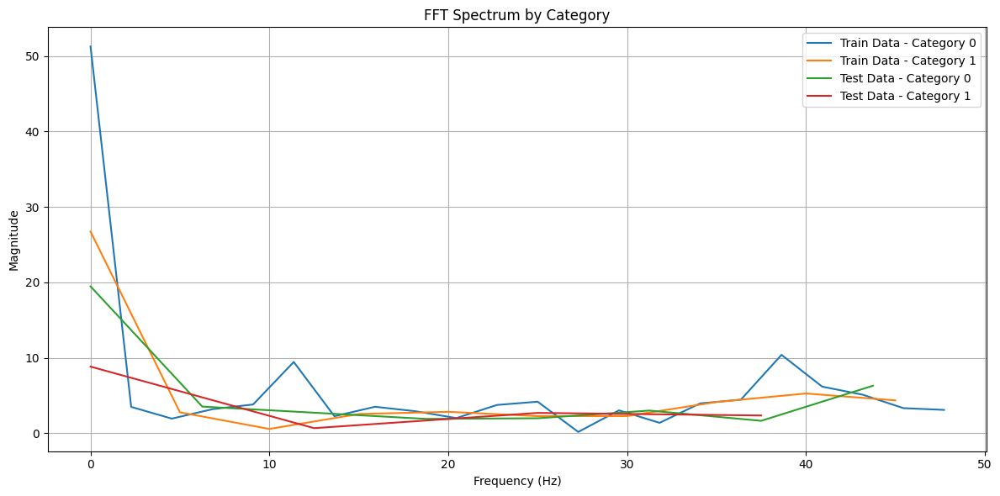

In [ ]:
def compute_fft(eeg_data, fs):
    fft_data = np.fft.fft(eeg_data)
    frequencies = np.fft.fftfreq(len(eeg_data), d=1/fs)
    positive_freq_mask = frequencies >= 0
    frequencies = frequencies[positive_freq_mask]
    fft_data = fft_data[positive_freq_mask]

    fft_magnitude = np.abs(fft_data)
    return frequencies, fft_magnitude

# compute fft for each category
freq_cat0_train, fft_mag_cat0_train = compute_fft(cat_0_train.flatten(), fs)
freq_cat1_train, fft_mag_cat1_train = compute_fft(cat_1_train.flatten(), fs)
freq_cat0_test, fft_mag_cat0_test = compute_fft(cat_0_test.flatten(), fs)
freq_cat1_test, fft_mag_cat1_test = compute_fft(cat_1_test.flatten(), fs)

# plotting FFT
plt.figure(figsize=(12, 6))

plt.plot(freq_cat0_train, fft_mag_cat0_train, label='Train Data - Category 0')
plt.plot(freq_cat1_train, fft_mag_cat1_train, label='Train Data - Category 1')
plt.plot(freq_cat0_test, fft_mag_cat0_test, label='Test Data - Category 0')
plt.plot(freq_cat1_test, fft_mag_cat1_test, label='Test Data - Category 1')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.title('FFT Spectrum by Category')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


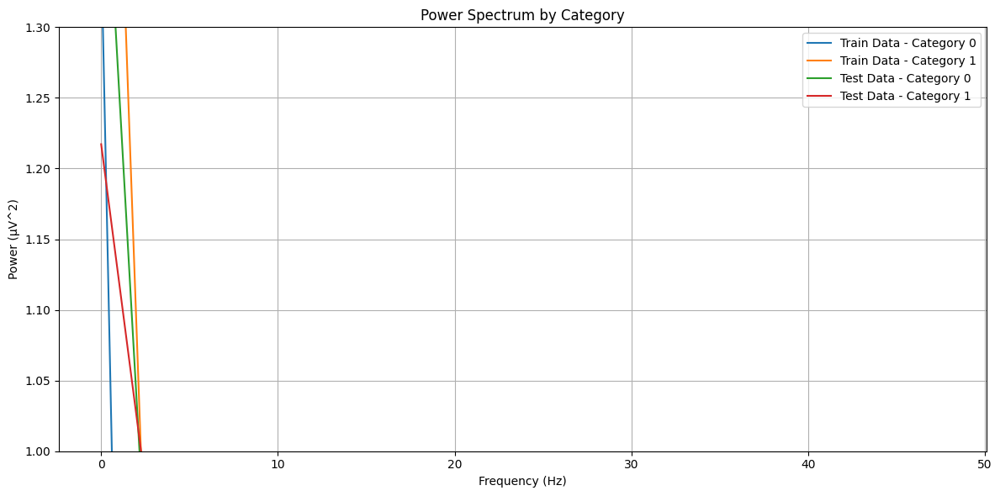

In [ ]:
def compute_power_spectrum(eeg_data, fs):
    N = len(eeg_data)
    xk = (1/N**2) * np.abs(np.fft.fft(eeg_data))**2  # Two-sided power spectrum
    xk = xk[:N//2+1]  # One-sided power spectrum
    xk[1:-1] = 2 * xk[1:-1]  # Double values except for DC and Nyquist

    freq = np.fft.fftfreq(N, d=1/fs)[:N//2+1]  # Frequency axis

    return freq, xk

# Compute power spectrum for each category
freq_cat0_train, power_spectrum_cat0_train = compute_power_spectrum(cat_0_train.flatten(), fs)
freq_cat1_train, power_spectrum_cat1_train = compute_power_spectrum(cat_1_train.flatten(), fs)
freq_cat0_test, power_spectrum_cat0_test = compute_power_spectrum(cat_0_test.flatten(), fs)
freq_cat1_test, power_spectrum_cat1_test = compute_power_spectrum(cat_1_test.flatten(), fs)

# Plot the power spectrum for each category
plt.figure(figsize=(12, 6))

plt.plot(freq_cat0_train[freq_cat0_train >= 0], power_spectrum_cat0_train[freq_cat0_train >= 0], label='Train Data - Category 0')
plt.plot(freq_cat1_train[freq_cat1_train >= 0], power_spectrum_cat1_train[freq_cat1_train >= 0], label='Train Data - Category 1')
plt.plot(freq_cat0_test[freq_cat0_test >= 0], power_spectrum_cat0_test[freq_cat0_test >= 0], label='Test Data - Category 0')
plt.plot(freq_cat1_test[freq_cat1_test >= 0], power_spectrum_cat1_test[freq_cat1_test >= 0], label='Test Data - Category 1')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (µV^2)')
plt.title('Power Spectrum by Category')
plt.legend()
plt.grid(True)
plt.ylim(1, 1.3)
plt.tight_layout()
plt.show()


Plotting CSP Component 1


<ipython-input-31-20291d91f283>:4: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=16).
  plt.specgram(data[i, :], Fs=fs, NFFT=256, noverlap=128, cmap='jet')


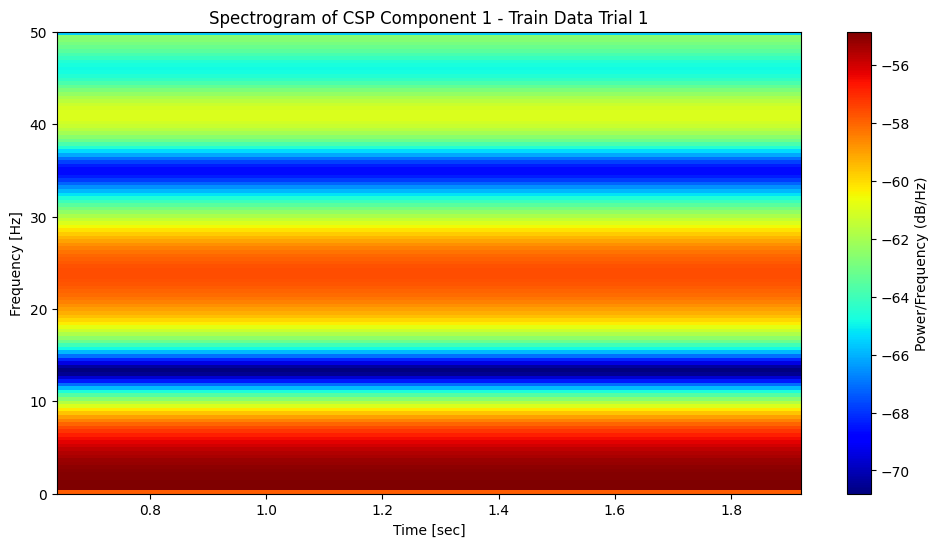

<ipython-input-31-20291d91f283>:4: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=6).
  plt.specgram(data[i, :], Fs=fs, NFFT=256, noverlap=128, cmap='jet')


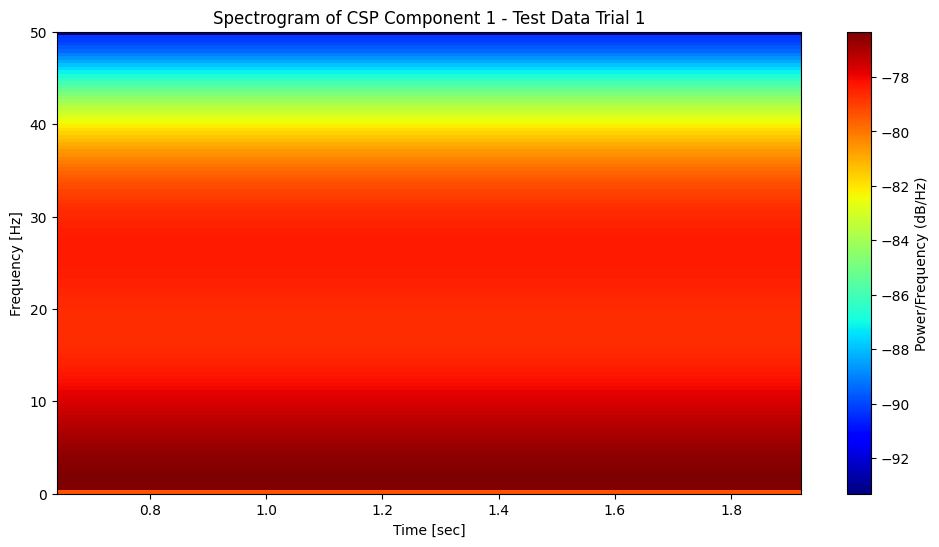

Plotting CSP Component 2


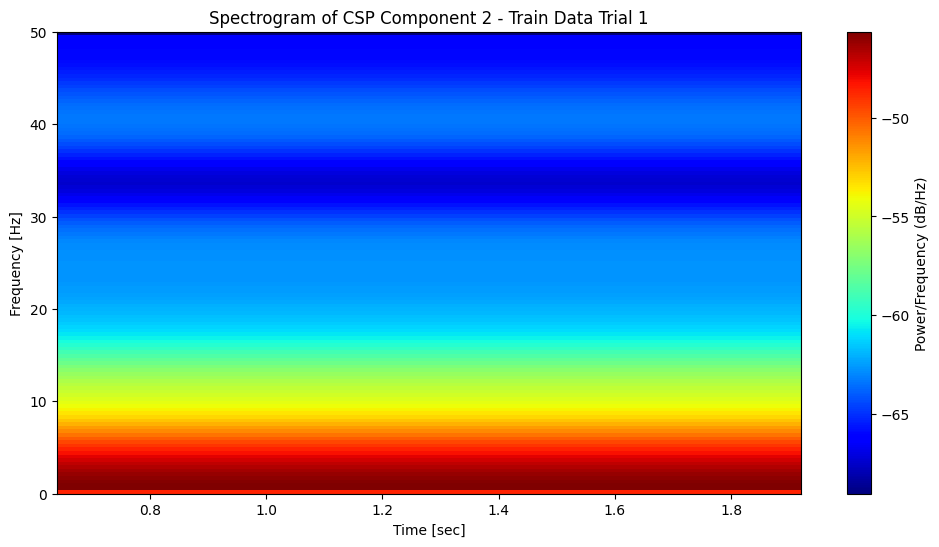

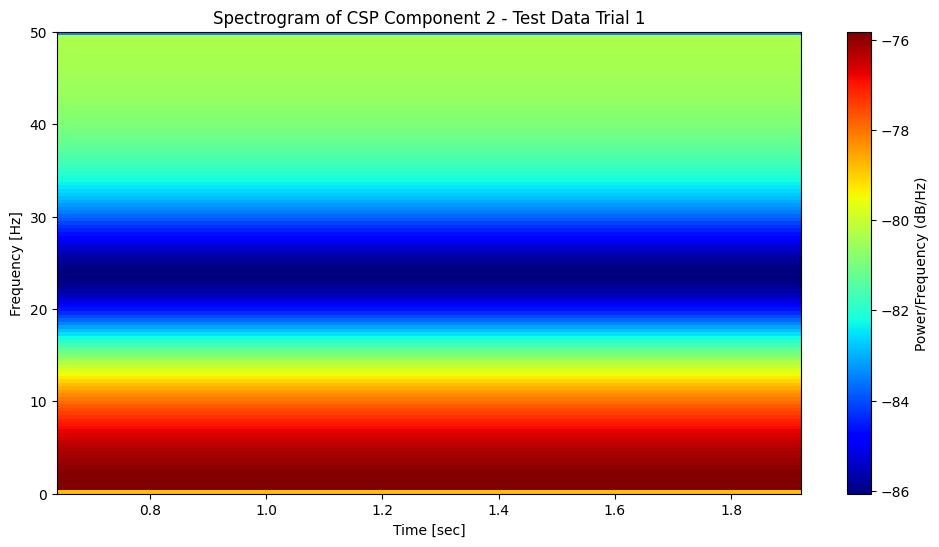

Plotting CSP Component 3


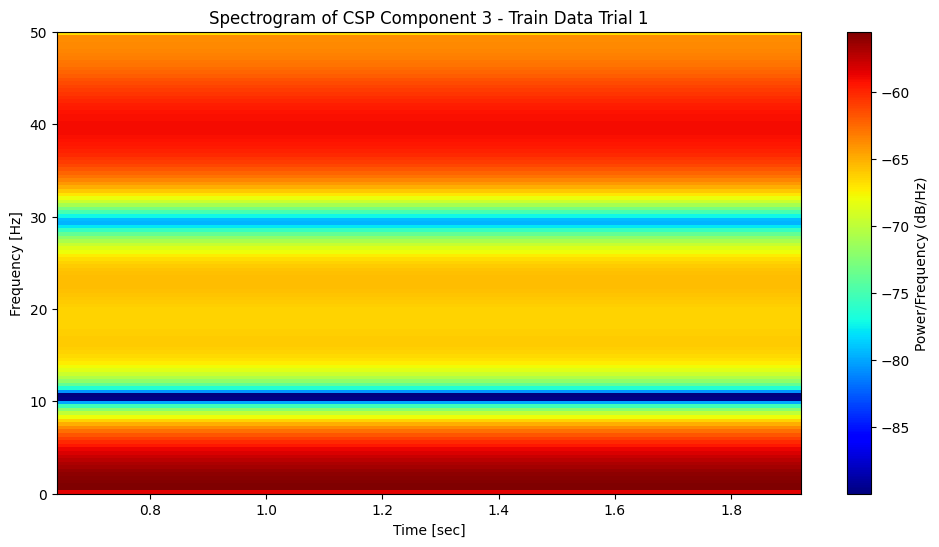

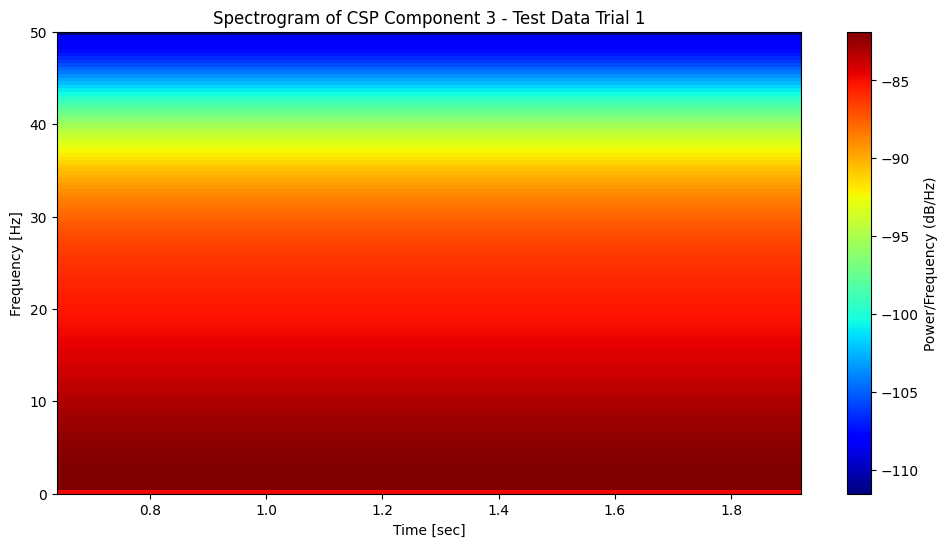

Plotting CSP Component 4


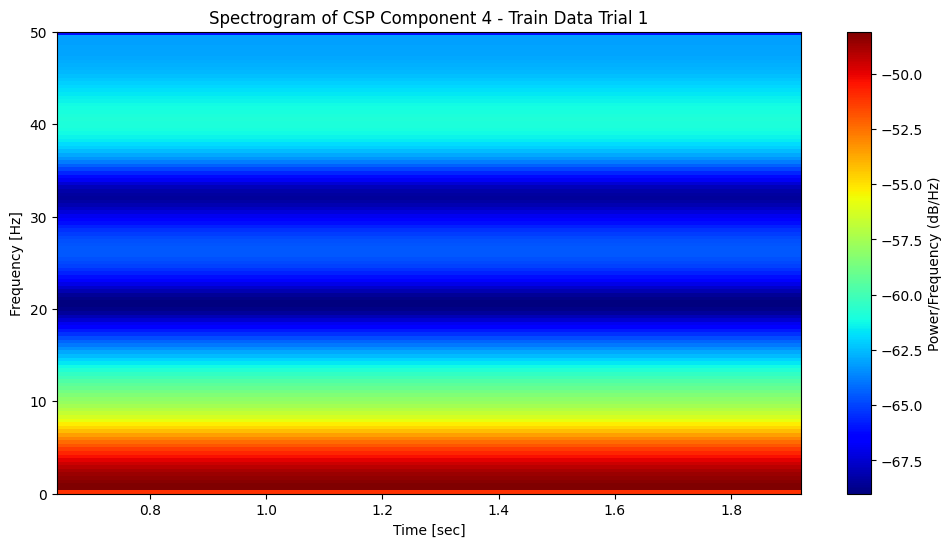

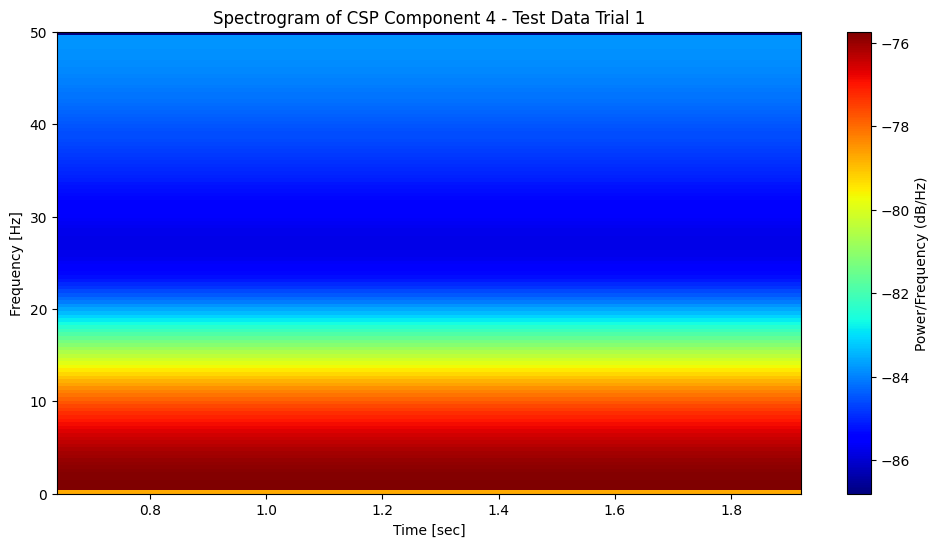

In [ ]:
def plot_spectrogram(data, fs, title):
    plt.figure(figsize=(12, 6))
    for i in range(data.shape[0]):
        plt.specgram(data[i, :], Fs=fs, NFFT=256, noverlap=128, cmap='jet')
        plt.ylabel('Frequency [Hz]')
        plt.xlabel('Time [sec]')
        plt.title(f'{title} Trial {i+1}')
        plt.colorbar(label='Power/Frequency (dB/Hz)')
        plt.show()

# Plotting the spectrogram for each CSP component
for i in range(4):
    print(f'Plotting CSP Component {i+1}')
    plot_spectrogram(transformed_X_train[:, i, np.newaxis].T, fs, f'Spectrogram of CSP Component {i+1} - Train Data')
    plot_spectrogram(transformed_X_test[:, i, np.newaxis].T, fs, f'Spectrogram of CSP Component {i+1} - Test Data')


In [ ]:
# Predictions on a per-sample basis
valid_samples = hp_data[lapID[:, 2].astype(bool)]
sample_labels = lapTrue[:, 1] - 1  # Adjust labels to be 0 and 1

# Calculate the correct number of samples
num_samples = valid_samples.shape[0] // n_times

# Reshape the data to (num_samples, n_channels, n_times)
eeg_samples = valid_samples.reshape((num_samples, n_times, n_channels)).transpose(0, 2, 1)

# Transform the data using the trained CSP
transformed_samples = np.array([csp.transform(epoch[np.newaxis, :, :])[0] for epoch in eeg_samples])

# Ensure the data is real
transformed_samples = np.abs(transformed_samples)

# Predict on the transformed samples
sample_predictions = clf.steps[-1][1].predict(transformed_samples)

# Calculate accuracy for per-sample predictions
sample_accuracy = accuracy_score(sample_labels[:num_samples], sample_predictions)
print(f'Per-sample accuracy: {sample_accuracy:.2f}')

Per-sample accuracy: 1.00


In [ ]:
#Hp 2Hz
hp_data = helpers.filter_data(cnt_data, 2, 100, filt_type='high', use_hilbert=True)
np.shape(hp_data)

(283562, 118)


## Training and running TIMBRE

In [ ]:
from TIMBRE.TIMBRE import TIMBRE
np.shape(lapID[:,0])

(283562,)

In [ ]:
# from TIMBRE.TIMBRE import TIMBRE

# fig, axs = plt.subplots(4, 4, figsize=(20, 5))

# trial_phase = 1
# n_folds = 5
# which_fold = 0

# # lapID array: 4 columns: 1- trial # (0-n); 2- which category(0, 1); 3- correct trial? (Na = incorrect; 1 for correct, 0 for na); 4- phase (1 for the position that have valid trials)
# # 350 sample a block,
# # n by 4

# lapTrue = lapID[lapID[:,1].astype(bool),:]
# test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# wLFPs, _, _ = helpers.whiten(hp_data[lapID[:,2].astype(bool)], train_inds)

# #n_bins = 20
# #pos_binned = helpers.group_by_pos(lapID[:,1], n_bins, train_inds)
# #arm_and_pos_binned = lapID[:, 2] * n_bins + pos_binned
# accuracy=np.zeros(axs.shape[0])


# titles = ['Projection (real part)', 'Amplitude', 'Softmax 1', 'Softmax 2 (Output)']
# for i in range(axs.shape[0]):
#     print(f"Training network {i + 1} of {axs.shape[0]} (hidden layer size { 4* 2 ** i})")  # try 4 different hidden layer sizes
#     m, _, accuracy[i] = TIMBRE(wLFPs, lapTrue[:,1], test_inds, train_inds, hidden_nodes = 0)  # train network

#     # Print the shapes of each layer
#     print(f"Input layer shape: {m.input_shape}")
#     for layer in m.layers:
#         print(f"Layer {layer.name} shape: {layer.output_shape}")

#     # for j in range(axs.shape[1]):  # Loop through each layer
#     #     p = helpers.layer_output(wLFPs[test_inds], m, j)  # Calculate layer's response to input, using only test data
#     #     if j == 0:
#     #         p = p[:, :p.shape[1] // 2]  # just get real component for complex-valued output
#     #         axs[i, 0].set_ylabel(str(3 * 2 ** i) + ' features')
#     #     if i == 0:
#     #         axs[0, j].set_title((titles[j]))
#     #     axs[i, j].plot(helpers.accumarray(arm_and_pos_binned[test_inds], p))  # plot mean response of layer to test data as a function of position
#     #     axs[i, j].autoscale(enable=True, axis='both', tight=True)
#     #     if i < axs.shape[0] - 1:
#     #         axs[i, j].set_xticks([])
#     #     else:
#     #         axs[i, j].set_xlabel('Position')
# print(accuracy)

In [ ]:
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
wLFPs, u, Xv = helpers.whiten(hp_data[lapID[:,2].astype(bool)], train_inds)

# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Train the network
model, _, accuracy = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes= 2)
# Use the predict method on the returned model
predictions = model.predict(wLFPs_processed)

print(f"Input layer shape: {model.input_shape}")

for layer in model.layers:
    print(f"Layer {layer.name} shape: {layer.output_shape}")
print(accuracy)

In [ ]:
pred_mean=np.mean(predictions,axis=0)
predictions_bin=predictions-pred_mean
predictions_bin=np.argmax(predictions_bin,axis=1)

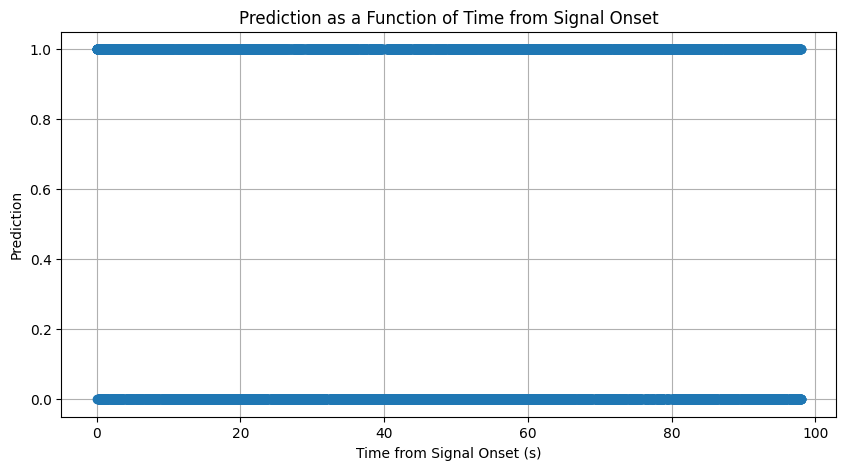

In [ ]:
fs = 100
pred_mean = np.mean(predictions, axis=0)
predictions_bin = predictions - pred_mean

# Find the class with the highest probability
predictions_bin = np.argmax(predictions_bin, axis=1)

# Create a time array matching the length of predictions_bin
time = np.linspace(0, len(predictions_bin) / fs, len(predictions_bin))
time= time.reshape(-2)


plt.figure(figsize=(10, 5))
plt.plot(time, predictions_bin, 'o')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Prediction')
plt.title('Prediction as a Function of Time from Signal Onset')
plt.grid(True)
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score
from keras.models import Model

n_times = 350
n_trials = len(predictions) // n_times

# second_last_layer_output = model.layers[-2].output
# second_last_layer_model = Model(inputs=model.input, outputs=second_last_layer_output)
# second_last_layer_predictions = second_last_layer_model.predict(wLFPs_processed)

weights, biases = model.layers[-1].get_weights()
pre_softmax_predictions = np.dot(predictions, weights) + biases

# Reshape into trials
predictions_reshaped = predictions.reshape((n_trials, n_times, 2))
pre_softmax_predictions_reshaped = pre_softmax_predictions.reshape((n_trials, n_times, 2)) # Ajust to the number of hidden node

def calculate_trial_predictions(predictions_reshaped, pre_softmax_predictions_reshaped, operation):
    if operation == "multiply_before_softmax":
        trial_probabilities = np.prod(pre_softmax_predictions_reshaped, axis=1)
    elif operation == "multiply_after_softmax":
        trial_probabilities = np.prod(predictions_reshaped, axis=1)
    elif operation == "add_before_softmax":
        trial_probabilities = np.sum(pre_softmax_predictions_reshaped, axis=1)
    elif operation == "add_after_softmax":
        trial_probabilities = np.sum(np.log10(predictions_reshaped), axis=1)

    trial_predictions = np.argmax(trial_probabilities, axis=1)
    return trial_predictions

true_trial_labels = lapTrue[:, 1][::n_times] - 1  # Adjust labels to be 0 and 1

operations = ["multiply_before_softmax", "multiply_after_softmax", "add_before_softmax", "add_after_softmax"]
accuracies = {}

for operation in operations:
    trial_predictions = calculate_trial_predictions(predictions_reshaped, pre_softmax_predictions_reshaped, operation)
    trial_accuracy = accuracy_score(true_trial_labels, trial_predictions)
    accuracies[operation] = trial_accuracy
    print(f'Trial Accuracy ({operation}): {trial_accuracy}')

ValueError: The layer sequential has never been called and thus has no defined input.

###Optimizing learning rate

In [ ]:
pip install keras-tuner

In [ ]:
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
trial_phase = 1
n_folds = 5
which_fold = 0


lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")


def build_model(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds,  train_inds, hidden_nodes=8)

    learn_rate = hp.Choice('learning_rate', values=[1e-5, 1e-4, 1e-3, 1e-2, 1e-1])
    optimizer = Adam(learning_rate=learn_rate)

    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Define the tuner
tuner = kt.Hyperband(
    build_model,
    objective='val_accuracy',
    max_epochs=100,
    factor=3,
    directory='my_dir',
    project_name='intro_to_kt'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)

X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the search
tuner.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best hyperparameters
best_hp = tuner.get_best_hyperparameters()[0]
best_lr = best_hp.get('learning_rate')

print(f'Best learning rate: {best_lr}')

# Build the model with the best hyperparameters and train it
best_model = build_model(best_hp)
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


In [ ]:
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt

# Assumed variables and data
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Define model building function for initial search
values = np.random.shuffle([1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])

def build_model_initial(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values)
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Initial hyperparameter search
tuner_initial = kt.Hyperband(
    build_model_initial,
    objective='val_accuracy',
    max_epochs=50,  # Use a smaller number of epochs for initial search
    factor=3,
    directory='my_dir',
    project_name='initial_lr_search'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)
X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the initial search
tuner_initial.search(X_train, y_train, epochs=50, validation_data=(X_val, y_val))

# Get the best learning rate from the initial search
best_hp_initial = tuner_initial.get_best_hyperparameters()[0]
best_lr_initial = best_hp_initial.get('learning_rate')
print(f'Best learning rate from initial search: {best_lr_initial}')

# Define model building function for refined search
values = np.random.shuffle([best_lr_initial/5, best_lr_initial/10, best_lr_initial/2, best_lr_initial, best_lr_initial*10, best_lr_initial*2, best_lr_initial*5])

def build_model_refined(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values)
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Refined hyperparameter search
tuner_refined = kt.Hyperband(
    build_model_refined,
    objective='val_accuracy',
    max_epochs=100,  # Increase the number of epochs for refined search
    factor=3,
    directory='my_dir',
    project_name='refined_lr_search'
)

# Perform the refined search
tuner_refined.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best learning rate from the refined search
best_hp_refined = tuner_refined.get_best_hyperparameters()[0]
best_lr_refined = best_hp_refined.get('learning_rate')
print(f'Best learning rate from refined search: {best_lr_refined}')

# Visualize the learning rate vs. performance
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
plt.show()

# Build and train the final model with the best learning rate
def build_model_final():
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    optimizer = Adam(learning_rate=best_lr_refined)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

best_model = build_model_final()
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


In [ ]:
# Extract trials and their hyperparameters and metrics
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))

# Print learning rates and validation accuracies in the order they were evaluated
print("Learning Rate | Validation Accuracy")
print("-----------------------------------")
for trial in trials:
    lr = trial.hyperparameters.get('learning_rate')
    val_acc = trial.metrics.get_best_value('val_accuracy')
    print(f"{lr:.5e} | {val_acc:.5f}")

# Plot learning rate vs. validation accuracy with markers indicating the order
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-', label='Validation Accuracy')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
for i, txt in enumerate(range(len(lrs))):
    plt.annotate(txt, (lrs[i], val_accuracies[i]), textcoords="offset points", xytext=(0,10), ha='center')
plt.legend()
plt.show()


In [ ]:
import random
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt

# Assumed variables and data
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Define model building function for initial search
def build_model_initial(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values=[1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Initial hyperparameter search
tuner_initial = kt.Hyperband(
    build_model_initial,
    objective='val_accuracy',
    max_epochs=50,  # Use a smaller number of epochs for initial search
    factor=3,
    directory='my_dir',
    project_name='initial_lr_search'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)
X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the initial search
tuner_initial.search(X_train, y_train, epochs=50, validation_data=(X_val, y_val))

# Get the best learning rate from the initial search
best_hp_initial = tuner_initial.get_best_hyperparameters()[0]
best_lr_initial = best_hp_initial.get('learning_rate')
print(f'Best learning rate from initial search: {best_lr_initial}')

# Define a list of learning rates for the refined search and shuffle it
learning_rates = [best_lr_initial/5, best_lr_initial/10, best_lr_initial/2, best_lr_initial, best_lr_initial*10, best_lr_initial*2, best_lr_initial*5]
random.shuffle(learning_rates)

# Define model building function for refined search with shuffled learning rates
def build_model_refined(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values=learning_rates)
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Custom search function to shuffle the trials
class ShuffledHyperband(kt.Hyperband):
    def run_trial(self, trial, *args, **kwargs):
        random.shuffle(trial.hyperparameters.space['learning_rate'].values)
        super(ShuffledHyperband, self).run_trial(trial, *args, **kwargs)

# Refined hyperparameter search with shuffled trials
tuner_refined = ShuffledHyperband(
    build_model_refined,
    objective='val_accuracy',
    max_epochs=100,  # Increase the number of epochs for refined search
    factor=3,
    directory='my_dir',
    project_name='refined_lr_search'
)

# Perform the refined search
tuner_refined.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best learning rate from the refined search
best_hp_refined = tuner_refined.get_best_hyperparameters()[0]
best_lr_refined = best_hp_refined.get('learning_rate')
print(f'Best learning rate from refined search: {best_lr_refined}')

# Visualize the learning rate vs. performance
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
plt.show()

# Build and train the final model with the best learning rate
def build_model_final():
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    optimizer = Adam(learning_rate=best_lr_refined)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

best_model = build_model_final()
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


In [ ]:
import random
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt

# Assumed variables and data
trial_phase = 1
n_folds = 5
which_fold = 0

lapTrue = lapID[lapID[:,2].astype(bool),:]
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)
# Process wLFPs to match expected input shape
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Check the shape of wLFPs after processing
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Define model building function for initial search
def build_model_initial(hp):
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    learning_rate = hp.Choice('learning_rate', values=[1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Initial hyperparameter search
tuner_initial = kt.Hyperband(
    build_model_initial,
    objective='val_accuracy',
    max_epochs=50,  # Use a smaller number of epochs for initial search
    factor=3,
    directory='my_dir',
    project_name='initial_lr_search'
)

# Split the data
train_idx, val_idx = test_train(lapTrue, trial_phase, n_folds, which_fold)
X_train, X_val = wLFPs_processed[train_idx], wLFPs_processed[val_idx]
y_train, y_val = lapTrue[train_idx, 1] - 1, lapTrue[val_idx, 1] - 1

# Perform the initial search
tuner_initial.search(X_train, y_train, epochs=50, validation_data=(X_val, y_val))

# Get the best learning rate from the initial search
best_hp_initial = tuner_initial.get_best_hyperparameters()[0]
best_lr_initial = best_hp_initial.get('learning_rate')
print(f'Best learning rate from initial search: {best_lr_initial}')

# Define a list of learning rates for the refined search and shuffle it
learning_rates = [best_lr_initial/5, best_lr_initial/10, best_lr_initial/2, best_lr_initial, best_lr_initial*10, best_lr_initial*2, best_lr_initial*5]
random.shuffle(learning_rates)

# Define model building function for refined search
class RefinedHyperModel(kt.HyperModel):
    def __init__(self, learning_rates):
        self.learning_rates = learning_rates
        random.shuffle(self.learning_rates)

    def build(self, hp):
        model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
        learning_rate = hp.Choice('learning_rate', values=self.learning_rates)
        optimizer = Adam(learning_rate=learning_rate)
        model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
        return model

# Refined hyperparameter search
tuner_refined = kt.Hyperband(
    RefinedHyperModel(learning_rates),
    objective='val_accuracy',
    max_epochs=100,  # Increase the number of epochs for refined search
    factor=3,
    directory='my_dir',
    project_name='refined_lr_search'
)

# Perform the refined search
tuner_refined.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Get the best learning rate from the refined search
best_hp_refined = tuner_refined.get_best_hyperparameters()[0]
best_lr_refined = best_hp_refined.get('learning_rate')
print(f'Best learning rate from refined search: {best_lr_refined}')

# Visualize the learning rate vs. performance
trials = tuner_refined.oracle.get_best_trials(num_trials=len(tuner_refined.oracle.trials))
lrs = [trial.hyperparameters.get('learning_rate') for trial in trials]
val_accuracies = [trial.metrics.get_best_value('val_accuracy') for trial in trials]

plt.figure(figsize=(10, 6))
plt.plot(lrs, val_accuracies, 'bo-')
plt.xscale('log')
plt.xlabel('Learning Rate')
plt.ylabel('Validation Accuracy')
plt.title('Learning Rate vs. Validation Accuracy')
plt.show()

# Build and train the final model with the best learning rate
def build_model_final():
    model, _, _ = TIMBRE(wLFPs, lapTrue[:,1]-1, test_inds, train_inds, hidden_nodes=8)
    optimizer = Adam(learning_rate=best_lr_refined)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

best_model = build_model_final()
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))


### Power Spectrum

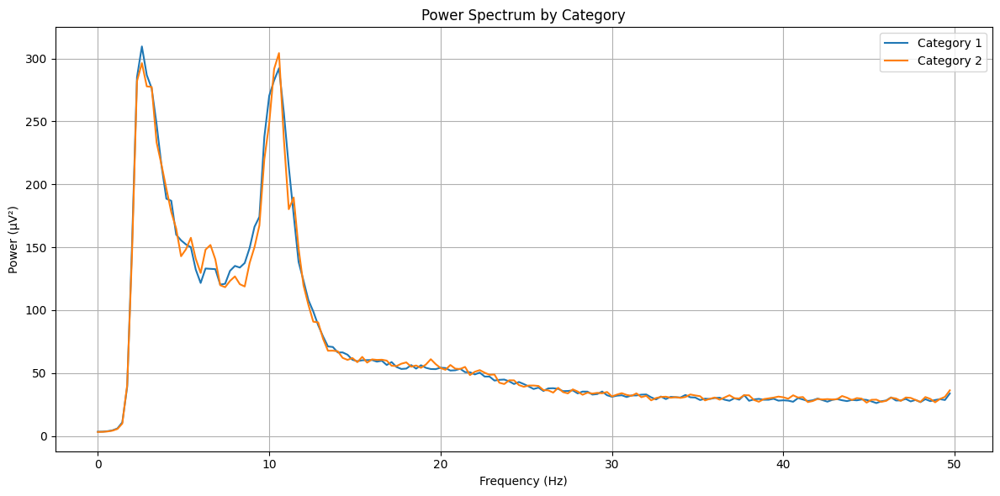

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

fs = 100
segment_length = 350

# Get EEG data for each category
category_1_indices = lapTrue[:, 1] == 1
category_2_indices = lapTrue[:, 1] == 2

eeg_data_cat1 = wLFPs_processed[category_1_indices]
eeg_data_cat2 = wLFPs_processed[category_2_indices]

# Function to compute power spectrum for segments
def compute_power_spectrum(eeg_data, fs, segment_length):
    num_segments = eeg_data.shape[0] // segment_length
    power_spectra = []

    for i in range(num_segments):
        segment = eeg_data[i*segment_length:(i+1)*segment_length, :]
        fft_data = np.fft.fft(segment, axis=0)
        frequencies = np.fft.fftfreq(segment_length, d=1/fs)

        # Take only the first half frequencies
        half_frequencies = frequencies[:len(frequencies)//2]
        fft_data = fft_data[:len(frequencies)//2, :]

        # Compute the power spectrum
        power_spectrum = np.abs(fft_data)**2
        power_spectra.append(np.mean(power_spectrum, axis=1))

    # Average the power spectra across segments
    mean_power_spectrum = np.mean(power_spectra, axis=0)

    return half_frequencies, mean_power_spectrum

# Compute power spectrum for each category
freq_cat1, power_spectrum_cat1 = compute_power_spectrum(eeg_data_cat1, fs, segment_length)
freq_cat2, power_spectrum_cat2 = compute_power_spectrum(eeg_data_cat2, fs, segment_length)

# Plot the power spectrum for each category
plt.figure(figsize=(12, 6))

plt.plot(freq_cat1, power_spectrum_cat1, label='Category 1')
plt.plot(freq_cat2, power_spectrum_cat2, label='Category 2')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (µV²)')
plt.title('Power Spectrum by Category')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


### Accuracy v. time plot


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model

# Define parameters for data processing and model
trial_phase = 1
n_folds = 5
which_fold = 0
fs = 100  # Example sampling frequency in Hz

# Filter out rows where lapID[:, 2] is 0 (invalid samples)
lapTrue = lapID[lapID[:, 2].astype(bool), :]

# Get test and train indices
test_inds, train_inds = test_train(lapTrue, trial_phase, n_folds, which_fold)

# Process wLFPs to match expected input shape (concatenate real and imaginary parts)
wLFPs_processed = np.concatenate((np.real(wLFPs), np.imag(wLFPs)), axis=1)

# Print the shape of the processed data
print(f"Shape of wLFPs after processing: {wLFPs_processed.shape}")

# Function to calculate average accuracy over time for given hidden nodes
def train_nn(hidden_nodes):
    # Train the network using the TIMBRE function
    model, _, train_accuracy = TIMBRE(wLFPs, lapTrue[:, 1] - 1, test_inds, train_inds, hidden_nodes=hidden_nodes, learn_rate=0.0001)

    # Predict on the test set
    predictions = np.argmax(model.predict(wLFPs_processed[test_inds]), axis=1)  # Predictions for the test set

    # Extract true labels for the test set
    true_labels = lapTrue[test_inds, 1] - 1  # Adjusting labels to match zero-based indexing if necessary

    # Compute accuracy per time point
    accuracy_per_time_point = predictions == true_labels  # Boolean array of True/False

    running_sum = np.zeros(350)
    max_trial_index = int(np.max(lapTrue[:, 0]))
    lapTrue_test = lapTrue[test_inds]

    for i in range(max_trial_index):
        inds = (lapTrue_test[:, 0] == i) & (lapTrue_test[:, 2] == 1)

        if np.sum(inds) > 0:
            trial_data = accuracy_per_time_point[inds]

        running_sum += trial_data

    average_accuracy_by_time = running_sum / max_trial_index

    return average_accuracy_by_time

Shape of wLFPs after processing: (9800, 236)


In [ ]:
# Train TIMBRE on different hidden nodes
hidden_node_sizes = [8]
average_accuracies = {}

for hn in hidden_node_sizes:
    print(f"Training TIMBRE for hidden_nodes={hn}")
    average_accuracies[hn] = train_nn(hn)

Training TIMBRE for hidden_nodes=8
66/66 [==============================] - 0s 2ms/step


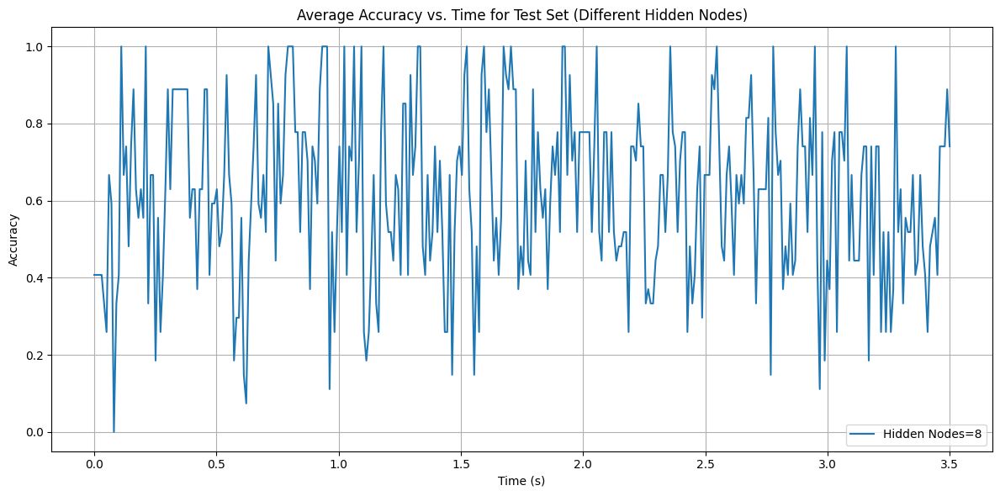

Overall accuracy for hidden nodes=8: 0.62


In [ ]:
# Create a time array for plotting
time_points = np.linspace(0, 350 / fs, 350)

# Plot the averaged accuracy over time for different hidden node sizes
plt.figure(figsize=(12, 6))
# plt.plot(time, logistic_probs, label='Logistic Model', linewidth=2, linestyle='--')

for hn in hidden_node_sizes:
  plt.plot(time_points, average_accuracies[hn], label=f'Hidden Nodes={hn}')

plt.xlabel('Time (s)')
plt.ylabel('Accuracy')
plt.title('Average Accuracy vs. Time for Test Set (Different Hidden Nodes)')
plt.grid(True)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

# Calculate and print the overall accuracy for the test set (example for one hidden node size)
#overall_accuracy_2 = np.mean(average_accuracies[2])
#overall_accuracy_4 = np.mean(average_accuracies[4])
overall_accuracy_8 = np.mean(average_accuracies[8])
#print(f"Overall accuracy for hidden nodes=2: {overall_accuracy_2:.2f}")
#print(f"Overall accuracy for hidden nodes=4: {overall_accuracy_4:.2f}")
print(f"Overall accuracy for hidden nodes=8: {overall_accuracy_8:.2f}")
#print(f"Logistic model: {np.mean(logistic_probs):.4f}")



### Confidence plots

66/66 [==============================] - 0s 3ms/step


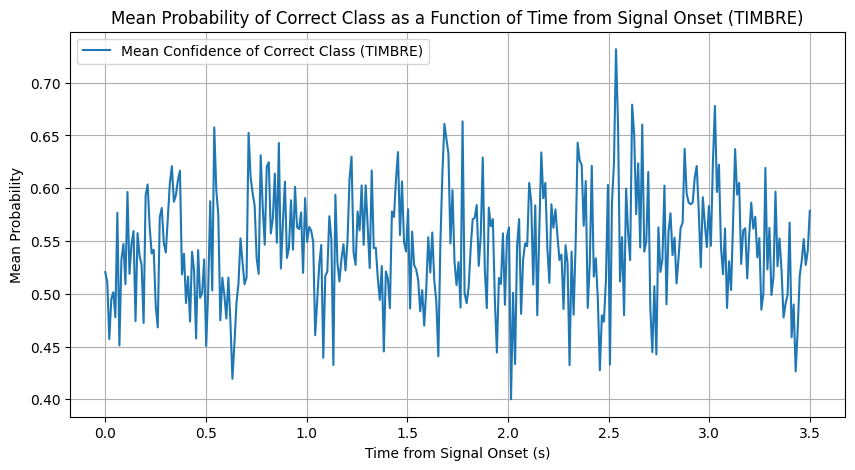

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Train the TIMBRE model

model, _, train_accuracy = TIMBRE(wLFPs, lapTrue[:, 1] - 1, test_inds, train_inds, hidden_nodes=2, learn_rate=1e-4)

correct_label = (lapTrue[test_inds, 1] - 1).astype(int)

# Predict probabilities for the test set
predictions_prob = model.predict(wLFPs_processed[test_inds])

# Extract the confidence levels for the correct class
correct_class_probabilities = []
for i in range(len(wLFPs_processed[test_inds])):
    correct_class_probabilities.append(predictions_prob[i][correct_label[i]])

correct_class_probabilities = np.array(correct_class_probabilities)

# Compute mean probabilities over each segment
segment_length = int(350)
num_segments = len(correct_class_probabilities) // segment_length
probabilities_reshaped = correct_class_probabilities[:num_segments * segment_length].reshape((num_segments, segment_length))
TIMBREprobabilities_avg = probabilities_reshaped.mean(axis=0)

# Time array for plotting
time = np.linspace(0, segment_length / fs, segment_length)
time = time.reshape(-1)

# Plotting the mean probabilities of the correct class for the TIMBRE model
plt.figure(figsize=(10, 5))
plt.plot(time, TIMBREprobabilities_avg, label='Mean Confidence of Correct Class (TIMBRE)')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Mean Probability')
plt.title('Mean Probability of Correct Class as a Function of Time from Signal Onset (TIMBRE)')
plt.legend()
plt.grid(True)
plt.show()


### Power plot for hidden node


In [ ]:
#run confidence plots first!
hidden_layer_model = Model(inputs=model.input, outputs=model.layers[0].output)
hidden_layer_activations = hidden_layer_model.predict(wLFPs_processed[test_inds])
correct_label = (lapTrue[test_inds, 1] - 1).astype(int)

66/66 [==============================] - 0s 1ms/step


In [ ]:
hidden_activations_cat1 = [hidden_layer_activations[correct_label == 0, i] for i in range(2)]
hidden_activations_cat2 = [hidden_layer_activations[correct_label == 1, i] for i in range(2)]

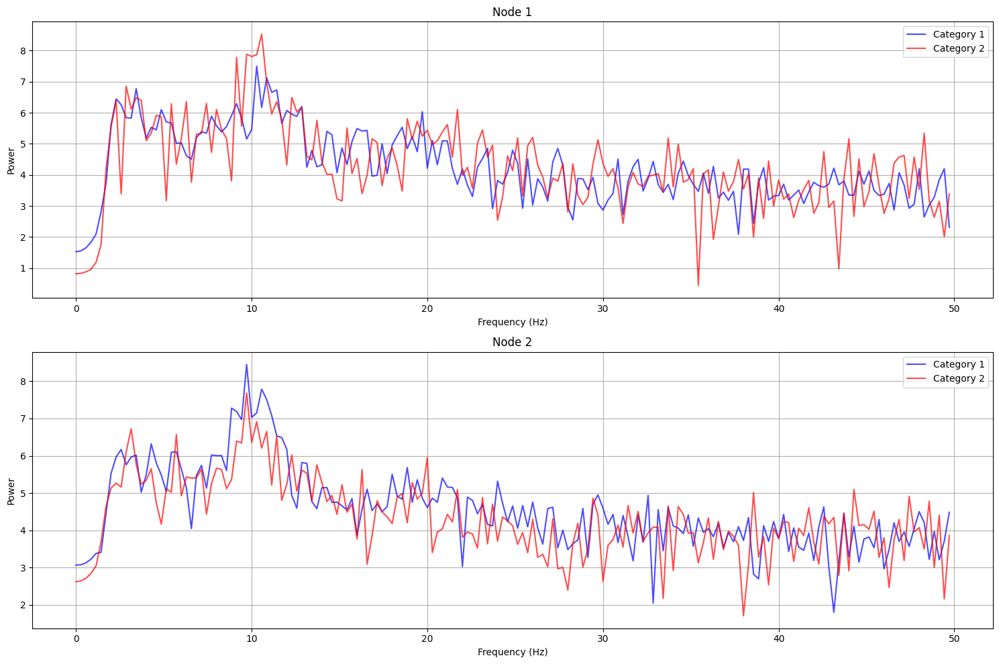

In [ ]:
def compute_power_spectrum(activations, fs, segment_length):
    num_segments = len(activations) // segment_length
    power_spectra = []

    for i in range(num_segments):
        segment = activations[i * segment_length:(i + 1) * segment_length]
        fft_data = np.fft.fft(segment)
        frequencies = np.fft.fftfreq(segment_length, d=1 / fs)

        # Take only the first half frequencies
        half_frequencies = frequencies[:len(frequencies) // 2]
        fft_data = fft_data[:len(frequencies) // 2]

        # Compute the power spectrum
        power_spectrum = np.abs(fft_data) ** 2
        power_spectra.append(power_spectrum)

    # Average the power spectra across segments
    mean_power_spectrum = np.mean(power_spectra, axis=0)

    return half_frequencies, mean_power_spectrum

fs = 100
segment_length = 350

# Compute power spectrum for each hidden node
freq_hidden_nodes_cat1 = []
power_spectrum_hidden_nodes_cat1 = []
freq_hidden_nodes_cat2 = []
power_spectrum_hidden_nodes_cat2 = []


# Function to plot power spectrum for all hidden nodes
def plot_all_power_spectra(frequencies_list_cat1, power_spectrum_list_cat1, frequencies_list_cat2, power_spectrum_list_cat2, num_nodes):
    fig, axes = plt.subplots(num_nodes // 1, 1, figsize=(15, 10))  # Adjust grid size to fit all nodes
    axes = axes.flatten()

    for i in range(num_nodes):
        power_spectrum_cat1 = np.log(power_spectrum_list_cat1[i])
        power_spectrum_cat2 = np.log(power_spectrum_list_cat2[i])

        axes[i].plot(frequencies_list_cat1[i], power_spectrum_cat1, label='Category 1', color='b', alpha=0.7)
        axes[i].plot(frequencies_list_cat2[i], power_spectrum_cat2, label='Category 2', color='r', alpha=0.7)
        axes[i].set_xlabel('Frequency (Hz)')
        axes[i].set_ylabel('Power')
        axes[i].set_title(f'Node {i + 1}')
        axes[i].legend()
        axes[i].grid(True)

    plt.tight_layout()
    plt.show()

# Compute power spectrum for each hidden node
fs = 100
segment_length = 350
hidden_nodes = 2

freq_hidden_nodes_cat1 = []
power_spectrum_hidden_nodes_cat1 = []
freq_hidden_nodes_cat2 = []
power_spectrum_hidden_nodes_cat2 = []

for i in range(hidden_nodes):
    freq_cat1, power_spectrum_cat1 = compute_power_spectrum(hidden_activations_cat1[i], fs, segment_length)
    freq_cat2, power_spectrum_cat2 = compute_power_spectrum(hidden_activations_cat2[i], fs, segment_length)

    freq_hidden_nodes_cat1.append(freq_cat1)
    power_spectrum_hidden_nodes_cat1.append(power_spectrum_cat1)
    freq_hidden_nodes_cat2.append(freq_cat2)
    power_spectrum_hidden_nodes_cat2.append(power_spectrum_cat2)

# Plot all power spectra
plot_all_power_spectra(freq_hidden_nodes_cat1, power_spectrum_hidden_nodes_cat1, freq_hidden_nodes_cat2, power_spectrum_hidden_nodes_cat2, hidden_nodes)


## Anatomical maps

In [ ]:
#positions
info = al['nfo']
x_positions = info['xpos']
x_positions=np.array(x_positions)
X_POS=x_positions.reshape(-3)

y_positions= info['ypos']
y_positions=np.array(y_positions)
Y_POS=y_positions.reshape(-3)

[90 22 74 52 45 23 56 50 44 43]


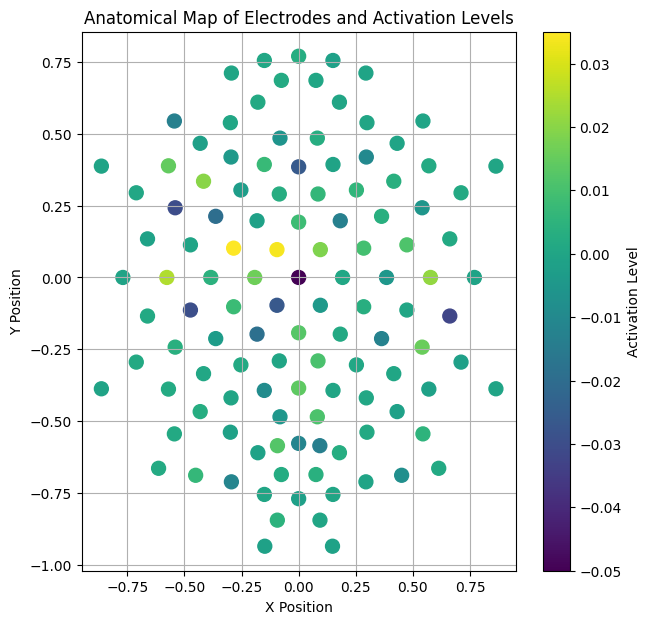

In [ ]:
#Linear model Activation map
activation_levels = logistic_model.coef_[0]
activation_levels = np.array(activation_levels)
top_10_channels = np.argsort(activation_levels)[-10:]
print(top_10_channels)

# Create a scatter plot of the electrode positions
plt.figure(figsize=(7, 7))
plt.scatter(X_POS[0], Y_POS[0], c=activation_levels, cmap='rwb', s=100)
plt.colorbar(label='Activation Level')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.title('Anatomical Map of Electrodes and Activation Levels')
plt.grid(True)
plt.show()


In [ ]:
def unwhiten(X_whitened, u, Xv):
   X_unscaled = X_whitened * Xv
   X_unwhitened = X_unscaled @ u.T
   return X_unwhitened

In [ ]:
LFPs=unwhiten(wLFPs, u, Xv)
LFPs_processed = np.concatenate((np.real(LFPs), np.imag(LFPs)), axis=1)
model.predict(LFPs_processed)

2450/2450 [==============================] - 12s 5ms/step


array([[0.00120289, 0.9987972 ],
       [0.93028146, 0.06971864],
       [0.93030494, 0.06969503],
       ...,
       [0.00120288, 0.9987972 ],
       [0.9783159 , 0.02168406],
       [0.97830963, 0.02169033]], dtype=float32)

[66 63  2  8  1 15 24  7  3  0]


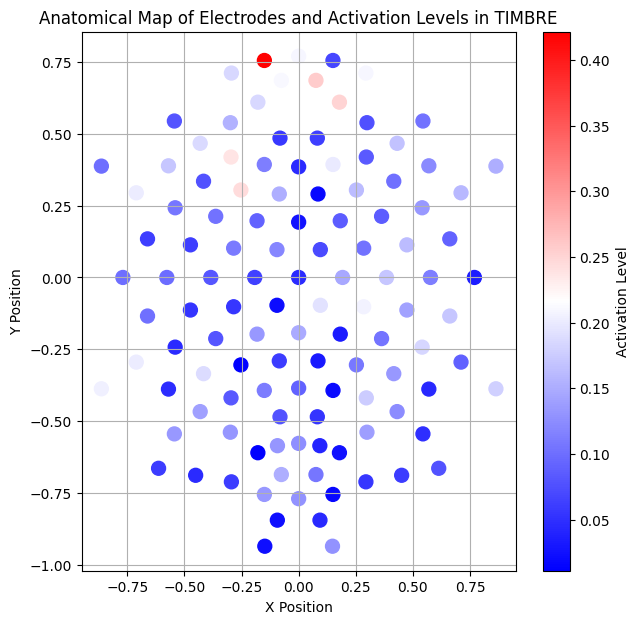

In [ ]:
#TIMBRE activation map
complex_weights = model.layers[0].get_weights()[0]
activation_levels = np.abs(complex_weights[:, 0] + 1j * complex_weights[:, 1])

activation_levels = np.array(activation_levels)

top_10_channels = np.argsort(activation_levels)[-10:]
print(top_10_channels)

plt.figure(figsize=(7, 7))
plt.scatter(X_POS[0], Y_POS[0], c=activation_levels, cmap='bwr', s=100)
plt.colorbar(label='Activation Level')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.title('Anatomical Map of Electrodes and Activation Levels in TIMBRE')
plt.grid(True)
plt.show()


### Complexlm

In [ ]:
real_part = model.layers[0].get_weights()[0]
imag_part = model.layers[0].get_weights()[1]

complex_weights = real_part + 1j * imag_part


if not np.iscomplexobj(complex_weights):
    raise TypeError("The weights are not complex numbers")

real_part = np.real(complex_weights)
imag_part = np.imag(complex_weights)

std_real = np.std(real_part)
print(f'Standard deviation of real part: {std_real}')
std_imag = np.std(imag_part)
print(f'Standard deviation of imaginary part: {std_imag}')


Standard deviation of real part: 0.09195125848054886
Standard deviation of imaginary part: 0.09203896671533585


In [ ]:
# with open('complexIm.m', 'r') as file:
#     content = file.read()
# print(content)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb

def complexIm(in_array, sub=0, pow_val=1, scale=1, setMax=None, h=None):
    # Squeeze the input array to remove singleton dimensions
    in_array = np.squeeze(in_array)

    if sub:
        s = in_array.shape
        in_array_flat = in_array.flatten()
        in_array_flat -= np.mean(in_array_flat)
        in_array_real_imag = np.vstack((in_array_flat.real, in_array_flat.imag)).T
        cov_matrix = np.cov(in_array_real_imag, rowvar=False)
        in_array_flat = in_array_real_imag @ np.linalg.inv(np.sqrt(cov_matrix))
        in_array = (in_array_flat[:, 0] + 1j * in_array_flat[:, 1]).reshape(s)

    if setMax is None:
        setMax = np.percentile(np.abs(in_array), 99.9)

    if h is None:
        hsv_image = np.zeros((*in_array.shape, 3))
        hsv_image[..., 0] = (np.angle(in_array) * scale) % (2 * np.pi) / (2 * np.pi)
        hsv_image[..., 1] = 1
        hsv_image[..., 2] = np.minimum(1, np.power(np.abs(in_array) / setMax, pow_val))
    else:
        hsv_image = np.zeros((*in_array.shape, 3))
        hsv_image[..., 0] = np.angle(h)
        hsv_image[..., 1] = np.minimum(1, np.abs(h) / setMax)
        hsv_image[..., 2] = np.minimum(1, np.power(np.abs(in_array) / setMax, pow_val))

    # Handle NaN values
    hsv_image[..., 0][np.isnan(in_array)] = 1
    hsv_image[..., 2][np.isnan(in_array)] = 1
    hsv_image[..., 1][np.isnan(in_array)] = 0

    # Convert HSV to RGB
    rgb_image = hsv_to_rgb(hsv_image)

    return rgb_image

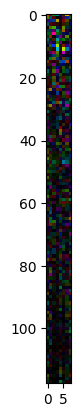

In [ ]:
img=complexIm(complex_weights)
plt.imshow(img)
plt.show()

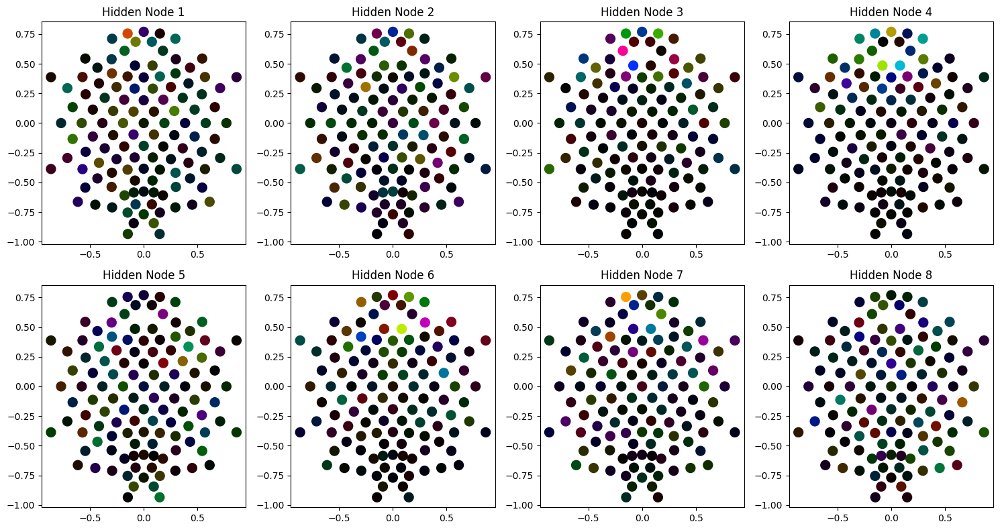

In [ ]:
num_hidden_nodes = img.shape[1]

# Create subplots
fig, axes = plt.subplots(2, 4, figsize=(15, 8))  # Adjust grid size according to number of hidden nodes
axes = axes.flatten()  # Flatten the array of axes for easy iteration

for i in range(num_hidden_nodes):
    # Extract RGB values for the current hidden node
    colors = img[:, i, :]
    scatter = axes[i].scatter(X_POS[0], Y_POS[0], c=colors, s=100)  # Use RGB colors for the scatter plot
    axes[i].set_title(f'Hidden Node {i+1}')

plt.tight_layout()
plt.show()

## Subject across models

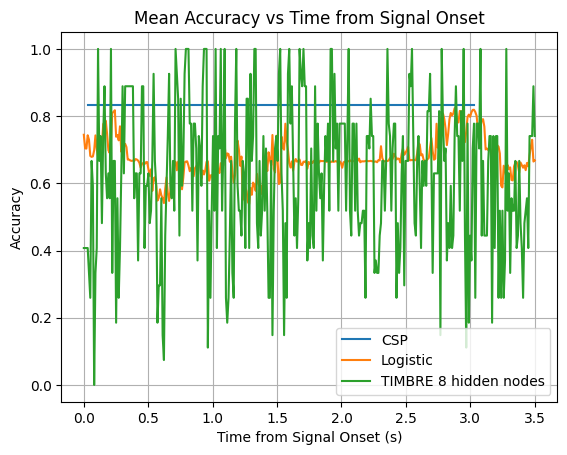

In [ ]:
ayCSP = CSPaccuracies
ayLogistic = logisticprobabilities_avg
ayTIMBRE = average_accuracies[hn]
plt.plot(times, CSPaccuracies, label='CSP')
plt.plot(time, logisticprobabilities_avg, label='Logistic')
plt.plot(time_points, average_accuracies[hn], label=f'TIMBRE {hn} hidden nodes')
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Accuracy')
plt.title('Mean Accuracy vs Time from Signal Onset')
plt.legend()
plt.grid(True)
plt.show()

# Models across subjects (maintaining same parameters)

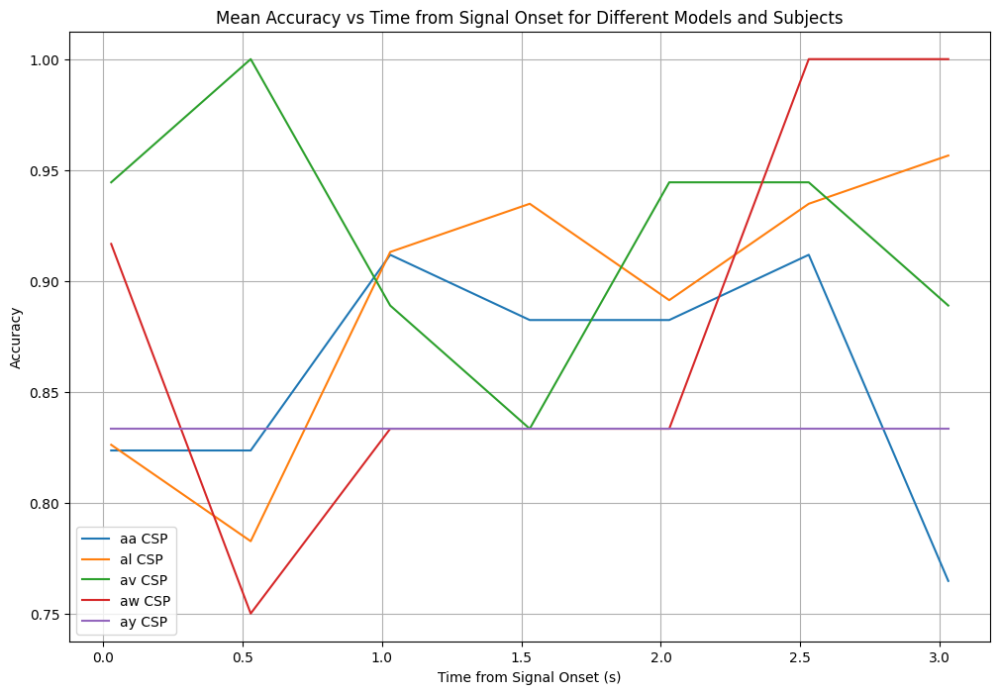

In [ ]:
plt.figure(figsize=(12, 8))

# Plot CSP accuracies
plt.plot(times, aaCSP, label='aa CSP')
plt.plot(times, alCSP, label='al CSP')
plt.plot(times, avCSP, label='av CSP')
plt.plot(times, awCSP, label='aw CSP')
plt.plot(times, ayCSP, label='ay CSP')

# Customize the plot
plt.xlabel('Time from Signal Onset (s)')
plt.ylabel('Accuracy')
plt.title('Mean Accuracy vs Time from Signal Onset for Different Models and Subjects')
plt.legend()
plt.grid(True)

# Display the plot
plt.show()


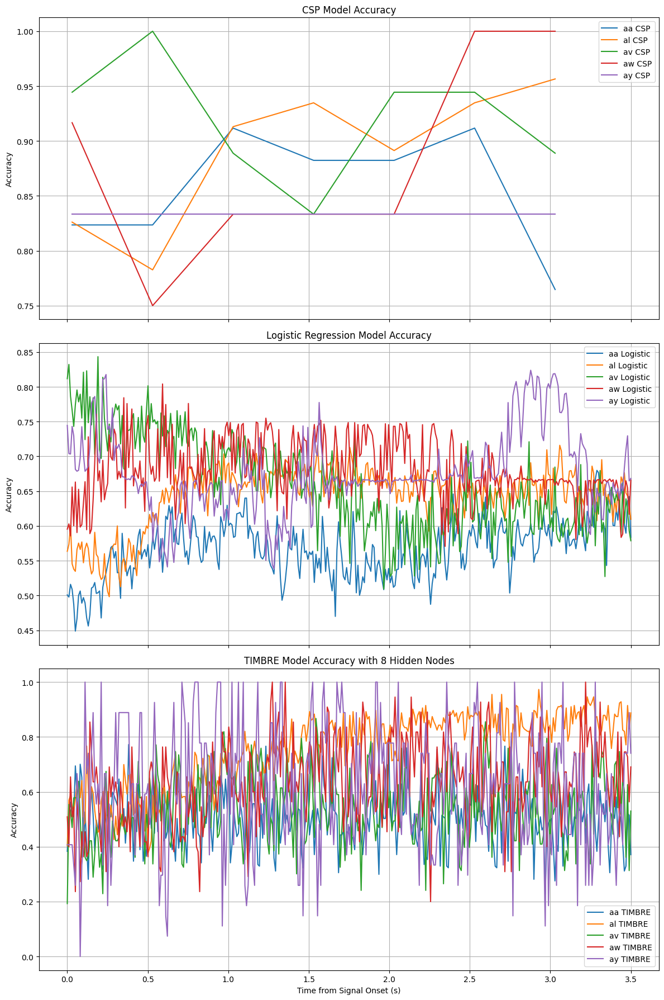

In [ ]:
fig, axs = plt.subplots(3, 1, figsize=(12, 18), sharex=True)

# Plot CSP accuracies
axs[0].plot(times, aaCSP, label='aa CSP')
axs[0].plot(times, alCSP, label='al CSP')
axs[0].plot(times, avCSP, label='av CSP')
axs[0].plot(times, awCSP, label='aw CSP')
axs[0].plot(times, ayCSP, label='ay CSP')
axs[0].set_title('CSP Model Accuracy')
axs[0].set_ylabel('Accuracy')
axs[0].legend()
axs[0].grid(True)

# Plot Logistic Regression accuracies
axs[1].plot(time, aaLogistic, label='aa Logistic')
axs[1].plot(time, alLogistic, label='al Logistic')
axs[1].plot(time, avLogistic, label='av Logistic')
axs[1].plot(time, awLogistic, label='aw Logistic')
axs[1].plot(time, ayLogistic, label='ay Logistic')
axs[1].set_title('Logistic Regression Model Accuracy')
axs[1].set_ylabel('Accuracy')
axs[1].legend()
axs[1].grid(True)

# Plot TIMBRE accuracies
axs[2].plot(time_points, aaTIMBRE, label=f'aa TIMBRE')
axs[2].plot(time_points, alTIMBRE, label=f'al TIMBRE')
axs[2].plot(time_points, avTIMBRE, label=f'av TIMBRE')
axs[2].plot(time_points, awTIMBRE, label=f'aw TIMBRE')
axs[2].plot(time_points, ayTIMBRE, label=f'ay TIMBRE')
axs[2].set_title(f'TIMBRE Model Accuracy with {hn} Hidden Nodes')
axs[2].set_xlabel('Time from Signal Onset (s)')
axs[2].set_ylabel('Accuracy')
axs[2].legend()
axs[2].grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()